In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
import os
import seaborn as sns
import tensorflow as tf
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

from keras.models import Sequential, Model
from keras.layers import Dense, Flatten, Conv2D, Reshape, Input, Conv2DTranspose
from keras.layers import Activation, LeakyReLU, BatchNormalization, Dropout, Resizing
from keras.losses import BinaryCrossentropy
from tensorflow.keras.applications import VGG16

import warnings
warnings.filterwarnings('ignore')

try:
    from tensorflow.keras.optimizers import Adam
except:
    from keras.optimizers import Adam

In [ ]:
NOISE_DIM = 100
BATCH_SIZE = 4
STEPS_PER_EPOCH = 3750
EPOCHS = 10
SEED = 40
WIDTH, HEIGHT, CHANNELS = 128, 128, 1

OPTIMIZER = Adam(0.0002, 0.5)

In [ ]:
import os
os.chdir('/content/drive/My Drive')

MAIN_DIR = "/content/drive/My Drive/yes"

In [ ]:
def load_images(folder):

    imgs = []
    target = 1
    labels = []
    for i in os.listdir(folder):
        img_dir = os.path.join(folder,i)
        try:
            img = cv2.imread(img_dir)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = cv2.resize(img, (128,128))
            imgs.append(img)
            labels.append(target)
        except:
            continue

    imgs = np.array(imgs)
    labels = np.array(labels)

    return imgs, labels

In [ ]:
data, labels = load_images(MAIN_DIR)
data.shape, labels.shape

((155, 128, 128), (155,))

In [ ]:
np.random.seed(SEED)
idxs = np.random.randint(0, 155, 20)
X_train = data[idxs]
X_train.shape

(20, 128, 128)

In [ ]:
# Normalize the Images
X_train = (X_train.astype(np.float32) - 127.5) / 127.5

# Reshape images
X_train = X_train.reshape(-1, WIDTH,HEIGHT,CHANNELS)

# Check shape
X_train.shape

(20, 128, 128, 1)

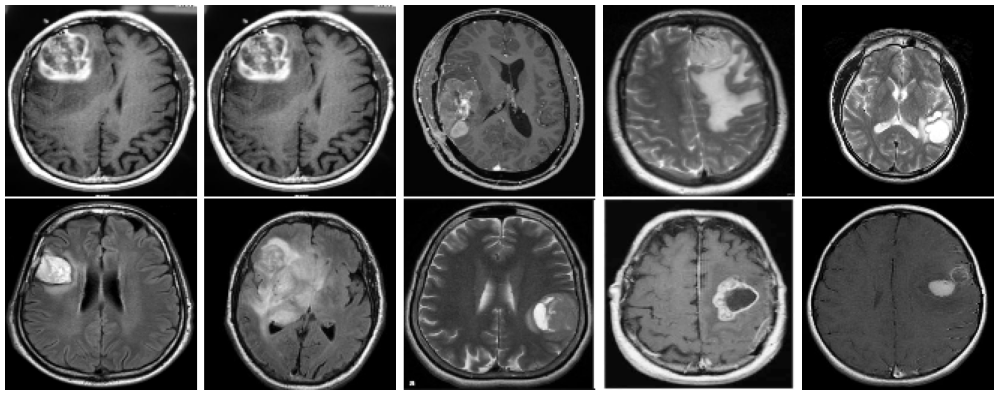

In [ ]:
plt.figure(figsize=(20,8))
for i in range(10):
    axs = plt.subplot(2,5,i+1)
    plt.imshow(X_train[i], cmap="gray")
    plt.axis('off')
    axs.set_xticklabels([])
    axs.set_yticklabels([])
    plt.subplots_adjust(wspace=None, hspace=None)
plt.tight_layout()


In [ ]:
def build_generator():

    """
        Generator model "generates" images using random noise. The random noise AKA Latent Vector
        is sampled from a Normal Distribution which is given as the input to the Generator. Using
        Transposed Convolution, the latent vector is transformed to produce an image
        We use 3 Conv2DTranspose layers (which help in producing an image using features; opposite
        of Convolutional Learning)

        Input: Random Noise / Latent Vector
        Output: Image
    """

    model = Sequential([

        Dense(32*32*256, input_dim=NOISE_DIM),
        LeakyReLU(alpha=0.2),
        Reshape((32,32,256)),

        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh')
    ],
    name="generator")
    model.summary()
    model.compile(loss="binary_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002))

    return model

In [ ]:
def build_discriminator():

    """
        Discriminator is the model which is responsible for classifying the generated images
        as fake or real. Our end goal is to create a Generator so powerful that the Discriminator
        is unable to classify real and fake images
        A simple Convolutional Neural Network with 2 Conv2D layers connected to a Dense output layer
        Output layer activation is Sigmoid since this is a Binary Classifier

        Input: Generated / Real Image
        Output: Validity of Image (Fake or Real)

    """

    model = Sequential([

        Conv2D(64, (3, 3), padding='same', input_shape=(WIDTH, HEIGHT, CHANNELS)),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(256, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Flatten(),
        Dropout(0.4),
        Dense(1, activation="sigmoid", input_shape=(WIDTH, HEIGHT, CHANNELS))
    ], name="discriminator")
    model.summary()
    model.compile(loss="binary_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002))

    return model

In [ ]:
print('\n')
discriminator = build_discriminator()
print('\n')
generator = build_generator()

discriminator.trainable = False

gan_input = Input(shape=(NOISE_DIM,))
fake_image = generator(gan_input)

gan_output = discriminator(fake_image)

gan = Model(gan_input, gan_output, name="gan_model")
gan.compile(loss="binary_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002))

print("The Combined Network:\n")
gan.summary()



Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_67 (Conv2D)          (None, 128, 128, 64)      640       
                                                                 
 leaky_re_lu_101 (LeakyReLU  (None, 128, 128, 64)      0         
 )                                                               
                                                                 
 conv2d_68 (Conv2D)          (None, 64, 64, 128)       73856     
                                                                 
 leaky_re_lu_102 (LeakyReLU  (None, 64, 64, 128)       0         
 )                                                               
                                                                 
 conv2d_69 (Conv2D)          (None, 32, 32, 128)       147584    
                                                                 
 leaky_re_lu_103 (LeakyReLU  (None, 32, 32, 128)   

In [ ]:
def sample_images(noise, subplots, figsize=(22,8), save=False):
    generated_images = generator.predict(noise)
    plt.figure(figsize=figsize)

    for i, image in enumerate(generated_images):
        plt.subplot(subplots[0], subplots[1], i+1)
        if CHANNELS == 1:
            plt.imshow(image.reshape((WIDTH, HEIGHT)), cmap='gray')

        else:
            plt.imshow(image.reshape((WIDTH, HEIGHT, CHANNELS)))
        if save == True:
            img_name = "gen" + str(i)
            plt.savefig(img_name)
        plt.subplots_adjust(wspace=None, hspace=None)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

  0%|          | 0/3750 [00:00<?, ?it/s]

1/1 [==============================] - 0s 138ms/step


  0%|          | 1/3750 [00:05<6:09:17,  5.91s/it]

1/1 [==============================] - 0s 17ms/step


  0%|          | 2/3750 [00:06<2:36:30,  2.51s/it]

1/1 [==============================] - 0s 18ms/step


  0%|          | 3/3750 [00:06<1:28:24,  1.42s/it]

1/1 [==============================] - 0s 20ms/step


  0%|          | 4/3750 [00:06<56:33,  1.10it/s]  

1/1 [==============================] - 0s 18ms/step


  0%|          | 5/3750 [00:06<38:54,  1.60it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 6/3750 [00:06<28:16,  2.21it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 7/3750 [00:06<21:26,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 8/3750 [00:06<17:02,  3.66it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 9/3750 [00:06<14:16,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 10/3750 [00:07<12:07,  5.14it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 11/3750 [00:07<10:53,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 12/3750 [00:07<09:49,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 13/3750 [00:07<09:13,  6.75it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 14/3750 [00:07<08:48,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 15/3750 [00:07<08:32,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 16/3750 [00:07<08:25,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 17/3750 [00:07<08:15,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 18/3750 [00:08<08:09,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 19/3750 [00:08<08:03,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 20/3750 [00:08<07:48,  7.95it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 21/3750 [00:08<07:38,  8.14it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 22/3750 [00:08<07:49,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 23/3750 [00:08<07:51,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 24/3750 [00:08<07:51,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 25/3750 [00:08<07:39,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 26/3750 [00:09<07:36,  8.17it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 27/3750 [00:09<07:44,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 28/3750 [00:09<07:36,  8.16it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 29/3750 [00:09<07:41,  8.07it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 30/3750 [00:09<07:50,  7.90it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 31/3750 [00:09<08:08,  7.61it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 32/3750 [00:09<08:28,  7.32it/s]

1/1 [==============================] - 0s 76ms/step


  1%|          | 33/3750 [00:10<12:03,  5.14it/s]

1/1 [==============================] - 0s 98ms/step


  1%|          | 34/3750 [00:10<15:10,  4.08it/s]

1/1 [==============================] - 0s 71ms/step


  1%|          | 35/3750 [00:10<17:15,  3.59it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 36/3750 [00:10<14:31,  4.26it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 37/3750 [00:11<12:29,  4.96it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 38/3750 [00:11<11:29,  5.39it/s]

1/1 [==============================] - 0s 74ms/step


  1%|          | 39/3750 [00:11<15:10,  4.07it/s]

1/1 [==============================] - 0s 39ms/step


  1%|          | 40/3750 [00:11<16:04,  3.85it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 41/3750 [00:12<14:46,  4.19it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 42/3750 [00:12<12:43,  4.86it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 43/3750 [00:12<11:14,  5.50it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 44/3750 [00:12<12:06,  5.10it/s]

1/1 [==============================] - 0s 144ms/step


  1%|          | 45/3750 [00:13<18:15,  3.38it/s]

1/1 [==============================] - 0s 109ms/step


  1%|          | 46/3750 [00:13<20:18,  3.04it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 47/3750 [00:13<17:53,  3.45it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 48/3750 [00:13<15:44,  3.92it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 49/3750 [00:14<14:23,  4.29it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 50/3750 [00:14<13:43,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 51/3750 [00:14<13:14,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 52/3750 [00:14<12:23,  4.98it/s]

1/1 [==============================] - 0s 32ms/step


  1%|▏         | 53/3750 [00:14<12:15,  5.03it/s]

1/1 [==============================] - 0s 30ms/step


  1%|▏         | 54/3750 [00:15<11:44,  5.25it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 55/3750 [00:15<12:12,  5.05it/s]

1/1 [==============================] - 0s 30ms/step


  1%|▏         | 56/3750 [00:15<12:17,  5.01it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 57/3750 [00:15<12:13,  5.03it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 58/3750 [00:15<11:17,  5.45it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 59/3750 [00:15<10:29,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 60/3750 [00:16<09:54,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 61/3750 [00:16<09:25,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 62/3750 [00:16<09:01,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 63/3750 [00:16<09:19,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 64/3750 [00:16<09:04,  6.77it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 65/3750 [00:16<08:39,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 66/3750 [00:16<08:20,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 67/3750 [00:17<08:03,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 68/3750 [00:17<08:42,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 69/3750 [00:17<08:34,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 70/3750 [00:17<08:28,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 71/3750 [00:17<08:21,  7.34it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 72/3750 [00:17<08:05,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 73/3750 [00:17<08:02,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 74/3750 [00:17<07:46,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 75/3750 [00:18<07:35,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 76/3750 [00:18<07:52,  7.78it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 77/3750 [00:18<07:41,  7.97it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 78/3750 [00:18<07:31,  8.12it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 79/3750 [00:18<07:24,  8.26it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 80/3750 [00:18<07:26,  8.21it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 81/3750 [00:18<07:31,  8.13it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 82/3750 [00:18<07:24,  8.25it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 83/3750 [00:19<07:19,  8.34it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 84/3750 [00:19<07:19,  8.35it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 85/3750 [00:19<07:33,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 86/3750 [00:19<07:42,  7.92it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 87/3750 [00:19<07:25,  8.23it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 88/3750 [00:19<07:15,  8.41it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 89/3750 [00:19<07:15,  8.41it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 90/3750 [00:19<07:14,  8.42it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 91/3750 [00:20<07:27,  8.17it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 92/3750 [00:20<07:23,  8.25it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 93/3750 [00:20<07:25,  8.21it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 94/3750 [00:20<07:19,  8.33it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 95/3750 [00:20<07:11,  8.48it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 96/3750 [00:20<07:08,  8.52it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 97/3750 [00:20<07:03,  8.62it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 98/3750 [00:20<07:21,  8.26it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 99/3750 [00:20<07:13,  8.42it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 100/3750 [00:21<07:48,  7.80it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 101/3750 [00:21<07:32,  8.06it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 102/3750 [00:21<07:43,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 103/3750 [00:21<07:30,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 104/3750 [00:21<07:20,  8.28it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 105/3750 [00:21<07:16,  8.35it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 106/3750 [00:21<07:11,  8.45it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 107/3750 [00:21<07:15,  8.37it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 108/3750 [00:22<07:12,  8.42it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 109/3750 [00:22<07:07,  8.51it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 110/3750 [00:22<07:15,  8.36it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 111/3750 [00:22<07:12,  8.41it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 112/3750 [00:22<07:23,  8.19it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 113/3750 [00:22<07:29,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 114/3750 [00:22<07:19,  8.28it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 115/3750 [00:22<07:12,  8.41it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 116/3750 [00:23<07:12,  8.40it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 117/3750 [00:23<07:21,  8.24it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 118/3750 [00:23<07:13,  8.37it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 119/3750 [00:23<07:29,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 120/3750 [00:23<07:16,  8.31it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 121/3750 [00:23<07:18,  8.27it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 122/3750 [00:23<07:10,  8.43it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 123/3750 [00:23<07:04,  8.55it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 124/3750 [00:23<06:59,  8.65it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 125/3750 [00:24<07:15,  8.33it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 126/3750 [00:24<07:20,  8.22it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 127/3750 [00:24<07:22,  8.19it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 128/3750 [00:24<07:12,  8.38it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 129/3750 [00:24<07:19,  8.25it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 130/3750 [00:24<07:12,  8.37it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 131/3750 [00:24<07:56,  7.59it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 132/3750 [00:25<08:25,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 133/3750 [00:25<07:56,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 134/3750 [00:25<07:56,  7.59it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 135/3750 [00:25<07:44,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 136/3750 [00:25<07:27,  8.08it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 137/3750 [00:25<07:59,  7.54it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 138/3750 [00:25<09:01,  6.67it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 139/3750 [00:26<09:09,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 140/3750 [00:26<09:47,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 141/3750 [00:26<10:08,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 142/3750 [00:26<10:30,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 143/3750 [00:26<11:01,  5.46it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 144/3750 [00:26<10:45,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 145/3750 [00:27<10:21,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 146/3750 [00:27<10:32,  5.69it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 147/3750 [00:27<11:34,  5.19it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 148/3750 [00:27<11:29,  5.22it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 149/3750 [00:27<11:40,  5.14it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 150/3750 [00:28<11:20,  5.29it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 151/3750 [00:28<11:00,  5.45it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 152/3750 [00:28<10:20,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 153/3750 [00:28<09:42,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 154/3750 [00:28<09:01,  6.64it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 155/3750 [00:28<08:35,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 156/3750 [00:28<08:13,  7.29it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 157/3750 [00:29<08:06,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 158/3750 [00:29<07:50,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 159/3750 [00:29<07:37,  7.86it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 160/3750 [00:29<07:24,  8.07it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 161/3750 [00:29<08:07,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 162/3750 [00:29<07:46,  7.69it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 163/3750 [00:29<07:34,  7.89it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 164/3750 [00:29<07:34,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 165/3750 [00:30<07:24,  8.06it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 166/3750 [00:30<07:30,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 167/3750 [00:30<07:18,  8.17it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 168/3750 [00:30<07:12,  8.28it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 169/3750 [00:30<07:15,  8.22it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 170/3750 [00:30<07:31,  7.92it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 171/3750 [00:30<07:28,  7.98it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 172/3750 [00:30<07:17,  8.18it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 173/3750 [00:31<07:06,  8.39it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 174/3750 [00:31<07:02,  8.46it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 175/3750 [00:31<06:56,  8.59it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 176/3750 [00:31<06:52,  8.66it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 177/3750 [00:31<06:53,  8.64it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 178/3750 [00:31<07:12,  8.27it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 179/3750 [00:31<07:23,  8.06it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 180/3750 [00:31<07:16,  8.18it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 181/3750 [00:31<07:17,  8.15it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 182/3750 [00:32<07:04,  8.40it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 183/3750 [00:32<07:10,  8.28it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 184/3750 [00:32<07:01,  8.46it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 185/3750 [00:32<06:56,  8.56it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 186/3750 [00:32<07:07,  8.35it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 187/3750 [00:32<06:58,  8.51it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 188/3750 [00:32<07:02,  8.43it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 189/3750 [00:32<07:04,  8.39it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 190/3750 [00:33<07:14,  8.20it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 191/3750 [00:33<07:09,  8.29it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 192/3750 [00:33<07:02,  8.42it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 193/3750 [00:33<07:10,  8.26it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 194/3750 [00:33<07:04,  8.39it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 195/3750 [00:33<07:11,  8.24it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 196/3750 [00:33<07:09,  8.27it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 197/3750 [00:33<07:17,  8.12it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 198/3750 [00:34<07:22,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 199/3750 [00:34<07:19,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 200/3750 [00:34<07:16,  8.14it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 201/3750 [00:34<07:10,  8.24it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 202/3750 [00:34<07:04,  8.35it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 203/3750 [00:34<07:08,  8.28it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 204/3750 [00:34<07:10,  8.24it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 205/3750 [00:34<07:08,  8.27it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 206/3750 [00:34<07:14,  8.15it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 207/3750 [00:35<07:23,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 208/3750 [00:35<07:24,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 209/3750 [00:35<07:29,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 210/3750 [00:35<07:18,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 211/3750 [00:35<07:13,  8.16it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 212/3750 [00:35<07:06,  8.30it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 213/3750 [00:35<06:59,  8.43it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 214/3750 [00:35<06:58,  8.45it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 215/3750 [00:36<07:20,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 216/3750 [00:36<07:15,  8.12it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 217/3750 [00:36<07:23,  7.96it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 218/3750 [00:36<07:29,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 219/3750 [00:36<07:18,  8.06it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 220/3750 [00:36<07:15,  8.10it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 221/3750 [00:36<07:20,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 222/3750 [00:36<07:14,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 223/3750 [00:37<07:22,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 224/3750 [00:37<07:21,  7.98it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 225/3750 [00:37<07:13,  8.13it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 226/3750 [00:37<07:09,  8.20it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 227/3750 [00:37<07:20,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 228/3750 [00:37<07:27,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 229/3750 [00:37<07:15,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 230/3750 [00:37<07:19,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 231/3750 [00:38<07:27,  7.86it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 232/3750 [00:38<07:35,  7.72it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 233/3750 [00:38<08:03,  7.28it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 234/3750 [00:38<09:15,  6.33it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▋         | 235/3750 [00:38<10:06,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 236/3750 [00:39<10:39,  5.50it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 237/3750 [00:39<10:58,  5.34it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 238/3750 [00:39<10:35,  5.52it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 239/3750 [00:39<10:52,  5.38it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 240/3750 [00:39<11:13,  5.21it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▋         | 241/3750 [00:39<11:35,  5.05it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▋         | 242/3750 [00:40<11:58,  4.88it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 243/3750 [00:40<12:00,  4.87it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 244/3750 [00:40<11:33,  5.06it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 245/3750 [00:40<11:38,  5.02it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 246/3750 [00:40<11:21,  5.14it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 247/3750 [00:41<10:28,  5.57it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 248/3750 [00:41<09:41,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 249/3750 [00:41<09:01,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 250/3750 [00:41<08:31,  6.85it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 251/3750 [00:41<08:18,  7.01it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 252/3750 [00:41<07:59,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 253/3750 [00:41<08:32,  6.82it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 254/3750 [00:42<08:11,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 255/3750 [00:42<07:55,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 256/3750 [00:42<07:47,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 257/3750 [00:42<07:47,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 258/3750 [00:42<07:36,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 259/3750 [00:42<07:29,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 260/3750 [00:42<07:53,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 261/3750 [00:42<07:53,  7.37it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 262/3750 [00:43<07:50,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 263/3750 [00:43<07:52,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 264/3750 [00:43<07:43,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 265/3750 [00:43<07:36,  7.63it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 266/3750 [00:43<07:29,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 267/3750 [00:43<07:23,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 268/3750 [00:43<07:31,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 269/3750 [00:44<07:31,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 270/3750 [00:44<07:22,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 271/3750 [00:44<07:16,  7.97it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 272/3750 [00:44<07:21,  7.88it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 273/3750 [00:44<07:25,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 274/3750 [00:44<07:19,  7.90it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 275/3750 [00:44<07:11,  8.06it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 276/3750 [00:44<07:43,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 277/3750 [00:45<07:25,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 278/3750 [00:45<07:24,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 279/3750 [00:45<07:27,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 280/3750 [00:45<07:21,  7.86it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 281/3750 [00:45<07:16,  7.95it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 282/3750 [00:45<07:11,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 283/3750 [00:45<07:14,  7.97it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 284/3750 [00:45<07:19,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 285/3750 [00:46<07:20,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 286/3750 [00:46<07:21,  7.84it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 287/3750 [00:46<07:31,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 288/3750 [00:46<07:28,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 289/3750 [00:46<07:15,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 290/3750 [00:46<07:16,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 291/3750 [00:46<07:17,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 292/3750 [00:46<07:28,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 293/3750 [00:47<07:26,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 294/3750 [00:47<07:16,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 295/3750 [00:47<07:18,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 296/3750 [00:47<07:29,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 297/3750 [00:47<07:26,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 298/3750 [00:47<07:20,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 299/3750 [00:47<07:09,  8.03it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 300/3750 [00:47<07:26,  7.72it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 301/3750 [00:48<07:20,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 302/3750 [00:48<07:22,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 303/3750 [00:48<07:22,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 304/3750 [00:48<07:22,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 305/3750 [00:48<07:32,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 306/3750 [00:48<07:23,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 307/3750 [00:48<07:20,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 308/3750 [00:49<07:32,  7.61it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 309/3750 [00:49<07:38,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 310/3750 [00:49<07:32,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 311/3750 [00:49<07:21,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 312/3750 [00:49<07:11,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 313/3750 [00:49<07:09,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 314/3750 [00:49<07:07,  8.04it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 315/3750 [00:49<07:03,  8.10it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 316/3750 [00:50<07:13,  7.93it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 317/3750 [00:50<07:10,  7.97it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 318/3750 [00:50<07:11,  7.95it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 319/3750 [00:50<07:21,  7.76it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 320/3750 [00:50<07:21,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 321/3750 [00:50<07:11,  7.94it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 322/3750 [00:50<07:06,  8.03it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 323/3750 [00:50<07:12,  7.93it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 324/3750 [00:51<08:19,  6.86it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 325/3750 [00:51<09:00,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 326/3750 [00:51<09:03,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 327/3750 [00:51<09:15,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 328/3750 [00:51<09:51,  5.78it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 329/3750 [00:52<10:10,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 330/3750 [00:52<09:53,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 331/3750 [00:52<10:04,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 332/3750 [00:52<10:28,  5.44it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 333/3750 [00:52<10:06,  5.64it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 334/3750 [00:52<10:23,  5.48it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 335/3750 [00:53<10:06,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 336/3750 [00:53<10:15,  5.54it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 337/3750 [00:53<10:27,  5.44it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 338/3750 [00:53<10:44,  5.29it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 339/3750 [00:53<09:48,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 340/3750 [00:53<08:59,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 341/3750 [00:54<08:29,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 342/3750 [00:54<08:16,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 343/3750 [00:54<07:51,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 344/3750 [00:54<07:34,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 345/3750 [00:54<07:32,  7.53it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 346/3750 [00:54<07:30,  7.56it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 347/3750 [00:54<07:15,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 348/3750 [00:54<07:14,  7.83it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 349/3750 [00:55<07:02,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 350/3750 [00:55<07:53,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 351/3750 [00:55<07:31,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 352/3750 [00:55<07:15,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 353/3750 [00:55<07:04,  8.01it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 354/3750 [00:55<07:05,  7.97it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 355/3750 [00:55<06:56,  8.15it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 356/3750 [00:55<06:48,  8.30it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 357/3750 [00:56<06:53,  8.20it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 358/3750 [00:56<06:56,  8.14it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 359/3750 [00:56<07:06,  7.95it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 360/3750 [00:56<07:07,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 361/3750 [00:56<07:13,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 362/3750 [00:56<07:16,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 363/3750 [00:56<07:08,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 364/3750 [00:56<07:10,  7.87it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 365/3750 [00:57<06:58,  8.09it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 366/3750 [00:57<06:48,  8.28it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 367/3750 [00:57<07:02,  8.01it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 368/3750 [00:57<07:09,  7.87it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 369/3750 [00:57<07:11,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 370/3750 [00:57<07:11,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 371/3750 [00:57<06:58,  8.07it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 372/3750 [00:57<06:49,  8.26it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 373/3750 [00:58<06:45,  8.33it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 374/3750 [00:58<06:49,  8.24it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 375/3750 [00:58<06:49,  8.23it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 376/3750 [00:58<06:50,  8.22it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 377/3750 [00:58<07:00,  8.02it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 378/3750 [00:58<06:52,  8.17it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 379/3750 [00:58<06:56,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 380/3750 [00:58<06:52,  8.18it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 381/3750 [00:59<06:56,  8.09it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 382/3750 [00:59<06:51,  8.18it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 383/3750 [00:59<06:55,  8.11it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 384/3750 [00:59<06:56,  8.08it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 385/3750 [00:59<07:29,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 386/3750 [00:59<07:24,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 387/3750 [00:59<07:08,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 388/3750 [00:59<06:55,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 389/3750 [01:00<06:59,  8.01it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 390/3750 [01:00<06:49,  8.20it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 391/3750 [01:00<06:55,  8.09it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 392/3750 [01:00<07:08,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 393/3750 [01:00<07:06,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 394/3750 [01:00<06:58,  8.02it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 395/3750 [01:00<07:07,  7.85it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 396/3750 [01:00<07:12,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 397/3750 [01:01<07:11,  7.78it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 398/3750 [01:01<07:09,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 399/3750 [01:01<06:59,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 400/3750 [01:01<07:13,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 401/3750 [01:01<08:02,  6.94it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 402/3750 [01:01<08:30,  6.56it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 403/3750 [01:01<09:05,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 404/3750 [01:02<09:11,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 405/3750 [01:02<09:40,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 406/3750 [01:02<10:08,  5.50it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 407/3750 [01:02<09:39,  5.77it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 408/3750 [01:02<09:43,  5.73it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 409/3750 [01:03<09:57,  5.59it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 410/3750 [01:03<09:45,  5.71it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 411/3750 [01:03<10:02,  5.55it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 412/3750 [01:03<09:47,  5.68it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█         | 413/3750 [01:03<10:16,  5.42it/s]

1/1 [==============================] - 0s 47ms/step


 11%|█         | 414/3750 [01:04<11:03,  5.03it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█         | 415/3750 [01:04<11:31,  4.82it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█         | 416/3750 [01:04<11:25,  4.86it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 417/3750 [01:04<11:09,  4.98it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 418/3750 [01:04<11:10,  4.97it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 419/3750 [01:05<11:08,  4.98it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 420/3750 [01:05<10:59,  5.05it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 421/3750 [01:05<10:54,  5.09it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█▏        | 422/3750 [01:05<11:07,  4.98it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 423/3750 [01:05<10:59,  5.04it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 424/3750 [01:06<10:54,  5.08it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 425/3750 [01:06<10:50,  5.11it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 426/3750 [01:06<11:30,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 427/3750 [01:06<11:43,  4.72it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 428/3750 [01:06<10:57,  5.05it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 429/3750 [01:07<10:08,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 430/3750 [01:07<09:15,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 431/3750 [01:07<09:19,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 432/3750 [01:07<08:43,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 433/3750 [01:07<08:16,  6.69it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 434/3750 [01:07<08:12,  6.74it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 435/3750 [01:07<07:51,  7.04it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 436/3750 [01:07<07:35,  7.27it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 437/3750 [01:08<07:23,  7.47it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 438/3750 [01:08<07:11,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 439/3750 [01:08<06:58,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 440/3750 [01:08<07:52,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 441/3750 [01:08<07:37,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 442/3750 [01:08<07:29,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 443/3750 [01:08<07:13,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 444/3750 [01:09<07:09,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 445/3750 [01:09<06:58,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 446/3750 [01:09<06:58,  7.90it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 447/3750 [01:09<06:48,  8.08it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 448/3750 [01:09<06:52,  8.00it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 449/3750 [01:09<06:51,  8.02it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 450/3750 [01:09<07:32,  7.30it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 451/3750 [01:09<07:07,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 452/3750 [01:10<07:09,  7.68it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 453/3750 [01:10<07:03,  7.79it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 454/3750 [01:10<06:58,  7.88it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 455/3750 [01:10<06:47,  8.09it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 456/3750 [01:10<06:39,  8.25it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 457/3750 [01:10<06:40,  8.23it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 458/3750 [01:10<06:55,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 459/3750 [01:10<06:57,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 460/3750 [01:11<06:55,  7.91it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 461/3750 [01:11<06:46,  8.10it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 462/3750 [01:11<06:38,  8.25it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 463/3750 [01:11<06:31,  8.40it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 464/3750 [01:11<06:35,  8.31it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 465/3750 [01:11<06:44,  8.12it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 466/3750 [01:11<07:02,  7.76it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 467/3750 [01:11<07:07,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 468/3750 [01:12<06:52,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 469/3750 [01:12<06:45,  8.08it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 470/3750 [01:12<06:42,  8.14it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 471/3750 [01:12<06:45,  8.08it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 472/3750 [01:12<06:49,  8.00it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 473/3750 [01:12<06:54,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 474/3750 [01:12<06:49,  8.00it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 475/3750 [01:12<06:46,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 476/3750 [01:13<06:46,  8.05it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 477/3750 [01:13<06:43,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 478/3750 [01:13<06:41,  8.14it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 479/3750 [01:13<06:47,  8.03it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 480/3750 [01:13<06:52,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 481/3750 [01:13<06:55,  7.87it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 482/3750 [01:13<07:28,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 483/3750 [01:13<07:17,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 484/3750 [01:14<07:02,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 485/3750 [01:14<07:06,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 486/3750 [01:14<07:02,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 487/3750 [01:14<06:47,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 488/3750 [01:14<06:42,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 489/3750 [01:14<06:44,  8.07it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 490/3750 [01:14<07:15,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 491/3750 [01:14<07:03,  7.69it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 492/3750 [01:15<06:58,  7.78it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 493/3750 [01:15<06:55,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 494/3750 [01:15<07:01,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 495/3750 [01:15<07:00,  7.74it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 496/3750 [01:15<06:58,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 497/3750 [01:15<06:55,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 498/3750 [01:15<07:37,  7.11it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█▎        | 499/3750 [01:16<10:58,  4.94it/s]

1/1 [==============================] - 0s 56ms/step


 13%|█▎        | 500/3750 [01:16<12:16,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 501/3750 [01:16<11:22,  4.76it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 502/3750 [01:16<10:34,  5.12it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 503/3750 [01:17<10:48,  5.01it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 504/3750 [01:17<10:38,  5.09it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 505/3750 [01:17<10:03,  5.38it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 506/3750 [01:17<09:46,  5.53it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 507/3750 [01:17<09:23,  5.75it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 508/3750 [01:17<09:16,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 509/3750 [01:18<09:00,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 510/3750 [01:18<09:20,  5.78it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 511/3750 [01:18<09:38,  5.60it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 512/3750 [01:18<09:38,  5.60it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 513/3750 [01:18<09:37,  5.60it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 514/3750 [01:18<09:31,  5.66it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 515/3750 [01:19<09:52,  5.46it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 516/3750 [01:19<09:57,  5.41it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 517/3750 [01:19<09:41,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 518/3750 [01:19<08:56,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 519/3750 [01:19<08:25,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 520/3750 [01:19<08:03,  6.68it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 521/3750 [01:20<07:57,  6.77it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 522/3750 [01:20<07:40,  7.01it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 523/3750 [01:20<07:20,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 524/3750 [01:20<07:04,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 525/3750 [01:20<07:01,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 526/3750 [01:20<06:53,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 527/3750 [01:20<06:45,  7.94it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 528/3750 [01:20<06:40,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 529/3750 [01:21<06:44,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 530/3750 [01:21<06:49,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 531/3750 [01:21<07:16,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 532/3750 [01:21<06:58,  7.68it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 533/3750 [01:21<06:44,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 534/3750 [01:21<07:27,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 535/3750 [01:21<07:05,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 536/3750 [01:22<07:33,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 537/3750 [01:22<07:12,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 538/3750 [01:22<06:56,  7.71it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 539/3750 [01:22<07:04,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 540/3750 [01:22<07:31,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 541/3750 [01:22<07:09,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 542/3750 [01:22<06:55,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 543/3750 [01:22<06:54,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 544/3750 [01:23<06:46,  7.88it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 545/3750 [01:23<06:48,  7.85it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 546/3750 [01:23<06:56,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 547/3750 [01:23<06:53,  7.75it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 548/3750 [01:23<07:01,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 549/3750 [01:23<07:11,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 550/3750 [01:23<07:01,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 551/3750 [01:23<06:58,  7.64it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 552/3750 [01:24<07:07,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 553/3750 [01:24<07:03,  7.54it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 554/3750 [01:24<07:01,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 555/3750 [01:24<07:04,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 556/3750 [01:24<06:54,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 557/3750 [01:24<06:54,  7.70it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 558/3750 [01:24<06:47,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 559/3750 [01:25<06:39,  8.00it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 560/3750 [01:25<07:30,  7.09it/s]

1/1 [==============================] - 0s 93ms/step


 15%|█▍        | 561/3750 [01:25<12:04,  4.40it/s]

1/1 [==============================] - 0s 67ms/step


 15%|█▍        | 562/3750 [01:25<13:35,  3.91it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 563/3750 [01:26<11:30,  4.62it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 564/3750 [01:26<10:18,  5.15it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 565/3750 [01:26<09:04,  5.85it/s]

1/1 [==============================] - 0s 89ms/step


 15%|█▌        | 566/3750 [01:26<11:24,  4.65it/s]

1/1 [==============================] - 0s 98ms/step


 15%|█▌        | 567/3750 [01:26<13:28,  3.93it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 568/3750 [01:27<12:26,  4.26it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 569/3750 [01:27<10:42,  4.95it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 570/3750 [01:27<09:27,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 571/3750 [01:27<08:43,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 572/3750 [01:27<08:01,  6.60it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 573/3750 [01:27<07:31,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 574/3750 [01:27<07:14,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 575/3750 [01:28<07:03,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 576/3750 [01:28<06:49,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 577/3750 [01:28<06:51,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 578/3750 [01:28<06:52,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 579/3750 [01:28<06:40,  7.91it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 580/3750 [01:28<06:41,  7.89it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 581/3750 [01:28<06:42,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 582/3750 [01:28<06:35,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 583/3750 [01:29<06:38,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 584/3750 [01:29<06:45,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 585/3750 [01:29<06:49,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 586/3750 [01:29<06:42,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 587/3750 [01:29<06:42,  7.86it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 588/3750 [01:29<07:08,  7.38it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 589/3750 [01:29<07:42,  6.83it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 590/3750 [01:30<08:19,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 591/3750 [01:30<08:26,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 592/3750 [01:30<09:01,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 593/3750 [01:30<08:56,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 594/3750 [01:30<08:44,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 595/3750 [01:30<08:36,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 596/3750 [01:31<09:04,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 597/3750 [01:31<09:24,  5.59it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 598/3750 [01:31<09:39,  5.44it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 599/3750 [01:31<09:59,  5.26it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 600/3750 [01:31<09:59,  5.25it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 601/3750 [01:32<10:03,  5.22it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 602/3750 [01:32<10:14,  5.12it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 603/3750 [01:32<09:13,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 604/3750 [01:32<08:36,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 605/3750 [01:32<08:07,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 606/3750 [01:32<07:45,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 607/3750 [01:32<07:31,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 608/3750 [01:33<07:18,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 609/3750 [01:33<07:09,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 610/3750 [01:33<07:02,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 611/3750 [01:33<06:58,  7.50it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 612/3750 [01:33<06:57,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 613/3750 [01:33<07:07,  7.33it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 614/3750 [01:33<07:00,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 615/3750 [01:34<06:57,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 616/3750 [01:34<06:47,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 617/3750 [01:34<06:55,  7.54it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 618/3750 [01:34<06:59,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 619/3750 [01:34<06:58,  7.49it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 620/3750 [01:34<07:05,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 621/3750 [01:34<06:58,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 622/3750 [01:34<06:59,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 623/3750 [01:35<06:55,  7.52it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 624/3750 [01:35<06:55,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 625/3750 [01:35<06:52,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 626/3750 [01:35<06:55,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 627/3750 [01:35<06:56,  7.50it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 628/3750 [01:35<06:58,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 629/3750 [01:35<06:54,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 630/3750 [01:36<06:52,  7.56it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 631/3750 [01:36<06:51,  7.58it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 632/3750 [01:36<06:52,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 633/3750 [01:36<06:54,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 634/3750 [01:36<06:53,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 635/3750 [01:36<06:51,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 636/3750 [01:36<06:51,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 637/3750 [01:36<06:49,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 638/3750 [01:37<06:54,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 639/3750 [01:37<06:50,  7.59it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 640/3750 [01:37<06:42,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 641/3750 [01:37<06:50,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 642/3750 [01:37<06:36,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 643/3750 [01:37<06:36,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 644/3750 [01:37<06:37,  7.81it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 645/3750 [01:37<06:34,  7.88it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 646/3750 [01:38<06:33,  7.89it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 647/3750 [01:38<07:14,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 648/3750 [01:38<06:52,  7.52it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 649/3750 [01:38<06:49,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 650/3750 [01:38<06:44,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 651/3750 [01:38<07:07,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 652/3750 [01:38<06:52,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 653/3750 [01:39<06:38,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 654/3750 [01:39<06:34,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 655/3750 [01:39<06:40,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 656/3750 [01:39<06:39,  7.75it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 657/3750 [01:39<06:44,  7.65it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 658/3750 [01:39<06:35,  7.82it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 659/3750 [01:39<06:32,  7.87it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 660/3750 [01:39<06:24,  8.04it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 661/3750 [01:40<06:57,  7.40it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 662/3750 [01:40<06:49,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 663/3750 [01:40<06:43,  7.65it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 664/3750 [01:40<06:42,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 665/3750 [01:40<06:52,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 666/3750 [01:40<06:39,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 667/3750 [01:40<06:38,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 668/3750 [01:40<06:42,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 669/3750 [01:41<06:34,  7.81it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 670/3750 [01:41<06:35,  7.79it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 671/3750 [01:41<07:04,  7.25it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 672/3750 [01:41<06:46,  7.57it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 673/3750 [01:41<06:42,  7.64it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 674/3750 [01:41<06:44,  7.60it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 675/3750 [01:41<06:42,  7.64it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 676/3750 [01:42<06:43,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 677/3750 [01:42<06:42,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 678/3750 [01:42<07:15,  7.05it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 679/3750 [01:42<07:59,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 680/3750 [01:42<08:44,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 681/3750 [01:42<08:28,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 682/3750 [01:43<08:53,  5.75it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 683/3750 [01:43<08:41,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 684/3750 [01:43<08:30,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 685/3750 [01:43<08:22,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 686/3750 [01:43<08:34,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 687/3750 [01:43<09:06,  5.60it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 688/3750 [01:44<08:50,  5.77it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 689/3750 [01:44<08:46,  5.82it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 690/3750 [01:44<08:45,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 691/3750 [01:44<08:30,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 692/3750 [01:44<08:47,  5.80it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 693/3750 [01:44<08:57,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 694/3750 [01:45<08:55,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 695/3750 [01:45<08:45,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 696/3750 [01:45<08:09,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 697/3750 [01:45<07:47,  6.54it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 698/3750 [01:45<07:30,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 699/3750 [01:45<07:47,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 700/3750 [01:46<07:25,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 701/3750 [01:46<07:19,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 702/3750 [01:46<07:11,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 703/3750 [01:46<07:00,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 704/3750 [01:46<06:47,  7.48it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 705/3750 [01:46<06:34,  7.72it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 706/3750 [01:46<06:35,  7.69it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 707/3750 [01:46<06:32,  7.75it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 708/3750 [01:47<06:39,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 709/3750 [01:47<06:36,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 710/3750 [01:47<06:36,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 711/3750 [01:47<06:28,  7.82it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 712/3750 [01:47<06:21,  7.97it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 713/3750 [01:47<06:24,  7.90it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 714/3750 [01:47<06:28,  7.81it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 715/3750 [01:47<06:20,  7.99it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 716/3750 [01:48<06:20,  7.98it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 717/3750 [01:48<06:22,  7.92it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 718/3750 [01:48<06:13,  8.11it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 719/3750 [01:48<06:16,  8.06it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 720/3750 [01:48<06:10,  8.17it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 721/3750 [01:48<06:35,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 722/3750 [01:48<06:40,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 723/3750 [01:48<06:41,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 724/3750 [01:49<06:34,  7.66it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 725/3750 [01:49<06:54,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 726/3750 [01:49<07:13,  6.98it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 727/3750 [01:49<06:59,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 728/3750 [01:49<06:53,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 729/3750 [01:49<06:41,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 730/3750 [01:49<06:38,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 731/3750 [01:50<06:38,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 732/3750 [01:50<06:31,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 733/3750 [01:50<06:22,  7.89it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 734/3750 [01:50<06:57,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 735/3750 [01:50<06:42,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 736/3750 [01:50<07:09,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 737/3750 [01:50<07:45,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 738/3750 [01:51<07:56,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 739/3750 [01:51<07:30,  6.69it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 740/3750 [01:51<07:37,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 741/3750 [01:51<07:42,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 742/3750 [01:51<07:16,  6.89it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 743/3750 [01:51<06:48,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 744/3750 [01:51<06:38,  7.55it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 745/3750 [01:52<06:24,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 746/3750 [01:52<06:36,  7.57it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 747/3750 [01:52<07:31,  6.65it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 748/3750 [01:52<07:15,  6.89it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 749/3750 [01:52<06:56,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 750/3750 [01:52<06:37,  7.54it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 751/3750 [01:52<06:27,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 752/3750 [01:52<06:32,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 753/3750 [01:53<06:25,  7.77it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 754/3750 [01:53<06:14,  7.99it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 755/3750 [01:53<06:17,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 756/3750 [01:53<06:15,  7.97it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 757/3750 [01:53<06:20,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 758/3750 [01:53<06:24,  7.77it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 759/3750 [01:53<06:19,  7.87it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 760/3750 [01:53<06:21,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 761/3750 [01:54<06:17,  7.92it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 762/3750 [01:54<06:13,  8.01it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 763/3750 [01:54<06:15,  7.94it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 764/3750 [01:54<06:23,  7.79it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 765/3750 [01:54<06:14,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 766/3750 [01:54<06:11,  8.03it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 767/3750 [01:54<06:16,  7.93it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 768/3750 [01:54<06:26,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 769/3750 [01:55<06:26,  7.71it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 770/3750 [01:55<06:49,  7.28it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 771/3750 [01:55<07:39,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 772/3750 [01:55<07:59,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 773/3750 [01:55<08:55,  5.56it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 774/3750 [01:56<08:52,  5.59it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 775/3750 [01:56<08:57,  5.53it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 776/3750 [01:56<08:33,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 777/3750 [01:56<08:23,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 778/3750 [01:56<08:23,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 779/3750 [01:56<08:23,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 780/3750 [01:57<08:21,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 781/3750 [01:57<08:47,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 782/3750 [01:57<08:55,  5.54it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 783/3750 [01:57<09:19,  5.30it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 784/3750 [01:57<09:03,  5.46it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 785/3750 [01:58<08:56,  5.53it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 786/3750 [01:58<08:16,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 787/3750 [01:58<07:44,  6.38it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 788/3750 [01:58<07:19,  6.74it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 789/3750 [01:58<07:02,  7.01it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 790/3750 [01:58<06:45,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 791/3750 [01:58<06:36,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 792/3750 [01:58<06:33,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 793/3750 [01:59<06:34,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 794/3750 [01:59<06:34,  7.50it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 795/3750 [01:59<06:29,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 796/3750 [01:59<06:22,  7.73it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 797/3750 [01:59<06:21,  7.74it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 798/3750 [01:59<06:15,  7.87it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 799/3750 [01:59<06:08,  8.00it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 800/3750 [01:59<06:11,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 801/3750 [02:00<06:12,  7.92it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 802/3750 [02:00<06:25,  7.64it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 803/3750 [02:00<06:22,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 804/3750 [02:00<06:23,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 805/3750 [02:00<06:23,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 806/3750 [02:00<06:14,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 807/3750 [02:00<06:13,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 808/3750 [02:00<06:10,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 809/3750 [02:01<06:09,  7.95it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 810/3750 [02:01<06:16,  7.81it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 811/3750 [02:01<06:09,  7.96it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 812/3750 [02:01<06:03,  8.09it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 813/3750 [02:01<06:05,  8.05it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 814/3750 [02:01<05:58,  8.19it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 815/3750 [02:01<06:06,  8.01it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 816/3750 [02:01<06:07,  7.98it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 817/3750 [02:02<06:00,  8.14it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 818/3750 [02:02<06:19,  7.72it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 819/3750 [02:02<06:19,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 820/3750 [02:02<06:13,  7.86it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 821/3750 [02:02<06:13,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 822/3750 [02:02<06:06,  7.99it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 823/3750 [02:02<06:09,  7.93it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 824/3750 [02:02<06:10,  7.90it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 825/3750 [02:03<06:15,  7.79it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 826/3750 [02:03<06:23,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 827/3750 [02:03<06:21,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 828/3750 [02:03<06:18,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 829/3750 [02:03<06:08,  7.92it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 830/3750 [02:03<06:12,  7.83it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 831/3750 [02:03<06:12,  7.84it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 832/3750 [02:04<06:11,  7.85it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 833/3750 [02:04<06:19,  7.69it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 834/3750 [02:04<06:32,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 835/3750 [02:04<06:20,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 836/3750 [02:04<06:26,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 837/3750 [02:04<06:45,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 838/3750 [02:04<06:39,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 839/3750 [02:04<06:35,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 840/3750 [02:05<06:23,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 841/3750 [02:05<06:14,  7.77it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 842/3750 [02:05<06:20,  7.65it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 843/3750 [02:05<06:15,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 844/3750 [02:05<06:15,  7.73it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 845/3750 [02:05<06:55,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 846/3750 [02:05<06:45,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 847/3750 [02:06<06:35,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 848/3750 [02:06<06:29,  7.46it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 849/3750 [02:06<06:29,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 850/3750 [02:06<06:28,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 851/3750 [02:06<06:37,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 852/3750 [02:06<06:26,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 853/3750 [02:06<06:23,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 854/3750 [02:06<06:18,  7.66it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 855/3750 [02:07<06:19,  7.62it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 856/3750 [02:07<06:16,  7.68it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 857/3750 [02:07<06:19,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 858/3750 [02:07<06:16,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 859/3750 [02:07<06:43,  7.16it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 860/3750 [02:07<06:37,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 861/3750 [02:07<06:25,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 862/3750 [02:08<06:56,  6.94it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 863/3750 [02:08<08:01,  6.00it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 864/3750 [02:08<08:37,  5.57it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 865/3750 [02:08<08:46,  5.48it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 866/3750 [02:08<08:34,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 867/3750 [02:09<08:49,  5.44it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 868/3750 [02:09<08:29,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 869/3750 [02:09<08:55,  5.38it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 870/3750 [02:09<08:59,  5.34it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 871/3750 [02:09<08:56,  5.37it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 872/3750 [02:09<09:12,  5.21it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 873/3750 [02:10<09:13,  5.20it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 874/3750 [02:10<08:55,  5.37it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 875/3750 [02:10<08:50,  5.42it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 876/3750 [02:10<09:36,  4.98it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 877/3750 [02:10<09:01,  5.30it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 878/3750 [02:11<08:18,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 879/3750 [02:11<07:39,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 880/3750 [02:11<07:19,  6.54it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 881/3750 [02:11<07:10,  6.66it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 882/3750 [02:11<06:49,  7.00it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 883/3750 [02:11<06:40,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 884/3750 [02:11<06:34,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 885/3750 [02:11<06:21,  7.51it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 886/3750 [02:12<06:11,  7.71it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 887/3750 [02:12<06:13,  7.66it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 888/3750 [02:12<06:18,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 889/3750 [02:12<06:21,  7.50it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 890/3750 [02:12<06:58,  6.83it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 891/3750 [02:12<06:39,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 892/3750 [02:12<06:31,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 893/3750 [02:13<06:24,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 894/3750 [02:13<06:19,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 895/3750 [02:13<06:15,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 896/3750 [02:13<06:12,  7.66it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 897/3750 [02:13<06:11,  7.67it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 898/3750 [02:13<06:02,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 899/3750 [02:13<06:01,  7.88it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 900/3750 [02:14<10:55,  4.35it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 901/3750 [02:14<09:29,  5.00it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 902/3750 [02:14<08:38,  5.49it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 903/3750 [02:14<07:44,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 904/3750 [02:14<07:10,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 905/3750 [02:14<07:20,  6.46it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 906/3750 [02:15<06:48,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 907/3750 [02:15<06:33,  7.22it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 908/3750 [02:15<06:36,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 909/3750 [02:15<06:58,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 910/3750 [02:15<06:50,  6.92it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 911/3750 [02:15<06:36,  7.16it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 912/3750 [02:15<06:30,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 913/3750 [02:16<06:14,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 914/3750 [02:16<06:04,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 915/3750 [02:16<06:02,  7.82it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 916/3750 [02:16<05:56,  7.95it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 917/3750 [02:16<06:39,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 918/3750 [02:16<06:59,  6.74it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 919/3750 [02:16<06:46,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 920/3750 [02:17<06:28,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 921/3750 [02:17<06:28,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 922/3750 [02:17<06:30,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 923/3750 [02:17<06:24,  7.35it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 924/3750 [02:17<06:16,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 925/3750 [02:17<06:24,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 926/3750 [02:17<06:32,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 927/3750 [02:17<06:36,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 928/3750 [02:18<06:24,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 929/3750 [02:18<06:13,  7.55it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 930/3750 [02:18<06:07,  7.67it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 931/3750 [02:18<06:05,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 932/3750 [02:18<06:28,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 933/3750 [02:18<06:49,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 934/3750 [02:18<06:34,  7.14it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 935/3750 [02:19<06:32,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 936/3750 [02:19<06:27,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 937/3750 [02:19<06:23,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 938/3750 [02:19<06:12,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 939/3750 [02:19<06:09,  7.61it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 940/3750 [02:19<06:38,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 941/3750 [02:19<06:33,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 942/3750 [02:20<06:24,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 943/3750 [02:20<06:11,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 944/3750 [02:20<06:05,  7.68it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 945/3750 [02:20<06:08,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 946/3750 [02:20<06:15,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 947/3750 [02:20<06:13,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 948/3750 [02:20<06:08,  7.60it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 949/3750 [02:20<06:26,  7.25it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 950/3750 [02:21<07:18,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 951/3750 [02:21<07:18,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 952/3750 [02:21<07:24,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 953/3750 [02:21<07:45,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 954/3750 [02:21<07:50,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 955/3750 [02:22<08:19,  5.59it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 956/3750 [02:22<08:40,  5.37it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 957/3750 [02:22<08:56,  5.21it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 958/3750 [02:22<08:39,  5.37it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 959/3750 [02:22<08:55,  5.21it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 960/3750 [02:23<08:43,  5.33it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 961/3750 [02:23<08:36,  5.40it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 962/3750 [02:23<08:35,  5.41it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 963/3750 [02:23<09:01,  5.14it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 964/3750 [02:23<08:52,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 965/3750 [02:23<08:42,  5.33it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 966/3750 [02:24<08:01,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 967/3750 [02:24<07:24,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 968/3750 [02:24<06:58,  6.65it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 969/3750 [02:24<06:47,  6.83it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 970/3750 [02:24<06:31,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 971/3750 [02:24<06:40,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 972/3750 [02:24<06:39,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 973/3750 [02:25<06:39,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 974/3750 [02:25<06:22,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 975/3750 [02:25<06:16,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 976/3750 [02:25<06:07,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 977/3750 [02:25<06:04,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 978/3750 [02:25<05:58,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 979/3750 [02:25<06:07,  7.54it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 980/3750 [02:25<06:04,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 981/3750 [02:26<06:24,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 982/3750 [02:26<06:17,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 983/3750 [02:26<06:05,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 984/3750 [02:26<06:02,  7.63it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 985/3750 [02:26<05:59,  7.70it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 986/3750 [02:26<05:51,  7.87it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 987/3750 [02:26<05:51,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 988/3750 [02:27<06:06,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 989/3750 [02:27<05:58,  7.69it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 990/3750 [02:27<06:02,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 991/3750 [02:27<06:02,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 992/3750 [02:27<06:29,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 993/3750 [02:27<06:19,  7.27it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 994/3750 [02:27<06:15,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 995/3750 [02:27<06:10,  7.44it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 996/3750 [02:28<06:04,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 997/3750 [02:28<06:07,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 998/3750 [02:28<06:12,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 999/3750 [02:28<06:04,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 1000/3750 [02:28<06:02,  7.58it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1001/3750 [02:28<06:02,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1002/3750 [02:28<05:59,  7.64it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 1003/3750 [02:29<06:03,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 1004/3750 [02:29<05:59,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 1005/3750 [02:29<05:52,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 1006/3750 [02:29<05:52,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 1007/3750 [02:29<06:00,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1008/3750 [02:29<05:57,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 1009/3750 [02:29<06:23,  7.15it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1010/3750 [02:29<06:49,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 1011/3750 [02:30<06:32,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1012/3750 [02:30<06:52,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 1013/3750 [02:30<06:36,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 1014/3750 [02:30<06:30,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1015/3750 [02:30<06:13,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1016/3750 [02:30<06:10,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1017/3750 [02:30<06:01,  7.56it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 1018/3750 [02:31<06:08,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1019/3750 [02:31<06:14,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1020/3750 [02:31<06:11,  7.34it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1021/3750 [02:31<06:08,  7.41it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1022/3750 [02:31<06:11,  7.35it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1023/3750 [02:31<06:47,  6.69it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1024/3750 [02:31<06:26,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1025/3750 [02:32<06:25,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1026/3750 [02:32<06:12,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1027/3750 [02:32<06:08,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 1028/3750 [02:32<05:56,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 1029/3750 [02:32<05:54,  7.68it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 1030/3750 [02:32<06:07,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 1031/3750 [02:32<06:06,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 1032/3750 [02:32<05:58,  7.58it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 1033/3750 [02:33<06:05,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 1034/3750 [02:33<05:56,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 1035/3750 [02:33<05:57,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 1036/3750 [02:33<05:51,  7.73it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 1037/3750 [02:33<05:45,  7.86it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 1038/3750 [02:33<06:09,  7.35it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1039/3750 [02:33<06:33,  6.88it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1040/3750 [02:34<06:54,  6.54it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1041/3750 [02:34<07:36,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1042/3750 [02:34<08:19,  5.43it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1043/3750 [02:34<08:37,  5.23it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1044/3750 [02:34<08:21,  5.39it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1045/3750 [02:35<07:55,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1046/3750 [02:35<07:49,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1047/3750 [02:35<07:32,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1048/3750 [02:35<08:04,  5.58it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1049/3750 [02:35<07:56,  5.67it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1050/3750 [02:35<07:51,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1051/3750 [02:36<08:42,  5.16it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1052/3750 [02:36<08:35,  5.23it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1053/3750 [02:36<08:51,  5.07it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 1054/3750 [02:36<08:23,  5.35it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 1055/3750 [02:36<07:40,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 1056/3750 [02:37<07:07,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 1057/3750 [02:37<06:54,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 1058/3750 [02:37<06:50,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 1059/3750 [02:37<06:36,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 1060/3750 [02:37<06:28,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 1061/3750 [02:37<06:24,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 1062/3750 [02:37<06:12,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 1063/3750 [02:37<06:09,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 1064/3750 [02:38<06:06,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 1065/3750 [02:38<06:38,  6.74it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 1066/3750 [02:38<06:28,  6.91it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 1067/3750 [02:38<06:20,  7.05it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 1068/3750 [02:38<06:13,  7.18it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 1069/3750 [02:38<06:12,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 1070/3750 [02:38<06:02,  7.40it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 1071/3750 [02:39<05:59,  7.45it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1072/3750 [02:39<06:02,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 1073/3750 [02:39<06:03,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 1074/3750 [02:39<06:01,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 1075/3750 [02:39<05:57,  7.49it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 1076/3750 [02:39<06:08,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 1077/3750 [02:39<06:14,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 1078/3750 [02:40<06:19,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1079/3750 [02:40<06:12,  7.17it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 1080/3750 [02:40<06:16,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 1081/3750 [02:40<06:12,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 1082/3750 [02:40<06:01,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1083/3750 [02:40<05:54,  7.53it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 1084/3750 [02:40<05:56,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1085/3750 [02:41<05:53,  7.54it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1086/3750 [02:41<05:51,  7.58it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1087/3750 [02:41<05:57,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1088/3750 [02:41<06:27,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 1089/3750 [02:41<06:16,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1090/3750 [02:41<06:08,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 1091/3750 [02:41<05:57,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1092/3750 [02:41<05:53,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1093/3750 [02:42<06:21,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1094/3750 [02:42<06:03,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 1095/3750 [02:42<06:02,  7.33it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 1096/3750 [02:42<06:13,  7.10it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 1097/3750 [02:42<06:05,  7.25it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 1098/3750 [02:42<06:35,  6.71it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 1099/3750 [02:42<06:24,  6.89it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1100/3750 [02:43<06:14,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1101/3750 [02:43<06:05,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1102/3750 [02:43<05:59,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1103/3750 [02:43<06:01,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1104/3750 [02:43<05:50,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 1105/3750 [02:43<06:00,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 1106/3750 [02:43<05:59,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 1107/3750 [02:44<06:24,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 1108/3750 [02:44<06:15,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 1109/3750 [02:44<06:05,  7.22it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 1110/3750 [02:44<06:06,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 1111/3750 [02:44<05:59,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 1112/3750 [02:44<06:22,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 1113/3750 [02:44<06:08,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 1114/3750 [02:45<06:07,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 1115/3750 [02:45<05:54,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 1116/3750 [02:45<05:55,  7.41it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 1117/3750 [02:45<05:53,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 1118/3750 [02:45<05:54,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 1119/3750 [02:45<05:45,  7.62it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 1120/3750 [02:45<05:46,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 1121/3750 [02:45<05:46,  7.59it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 1122/3750 [02:46<05:45,  7.60it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 1123/3750 [02:46<05:51,  7.48it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 1124/3750 [02:46<06:10,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 1125/3750 [02:46<06:02,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 1126/3750 [02:46<05:55,  7.37it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1127/3750 [02:46<06:23,  6.84it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 1128/3750 [02:46<06:35,  6.63it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1129/3750 [02:47<07:10,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1130/3750 [02:47<07:49,  5.58it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 1131/3750 [02:47<07:42,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1132/3750 [02:47<08:21,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 1133/3750 [02:47<08:04,  5.40it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1134/3750 [02:48<08:16,  5.27it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1135/3750 [02:48<08:07,  5.37it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 1136/3750 [02:48<08:26,  5.16it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1137/3750 [02:48<08:17,  5.26it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1138/3750 [02:48<08:32,  5.10it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1139/3750 [02:49<08:31,  5.10it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 1140/3750 [02:49<08:56,  4.87it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1141/3750 [02:49<09:06,  4.78it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1142/3750 [02:49<08:33,  5.08it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1143/3750 [02:49<08:03,  5.39it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1144/3750 [02:50<07:29,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1145/3750 [02:50<07:05,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1146/3750 [02:50<06:34,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 1147/3750 [02:50<06:16,  6.91it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1148/3750 [02:50<05:58,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1149/3750 [02:50<05:57,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1150/3750 [02:50<06:06,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1151/3750 [02:50<05:53,  7.36it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1152/3750 [02:51<05:55,  7.31it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1153/3750 [02:51<06:30,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1154/3750 [02:51<06:23,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1155/3750 [02:51<06:10,  7.00it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1156/3750 [02:51<06:03,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1157/3750 [02:51<06:24,  6.75it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1158/3750 [02:52<06:21,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1159/3750 [02:52<06:20,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1160/3750 [02:52<06:08,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1161/3750 [02:52<06:31,  6.61it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1162/3750 [02:52<06:12,  6.95it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1163/3750 [02:52<06:37,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1164/3750 [02:52<06:24,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1165/3750 [02:53<06:09,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1166/3750 [02:53<05:56,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1167/3750 [02:53<06:12,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1168/3750 [02:53<06:11,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1169/3750 [02:53<06:05,  7.07it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1170/3750 [02:53<06:10,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1171/3750 [02:53<06:04,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 1172/3750 [02:54<06:00,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 1173/3750 [02:54<05:50,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 1174/3750 [02:54<06:12,  6.92it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 1175/3750 [02:54<06:00,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 1176/3750 [02:54<05:49,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 1177/3750 [02:54<05:49,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 1178/3750 [02:54<05:44,  7.46it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 1179/3750 [02:55<06:11,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 1180/3750 [02:55<05:57,  7.18it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 1181/3750 [02:55<05:51,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1182/3750 [02:55<05:45,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1183/3750 [02:55<05:41,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1184/3750 [02:55<05:33,  7.69it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1185/3750 [02:55<05:34,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1186/3750 [02:55<05:41,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1187/3750 [02:56<05:31,  7.73it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 1188/3750 [02:56<05:31,  7.73it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 1189/3750 [02:56<05:32,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1190/3750 [02:56<05:26,  7.83it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1191/3750 [02:56<05:28,  7.80it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1192/3750 [02:56<05:21,  7.96it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1193/3750 [02:56<05:34,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1194/3750 [02:56<05:31,  7.72it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1195/3750 [02:57<05:37,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1196/3750 [02:57<05:31,  7.71it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1197/3750 [02:57<05:33,  7.66it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 1198/3750 [02:57<05:27,  7.78it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1199/3750 [02:57<05:28,  7.76it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1200/3750 [02:57<05:31,  7.69it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1201/3750 [02:57<05:32,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1202/3750 [02:57<05:30,  7.70it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 1203/3750 [02:58<05:31,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1204/3750 [02:58<05:31,  7.69it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1205/3750 [02:58<05:31,  7.67it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1206/3750 [02:58<05:30,  7.69it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 1207/3750 [02:58<05:31,  7.66it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1208/3750 [02:58<05:26,  7.79it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1209/3750 [02:58<06:05,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1210/3750 [02:59<05:54,  7.17it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 1211/3750 [02:59<05:45,  7.34it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 1212/3750 [02:59<05:38,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1213/3750 [02:59<05:37,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1214/3750 [02:59<05:28,  7.73it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1215/3750 [02:59<06:26,  6.57it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1216/3750 [02:59<07:08,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1217/3750 [03:00<07:04,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1218/3750 [03:00<07:26,  5.67it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1219/3750 [03:00<07:44,  5.45it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1220/3750 [03:00<07:49,  5.39it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1221/3750 [03:00<07:54,  5.33it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1222/3750 [03:01<07:48,  5.40it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1223/3750 [03:01<08:03,  5.23it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1224/3750 [03:01<08:16,  5.09it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1225/3750 [03:01<08:21,  5.04it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1226/3750 [03:01<08:46,  4.79it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1227/3750 [03:02<09:14,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1228/3750 [03:02<09:17,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1229/3750 [03:02<08:22,  5.01it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1230/3750 [03:02<07:42,  5.45it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1231/3750 [03:02<07:38,  5.50it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1232/3750 [03:03<07:36,  5.51it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1233/3750 [03:03<06:58,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1234/3750 [03:03<06:36,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1235/3750 [03:03<06:42,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 1236/3750 [03:03<06:21,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1237/3750 [03:03<06:13,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1238/3750 [03:03<06:03,  6.91it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1239/3750 [03:04<05:53,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1240/3750 [03:04<05:49,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1241/3750 [03:04<05:35,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1242/3750 [03:04<05:36,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1243/3750 [03:04<05:34,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1244/3750 [03:04<05:31,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1245/3750 [03:04<05:35,  7.47it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 1246/3750 [03:05<05:57,  7.00it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1247/3750 [03:05<05:47,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1248/3750 [03:05<05:40,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1249/3750 [03:05<05:43,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1250/3750 [03:05<05:36,  7.44it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1251/3750 [03:05<05:31,  7.53it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1252/3750 [03:05<05:38,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1253/3750 [03:05<05:36,  7.42it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 1254/3750 [03:06<05:36,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1255/3750 [03:06<05:34,  7.46it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1256/3750 [03:06<05:30,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 1257/3750 [03:06<05:30,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 1258/3750 [03:06<05:58,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 1259/3750 [03:06<05:44,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 1260/3750 [03:06<05:32,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 1261/3750 [03:07<05:57,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 1262/3750 [03:07<05:50,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 1263/3750 [03:07<05:37,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 1264/3750 [03:07<05:32,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 1265/3750 [03:07<05:28,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1266/3750 [03:07<05:25,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1267/3750 [03:07<05:27,  7.57it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1268/3750 [03:07<05:30,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1269/3750 [03:08<05:56,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1270/3750 [03:08<05:50,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1271/3750 [03:08<05:38,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1272/3750 [03:08<06:01,  6.85it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1273/3750 [03:08<05:51,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1274/3750 [03:08<05:47,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1275/3750 [03:09<06:04,  6.78it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1276/3750 [03:09<06:08,  6.72it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1277/3750 [03:09<05:49,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1278/3750 [03:09<05:38,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1279/3750 [03:09<05:36,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1280/3750 [03:09<05:32,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1281/3750 [03:09<05:30,  7.47it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1282/3750 [03:09<05:55,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1283/3750 [03:10<05:42,  7.21it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1284/3750 [03:10<05:46,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1285/3750 [03:10<06:13,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1286/3750 [03:10<06:02,  6.80it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1287/3750 [03:10<05:59,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1288/3750 [03:10<05:53,  6.96it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1289/3750 [03:10<05:47,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1290/3750 [03:11<05:45,  7.12it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1291/3750 [03:11<05:40,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1292/3750 [03:11<05:34,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1293/3750 [03:11<05:23,  7.59it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1294/3750 [03:11<05:30,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1295/3750 [03:11<05:27,  7.50it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1296/3750 [03:11<05:19,  7.67it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1297/3750 [03:12<05:22,  7.61it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1298/3750 [03:12<05:24,  7.55it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1299/3750 [03:12<05:26,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1300/3750 [03:12<05:23,  7.58it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 1301/3750 [03:12<05:51,  6.98it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1302/3750 [03:12<06:34,  6.21it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1303/3750 [03:13<07:05,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 1304/3750 [03:13<07:07,  5.73it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 1305/3750 [03:13<07:12,  5.66it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1306/3750 [03:13<07:35,  5.36it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1307/3750 [03:13<07:48,  5.21it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1308/3750 [03:13<07:31,  5.41it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1309/3750 [03:14<07:27,  5.45it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1310/3750 [03:14<07:43,  5.27it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1311/3750 [03:14<07:59,  5.09it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1312/3750 [03:14<08:14,  4.93it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 1313/3750 [03:14<08:02,  5.05it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 1314/3750 [03:15<07:50,  5.17it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 1315/3750 [03:15<08:03,  5.03it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1316/3750 [03:15<08:25,  4.81it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 1317/3750 [03:15<07:41,  5.27it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 1318/3750 [03:15<07:07,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 1319/3750 [03:16<06:47,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 1320/3750 [03:16<06:22,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 1321/3750 [03:16<06:09,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1322/3750 [03:16<06:04,  6.67it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 1323/3750 [03:16<05:54,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1324/3750 [03:16<05:50,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 1325/3750 [03:16<06:04,  6.65it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 1326/3750 [03:17<05:51,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 1327/3750 [03:17<05:48,  6.96it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1328/3750 [03:17<05:45,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 1329/3750 [03:17<06:10,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 1330/3750 [03:17<06:10,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 1331/3750 [03:17<06:02,  6.67it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1332/3750 [03:17<05:53,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 1333/3750 [03:18<05:51,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 1334/3750 [03:18<05:45,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 1335/3750 [03:18<05:43,  7.02it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1336/3750 [03:18<05:42,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1337/3750 [03:18<05:56,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1338/3750 [03:18<05:46,  6.96it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1339/3750 [03:18<05:44,  7.01it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1340/3750 [03:19<05:42,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1341/3750 [03:19<05:39,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1342/3750 [03:19<05:38,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 1343/3750 [03:19<05:37,  7.13it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1344/3750 [03:19<05:31,  7.25it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1345/3750 [03:19<05:29,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1346/3750 [03:19<05:26,  7.35it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1347/3750 [03:20<06:00,  6.67it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1348/3750 [03:20<06:09,  6.50it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1349/3750 [03:20<06:53,  5.81it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1350/3750 [03:20<06:55,  5.77it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1351/3750 [03:20<06:56,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1352/3750 [03:20<07:01,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1353/3750 [03:21<06:59,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1354/3750 [03:21<07:06,  5.62it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1355/3750 [03:21<07:29,  5.33it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1356/3750 [03:21<07:35,  5.25it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1357/3750 [03:21<07:41,  5.18it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1358/3750 [03:22<07:57,  5.01it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1359/3750 [03:22<08:09,  4.88it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 1360/3750 [03:22<07:58,  5.00it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 1361/3750 [03:22<07:57,  5.00it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1362/3750 [03:22<07:50,  5.08it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 1363/3750 [03:23<07:42,  5.17it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1364/3750 [03:23<07:43,  5.15it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 1365/3750 [03:23<07:13,  5.50it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 1366/3750 [03:23<06:48,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 1367/3750 [03:23<06:37,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 1368/3750 [03:23<06:21,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1369/3750 [03:24<06:09,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1370/3750 [03:24<05:53,  6.74it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1371/3750 [03:24<05:48,  6.83it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1372/3750 [03:24<05:42,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1373/3750 [03:24<05:53,  6.72it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1374/3750 [03:24<05:42,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1375/3750 [03:24<05:33,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1376/3750 [03:25<05:31,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1377/3750 [03:25<05:30,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1378/3750 [03:25<05:44,  6.89it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1379/3750 [03:25<05:39,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1380/3750 [03:25<06:06,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 1381/3750 [03:25<06:49,  5.78it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1382/3750 [03:26<06:49,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1383/3750 [03:26<06:47,  5.81it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1384/3750 [03:26<07:06,  5.55it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1385/3750 [03:26<07:17,  5.41it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1386/3750 [03:26<07:39,  5.14it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1387/3750 [03:27<07:44,  5.09it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1388/3750 [03:27<07:35,  5.18it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1389/3750 [03:27<07:36,  5.17it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1390/3750 [03:27<07:46,  5.05it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1391/3750 [03:27<07:39,  5.13it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 1392/3750 [03:27<07:45,  5.06it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1393/3750 [03:28<08:02,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1394/3750 [03:28<08:22,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1395/3750 [03:28<07:51,  5.00it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1396/3750 [03:28<07:39,  5.12it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1397/3750 [03:28<07:06,  5.52it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1398/3750 [03:29<07:11,  5.45it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1399/3750 [03:29<06:43,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1400/3750 [03:29<06:19,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 1401/3750 [03:29<06:08,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1402/3750 [03:29<05:55,  6.61it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1403/3750 [03:29<06:02,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1404/3750 [03:29<05:49,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1405/3750 [03:30<05:48,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1406/3750 [03:30<05:41,  6.86it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1407/3750 [03:30<05:36,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1408/3750 [03:30<05:31,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1409/3750 [03:30<05:27,  7.15it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 1410/3750 [03:30<05:30,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1411/3750 [03:31<05:53,  6.61it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1412/3750 [03:31<05:52,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1413/3750 [03:31<05:38,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1414/3750 [03:31<05:34,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1415/3750 [03:31<05:27,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1416/3750 [03:31<05:21,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1417/3750 [03:31<05:27,  7.13it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1418/3750 [03:31<05:24,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1419/3750 [03:32<05:24,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1420/3750 [03:32<05:45,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1421/3750 [03:32<05:38,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 1422/3750 [03:32<05:44,  6.75it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1423/3750 [03:32<05:38,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1424/3750 [03:32<05:39,  6.84it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1425/3750 [03:33<05:32,  7.00it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1426/3750 [03:33<05:25,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1427/3750 [03:33<05:19,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1428/3750 [03:33<05:19,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1429/3750 [03:33<05:16,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1430/3750 [03:33<05:17,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1431/3750 [03:33<05:16,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1432/3750 [03:33<05:16,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1433/3750 [03:34<05:14,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1434/3750 [03:34<05:19,  7.25it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1435/3750 [03:34<05:18,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1436/3750 [03:34<05:15,  7.33it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1437/3750 [03:34<05:08,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1438/3750 [03:34<05:06,  7.55it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1439/3750 [03:34<05:12,  7.39it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1440/3750 [03:35<05:08,  7.49it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1441/3750 [03:35<05:08,  7.48it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 1442/3750 [03:35<05:10,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1443/3750 [03:35<05:05,  7.56it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 1444/3750 [03:35<05:04,  7.57it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 1445/3750 [03:35<05:02,  7.63it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 1446/3750 [03:35<04:56,  7.78it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 1447/3750 [03:35<05:32,  6.93it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 1448/3750 [03:36<05:29,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 1449/3750 [03:36<05:24,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 1450/3750 [03:36<05:22,  7.12it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 1451/3750 [03:36<05:26,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 1452/3750 [03:36<05:19,  7.20it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 1453/3750 [03:36<05:12,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1454/3750 [03:36<05:15,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1455/3750 [03:37<05:13,  7.32it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 1456/3750 [03:37<05:05,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1457/3750 [03:37<05:10,  7.38it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1458/3750 [03:37<05:07,  7.46it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1459/3750 [03:37<05:12,  7.33it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1460/3750 [03:37<05:08,  7.42it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1461/3750 [03:37<05:06,  7.48it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1462/3750 [03:38<05:08,  7.42it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 1463/3750 [03:38<05:10,  7.38it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1464/3750 [03:38<05:04,  7.51it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1465/3750 [03:38<05:03,  7.52it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1466/3750 [03:38<05:21,  7.11it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1467/3750 [03:38<05:54,  6.45it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1468/3750 [03:38<06:43,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1469/3750 [03:39<06:38,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1470/3750 [03:39<07:05,  5.35it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1471/3750 [03:39<07:14,  5.24it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1472/3750 [03:39<07:25,  5.11it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1473/3750 [03:39<07:28,  5.08it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 1474/3750 [03:40<07:41,  4.93it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1475/3750 [03:40<07:39,  4.95it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1476/3750 [03:40<07:27,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1477/3750 [03:40<07:31,  5.04it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 1478/3750 [03:41<07:41,  4.92it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 1479/3750 [03:41<07:47,  4.86it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1480/3750 [03:41<07:49,  4.83it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1481/3750 [03:41<07:32,  5.01it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 1482/3750 [03:41<06:52,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 1483/3750 [03:41<06:21,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 1484/3750 [03:42<06:08,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 1485/3750 [03:42<06:15,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 1486/3750 [03:42<06:18,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 1487/3750 [03:42<05:58,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 1488/3750 [03:42<05:47,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 1489/3750 [03:42<05:55,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 1490/3750 [03:42<05:45,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 1491/3750 [03:43<05:43,  6.57it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 1492/3750 [03:43<05:53,  6.38it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 1493/3750 [03:43<05:51,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 1494/3750 [03:43<05:42,  6.59it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 1495/3750 [03:43<05:36,  6.71it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 1496/3750 [03:43<05:28,  6.86it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 1497/3750 [03:44<05:28,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 1498/3750 [03:44<05:18,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 1499/3750 [03:44<05:18,  7.06it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 1500/3750 [03:44<05:13,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1501/3750 [03:44<05:14,  7.16it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 1502/3750 [03:44<05:48,  6.46it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1503/3750 [03:44<05:56,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1504/3750 [03:45<05:47,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 1505/3750 [03:45<05:38,  6.64it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 1506/3750 [03:45<05:31,  6.77it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 1507/3750 [03:45<05:26,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 1508/3750 [03:45<05:21,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 1509/3750 [03:45<05:16,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1510/3750 [03:45<05:09,  7.23it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1511/3750 [03:46<05:08,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 1512/3750 [03:46<05:05,  7.32it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1513/3750 [03:46<05:28,  6.81it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 1514/3750 [03:46<05:24,  6.89it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 1515/3750 [03:46<05:44,  6.49it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1516/3750 [03:46<05:34,  6.68it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 1517/3750 [03:46<05:24,  6.89it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 1518/3750 [03:47<05:18,  7.00it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1519/3750 [03:47<05:16,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1520/3750 [03:47<05:39,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1521/3750 [03:47<05:24,  6.88it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1522/3750 [03:47<05:14,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1523/3750 [03:47<05:08,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1524/3750 [03:47<04:58,  7.45it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1525/3750 [03:48<05:15,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1526/3750 [03:48<05:32,  6.70it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1527/3750 [03:48<05:49,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1528/3750 [03:48<05:30,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1529/3750 [03:48<05:27,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1530/3750 [03:48<05:15,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1531/3750 [03:48<05:08,  7.18it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1532/3750 [03:49<05:09,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1533/3750 [03:49<05:08,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1534/3750 [03:49<04:59,  7.39it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1535/3750 [03:49<05:02,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1536/3750 [03:49<04:59,  7.39it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1537/3750 [03:49<04:57,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1538/3750 [03:49<05:05,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 1539/3750 [03:50<05:09,  7.15it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1540/3750 [03:50<05:10,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1541/3750 [03:50<05:07,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1542/3750 [03:50<05:09,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1543/3750 [03:50<05:07,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1544/3750 [03:50<05:00,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1545/3750 [03:50<04:59,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1546/3750 [03:50<04:57,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 1547/3750 [03:51<05:02,  7.29it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 1548/3750 [03:51<05:00,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 1549/3750 [03:51<05:19,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 1550/3750 [03:51<05:11,  7.06it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 1551/3750 [03:51<05:29,  6.67it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 1552/3750 [03:51<06:01,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 1553/3750 [03:52<06:12,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 1554/3750 [03:52<06:21,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 1555/3750 [03:52<06:31,  5.61it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 1556/3750 [03:52<06:56,  5.26it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1557/3750 [03:52<07:12,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1558/3750 [03:53<07:21,  4.96it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 1559/3750 [03:53<07:30,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1560/3750 [03:53<07:18,  4.99it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 1561/3750 [03:53<07:25,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1562/3750 [03:53<07:49,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1563/3750 [03:54<07:46,  4.69it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1564/3750 [03:54<07:28,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1565/3750 [03:54<07:24,  4.91it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 1566/3750 [03:54<07:31,  4.84it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 1567/3750 [03:54<06:58,  5.21it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 1568/3750 [03:55<06:34,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 1569/3750 [03:55<06:20,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 1570/3750 [03:55<06:01,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1571/3750 [03:55<06:01,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 1572/3750 [03:55<05:57,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 1573/3750 [03:55<05:46,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 1574/3750 [03:56<05:41,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 1575/3750 [03:56<05:28,  6.61it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1576/3750 [03:56<05:21,  6.75it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 1577/3750 [03:56<05:14,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1578/3750 [03:56<05:08,  7.05it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1579/3750 [03:56<05:09,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1580/3750 [03:56<05:00,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 1581/3750 [03:56<04:58,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1582/3750 [03:57<05:05,  7.11it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 1583/3750 [03:57<05:04,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1584/3750 [03:57<05:01,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 1585/3750 [03:57<04:58,  7.26it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1586/3750 [03:57<05:06,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1587/3750 [03:57<05:09,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1588/3750 [03:57<05:05,  7.08it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 1589/3750 [03:58<05:04,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 1590/3750 [03:58<04:59,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1591/3750 [03:58<04:56,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 1592/3750 [03:58<04:57,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 1593/3750 [03:58<04:52,  7.37it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1594/3750 [03:58<05:01,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1595/3750 [03:58<05:03,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1596/3750 [03:59<05:06,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1597/3750 [03:59<05:03,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1598/3750 [03:59<04:57,  7.23it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1599/3750 [03:59<04:54,  7.31it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 1600/3750 [03:59<04:50,  7.40it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1601/3750 [03:59<05:00,  7.14it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1602/3750 [03:59<04:57,  7.21it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1603/3750 [04:00<04:59,  7.16it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1604/3750 [04:00<04:59,  7.17it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1605/3750 [04:00<04:56,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1606/3750 [04:00<05:22,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1607/3750 [04:00<05:16,  6.76it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1608/3750 [04:00<05:12,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1609/3750 [04:00<05:04,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1610/3750 [04:01<05:05,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1611/3750 [04:01<05:02,  7.06it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1612/3750 [04:01<05:24,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1613/3750 [04:01<05:38,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1614/3750 [04:01<05:20,  6.66it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1615/3750 [04:01<05:14,  6.80it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1616/3750 [04:01<05:07,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1617/3750 [04:02<05:03,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1618/3750 [04:02<04:53,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1619/3750 [04:02<04:58,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1620/3750 [04:02<04:55,  7.21it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 1621/3750 [04:02<04:48,  7.38it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1622/3750 [04:02<04:52,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1623/3750 [04:02<04:55,  7.19it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1624/3750 [04:03<04:53,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1625/3750 [04:03<04:53,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1626/3750 [04:03<04:48,  7.37it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 1627/3750 [04:03<04:42,  7.52it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1628/3750 [04:03<04:50,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1629/3750 [04:03<04:56,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1630/3750 [04:03<04:57,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1631/3750 [04:04<04:53,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 1632/3750 [04:04<04:52,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 1633/3750 [04:04<04:48,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 1634/3750 [04:04<04:44,  7.43it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 1635/3750 [04:04<04:44,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 1636/3750 [04:04<04:44,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 1637/3750 [04:04<04:53,  7.19it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 1638/3750 [04:05<05:31,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 1639/3750 [04:05<05:35,  6.29it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▎     | 1640/3750 [04:05<05:50,  6.01it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 1641/3750 [04:05<06:03,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1642/3750 [04:05<06:26,  5.46it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1643/3750 [04:06<06:43,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1644/3750 [04:06<06:54,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1645/3750 [04:06<07:29,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1646/3750 [04:06<07:14,  4.84it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 1647/3750 [04:06<07:05,  4.95it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1648/3750 [04:07<06:55,  5.06it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1649/3750 [04:07<07:02,  4.98it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1650/3750 [04:07<07:22,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1651/3750 [04:07<07:02,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1652/3750 [04:07<06:45,  5.17it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 1653/3750 [04:08<06:42,  5.22it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 1654/3750 [04:08<06:18,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 1655/3750 [04:08<06:05,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 1656/3750 [04:08<05:45,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 1657/3750 [04:08<05:28,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 1658/3750 [04:08<05:13,  6.67it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 1659/3750 [04:08<05:10,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 1660/3750 [04:09<05:25,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 1661/3750 [04:09<05:20,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 1662/3750 [04:09<05:11,  6.71it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 1663/3750 [04:09<05:05,  6.83it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 1664/3750 [04:09<05:02,  6.89it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 1665/3750 [04:09<05:00,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 1666/3750 [04:09<04:59,  6.96it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 1667/3750 [04:10<04:56,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 1668/3750 [04:10<05:00,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1669/3750 [04:10<04:52,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1670/3750 [04:10<04:51,  7.14it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 1671/3750 [04:10<04:44,  7.31it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1672/3750 [04:10<04:44,  7.29it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1673/3750 [04:10<04:47,  7.24it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1674/3750 [04:11<05:06,  6.78it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 1675/3750 [04:11<05:10,  6.68it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1676/3750 [04:11<04:59,  6.91it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1677/3750 [04:11<04:49,  7.15it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1678/3750 [04:11<04:52,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1679/3750 [04:11<04:48,  7.19it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1680/3750 [04:11<04:46,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1681/3750 [04:12<04:43,  7.30it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1682/3750 [04:12<04:52,  7.08it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1683/3750 [04:12<04:50,  7.12it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1684/3750 [04:12<04:44,  7.27it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1685/3750 [04:12<04:43,  7.27it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1686/3750 [04:12<04:49,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1687/3750 [04:12<04:44,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 1688/3750 [04:12<04:40,  7.36it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1689/3750 [04:13<04:41,  7.31it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1690/3750 [04:13<04:44,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1691/3750 [04:13<04:46,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 1692/3750 [04:13<04:49,  7.10it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1693/3750 [04:13<04:56,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1694/3750 [04:13<04:56,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1695/3750 [04:14<05:11,  6.60it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 1696/3750 [04:14<05:03,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1697/3750 [04:14<04:55,  6.95it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 1698/3750 [04:14<05:11,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 1699/3750 [04:14<05:00,  6.83it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 1700/3750 [04:14<04:52,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 1701/3750 [04:14<04:48,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 1702/3750 [04:15<05:06,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 1703/3750 [04:15<04:55,  6.92it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1704/3750 [04:15<04:52,  6.99it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1705/3750 [04:15<05:13,  6.52it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1706/3750 [04:15<05:02,  6.76it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1707/3750 [04:15<05:12,  6.54it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1708/3750 [04:15<05:00,  6.80it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1709/3750 [04:16<05:26,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 1710/3750 [04:16<05:32,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1711/3750 [04:16<05:16,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1712/3750 [04:16<04:58,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 1713/3750 [04:16<04:52,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1714/3750 [04:16<04:45,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1715/3750 [04:16<04:42,  7.20it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 1716/3750 [04:17<04:57,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 1717/3750 [04:17<04:47,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1718/3750 [04:17<04:48,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1719/3750 [04:17<04:43,  7.16it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1720/3750 [04:17<04:36,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1721/3750 [04:17<04:35,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1722/3750 [04:17<04:35,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1723/3750 [04:18<04:53,  6.90it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1724/3750 [04:18<05:14,  6.44it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 1725/3750 [04:18<05:29,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 1726/3750 [04:18<05:34,  6.05it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1727/3750 [04:18<05:41,  5.93it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 1728/3750 [04:19<06:08,  5.49it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1729/3750 [04:19<06:16,  5.36it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1730/3750 [04:19<06:29,  5.18it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1731/3750 [04:19<06:43,  5.00it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 1732/3750 [04:19<06:56,  4.84it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1733/3750 [04:20<07:11,  4.67it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1734/3750 [04:20<07:18,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 1735/3750 [04:20<07:00,  4.79it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 1736/3750 [04:20<07:05,  4.73it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 1737/3750 [04:20<06:52,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1738/3750 [04:21<06:59,  4.80it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 1739/3750 [04:21<06:31,  5.13it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 1740/3750 [04:21<06:04,  5.52it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 1741/3750 [04:21<05:49,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 1742/3750 [04:21<05:32,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 1743/3750 [04:21<05:15,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 1744/3750 [04:22<05:22,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1745/3750 [04:22<05:20,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1746/3750 [04:22<05:07,  6.52it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1747/3750 [04:22<04:59,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1748/3750 [04:22<05:01,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1749/3750 [04:22<05:17,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1750/3750 [04:22<05:06,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1751/3750 [04:23<04:57,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 1752/3750 [04:23<04:48,  6.92it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 1753/3750 [04:23<04:42,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1754/3750 [04:23<04:42,  7.07it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1755/3750 [04:23<04:42,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1756/3750 [04:23<04:37,  7.19it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1757/3750 [04:23<04:37,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1758/3750 [04:24<04:54,  6.76it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1759/3750 [04:24<04:47,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1760/3750 [04:24<05:01,  6.60it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1761/3750 [04:24<04:51,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1762/3750 [04:24<04:51,  6.83it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 1763/3750 [04:24<04:53,  6.77it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1764/3750 [04:24<04:46,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1765/3750 [04:25<04:42,  7.02it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1766/3750 [04:25<04:36,  7.18it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1767/3750 [04:25<04:41,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1768/3750 [04:25<04:39,  7.10it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1769/3750 [04:25<04:39,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1770/3750 [04:25<04:37,  7.13it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 1771/3750 [04:25<04:35,  7.18it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1772/3750 [04:26<04:59,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1773/3750 [04:26<04:50,  6.80it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1774/3750 [04:26<04:44,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1775/3750 [04:26<04:38,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1776/3750 [04:26<04:34,  7.20it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1777/3750 [04:26<04:37,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1778/3750 [04:26<04:32,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1779/3750 [04:27<04:29,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1780/3750 [04:27<04:23,  7.48it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1781/3750 [04:27<04:24,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1782/3750 [04:27<04:27,  7.36it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1783/3750 [04:27<04:26,  7.39it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1784/3750 [04:27<04:33,  7.19it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 1785/3750 [04:27<04:34,  7.17it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1786/3750 [04:28<04:31,  7.23it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1787/3750 [04:28<04:29,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1788/3750 [04:28<04:32,  7.20it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1789/3750 [04:28<04:32,  7.21it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1790/3750 [04:28<04:36,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1791/3750 [04:28<04:36,  7.08it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1792/3750 [04:28<04:54,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1793/3750 [04:29<04:44,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1794/3750 [04:29<04:35,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1795/3750 [04:29<04:30,  7.22it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1796/3750 [04:29<04:33,  7.15it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 1797/3750 [04:29<04:25,  7.37it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1798/3750 [04:29<04:26,  7.32it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1799/3750 [04:29<04:33,  7.12it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1800/3750 [04:29<04:29,  7.22it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1801/3750 [04:30<04:27,  7.28it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1802/3750 [04:30<04:27,  7.28it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 1803/3750 [04:30<04:24,  7.36it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1804/3750 [04:30<04:19,  7.49it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 1805/3750 [04:30<04:14,  7.64it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1806/3750 [04:30<04:34,  7.09it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1807/3750 [04:30<04:32,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1808/3750 [04:31<04:37,  7.01it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1809/3750 [04:31<05:04,  6.37it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1810/3750 [04:31<05:16,  6.14it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 1811/3750 [04:31<05:25,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1812/3750 [04:31<05:55,  5.45it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1813/3750 [04:32<05:45,  5.61it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1814/3750 [04:32<06:08,  5.25it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1815/3750 [04:32<06:01,  5.35it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1816/3750 [04:32<06:12,  5.19it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1817/3750 [04:32<06:15,  5.15it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1818/3750 [04:33<06:11,  5.21it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 1819/3750 [04:33<06:09,  5.22it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 1820/3750 [04:33<06:17,  5.11it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 1821/3750 [04:33<06:20,  5.06it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 1822/3750 [04:33<06:19,  5.09it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 1823/3750 [04:33<06:13,  5.15it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 1824/3750 [04:34<06:25,  5.00it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 1825/3750 [04:34<06:13,  5.15it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 1826/3750 [04:34<05:52,  5.46it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 1827/3750 [04:34<05:28,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 1828/3750 [04:34<05:29,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1829/3750 [04:35<05:37,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1830/3750 [04:35<05:21,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1831/3750 [04:35<05:06,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1832/3750 [04:35<04:58,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1833/3750 [04:35<04:50,  6.61it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1834/3750 [04:35<04:49,  6.63it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1835/3750 [04:35<04:51,  6.57it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1836/3750 [04:36<04:58,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 1837/3750 [04:36<05:14,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1838/3750 [04:36<05:10,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 1839/3750 [04:36<05:05,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 1840/3750 [04:36<04:51,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 1841/3750 [04:36<05:09,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1842/3750 [04:37<05:24,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1843/3750 [04:37<05:11,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1844/3750 [04:37<05:01,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1845/3750 [04:37<04:46,  6.65it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1846/3750 [04:37<04:37,  6.86it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1847/3750 [04:37<04:31,  7.00it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1848/3750 [04:37<04:48,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1849/3750 [04:38<04:46,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1850/3750 [04:38<04:36,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1851/3750 [04:38<04:36,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1852/3750 [04:38<04:34,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 1853/3750 [04:38<04:39,  6.78it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1854/3750 [04:38<04:28,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1855/3750 [04:38<04:49,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 1856/3750 [04:39<04:58,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 1857/3750 [04:39<04:42,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 1858/3750 [04:39<04:32,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1859/3750 [04:39<04:30,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1860/3750 [04:39<04:27,  7.07it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 1861/3750 [04:39<04:31,  6.97it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1862/3750 [04:40<04:36,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1863/3750 [04:40<04:58,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1864/3750 [04:40<04:48,  6.54it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 1865/3750 [04:40<04:41,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1866/3750 [04:40<04:38,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1867/3750 [04:40<04:31,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 1868/3750 [04:40<04:32,  6.90it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 1869/3750 [04:41<04:29,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 1870/3750 [04:41<04:27,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1871/3750 [04:41<04:38,  6.74it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1872/3750 [04:41<04:37,  6.76it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1873/3750 [04:41<04:33,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 1874/3750 [04:41<04:28,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 1875/3750 [04:41<04:32,  6.89it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 1876/3750 [04:42<04:29,  6.96it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 1877/3750 [04:42<04:30,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 1878/3750 [04:42<04:25,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 1879/3750 [04:42<04:25,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 1880/3750 [04:42<04:27,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 1881/3750 [04:42<04:22,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 1882/3750 [04:42<04:42,  6.61it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 1883/3750 [04:43<04:32,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 1884/3750 [04:43<04:34,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 1885/3750 [04:43<04:33,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 1886/3750 [04:43<04:27,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 1887/3750 [04:43<04:25,  7.01it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 1888/3750 [04:43<04:28,  6.94it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 1889/3750 [04:43<04:32,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 1890/3750 [04:44<04:29,  6.89it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 1891/3750 [04:44<04:26,  6.98it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 1892/3750 [04:44<04:47,  6.45it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1893/3750 [04:44<05:05,  6.09it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1894/3750 [04:44<05:18,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1895/3750 [04:44<05:36,  5.51it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1896/3750 [04:45<05:34,  5.55it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 1897/3750 [04:45<05:54,  5.22it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1898/3750 [04:45<06:11,  4.98it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1899/3750 [04:45<06:17,  4.90it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1900/3750 [04:45<06:03,  5.09it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1901/3750 [04:46<06:03,  5.08it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1902/3750 [04:46<06:05,  5.06it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1903/3750 [04:46<06:09,  4.99it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 1904/3750 [04:46<06:05,  5.04it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1905/3750 [04:47<06:35,  4.67it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 1906/3750 [04:47<06:30,  4.72it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 1907/3750 [04:47<06:41,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1908/3750 [04:47<06:34,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1909/3750 [04:47<06:01,  5.09it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1910/3750 [04:47<05:33,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1911/3750 [04:48<05:18,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1912/3750 [04:48<05:06,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1913/3750 [04:48<04:59,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1914/3750 [04:48<04:47,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1915/3750 [04:48<04:44,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 1916/3750 [04:48<04:50,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1917/3750 [04:49<04:42,  6.49it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1918/3750 [04:49<04:36,  6.62it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1919/3750 [04:49<04:33,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1920/3750 [04:49<04:33,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1921/3750 [04:49<04:40,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 1922/3750 [04:49<04:32,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 1923/3750 [04:49<04:35,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 1924/3750 [04:50<04:48,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 1925/3750 [04:50<04:45,  6.40it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 1926/3750 [04:50<04:36,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 1927/3750 [04:50<04:48,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1928/3750 [04:50<04:48,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 1929/3750 [04:50<04:35,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 1930/3750 [04:51<04:32,  6.69it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 1931/3750 [04:51<04:25,  6.85it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1932/3750 [04:51<04:39,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 1933/3750 [04:51<04:32,  6.67it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1934/3750 [04:51<04:32,  6.66it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1935/3750 [04:51<04:29,  6.74it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1936/3750 [04:51<04:24,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1937/3750 [04:52<04:38,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1938/3750 [04:52<04:34,  6.59it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1939/3750 [04:52<04:25,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1940/3750 [04:52<04:35,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1941/3750 [04:52<04:26,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1942/3750 [04:52<04:37,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1943/3750 [04:52<04:40,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1944/3750 [04:53<04:54,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1945/3750 [04:53<04:57,  6.06it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 1946/3750 [04:53<05:42,  5.27it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1947/3750 [04:53<05:32,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1948/3750 [04:53<05:22,  5.58it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1949/3750 [04:54<05:09,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1950/3750 [04:54<04:56,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1951/3750 [04:54<04:45,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1952/3750 [04:54<04:42,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1953/3750 [04:54<04:45,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1954/3750 [04:54<04:33,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1955/3750 [04:54<04:42,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1956/3750 [04:55<04:33,  6.57it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1957/3750 [04:55<04:29,  6.65it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1958/3750 [04:55<04:23,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1959/3750 [04:55<04:20,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1960/3750 [04:55<04:27,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1961/3750 [04:55<04:31,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1962/3750 [04:56<04:23,  6.78it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1963/3750 [04:56<04:17,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1964/3750 [04:56<04:13,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1965/3750 [04:56<04:13,  7.04it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1966/3750 [04:56<04:11,  7.10it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1967/3750 [04:56<04:18,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1968/3750 [04:56<04:14,  6.99it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 1969/3750 [04:57<04:16,  6.95it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1970/3750 [04:57<04:13,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 1971/3750 [04:57<04:13,  7.03it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1972/3750 [04:57<04:12,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1973/3750 [04:57<04:09,  7.13it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1974/3750 [04:57<04:30,  6.56it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1975/3750 [04:57<04:58,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1976/3750 [04:58<05:17,  5.58it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 1977/3750 [04:58<05:18,  5.56it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 1978/3750 [04:58<05:30,  5.36it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1979/3750 [04:58<05:41,  5.19it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1980/3750 [04:58<05:54,  4.99it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1981/3750 [04:59<05:47,  5.10it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 1982/3750 [04:59<06:07,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1983/3750 [04:59<06:08,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1984/3750 [04:59<05:56,  4.95it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1985/3750 [04:59<05:52,  5.01it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1986/3750 [05:00<05:51,  5.02it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1987/3750 [05:00<05:46,  5.09it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 1988/3750 [05:00<06:04,  4.83it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 1989/3750 [05:00<06:05,  4.81it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1990/3750 [05:01<06:17,  4.67it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1991/3750 [05:01<06:06,  4.80it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1992/3750 [05:01<05:36,  5.22it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1993/3750 [05:01<05:19,  5.50it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1994/3750 [05:01<05:00,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1995/3750 [05:01<04:40,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1996/3750 [05:01<04:32,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1997/3750 [05:02<04:27,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1998/3750 [05:02<08:00,  3.65it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1999/3750 [05:02<06:57,  4.20it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2000/3750 [05:02<06:09,  4.73it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2001/3750 [05:03<05:55,  4.92it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2002/3750 [05:03<05:31,  5.27it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 2003/3750 [05:03<05:07,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 2004/3750 [05:03<04:50,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 2005/3750 [05:03<04:45,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 2006/3750 [05:03<04:43,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 2007/3750 [05:04<04:40,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2008/3750 [05:04<04:39,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2009/3750 [05:04<04:48,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 2010/3750 [05:04<04:43,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2011/3750 [05:04<04:35,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2012/3750 [05:04<04:30,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2013/3750 [05:05<04:25,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 2014/3750 [05:05<04:29,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 2015/3750 [05:05<04:34,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2016/3750 [05:05<04:32,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2017/3750 [05:05<04:30,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2018/3750 [05:05<04:39,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2019/3750 [05:06<04:50,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2020/3750 [05:06<04:45,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2021/3750 [05:06<04:56,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2022/3750 [05:06<04:45,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2023/3750 [05:06<04:33,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2024/3750 [05:06<04:31,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2025/3750 [05:06<04:30,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2026/3750 [05:07<04:30,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2027/3750 [05:07<04:28,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2028/3750 [05:07<04:24,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2029/3750 [05:07<04:37,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 2030/3750 [05:07<04:28,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 2031/3750 [05:07<04:27,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2032/3750 [05:08<04:27,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 2033/3750 [05:08<04:33,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2034/3750 [05:08<04:33,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2035/3750 [05:08<04:29,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 2036/3750 [05:08<04:21,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2037/3750 [05:08<04:14,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2038/3750 [05:08<04:13,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2039/3750 [05:09<04:09,  6.86it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2040/3750 [05:09<04:12,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2041/3750 [05:09<04:16,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 2042/3750 [05:09<04:10,  6.82it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 2043/3750 [05:09<04:10,  6.82it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2044/3750 [05:09<04:14,  6.71it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2045/3750 [05:10<04:15,  6.68it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 2046/3750 [05:10<04:28,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 2047/3750 [05:10<04:26,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2048/3750 [05:10<04:18,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 2049/3750 [05:10<04:21,  6.52it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2050/3750 [05:10<04:27,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 2051/3750 [05:10<04:43,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 2052/3750 [05:11<05:00,  5.66it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 2053/3750 [05:11<05:07,  5.52it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 2054/3750 [05:11<05:18,  5.33it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 2055/3750 [05:11<05:20,  5.29it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 2056/3750 [05:12<06:00,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 2057/3750 [05:12<06:18,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 2058/3750 [05:12<06:20,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 2059/3750 [05:12<06:33,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 2060/3750 [05:12<06:24,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 2061/3750 [05:13<06:24,  4.39it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 2062/3750 [05:13<06:37,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 2063/3750 [05:13<06:50,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 2064/3750 [05:13<06:50,  4.10it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 2065/3750 [05:14<06:46,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 2066/3750 [05:14<06:52,  4.08it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 2067/3750 [05:14<06:33,  4.28it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2068/3750 [05:14<05:56,  4.71it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 2069/3750 [05:15<05:56,  4.72it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 2070/3750 [05:15<05:30,  5.08it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2071/3750 [05:15<05:42,  4.90it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 2072/3750 [05:15<05:23,  5.18it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2073/3750 [05:15<05:26,  5.14it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 2074/3750 [05:15<05:26,  5.14it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2075/3750 [05:16<05:04,  5.51it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 2076/3750 [05:16<04:52,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 2077/3750 [05:16<04:55,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2078/3750 [05:16<04:48,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 2079/3750 [05:16<04:42,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 2080/3750 [05:16<04:36,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 2081/3750 [05:17<04:27,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 2082/3750 [05:17<04:36,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 2083/3750 [05:17<04:31,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 2084/3750 [05:17<04:39,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 2085/3750 [05:17<04:27,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 2086/3750 [05:17<04:29,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 2087/3750 [05:18<04:41,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 2088/3750 [05:18<04:37,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 2089/3750 [05:18<04:33,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 2090/3750 [05:18<04:27,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 2091/3750 [05:18<04:20,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 2092/3750 [05:18<04:19,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 2093/3750 [05:19<04:31,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 2094/3750 [05:19<04:21,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 2095/3750 [05:19<04:32,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 2096/3750 [05:19<04:32,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 2097/3750 [05:19<04:29,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 2098/3750 [05:19<04:23,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 2099/3750 [05:20<04:22,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 2100/3750 [05:20<04:13,  6.51it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 2101/3750 [05:20<04:09,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 2102/3750 [05:20<04:13,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 2103/3750 [05:20<04:14,  6.47it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 2104/3750 [05:20<04:11,  6.54it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 2105/3750 [05:20<04:17,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 2106/3750 [05:21<04:25,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 2107/3750 [05:21<04:36,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 2108/3750 [05:21<04:23,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 2109/3750 [05:21<04:30,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 2110/3750 [05:21<04:23,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 2111/3750 [05:21<04:12,  6.49it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 2112/3750 [05:22<04:07,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 2113/3750 [05:22<04:08,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 2114/3750 [05:22<04:27,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 2115/3750 [05:22<04:20,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 2116/3750 [05:22<04:22,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 2117/3750 [05:22<04:18,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 2118/3750 [05:23<04:19,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 2119/3750 [05:23<04:16,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 2120/3750 [05:23<04:16,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 2121/3750 [05:23<04:10,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 2122/3750 [05:23<04:13,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 2123/3750 [05:23<04:31,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 2124/3750 [05:23<04:28,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 2125/3750 [05:24<04:19,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 2126/3750 [05:24<04:14,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 2127/3750 [05:24<04:13,  6.40it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 2128/3750 [05:24<04:43,  5.72it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 2129/3750 [05:24<04:49,  5.59it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 2130/3750 [05:25<05:06,  5.29it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2131/3750 [05:25<05:00,  5.39it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 2132/3750 [05:25<05:15,  5.13it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 2133/3750 [05:25<05:24,  4.98it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 2134/3750 [05:25<05:17,  5.10it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 2135/3750 [05:26<05:47,  4.65it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 2136/3750 [05:26<05:54,  4.56it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 2137/3750 [05:26<06:00,  4.47it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 2138/3750 [05:26<05:49,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 2139/3750 [05:27<05:51,  4.58it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 2140/3750 [05:27<06:11,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2141/3750 [05:27<06:11,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 2142/3750 [05:27<06:26,  4.16it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 2143/3750 [05:27<06:13,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 2144/3750 [05:28<05:59,  4.47it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 2145/3750 [05:28<05:52,  4.55it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 2146/3750 [05:28<05:49,  4.59it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 2147/3750 [05:28<05:40,  4.70it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 2148/3750 [05:29<05:46,  4.63it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 2149/3750 [05:29<05:41,  4.69it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 2150/3750 [05:29<05:46,  4.62it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 2151/3750 [05:29<05:23,  4.94it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 2152/3750 [05:29<05:18,  5.02it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 2153/3750 [05:29<05:02,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 2154/3750 [05:30<04:50,  5.49it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 2155/3750 [05:30<04:41,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 2156/3750 [05:30<04:30,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 2157/3750 [05:30<04:22,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 2158/3750 [05:30<04:15,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2159/3750 [05:30<04:14,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2160/3750 [05:31<04:15,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 2161/3750 [05:31<04:08,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 2162/3750 [05:31<04:07,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 2163/3750 [05:31<04:07,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2164/3750 [05:31<04:04,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 2165/3750 [05:31<04:04,  6.48it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2166/3750 [05:32<04:04,  6.47it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 2167/3750 [05:32<04:02,  6.53it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2168/3750 [05:32<04:08,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 2169/3750 [05:32<04:08,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 2170/3750 [05:32<04:07,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 2171/3750 [05:32<04:09,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2172/3750 [05:32<04:17,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2173/3750 [05:33<04:12,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2174/3750 [05:33<04:08,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2175/3750 [05:33<04:04,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 2176/3750 [05:33<04:00,  6.55it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 2177/3750 [05:33<03:58,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2178/3750 [05:33<03:55,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2179/3750 [05:34<03:57,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 2180/3750 [05:34<03:55,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2181/3750 [05:34<03:54,  6.69it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 2182/3750 [05:34<03:53,  6.71it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 2183/3750 [05:34<03:48,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 2184/3750 [05:34<03:45,  6.94it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 2185/3750 [05:34<03:45,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 2186/3750 [05:35<03:53,  6.71it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 2187/3750 [05:35<03:51,  6.76it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2188/3750 [05:35<03:51,  6.73it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2189/3750 [05:35<03:54,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2190/3750 [05:35<03:53,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 2191/3750 [05:35<03:56,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 2192/3750 [05:35<03:52,  6.69it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 2193/3750 [05:36<04:07,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▊    | 2194/3750 [05:36<04:05,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 2195/3750 [05:36<04:07,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▊    | 2196/3750 [05:36<04:00,  6.47it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▊    | 2197/3750 [05:36<03:55,  6.58it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 2198/3750 [05:36<04:06,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▊    | 2199/3750 [05:37<04:02,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 2200/3750 [05:37<03:59,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 2201/3750 [05:37<03:52,  6.66it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 2202/3750 [05:37<03:48,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▊    | 2203/3750 [05:37<03:45,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 2204/3750 [05:37<04:03,  6.36it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 2205/3750 [05:38<04:14,  6.07it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 2206/3750 [05:38<04:28,  5.74it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 2207/3750 [05:38<04:46,  5.38it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 2208/3750 [05:38<04:42,  5.45it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 2209/3750 [05:38<04:51,  5.28it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 2210/3750 [05:39<05:05,  5.04it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2211/3750 [05:39<05:08,  4.98it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2212/3750 [05:39<05:14,  4.89it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2213/3750 [05:39<05:24,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2214/3750 [05:39<05:41,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 2215/3750 [05:40<06:00,  4.26it/s]

1/1 [==============================] - 0s 45ms/step


 59%|█████▉    | 2216/3750 [05:40<06:16,  4.07it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 2217/3750 [05:40<06:51,  3.73it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▉    | 2218/3750 [05:41<07:17,  3.50it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 2219/3750 [05:41<06:51,  3.72it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 2220/3750 [05:41<06:42,  3.80it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 2221/3750 [05:41<06:21,  4.01it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 2222/3750 [05:42<06:11,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 2223/3750 [05:42<05:58,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2224/3750 [05:42<06:00,  4.23it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2225/3750 [05:42<05:41,  4.46it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 2226/3750 [05:42<05:47,  4.39it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 2227/3750 [05:43<05:47,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2228/3750 [05:43<05:38,  4.50it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 2229/3750 [05:43<05:57,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 2230/3750 [05:43<05:58,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 2231/3750 [05:44<06:06,  4.15it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 2232/3750 [05:44<05:34,  4.54it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 2233/3750 [05:44<05:30,  4.59it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 2234/3750 [05:44<05:09,  4.89it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 2235/3750 [05:44<04:47,  5.27it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 2236/3750 [05:44<04:31,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 2237/3750 [05:45<04:33,  5.52it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 2238/3750 [05:45<04:18,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 2239/3750 [05:45<04:18,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 2240/3750 [05:45<04:17,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 2241/3750 [05:45<04:06,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 2242/3750 [05:45<04:05,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 2243/3750 [05:46<04:01,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 2244/3750 [05:46<03:54,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 2245/3750 [05:46<03:55,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 2246/3750 [05:46<03:51,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 2247/3750 [05:46<03:51,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 2248/3750 [05:46<04:06,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 2249/3750 [05:47<04:03,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 2250/3750 [05:47<03:53,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 2251/3750 [05:47<03:46,  6.62it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 2252/3750 [05:47<03:58,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 2253/3750 [05:47<03:53,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 2254/3750 [05:47<03:48,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 2255/3750 [05:47<03:40,  6.77it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 2256/3750 [05:48<03:39,  6.80it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 2257/3750 [05:48<03:36,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 2258/3750 [05:48<03:37,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 2259/3750 [05:48<03:37,  6.85it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2260/3750 [05:48<03:42,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 2261/3750 [05:48<03:35,  6.92it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 2262/3750 [05:48<03:33,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 2263/3750 [05:49<03:31,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 2264/3750 [05:49<03:29,  7.09it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 2265/3750 [05:49<03:44,  6.61it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 2266/3750 [05:49<03:38,  6.81it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2267/3750 [05:49<03:43,  6.63it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 2268/3750 [05:49<03:54,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2269/3750 [05:50<03:46,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2270/3750 [05:50<03:44,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2271/3750 [05:50<03:38,  6.77it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 2272/3750 [05:50<03:38,  6.76it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2273/3750 [05:50<03:34,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 2274/3750 [05:50<03:36,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2275/3750 [05:50<03:37,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2276/3750 [05:51<03:54,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2277/3750 [05:51<03:57,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2278/3750 [05:51<03:46,  6.50it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2279/3750 [05:51<03:43,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 2280/3750 [05:51<03:54,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2281/3750 [05:51<04:03,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 2282/3750 [05:52<04:02,  6.05it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 2283/3750 [05:52<04:19,  5.64it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2284/3750 [05:52<04:39,  5.25it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 2285/3750 [05:52<04:43,  5.17it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2286/3750 [05:52<04:45,  5.13it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2287/3750 [05:53<04:52,  5.01it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2288/3750 [05:53<04:44,  5.15it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2289/3750 [05:53<04:56,  4.93it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 2290/3750 [05:53<04:57,  4.90it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 2291/3750 [05:53<05:08,  4.73it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 2292/3750 [05:54<04:57,  4.90it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2293/3750 [05:54<04:58,  4.88it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 2294/3750 [05:54<05:07,  4.73it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2295/3750 [05:54<05:26,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 2296/3750 [05:55<05:22,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 2297/3750 [05:55<05:28,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 2298/3750 [05:55<05:04,  4.77it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 2299/3750 [05:55<04:44,  5.10it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 2300/3750 [05:55<04:41,  5.14it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 2301/3750 [05:55<04:44,  5.09it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 2302/3750 [05:56<04:29,  5.37it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 2303/3750 [05:56<04:17,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 2304/3750 [05:56<04:07,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 2305/3750 [05:56<04:00,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 2306/3750 [05:56<03:53,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2307/3750 [05:56<04:03,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 2308/3750 [05:57<03:52,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 2309/3750 [05:57<03:43,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2310/3750 [05:57<03:50,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2311/3750 [05:57<03:43,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2312/3750 [05:57<03:42,  6.47it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2313/3750 [05:57<03:41,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2314/3750 [05:58<03:41,  6.50it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2315/3750 [05:58<03:36,  6.62it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2316/3750 [05:58<03:37,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2317/3750 [05:58<03:47,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2318/3750 [05:58<03:43,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2319/3750 [05:58<03:39,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2320/3750 [05:58<03:32,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2321/3750 [05:59<03:40,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2322/3750 [05:59<03:37,  6.55it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2323/3750 [05:59<03:29,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2324/3750 [05:59<03:42,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2325/3750 [05:59<03:37,  6.55it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2326/3750 [05:59<03:39,  6.49it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2327/3750 [05:59<03:33,  6.66it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2328/3750 [06:00<03:40,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2329/3750 [06:00<03:34,  6.63it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2330/3750 [06:00<03:36,  6.57it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2331/3750 [06:00<03:34,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2332/3750 [06:00<03:30,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2333/3750 [06:00<03:29,  6.76it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2334/3750 [06:01<03:27,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2335/3750 [06:01<03:23,  6.96it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 2336/3750 [06:01<03:37,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 2337/3750 [06:01<03:34,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 2338/3750 [06:01<03:45,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2339/3750 [06:01<03:38,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2340/3750 [06:01<03:37,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2341/3750 [06:02<03:45,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2342/3750 [06:02<03:41,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2343/3750 [06:02<03:33,  6.60it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2344/3750 [06:02<03:29,  6.71it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2345/3750 [06:02<03:25,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2346/3750 [06:02<03:26,  6.78it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2347/3750 [06:03<03:27,  6.78it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2348/3750 [06:03<03:33,  6.57it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2349/3750 [06:03<03:28,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2350/3750 [06:03<03:23,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2351/3750 [06:03<03:27,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2352/3750 [06:03<03:35,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2353/3750 [06:03<03:28,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2354/3750 [06:04<03:25,  6.80it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2355/3750 [06:04<03:23,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2356/3750 [06:04<03:33,  6.52it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2357/3750 [06:04<03:31,  6.59it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2358/3750 [06:04<03:27,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2359/3750 [06:04<03:21,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2360/3750 [06:04<03:25,  6.78it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2361/3750 [06:05<03:23,  6.81it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 2362/3750 [06:05<03:46,  6.12it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 2363/3750 [06:05<04:11,  5.52it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2364/3750 [06:05<04:20,  5.32it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2365/3750 [06:05<04:17,  5.37it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2366/3750 [06:06<04:31,  5.09it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 2367/3750 [06:06<04:28,  5.14it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 2368/3750 [06:06<04:38,  4.97it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2369/3750 [06:06<04:33,  5.06it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2370/3750 [06:06<04:37,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2371/3750 [06:07<04:47,  4.80it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 2372/3750 [06:07<04:57,  4.62it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2373/3750 [06:07<04:54,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2374/3750 [06:07<05:13,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2375/3750 [06:08<05:11,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2376/3750 [06:08<05:29,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2377/3750 [06:08<05:22,  4.26it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2378/3750 [06:08<04:59,  4.59it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2379/3750 [06:08<04:50,  4.72it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2380/3750 [06:09<04:43,  4.83it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2381/3750 [06:09<04:29,  5.08it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 2382/3750 [06:09<04:37,  4.93it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 2383/3750 [06:09<04:35,  4.97it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 2384/3750 [06:09<04:21,  5.22it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 2385/3750 [06:10<04:06,  5.54it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 2386/3750 [06:10<03:58,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 2387/3750 [06:10<03:56,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 2388/3750 [06:10<03:46,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2389/3750 [06:10<03:41,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 2390/3750 [06:10<03:46,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2391/3750 [06:11<03:42,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2392/3750 [06:11<03:37,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2393/3750 [06:11<03:38,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2394/3750 [06:11<03:39,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2395/3750 [06:11<03:36,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2396/3750 [06:11<03:33,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2397/3750 [06:11<03:29,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2398/3750 [06:12<03:40,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2399/3750 [06:12<03:37,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2400/3750 [06:12<03:41,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2401/3750 [06:12<03:33,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2402/3750 [06:12<03:33,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2403/3750 [06:12<03:32,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2404/3750 [06:13<03:40,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 2405/3750 [06:13<03:34,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2406/3750 [06:13<03:26,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2407/3750 [06:13<03:29,  6.42it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2408/3750 [06:13<03:24,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2409/3750 [06:13<03:17,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2410/3750 [06:13<03:13,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2411/3750 [06:14<03:23,  6.57it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2412/3750 [06:14<03:22,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2413/3750 [06:14<03:21,  6.64it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 2414/3750 [06:14<03:21,  6.63it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2415/3750 [06:14<03:18,  6.72it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 2416/3750 [06:14<03:32,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2417/3750 [06:15<03:29,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2418/3750 [06:15<03:23,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2419/3750 [06:15<03:21,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 2420/3750 [06:15<03:22,  6.57it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 2421/3750 [06:15<03:22,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2422/3750 [06:15<03:18,  6.70it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 2423/3750 [06:15<03:14,  6.81it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2424/3750 [06:16<03:13,  6.86it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2425/3750 [06:16<03:22,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 2426/3750 [06:16<03:17,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2427/3750 [06:16<03:16,  6.74it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2428/3750 [06:16<03:13,  6.82it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2429/3750 [06:16<03:13,  6.83it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 2430/3750 [06:16<03:11,  6.88it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 2431/3750 [06:17<03:15,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2432/3750 [06:17<03:12,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 2433/3750 [06:17<03:10,  6.91it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2434/3750 [06:17<03:20,  6.55it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 2435/3750 [06:17<03:19,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2436/3750 [06:17<03:18,  6.64it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 2437/3750 [06:18<03:13,  6.80it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 2438/3750 [06:18<03:17,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 2439/3750 [06:18<03:16,  6.69it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 2440/3750 [06:18<03:17,  6.65it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 2441/3750 [06:18<03:27,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2442/3750 [06:18<03:53,  5.60it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 2443/3750 [06:19<03:55,  5.54it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2444/3750 [06:19<03:55,  5.55it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 2445/3750 [06:19<03:57,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2446/3750 [06:19<03:53,  5.58it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2447/3750 [06:19<04:03,  5.35it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 2448/3750 [06:20<04:09,  5.22it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▌   | 2449/3750 [06:20<04:23,  4.93it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 2450/3750 [06:20<04:17,  5.05it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2451/3750 [06:20<04:12,  5.14it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▌   | 2452/3750 [06:20<04:17,  5.03it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2453/3750 [06:21<04:15,  5.08it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 2454/3750 [06:21<04:23,  4.92it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 2455/3750 [06:21<04:33,  4.74it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2456/3750 [06:21<04:45,  4.54it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 2457/3750 [06:21<04:38,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 2458/3750 [06:22<04:44,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2459/3750 [06:22<04:35,  4.69it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2460/3750 [06:22<04:29,  4.78it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 2461/3750 [06:22<04:26,  4.83it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2462/3750 [06:22<04:29,  4.78it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 2463/3750 [06:23<04:26,  4.84it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2464/3750 [06:23<04:20,  4.93it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 2465/3750 [06:23<04:21,  4.92it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2466/3750 [06:23<04:21,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 2467/3750 [06:23<04:23,  4.86it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 2468/3750 [06:24<04:06,  5.21it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 2469/3750 [06:24<03:51,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 2470/3750 [06:24<03:38,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2471/3750 [06:24<03:34,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 2472/3750 [06:24<03:25,  6.22it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 2473/3750 [06:24<03:39,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 2474/3750 [06:25<03:33,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2475/3750 [06:25<03:25,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2476/3750 [06:25<03:20,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2477/3750 [06:25<03:18,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 2478/3750 [06:25<03:19,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 2479/3750 [06:25<03:17,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2480/3750 [06:26<03:20,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2481/3750 [06:26<03:16,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2482/3750 [06:26<03:11,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 2483/3750 [06:26<03:15,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2484/3750 [06:26<03:13,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 2485/3750 [06:26<03:10,  6.64it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 2486/3750 [06:26<03:18,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 2487/3750 [06:27<03:10,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 2488/3750 [06:27<03:03,  6.86it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 2489/3750 [06:27<03:02,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 2490/3750 [06:27<03:01,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 2491/3750 [06:27<03:00,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 2492/3750 [06:27<03:01,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 2493/3750 [06:27<02:58,  7.03it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2494/3750 [06:28<02:59,  7.01it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2495/3750 [06:28<02:59,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2496/3750 [06:28<03:11,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 2497/3750 [06:28<03:07,  6.68it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 2498/3750 [06:28<03:17,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2499/3750 [06:28<03:14,  6.44it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2500/3750 [06:29<03:22,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2501/3750 [06:29<03:19,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2502/3750 [06:29<03:16,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2503/3750 [06:29<03:09,  6.59it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2504/3750 [06:29<03:09,  6.58it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2505/3750 [06:29<03:10,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 2506/3750 [06:29<03:09,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 2507/3750 [06:30<03:12,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 2508/3750 [06:30<03:10,  6.51it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2509/3750 [06:30<03:08,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2510/3750 [06:30<03:19,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2511/3750 [06:30<03:10,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 2512/3750 [06:30<03:07,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 2513/3750 [06:30<03:03,  6.75it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 2514/3750 [06:31<03:03,  6.74it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2515/3750 [06:31<03:00,  6.85it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2516/3750 [06:31<02:58,  6.92it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 2517/3750 [06:31<03:10,  6.46it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2518/3750 [06:31<03:07,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2519/3750 [06:31<03:05,  6.65it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2520/3750 [06:32<02:58,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2521/3750 [06:32<03:14,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2522/3750 [06:32<03:34,  5.73it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2523/3750 [06:32<03:33,  5.76it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2524/3750 [06:32<03:33,  5.73it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2525/3750 [06:32<03:49,  5.34it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2526/3750 [06:33<03:43,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2527/3750 [06:33<03:40,  5.56it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2528/3750 [06:33<03:53,  5.22it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 2529/3750 [06:33<03:51,  5.27it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2530/3750 [06:33<03:48,  5.33it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2531/3750 [06:34<03:58,  5.11it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2532/3750 [06:34<03:54,  5.20it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2533/3750 [06:34<03:51,  5.25it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 2534/3750 [06:34<04:16,  4.75it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2535/3750 [06:34<04:12,  4.80it/s]

1/1 [==============================] - 0s 55ms/step


 68%|██████▊   | 2536/3750 [06:35<04:19,  4.69it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 2537/3750 [06:35<04:25,  4.57it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2538/3750 [06:35<04:25,  4.57it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 2539/3750 [06:35<04:35,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2540/3750 [06:36<04:12,  4.79it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2541/3750 [06:36<04:11,  4.81it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2542/3750 [06:36<04:08,  4.87it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2543/3750 [06:36<03:54,  5.15it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2544/3750 [06:36<03:58,  5.05it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2545/3750 [06:37<03:58,  5.06it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2546/3750 [06:37<03:48,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2547/3750 [06:37<03:53,  5.15it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2548/3750 [06:37<03:40,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2549/3750 [06:37<03:34,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2550/3750 [06:37<03:27,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2551/3750 [06:38<03:20,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2552/3750 [06:38<03:17,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2553/3750 [06:38<03:13,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 2554/3750 [06:38<03:07,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 2555/3750 [06:38<03:05,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2556/3750 [06:38<03:04,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2557/3750 [06:38<03:00,  6.62it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2558/3750 [06:39<03:09,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 2559/3750 [06:39<03:02,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2560/3750 [06:39<03:14,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2561/3750 [06:39<03:09,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2562/3750 [06:39<03:08,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 2563/3750 [06:39<03:03,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2564/3750 [06:40<03:02,  6.50it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2565/3750 [06:40<03:00,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2566/3750 [06:40<03:04,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2567/3750 [06:40<02:58,  6.63it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2568/3750 [06:40<02:59,  6.58it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 2569/3750 [06:40<02:58,  6.62it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 2570/3750 [06:40<02:55,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 2571/3750 [06:41<03:03,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 2572/3750 [06:41<02:58,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2573/3750 [06:41<03:02,  6.44it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 2574/3750 [06:41<02:57,  6.61it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 2575/3750 [06:41<02:54,  6.74it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 2576/3750 [06:41<02:52,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 2577/3750 [06:42<02:49,  6.92it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 2578/3750 [06:42<02:49,  6.90it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2579/3750 [06:42<02:50,  6.87it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 2580/3750 [06:42<03:04,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2581/3750 [06:42<03:12,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2582/3750 [06:42<03:06,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2583/3750 [06:42<03:00,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2584/3750 [06:43<02:53,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2585/3750 [06:43<02:48,  6.92it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2586/3750 [06:43<02:48,  6.90it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 2587/3750 [06:43<02:58,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2588/3750 [06:43<02:53,  6.69it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2589/3750 [06:43<02:56,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2590/3750 [06:43<02:49,  6.85it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 2591/3750 [06:44<02:50,  6.81it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2592/3750 [06:44<02:46,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2593/3750 [06:44<02:45,  6.98it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2594/3750 [06:44<02:46,  6.93it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2595/3750 [06:44<02:45,  6.98it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2596/3750 [06:44<02:45,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2597/3750 [06:44<02:48,  6.84it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2598/3750 [06:45<02:52,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2599/3750 [06:45<02:53,  6.63it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2600/3750 [06:45<02:53,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2601/3750 [06:45<02:54,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 2602/3750 [06:45<03:04,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2603/3750 [06:45<03:00,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2604/3750 [06:46<03:17,  5.82it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▉   | 2605/3750 [06:46<03:42,  5.15it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2606/3750 [06:46<03:35,  5.31it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 2607/3750 [06:46<03:36,  5.28it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2608/3750 [06:46<03:38,  5.24it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 2609/3750 [06:47<03:44,  5.07it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 2610/3750 [06:47<03:39,  5.19it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 2611/3750 [06:47<03:42,  5.12it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 2612/3750 [06:47<03:46,  5.03it/s]

1/1 [==============================] - 0s 54ms/step


 70%|██████▉   | 2613/3750 [06:47<03:50,  4.93it/s]

1/1 [==============================] - 0s 45ms/step


 70%|██████▉   | 2614/3750 [06:48<04:00,  4.73it/s]

1/1 [==============================] - 0s 39ms/step


 70%|██████▉   | 2615/3750 [06:48<03:54,  4.84it/s]

1/1 [==============================] - 0s 42ms/step


 70%|██████▉   | 2616/3750 [06:48<04:03,  4.67it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 2617/3750 [06:48<04:06,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 2618/3750 [06:49<04:07,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2619/3750 [06:49<04:00,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 2620/3750 [06:49<04:03,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 2621/3750 [06:49<03:51,  4.87it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 2622/3750 [06:49<03:54,  4.80it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 2623/3750 [06:50<03:53,  4.83it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 2624/3750 [06:50<03:40,  5.11it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 2625/3750 [06:50<03:39,  5.13it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 2626/3750 [06:50<03:25,  5.48it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 2627/3750 [06:50<03:24,  5.49it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 2628/3750 [06:50<03:14,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 2629/3750 [06:51<03:09,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 2630/3750 [06:51<03:06,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 2631/3750 [06:51<03:04,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 2632/3750 [06:51<03:02,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 2633/3750 [06:51<03:06,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 2634/3750 [06:51<03:05,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 2635/3750 [06:52<03:01,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 2636/3750 [06:52<03:09,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 2637/3750 [06:52<03:15,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 2638/3750 [06:52<03:10,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 2639/3750 [06:52<03:01,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2640/3750 [06:52<03:01,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 2641/3750 [06:53<02:58,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 2642/3750 [06:53<02:54,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 2643/3750 [06:53<02:49,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 2644/3750 [06:53<02:48,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 2645/3750 [06:53<02:46,  6.64it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2646/3750 [06:53<02:57,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2647/3750 [06:53<02:52,  6.38it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2648/3750 [06:54<02:48,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2649/3750 [06:54<02:46,  6.60it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 2650/3750 [06:54<02:45,  6.65it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2651/3750 [06:54<02:45,  6.65it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 2652/3750 [06:54<02:52,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2653/3750 [06:54<02:59,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2654/3750 [06:55<02:55,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 2655/3750 [06:55<02:50,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 2656/3750 [06:55<02:47,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 2657/3750 [06:55<02:44,  6.66it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2658/3750 [06:55<02:53,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2659/3750 [06:55<02:49,  6.46it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2660/3750 [06:56<02:48,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2661/3750 [06:56<02:43,  6.65it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2662/3750 [06:56<02:52,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2663/3750 [06:56<02:51,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 2664/3750 [06:56<02:57,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2665/3750 [06:56<03:05,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2666/3750 [06:57<03:00,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2667/3750 [06:57<02:53,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2668/3750 [06:57<02:52,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2669/3750 [06:57<02:48,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2670/3750 [06:57<02:42,  6.65it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2671/3750 [06:57<02:40,  6.70it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 2672/3750 [06:57<02:43,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 2673/3750 [06:58<02:53,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 2674/3750 [06:58<02:50,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 2675/3750 [06:58<02:43,  6.56it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 2676/3750 [06:58<02:47,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 2677/3750 [06:58<02:46,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 2678/3750 [06:58<02:43,  6.55it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 2679/3750 [06:58<02:40,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 2680/3750 [06:59<02:42,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 2681/3750 [06:59<02:43,  6.54it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2682/3750 [06:59<02:38,  6.75it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2683/3750 [06:59<02:45,  6.45it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2684/3750 [06:59<03:03,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2685/3750 [06:59<03:06,  5.72it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 2686/3750 [07:00<03:10,  5.59it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2687/3750 [07:00<03:13,  5.49it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 2688/3750 [07:00<03:12,  5.52it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 2689/3750 [07:00<03:20,  5.29it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 2690/3750 [07:00<03:28,  5.08it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 2691/3750 [07:01<03:37,  4.88it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 2692/3750 [07:01<03:50,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2693/3750 [07:01<03:47,  4.65it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 2694/3750 [07:01<03:38,  4.83it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 2695/3750 [07:02<03:44,  4.70it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 2696/3750 [07:02<03:56,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2697/3750 [07:02<03:55,  4.48it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2698/3750 [07:02<03:49,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2699/3750 [07:03<04:05,  4.28it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2700/3750 [07:03<04:03,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2701/3750 [07:03<03:43,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2702/3750 [07:03<03:25,  5.09it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2703/3750 [07:03<03:27,  5.04it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2704/3750 [07:03<03:27,  5.04it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2705/3750 [07:04<03:27,  5.03it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2706/3750 [07:04<03:29,  4.99it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2707/3750 [07:04<03:16,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2708/3750 [07:04<03:25,  5.07it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2709/3750 [07:04<03:26,  5.04it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2710/3750 [07:05<03:26,  5.04it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2711/3750 [07:05<03:16,  5.30it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2712/3750 [07:05<03:14,  5.35it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2713/3750 [07:05<03:06,  5.57it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2714/3750 [07:05<02:56,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2715/3750 [07:05<02:56,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2716/3750 [07:06<02:50,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2717/3750 [07:06<02:58,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2718/3750 [07:06<02:56,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2719/3750 [07:06<02:53,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2720/3750 [07:06<02:48,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2721/3750 [07:06<02:45,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2722/3750 [07:07<02:48,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2723/3750 [07:07<02:43,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2724/3750 [07:07<02:41,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2725/3750 [07:07<02:45,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2726/3750 [07:07<02:46,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2727/3750 [07:07<02:40,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2728/3750 [07:08<02:41,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2729/3750 [07:08<02:42,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2730/3750 [07:08<02:40,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2731/3750 [07:08<02:40,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2732/3750 [07:08<02:37,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2733/3750 [07:08<02:37,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2734/3750 [07:08<02:35,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2735/3750 [07:09<02:39,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2736/3750 [07:09<02:43,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2737/3750 [07:09<02:42,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2738/3750 [07:09<02:40,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2739/3750 [07:09<02:40,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2740/3750 [07:09<02:38,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2741/3750 [07:10<02:33,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2742/3750 [07:10<02:34,  6.52it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2743/3750 [07:10<02:41,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2744/3750 [07:10<02:41,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2745/3750 [07:10<02:46,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2746/3750 [07:10<02:37,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2747/3750 [07:11<02:31,  6.61it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2748/3750 [07:11<02:31,  6.63it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2749/3750 [07:11<02:41,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2750/3750 [07:11<02:47,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2751/3750 [07:11<02:37,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2752/3750 [07:11<02:29,  6.66it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2753/3750 [07:12<02:37,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2754/3750 [07:12<02:42,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2755/3750 [07:12<02:35,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 2756/3750 [07:12<02:31,  6.56it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 2757/3750 [07:12<02:41,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 2758/3750 [07:12<02:36,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 2759/3750 [07:12<02:30,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 2760/3750 [07:13<02:27,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 2761/3750 [07:13<02:25,  6.80it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 2762/3750 [07:13<02:36,  6.30it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▎  | 2763/3750 [07:13<02:46,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 2764/3750 [07:13<02:46,  5.93it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 2765/3750 [07:13<02:43,  6.02it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 2766/3750 [07:14<02:57,  5.53it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 2767/3750 [07:14<02:57,  5.53it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 2768/3750 [07:14<02:58,  5.50it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 2769/3750 [07:14<03:00,  5.45it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 2770/3750 [07:14<03:07,  5.22it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2771/3750 [07:15<03:22,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2772/3750 [07:15<03:22,  4.82it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 2773/3750 [07:15<03:30,  4.65it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 2774/3750 [07:15<03:27,  4.69it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 2775/3750 [07:16<03:32,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2776/3750 [07:16<03:43,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2777/3750 [07:16<03:37,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2778/3750 [07:16<03:37,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2779/3750 [07:16<03:35,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2780/3750 [07:17<03:31,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2781/3750 [07:17<03:24,  4.75it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2782/3750 [07:17<03:21,  4.81it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2783/3750 [07:17<03:09,  5.10it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2784/3750 [07:17<02:56,  5.46it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2785/3750 [07:18<02:49,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2786/3750 [07:18<02:42,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2787/3750 [07:18<02:44,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2788/3750 [07:18<02:38,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2789/3750 [07:18<02:45,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2790/3750 [07:18<02:46,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2791/3750 [07:19<02:38,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2792/3750 [07:19<02:34,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2793/3750 [07:19<02:30,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2794/3750 [07:19<02:29,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2795/3750 [07:19<02:25,  6.57it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2796/3750 [07:19<02:29,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2797/3750 [07:19<02:29,  6.38it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2798/3750 [07:20<02:30,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2799/3750 [07:20<02:35,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2800/3750 [07:20<02:31,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2801/3750 [07:20<02:28,  6.38it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2802/3750 [07:20<02:28,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 2803/3750 [07:20<02:34,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 2804/3750 [07:21<02:28,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2805/3750 [07:21<02:26,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 2806/3750 [07:21<02:23,  6.58it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2807/3750 [07:21<02:28,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 2808/3750 [07:21<02:23,  6.59it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2809/3750 [07:21<02:30,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 2810/3750 [07:21<02:26,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 2811/3750 [07:22<02:22,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 2812/3750 [07:22<02:29,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 2813/3750 [07:22<02:27,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 2814/3750 [07:22<02:23,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 2815/3750 [07:22<02:27,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2816/3750 [07:22<02:27,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 2817/3750 [07:23<02:31,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 2818/3750 [07:23<02:26,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 2819/3750 [07:23<02:26,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 2820/3750 [07:23<02:32,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 2821/3750 [07:23<02:29,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 2822/3750 [07:23<02:24,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 2823/3750 [07:24<02:22,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 2824/3750 [07:24<02:24,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 2825/3750 [07:24<02:30,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 2826/3750 [07:24<02:24,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 2827/3750 [07:24<02:21,  6.55it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 2828/3750 [07:24<02:20,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 2829/3750 [07:24<02:21,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 2830/3750 [07:25<02:26,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 2831/3750 [07:25<02:21,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2832/3750 [07:25<02:18,  6.63it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2833/3750 [07:25<02:18,  6.60it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2834/3750 [07:25<02:17,  6.66it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2835/3750 [07:25<02:14,  6.78it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2836/3750 [07:26<02:19,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2837/3750 [07:26<02:23,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2838/3750 [07:26<02:18,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2839/3750 [07:26<02:17,  6.63it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2840/3750 [07:26<02:17,  6.63it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 2841/3750 [07:26<02:16,  6.67it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 2842/3750 [07:26<02:22,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2843/3750 [07:27<02:28,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2844/3750 [07:27<02:35,  5.84it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2845/3750 [07:27<02:35,  5.83it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▌  | 2846/3750 [07:27<02:42,  5.56it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 2847/3750 [07:27<02:47,  5.40it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 2848/3750 [07:28<02:45,  5.45it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2849/3750 [07:28<02:51,  5.25it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 2850/3750 [07:28<02:50,  5.27it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 2851/3750 [07:28<02:44,  5.45it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 2852/3750 [07:28<02:57,  5.05it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2853/3750 [07:29<02:59,  5.00it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 2854/3750 [07:29<03:06,  4.80it/s]

1/1 [==============================] - 0s 49ms/step


 76%|███████▌  | 2855/3750 [07:29<03:08,  4.76it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 2856/3750 [07:29<03:18,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2857/3750 [07:29<03:17,  4.52it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 2858/3750 [07:30<03:27,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2859/3750 [07:30<03:23,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 2860/3750 [07:30<03:21,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 2861/3750 [07:30<03:14,  4.57it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2862/3750 [07:31<03:14,  4.56it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 2863/3750 [07:31<03:13,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 2864/3750 [07:31<03:07,  4.73it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 2865/3750 [07:31<03:03,  4.84it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 2866/3750 [07:31<03:01,  4.87it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 2867/3750 [07:32<02:56,  5.02it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 2868/3750 [07:32<02:48,  5.22it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2869/3750 [07:32<02:42,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 2870/3750 [07:32<02:44,  5.34it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 2871/3750 [07:32<02:38,  5.55it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 2872/3750 [07:32<02:34,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2873/3750 [07:33<02:25,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 2874/3750 [07:33<02:20,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 2875/3750 [07:33<02:15,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2876/3750 [07:33<02:12,  6.60it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2877/3750 [07:33<02:10,  6.68it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2878/3750 [07:33<02:16,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2879/3750 [07:33<02:15,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2880/3750 [07:34<02:22,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 2881/3750 [07:34<02:19,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 2882/3750 [07:34<02:21,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 2883/3750 [07:34<02:23,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2884/3750 [07:34<02:19,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 2885/3750 [07:35<02:23,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2886/3750 [07:35<02:25,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2887/3750 [07:35<02:24,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2888/3750 [07:35<02:17,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2889/3750 [07:35<02:15,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2890/3750 [07:35<02:15,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 2891/3750 [07:35<02:13,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2892/3750 [07:36<02:19,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2893/3750 [07:36<02:17,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2894/3750 [07:36<02:15,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2895/3750 [07:36<02:12,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2896/3750 [07:36<02:18,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 2897/3750 [07:36<02:17,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 2898/3750 [07:37<02:14,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2899/3750 [07:37<02:18,  6.16it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2900/3750 [07:37<02:15,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 2901/3750 [07:37<02:22,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2902/3750 [07:37<02:15,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2903/3750 [07:37<02:14,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2904/3750 [07:38<02:16,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 2905/3750 [07:38<02:14,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 2906/3750 [07:38<02:10,  6.46it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2907/3750 [07:38<02:10,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2908/3750 [07:38<02:17,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2909/3750 [07:38<02:12,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2910/3750 [07:38<02:12,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2911/3750 [07:39<02:07,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2912/3750 [07:39<02:05,  6.70it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2913/3750 [07:39<02:06,  6.60it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2914/3750 [07:39<02:05,  6.67it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2915/3750 [07:39<02:04,  6.70it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2916/3750 [07:39<02:04,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2917/3750 [07:40<02:10,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2918/3750 [07:40<02:07,  6.52it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2919/3750 [07:40<02:04,  6.66it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2920/3750 [07:40<02:06,  6.54it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2921/3750 [07:40<02:11,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2922/3750 [07:40<02:19,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2923/3750 [07:41<02:23,  5.77it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2924/3750 [07:41<02:27,  5.58it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 2925/3750 [07:41<02:34,  5.34it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2926/3750 [07:41<02:35,  5.31it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2927/3750 [07:41<02:42,  5.05it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 2928/3750 [07:42<02:39,  5.17it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 2929/3750 [07:42<02:53,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2930/3750 [07:42<02:53,  4.73it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 2931/3750 [07:42<02:54,  4.69it/s]

1/1 [==============================] - 0s 58ms/step


 78%|███████▊  | 2932/3750 [07:42<03:02,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2933/3750 [07:43<02:59,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2934/3750 [07:43<03:02,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 2935/3750 [07:43<03:02,  4.47it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 2936/3750 [07:43<03:00,  4.52it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 2937/3750 [07:44<03:09,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2938/3750 [07:44<03:04,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2939/3750 [07:44<02:49,  4.79it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2940/3750 [07:44<02:46,  4.85it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2941/3750 [07:44<02:33,  5.26it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 2942/3750 [07:45<02:35,  5.20it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2943/3750 [07:45<02:30,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 2944/3750 [07:45<02:27,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 2945/3750 [07:45<02:18,  5.80it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 2946/3750 [07:45<02:19,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 2947/3750 [07:45<02:22,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 2948/3750 [07:46<02:19,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 2949/3750 [07:46<02:16,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 2950/3750 [07:46<02:13,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 2951/3750 [07:46<02:15,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 2952/3750 [07:46<02:13,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 2953/3750 [07:46<02:10,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 2954/3750 [07:47<02:08,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2955/3750 [07:47<02:10,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2956/3750 [07:47<02:06,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 2957/3750 [07:47<02:03,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2958/3750 [07:47<02:01,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 2959/3750 [07:47<02:02,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2960/3750 [07:47<02:08,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 2961/3750 [07:48<02:05,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2962/3750 [07:48<02:04,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2963/3750 [07:48<02:07,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 2964/3750 [07:48<02:07,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2965/3750 [07:48<02:06,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2966/3750 [07:48<02:10,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2967/3750 [07:49<02:03,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 2968/3750 [07:49<02:08,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2969/3750 [07:49<02:02,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2970/3750 [07:49<02:07,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 2971/3750 [07:49<02:15,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 2972/3750 [07:49<02:12,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2973/3750 [07:50<02:07,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 2974/3750 [07:50<02:04,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 2975/3750 [07:50<01:59,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 2976/3750 [07:50<02:02,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2977/3750 [07:50<01:57,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 2978/3750 [07:50<01:57,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2979/3750 [07:50<01:55,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 2980/3750 [07:51<02:02,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2981/3750 [07:51<01:59,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2982/3750 [07:51<01:56,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2983/3750 [07:51<01:57,  6.54it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2984/3750 [07:51<01:55,  6.66it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 2985/3750 [07:51<01:56,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2986/3750 [07:52<01:56,  6.54it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2987/3750 [07:52<01:54,  6.68it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2988/3750 [07:52<01:55,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 2989/3750 [07:52<01:56,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2990/3750 [07:52<02:04,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 2991/3750 [07:52<02:09,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 2992/3750 [07:53<02:01,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2993/3750 [07:53<02:05,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2994/3750 [07:53<01:59,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2995/3750 [07:53<02:05,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2996/3750 [07:53<02:02,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2997/3750 [07:53<02:04,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2998/3750 [07:54<02:07,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 2999/3750 [07:54<02:04,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 3000/3750 [07:54<02:01,  6.19it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 3001/3750 [07:54<02:14,  5.55it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 3002/3750 [07:54<02:15,  5.51it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 3003/3750 [07:54<02:16,  5.47it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 3004/3750 [07:55<02:19,  5.36it/s]

1/1 [==============================] - 0s 63ms/step


 80%|████████  | 3005/3750 [07:55<02:33,  4.87it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 3006/3750 [07:55<02:30,  4.93it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 3007/3750 [07:55<02:31,  4.91it/s]

1/1 [==============================] - 0s 47ms/step


 80%|████████  | 3008/3750 [07:56<02:40,  4.62it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 3009/3750 [07:56<02:36,  4.73it/s]

1/1 [==============================] - 0s 40ms/step


 80%|████████  | 3010/3750 [07:56<02:42,  4.56it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 3011/3750 [07:56<02:40,  4.61it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 3012/3750 [07:56<02:45,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 3013/3750 [07:57<02:42,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 3014/3750 [07:57<02:47,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 3015/3750 [07:57<02:45,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 3016/3750 [07:57<02:52,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 3017/3750 [07:58<02:53,  4.24it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 3018/3750 [07:58<02:52,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 3019/3750 [07:58<02:50,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 3020/3750 [07:58<02:45,  4.40it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 3021/3750 [07:59<02:43,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 3022/3750 [07:59<02:41,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 3023/3750 [07:59<02:44,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 3024/3750 [07:59<02:37,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 3025/3750 [07:59<02:41,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 3026/3750 [08:00<02:36,  4.62it/s]

1/1 [==============================] - 0s 49ms/step


 81%|████████  | 3027/3750 [08:00<02:46,  4.33it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 3028/3750 [08:00<02:49,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 3029/3750 [08:00<02:44,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 3030/3750 [08:01<02:49,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 3031/3750 [08:01<02:48,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 3032/3750 [08:01<02:41,  4.46it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 3033/3750 [08:01<02:39,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 3034/3750 [08:01<02:37,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 3035/3750 [08:02<02:25,  4.90it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 3036/3750 [08:02<02:21,  5.03it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 3037/3750 [08:02<02:10,  5.45it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 3038/3750 [08:02<02:03,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 3039/3750 [08:02<02:05,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 3040/3750 [08:02<02:01,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 3041/3750 [08:03<01:56,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 3042/3750 [08:03<01:51,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 3043/3750 [08:03<01:58,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 3044/3750 [08:03<01:54,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 3045/3750 [08:03<01:59,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 3046/3750 [08:03<01:54,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 3047/3750 [08:04<01:48,  6.46it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 3048/3750 [08:04<01:52,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 3049/3750 [08:04<01:58,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 3050/3750 [08:04<01:55,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 3051/3750 [08:04<01:50,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 3052/3750 [08:04<01:46,  6.54it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 3053/3750 [08:04<01:45,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 3054/3750 [08:05<01:49,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 3055/3750 [08:05<01:46,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 3056/3750 [08:05<01:51,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 3057/3750 [08:05<01:53,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 3058/3750 [08:05<01:56,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 3059/3750 [08:06<02:01,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 3060/3750 [08:06<02:04,  5.53it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 3061/3750 [08:06<02:05,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 3062/3750 [08:06<02:02,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 3063/3750 [08:06<02:01,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 3064/3750 [08:06<02:00,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 3065/3750 [08:07<01:53,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 3066/3750 [08:07<01:50,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 3067/3750 [08:07<01:52,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 3068/3750 [08:07<01:57,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 3069/3750 [08:07<01:54,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 3070/3750 [08:07<01:56,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 3071/3750 [08:08<01:51,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 3072/3750 [08:08<01:55,  5.89it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 3073/3750 [08:08<01:58,  5.72it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 3074/3750 [08:08<02:01,  5.57it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 3075/3750 [08:08<02:02,  5.53it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 3076/3750 [08:08<02:07,  5.28it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 3077/3750 [08:09<02:04,  5.40it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 3078/3750 [08:09<02:07,  5.26it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 3079/3750 [08:09<02:08,  5.24it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3080/3750 [08:09<02:15,  4.96it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 3081/3750 [08:09<02:13,  5.01it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 3082/3750 [08:10<02:12,  5.04it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 3083/3750 [08:10<02:19,  4.78it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 3084/3750 [08:10<02:17,  4.85it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 3085/3750 [08:10<02:12,  5.01it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 3086/3750 [08:11<02:22,  4.65it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 3087/3750 [08:11<02:27,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 3088/3750 [08:11<02:31,  4.37it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 3089/3750 [08:12<03:58,  2.77it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 3090/3750 [08:12<03:25,  3.21it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 3091/3750 [08:12<02:56,  3.74it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 3092/3750 [08:12<02:39,  4.12it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 3093/3750 [08:12<02:31,  4.35it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3094/3750 [08:13<02:24,  4.54it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3095/3750 [08:13<02:12,  4.93it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 3096/3750 [08:13<02:10,  5.03it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 3097/3750 [08:13<02:03,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3098/3750 [08:13<02:00,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 3099/3750 [08:13<01:54,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3100/3750 [08:14<01:50,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 3101/3750 [08:14<01:50,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 3102/3750 [08:14<01:48,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 3103/3750 [08:14<01:46,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 3104/3750 [08:14<01:47,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 3105/3750 [08:14<01:47,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 3106/3750 [08:15<01:45,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 3107/3750 [08:15<01:49,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3108/3750 [08:15<01:47,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3109/3750 [08:15<01:49,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 3110/3750 [08:15<01:46,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 3111/3750 [08:15<01:44,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 3112/3750 [08:16<01:48,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3113/3750 [08:16<01:45,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 3114/3750 [08:16<01:43,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 3115/3750 [08:16<01:42,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3116/3750 [08:16<01:45,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 3117/3750 [08:16<01:45,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 3118/3750 [08:17<01:47,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 3119/3750 [08:17<01:45,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 3120/3750 [08:17<01:45,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 3121/3750 [08:17<01:46,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 3122/3750 [08:17<01:42,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 3123/3750 [08:17<01:41,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3124/3750 [08:18<01:40,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3125/3750 [08:18<01:38,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 3126/3750 [08:18<01:38,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3127/3750 [08:18<01:39,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3128/3750 [08:18<01:37,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3129/3750 [08:18<01:43,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 3130/3750 [08:19<01:40,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 3131/3750 [08:19<01:40,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 3132/3750 [08:19<01:38,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 3133/3750 [08:19<01:43,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 3134/3750 [08:19<01:45,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 3135/3750 [08:19<01:50,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 3136/3750 [08:20<01:45,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 3137/3750 [08:20<01:48,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 3138/3750 [08:20<01:45,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 3139/3750 [08:20<01:41,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 3140/3750 [08:20<01:45,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 3141/3750 [08:20<01:45,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 3142/3750 [08:21<01:49,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 3143/3750 [08:21<01:44,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 3144/3750 [08:21<01:40,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 3145/3750 [08:21<01:39,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 3146/3750 [08:21<01:38,  6.15it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 3147/3750 [08:22<01:46,  5.69it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 3148/3750 [08:22<02:01,  4.97it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3149/3750 [08:22<02:01,  4.94it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 3150/3750 [08:22<02:03,  4.87it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 3151/3750 [08:22<02:05,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3152/3750 [08:23<02:00,  4.95it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▍ | 3153/3750 [08:23<02:14,  4.43it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 3154/3750 [08:23<02:18,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 3155/3750 [08:23<02:12,  4.50it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 3156/3750 [08:24<02:13,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 3157/3750 [08:24<02:08,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 3158/3750 [08:24<02:11,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 3159/3750 [08:24<02:11,  4.50it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 3160/3750 [08:24<02:12,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 3161/3750 [08:25<02:18,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 3162/3750 [08:25<02:16,  4.32it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 3163/3750 [08:25<02:18,  4.24it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 3164/3750 [08:25<02:14,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 3165/3750 [08:26<02:09,  4.52it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 3166/3750 [08:26<02:02,  4.77it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 3167/3750 [08:26<01:58,  4.92it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 3168/3750 [08:26<02:01,  4.80it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 3169/3750 [08:26<02:00,  4.84it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 3170/3750 [08:27<02:04,  4.66it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 3171/3750 [08:27<02:03,  4.70it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 3172/3750 [08:27<01:56,  4.95it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 3173/3750 [08:27<01:55,  4.99it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 3174/3750 [08:27<01:51,  5.15it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 3175/3750 [08:28<01:53,  5.06it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 3176/3750 [08:28<01:54,  5.02it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 3177/3750 [08:28<01:50,  5.17it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 3178/3750 [08:28<01:49,  5.22it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 3179/3750 [08:28<01:43,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 3180/3750 [08:28<01:44,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 3181/3750 [08:29<01:40,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 3182/3750 [08:29<01:38,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 3183/3750 [08:29<01:44,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 3184/3750 [08:29<01:39,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 3185/3750 [08:29<01:40,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 3186/3750 [08:30<01:38,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 3187/3750 [08:30<01:35,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 3188/3750 [08:30<01:32,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 3189/3750 [08:30<01:32,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 3190/3750 [08:30<01:32,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 3191/3750 [08:30<01:31,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 3192/3750 [08:31<01:33,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 3193/3750 [08:31<01:37,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 3194/3750 [08:31<01:32,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 3195/3750 [08:31<01:35,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 3196/3750 [08:31<01:36,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 3197/3750 [08:31<01:32,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 3198/3750 [08:32<01:33,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 3199/3750 [08:32<01:31,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 3200/3750 [08:32<01:33,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 3201/3750 [08:32<01:35,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 3202/3750 [08:32<01:30,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 3203/3750 [08:32<01:28,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 3204/3750 [08:33<01:27,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 3205/3750 [08:33<01:32,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 3206/3750 [08:33<01:30,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 3207/3750 [08:33<01:27,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 3208/3750 [08:33<01:31,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 3209/3750 [08:33<01:29,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 3210/3750 [08:34<01:26,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 3211/3750 [08:34<01:28,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 3212/3750 [08:34<01:27,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 3213/3750 [08:34<01:30,  5.95it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 3214/3750 [08:34<01:28,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 3215/3750 [08:34<01:27,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 3216/3750 [08:34<01:26,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 3217/3750 [08:35<01:28,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 3218/3750 [08:35<01:29,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 3219/3750 [08:35<01:26,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 3220/3750 [08:35<01:24,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 3221/3750 [08:35<01:28,  5.97it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 3222/3750 [08:36<01:37,  5.43it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 3223/3750 [08:36<01:41,  5.20it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 3224/3750 [08:36<01:42,  5.13it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 3225/3750 [08:36<01:45,  4.97it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 3226/3750 [08:36<01:47,  4.88it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 3227/3750 [08:37<01:50,  4.72it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 3228/3750 [08:37<01:51,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3229/3750 [08:37<01:48,  4.79it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 3230/3750 [08:37<01:47,  4.86it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 3231/3750 [08:37<01:48,  4.77it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 3232/3750 [08:38<01:48,  4.78it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 3233/3750 [08:38<01:56,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 3234/3750 [08:38<02:00,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 3235/3750 [08:38<02:02,  4.19it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 3236/3750 [08:39<02:00,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 3237/3750 [08:39<02:02,  4.20it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 3238/3750 [08:39<01:55,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 3239/3750 [08:39<01:47,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 3240/3750 [08:39<01:47,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 3241/3750 [08:40<01:46,  4.78it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 3242/3750 [08:40<01:42,  4.93it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 3243/3750 [08:40<01:42,  4.93it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 3244/3750 [08:40<01:43,  4.90it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 3245/3750 [08:40<01:40,  5.02it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 3246/3750 [08:41<01:43,  4.86it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 3247/3750 [08:41<01:38,  5.12it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 3248/3750 [08:41<01:40,  5.01it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 3249/3750 [08:41<01:42,  4.90it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 3250/3750 [08:41<01:39,  5.04it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 3251/3750 [08:42<01:41,  4.91it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 3252/3750 [08:42<01:42,  4.86it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 3253/3750 [08:42<01:43,  4.81it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 3254/3750 [08:42<01:37,  5.10it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 3255/3750 [08:42<01:36,  5.13it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 3256/3750 [08:43<01:33,  5.30it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 3257/3750 [08:43<01:32,  5.34it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 3258/3750 [08:43<01:37,  5.05it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 3259/3750 [08:43<01:38,  5.00it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 3260/3750 [08:43<01:41,  4.82it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 3261/3750 [08:44<01:42,  4.77it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 3262/3750 [08:44<01:42,  4.77it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 3263/3750 [08:44<01:35,  5.09it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 3264/3750 [08:44<01:36,  5.06it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 3265/3750 [08:45<01:39,  4.89it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 3266/3750 [08:45<01:40,  4.84it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 3267/3750 [08:45<01:40,  4.81it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 3268/3750 [08:45<01:40,  4.79it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 3269/3750 [08:45<01:39,  4.85it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 3270/3750 [08:46<01:37,  4.91it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 3271/3750 [08:46<01:34,  5.07it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 3272/3750 [08:46<01:36,  4.97it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 3273/3750 [08:46<01:36,  4.94it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 3274/3750 [08:46<01:35,  4.96it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 3275/3750 [08:47<01:36,  4.92it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 3276/3750 [08:47<01:38,  4.80it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 3277/3750 [08:47<01:38,  4.82it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 3278/3750 [08:47<01:37,  4.85it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 3279/3750 [08:47<01:32,  5.12it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 3280/3750 [08:48<01:29,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 3281/3750 [08:48<01:27,  5.34it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3282/3750 [08:48<01:24,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 3283/3750 [08:48<01:21,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 3284/3750 [08:48<01:18,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3285/3750 [08:48<01:20,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 3286/3750 [08:49<01:18,  5.93it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 3287/3750 [08:49<01:17,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3288/3750 [08:49<01:15,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3289/3750 [08:49<01:14,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 3290/3750 [08:49<01:26,  5.34it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 3291/3750 [08:49<01:30,  5.08it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 3292/3750 [08:50<01:29,  5.14it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3293/3750 [08:50<01:29,  5.11it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 3294/3750 [08:50<01:37,  4.67it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 3295/3750 [08:50<01:41,  4.50it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 3296/3750 [08:51<01:42,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 3297/3750 [08:51<01:38,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 3298/3750 [08:51<01:35,  4.73it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 3299/3750 [08:51<01:42,  4.41it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 3300/3750 [08:52<01:47,  4.19it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 3301/3750 [08:52<01:49,  4.11it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 3302/3750 [08:52<01:51,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 3303/3750 [08:52<01:50,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 3304/3750 [08:52<01:48,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 3305/3750 [08:53<01:49,  4.05it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 3306/3750 [08:53<01:49,  4.07it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 3307/3750 [08:53<01:41,  4.38it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3308/3750 [08:53<01:30,  4.86it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3309/3750 [08:54<01:26,  5.08it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3310/3750 [08:54<01:25,  5.17it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3311/3750 [08:54<01:22,  5.30it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3312/3750 [08:54<01:23,  5.23it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3313/3750 [08:54<01:22,  5.31it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3314/3750 [08:54<01:18,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 3315/3750 [08:55<01:15,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3316/3750 [08:55<01:12,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3317/3750 [08:55<01:15,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 3318/3750 [08:55<01:11,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 3319/3750 [08:55<01:10,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 3320/3750 [08:55<01:13,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 3321/3750 [08:56<01:14,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 3322/3750 [08:56<01:12,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 3323/3750 [08:56<01:13,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 3324/3750 [08:56<01:10,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 3325/3750 [08:56<01:11,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 3326/3750 [08:56<01:08,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 3327/3750 [08:57<01:05,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 3328/3750 [08:57<01:09,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 3329/3750 [08:57<01:08,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 3330/3750 [08:57<01:13,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 3331/3750 [08:57<01:09,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 3332/3750 [08:57<01:06,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 3333/3750 [08:58<01:08,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 3334/3750 [08:58<01:07,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 3335/3750 [08:58<01:09,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 3336/3750 [08:58<01:07,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 3337/3750 [08:58<01:09,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 3338/3750 [08:58<01:06,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 3339/3750 [08:59<01:06,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 3340/3750 [08:59<01:06,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 3341/3750 [08:59<01:05,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 3342/3750 [08:59<01:04,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 3343/3750 [08:59<01:07,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 3344/3750 [08:59<01:06,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 3345/3750 [08:59<01:03,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 3346/3750 [09:00<01:06,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 3347/3750 [09:00<01:04,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 3348/3750 [09:00<01:08,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 3349/3750 [09:00<01:08,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 3350/3750 [09:00<01:09,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 3351/3750 [09:01<01:07,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 3352/3750 [09:01<01:09,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 3353/3750 [09:01<01:08,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 3354/3750 [09:01<01:08,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 3355/3750 [09:01<01:10,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 3356/3750 [09:01<01:09,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 3357/3750 [09:02<01:07,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 3358/3750 [09:02<01:08,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 3359/3750 [09:02<01:09,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 3360/3750 [09:02<01:06,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 3361/3750 [09:02<01:09,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 3362/3750 [09:02<01:09,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 3363/3750 [09:03<01:09,  5.53it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 3364/3750 [09:03<01:06,  5.76it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 3365/3750 [09:03<01:12,  5.29it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 3366/3750 [09:03<01:16,  5.04it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 3367/3750 [09:03<01:16,  5.03it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 3368/3750 [09:04<01:17,  4.90it/s]

1/1 [==============================] - 0s 43ms/step


 90%|████████▉ | 3369/3750 [09:04<01:23,  4.54it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 3370/3750 [09:04<01:32,  4.12it/s]

1/1 [==============================] - 0s 45ms/step


 90%|████████▉ | 3371/3750 [09:04<01:34,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 3372/3750 [09:05<01:30,  4.18it/s]

1/1 [==============================] - 0s 45ms/step


 90%|████████▉ | 3373/3750 [09:05<01:31,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 3374/3750 [09:05<01:31,  4.09it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 3375/3750 [09:05<01:36,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 3376/3750 [09:06<01:33,  3.99it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 3377/3750 [09:06<01:34,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 3378/3750 [09:06<01:33,  3.99it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 3379/3750 [09:06<01:30,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 3380/3750 [09:07<01:27,  4.25it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 3381/3750 [09:07<01:24,  4.37it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 3382/3750 [09:07<01:17,  4.72it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 3383/3750 [09:07<01:16,  4.78it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 3384/3750 [09:07<01:17,  4.70it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 3385/3750 [09:08<01:13,  4.94it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 3386/3750 [09:08<01:14,  4.89it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 3387/3750 [09:08<01:15,  4.82it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 3388/3750 [09:08<01:13,  4.94it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 3389/3750 [09:08<01:13,  4.90it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 3390/3750 [09:09<01:10,  5.10it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 3391/3750 [09:09<01:11,  5.03it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 3392/3750 [09:09<01:09,  5.16it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 3393/3750 [09:09<01:12,  4.96it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 3394/3750 [09:09<01:11,  4.98it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3395/3750 [09:10<01:09,  5.10it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 3396/3750 [09:10<01:08,  5.19it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 3397/3750 [09:10<01:07,  5.20it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 3398/3750 [09:10<01:04,  5.42it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 3399/3750 [09:10<01:04,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3400/3750 [09:11<01:02,  5.57it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 3401/3750 [09:11<01:02,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3402/3750 [09:11<01:04,  5.43it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3403/3750 [09:11<01:04,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3404/3750 [09:11<01:02,  5.52it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 3405/3750 [09:11<01:02,  5.49it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3406/3750 [09:12<01:00,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 3407/3750 [09:12<00:58,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3408/3750 [09:12<00:56,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 3409/3750 [09:12<00:57,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 3410/3750 [09:12<00:58,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3411/3750 [09:12<00:57,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3412/3750 [09:13<00:57,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 3413/3750 [09:13<00:56,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3414/3750 [09:13<00:58,  5.73it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3415/3750 [09:13<01:01,  5.43it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3416/3750 [09:13<01:01,  5.39it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3417/3750 [09:14<00:59,  5.58it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3418/3750 [09:14<00:57,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3419/3750 [09:14<00:57,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3420/3750 [09:14<00:56,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3421/3750 [09:14<00:57,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 3422/3750 [09:14<00:54,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 3423/3750 [09:15<00:53,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████▏| 3424/3750 [09:15<00:53,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 3425/3750 [09:15<00:53,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 3426/3750 [09:15<00:54,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 3427/3750 [09:15<00:53,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3428/3750 [09:15<00:51,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 3429/3750 [09:16<00:51,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 3430/3750 [09:16<00:51,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 3431/3750 [09:16<00:51,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 3432/3750 [09:16<00:51,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 3433/3750 [09:16<00:51,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3434/3750 [09:16<00:53,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3435/3750 [09:17<00:54,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3436/3750 [09:17<00:55,  5.63it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3437/3750 [09:17<00:57,  5.42it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 3438/3750 [09:17<01:01,  5.09it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 3439/3750 [09:17<01:05,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3440/3750 [09:18<01:02,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3441/3750 [09:18<01:01,  4.99it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3442/3750 [09:18<01:02,  4.96it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 3443/3750 [09:18<01:03,  4.80it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 3444/3750 [09:18<01:03,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3445/3750 [09:19<01:02,  4.87it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3446/3750 [09:19<01:04,  4.73it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 3447/3750 [09:19<01:07,  4.48it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3448/3750 [09:19<01:07,  4.49it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 3449/3750 [09:20<01:11,  4.23it/s]

1/1 [==============================] - 0s 53ms/step


 92%|█████████▏| 3450/3750 [09:20<01:11,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3451/3750 [09:20<01:13,  4.09it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 3452/3750 [09:20<01:15,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3453/3750 [09:21<01:12,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3454/3750 [09:21<01:08,  4.34it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 3455/3750 [09:21<01:06,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 3456/3750 [09:21<01:02,  4.73it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 3457/3750 [09:21<01:01,  4.75it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 3458/3750 [09:22<00:57,  5.05it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 3459/3750 [09:22<00:54,  5.30it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 3460/3750 [09:22<00:54,  5.34it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3461/3750 [09:22<00:52,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 3462/3750 [09:22<00:50,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 3463/3750 [09:22<00:49,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 3464/3750 [09:23<00:48,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 3465/3750 [09:23<00:48,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 3466/3750 [09:23<00:46,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 3467/3750 [09:23<00:45,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3468/3750 [09:23<00:47,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3469/3750 [09:23<00:47,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3470/3750 [09:24<00:46,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 3471/3750 [09:24<00:46,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3472/3750 [09:24<00:44,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3473/3750 [09:24<00:45,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3474/3750 [09:24<00:47,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 3475/3750 [09:24<00:46,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 3476/3750 [09:25<00:45,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3477/3750 [09:25<00:47,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3478/3750 [09:25<00:44,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3479/3750 [09:25<00:43,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 3480/3750 [09:25<00:45,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3481/3750 [09:25<00:43,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 3482/3750 [09:26<00:43,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3483/3750 [09:26<00:42,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3484/3750 [09:26<00:44,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3485/3750 [09:26<00:44,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3486/3750 [09:26<00:45,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 3487/3750 [09:26<00:45,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3488/3750 [09:27<00:46,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 3489/3750 [09:27<00:46,  5.65it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3490/3750 [09:27<00:45,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3491/3750 [09:27<00:45,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3492/3750 [09:27<00:45,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3493/3750 [09:27<00:44,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3494/3750 [09:28<00:42,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 3495/3750 [09:28<00:41,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 3496/3750 [09:28<00:42,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3497/3750 [09:28<00:40,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3498/3750 [09:28<00:43,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 3499/3750 [09:28<00:44,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 3500/3750 [09:29<00:43,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 3501/3750 [09:29<00:42,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3502/3750 [09:29<00:41,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3503/3750 [09:29<00:42,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3504/3750 [09:29<00:43,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3505/3750 [09:29<00:42,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3506/3750 [09:30<00:40,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 3507/3750 [09:30<00:38,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 3508/3750 [09:30<00:40,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 3509/3750 [09:30<00:38,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 3510/3750 [09:30<00:39,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 3511/3750 [09:30<00:37,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 3512/3750 [09:31<00:38,  6.16it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 3513/3750 [09:31<00:42,  5.55it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 3514/3750 [09:31<00:45,  5.21it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 3515/3750 [09:31<00:44,  5.33it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 3516/3750 [09:31<00:43,  5.43it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 3517/3750 [09:32<00:46,  5.06it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 3518/3750 [09:32<00:47,  4.84it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 3519/3750 [09:32<00:51,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 3520/3750 [09:32<00:50,  4.51it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 3521/3750 [09:33<00:51,  4.44it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 3522/3750 [09:33<00:54,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3523/3750 [09:33<00:54,  4.16it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3524/3750 [09:33<00:51,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3525/3750 [09:33<00:52,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 3526/3750 [09:34<00:52,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3527/3750 [09:34<00:53,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 3528/3750 [09:34<00:53,  4.12it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 3529/3750 [09:34<00:53,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 3530/3750 [09:35<00:48,  4.53it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3531/3750 [09:35<00:48,  4.54it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 3532/3750 [09:35<00:47,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 3533/3750 [09:35<00:46,  4.69it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3534/3750 [09:35<00:46,  4.65it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 3535/3750 [09:36<00:43,  4.93it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 3536/3750 [09:36<00:41,  5.14it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 3537/3750 [09:36<00:42,  4.96it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 3538/3750 [09:36<00:43,  4.87it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3539/3750 [09:36<00:44,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 3540/3750 [09:37<00:43,  4.80it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 3541/3750 [09:37<00:42,  4.93it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 3542/3750 [09:37<00:42,  4.94it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 3543/3750 [09:37<00:42,  4.86it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 3544/3750 [09:37<00:40,  5.10it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3545/3750 [09:38<00:42,  4.88it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 3546/3750 [09:38<00:40,  5.05it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 3547/3750 [09:38<00:40,  4.98it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 3548/3750 [09:38<00:40,  4.98it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3549/3750 [09:39<00:41,  4.88it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3550/3750 [09:39<00:39,  5.04it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 3551/3750 [09:39<00:40,  4.95it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 3552/3750 [09:39<00:40,  4.90it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 3553/3750 [09:39<00:40,  4.87it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 3554/3750 [09:39<00:38,  5.06it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 3555/3750 [09:40<00:39,  4.95it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 3556/3750 [09:40<00:39,  4.93it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 3557/3750 [09:40<00:37,  5.20it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 3558/3750 [09:40<00:38,  5.03it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 3559/3750 [09:41<00:38,  4.98it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 3560/3750 [09:41<00:38,  4.97it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 3561/3750 [09:41<00:38,  4.93it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 3562/3750 [09:41<00:37,  5.04it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 3563/3750 [09:41<00:36,  5.13it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 3564/3750 [09:41<00:35,  5.28it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 3565/3750 [09:42<00:35,  5.21it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 3566/3750 [09:42<00:35,  5.14it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 3567/3750 [09:42<00:36,  5.03it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 3568/3750 [09:42<00:34,  5.31it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 3569/3750 [09:42<00:35,  5.12it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 3570/3750 [09:43<00:35,  5.01it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 3571/3750 [09:43<00:36,  4.89it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 3572/3750 [09:43<00:34,  5.15it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 3573/3750 [09:43<00:34,  5.18it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 3574/3750 [09:43<00:34,  5.12it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 3575/3750 [09:44<00:33,  5.16it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 3576/3750 [09:44<00:32,  5.43it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 3577/3750 [09:44<00:31,  5.45it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 3578/3750 [09:44<00:30,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 3579/3750 [09:44<00:29,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 3580/3750 [09:44<00:27,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 3581/3750 [09:45<00:28,  5.95it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 3582/3750 [09:45<00:28,  5.87it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 3583/3750 [09:45<00:30,  5.55it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 3584/3750 [09:45<00:29,  5.66it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3585/3750 [09:45<00:30,  5.35it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 3586/3750 [09:46<00:31,  5.28it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3587/3750 [09:46<00:30,  5.38it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 3588/3750 [09:46<00:30,  5.26it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 3589/3750 [09:46<00:31,  5.16it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 3590/3750 [09:46<00:33,  4.83it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 3591/3750 [09:47<00:34,  4.64it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 3592/3750 [09:47<00:34,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 3593/3750 [09:47<00:34,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3594/3750 [09:47<00:33,  4.72it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3595/3750 [09:47<00:33,  4.66it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 3596/3750 [09:48<00:35,  4.35it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 3597/3750 [09:48<00:34,  4.39it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 3598/3750 [09:48<00:35,  4.24it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▌| 3599/3750 [09:49<00:38,  3.88it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 3600/3750 [09:49<00:37,  3.96it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3601/3750 [09:49<00:36,  4.13it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 3602/3750 [09:49<00:34,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 3603/3750 [09:49<00:33,  4.36it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 3604/3750 [09:50<00:31,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 3605/3750 [09:50<00:29,  4.93it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 3606/3750 [09:50<00:27,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3607/3750 [09:50<00:27,  5.16it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 3608/3750 [09:50<00:26,  5.39it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 3609/3750 [09:50<00:26,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 3610/3750 [09:51<00:24,  5.65it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 3611/3750 [09:51<00:24,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 3612/3750 [09:51<00:23,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3613/3750 [09:51<00:23,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 3614/3750 [09:51<00:22,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 3615/3750 [09:51<00:21,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 3616/3750 [09:52<00:21,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 3617/3750 [09:52<00:23,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 3618/3750 [09:52<00:23,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3619/3750 [09:52<00:22,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3620/3750 [09:52<00:22,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3621/3750 [09:53<00:22,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3622/3750 [09:53<00:21,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3623/3750 [09:53<00:21,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 3624/3750 [09:53<00:20,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 3625/3750 [09:53<00:20,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 3626/3750 [09:53<00:21,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3627/3750 [09:54<00:21,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 3628/3750 [09:54<00:21,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 3629/3750 [09:54<00:20,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 3630/3750 [09:54<00:20,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3631/3750 [09:54<00:20,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3632/3750 [09:54<00:20,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3633/3750 [09:55<00:20,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 3634/3750 [09:55<00:19,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3635/3750 [09:55<00:19,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 3636/3750 [09:55<00:19,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3637/3750 [09:55<00:19,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 3638/3750 [09:55<00:18,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3639/3750 [09:56<00:18,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3640/3750 [09:56<00:18,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 3641/3750 [09:56<00:18,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3642/3750 [09:56<00:18,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3643/3750 [09:56<00:18,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 3644/3750 [09:56<00:18,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 3645/3750 [09:57<00:19,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3646/3750 [09:57<00:19,  5.42it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3647/3750 [09:57<00:18,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 3648/3750 [09:57<00:18,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3649/3750 [09:57<00:17,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 3650/3750 [09:58<00:18,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3651/3750 [09:58<00:18,  5.43it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3652/3750 [09:58<00:17,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 3653/3750 [09:58<00:17,  5.54it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3654/3750 [09:58<00:17,  5.45it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3655/3750 [09:58<00:16,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3656/3750 [09:59<00:17,  5.48it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3657/3750 [09:59<00:16,  5.59it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3658/3750 [09:59<00:17,  5.19it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 3659/3750 [09:59<00:17,  5.08it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 3660/3750 [09:59<00:17,  5.10it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 3661/3750 [10:00<00:19,  4.67it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3662/3750 [10:00<00:20,  4.38it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 3663/3750 [10:00<00:19,  4.52it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 3664/3750 [10:00<00:19,  4.49it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 3665/3750 [10:01<00:18,  4.63it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 3666/3750 [10:01<00:19,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3667/3750 [10:01<00:19,  4.36it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 3668/3750 [10:01<00:19,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3669/3750 [10:02<00:18,  4.31it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 3670/3750 [10:02<00:19,  4.16it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3671/3750 [10:02<00:19,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3672/3750 [10:02<00:19,  4.00it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 3673/3750 [10:03<00:19,  3.94it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3674/3750 [10:03<00:17,  4.26it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 3675/3750 [10:03<00:17,  4.34it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 3676/3750 [10:03<00:16,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3677/3750 [10:03<00:15,  4.67it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3678/3750 [10:04<00:15,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3679/3750 [10:04<00:14,  4.89it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3680/3750 [10:04<00:13,  5.08it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3681/3750 [10:04<00:13,  5.06it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3682/3750 [10:04<00:12,  5.24it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3683/3750 [10:05<00:12,  5.18it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3684/3750 [10:05<00:12,  5.12it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3685/3750 [10:05<00:12,  5.07it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3686/3750 [10:05<00:12,  5.00it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 3687/3750 [10:05<00:13,  4.80it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3688/3750 [10:06<00:12,  4.88it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 3689/3750 [10:06<00:12,  4.81it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3690/3750 [10:06<00:12,  4.80it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3691/3750 [10:06<00:12,  4.80it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3692/3750 [10:06<00:12,  4.82it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3693/3750 [10:07<00:11,  5.03it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3694/3750 [10:07<00:11,  4.93it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3695/3750 [10:07<00:11,  4.92it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 3696/3750 [10:07<00:11,  4.89it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 3697/3750 [10:07<00:10,  5.05it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 3698/3750 [10:08<00:10,  5.00it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 3699/3750 [10:08<00:09,  5.21it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 3700/3750 [10:08<00:09,  5.07it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 3701/3750 [10:08<00:09,  4.99it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 3702/3750 [10:08<00:09,  5.16it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 3703/3750 [10:09<00:09,  5.10it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3704/3750 [10:09<00:08,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3705/3750 [10:09<00:09,  4.97it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 3706/3750 [10:09<00:08,  5.19it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 3707/3750 [10:09<00:08,  5.01it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 3708/3750 [10:10<00:08,  5.00it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3709/3750 [10:10<00:08,  4.90it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 3710/3750 [10:10<00:08,  4.83it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 3711/3750 [10:10<00:08,  4.86it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 3712/3750 [10:10<00:07,  4.84it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 3713/3750 [10:11<00:07,  5.09it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3714/3750 [10:11<00:07,  4.84it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 3715/3750 [10:11<00:06,  5.05it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 3716/3750 [10:11<00:06,  4.94it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 3717/3750 [10:11<00:06,  4.92it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 3718/3750 [10:12<00:06,  5.18it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 3719/3750 [10:12<00:05,  5.37it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3720/3750 [10:12<00:05,  5.46it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 3721/3750 [10:12<00:05,  5.27it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 3722/3750 [10:12<00:05,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3723/3750 [10:13<00:05,  5.05it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3724/3750 [10:13<00:05,  4.87it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 3725/3750 [10:13<00:05,  4.79it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 3726/3750 [10:13<00:05,  4.71it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 3727/3750 [10:13<00:04,  4.82it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 3728/3750 [10:14<00:04,  4.62it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 3729/3750 [10:14<00:04,  4.37it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 3730/3750 [10:14<00:04,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 3731/3750 [10:14<00:04,  4.14it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 3732/3750 [10:15<00:04,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 3733/3750 [10:15<00:04,  4.15it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 3734/3750 [10:15<00:04,  3.95it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 3735/3750 [10:15<00:03,  4.14it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 3736/3750 [10:16<00:03,  4.08it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 3737/3750 [10:16<00:03,  3.97it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 3738/3750 [10:16<00:02,  4.04it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 3739/3750 [10:16<00:02,  3.74it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 3740/3750 [10:17<00:02,  3.80it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 3741/3750 [10:17<00:02,  3.93it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 3742/3750 [10:17<00:02,  3.88it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 3743/3750 [10:17<00:01,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 3744/3750 [10:18<00:01,  3.82it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 3745/3750 [10:18<00:01,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 3746/3750 [10:18<00:00,  4.27it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 3747/3750 [10:18<00:00,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 3748/3750 [10:19<00:00,  4.37it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 3749/3750 [10:19<00:00,  4.21it/s]

1/1 [==============================] - 0s 35ms/step


100%|██████████| 3750/3750 [10:19<00:00,  6.05it/s]

EPOCH: 1 Generator Loss: 4.8548 Discriminator Loss: 0.0113


1/1 [==============================] - 1s 886ms/step


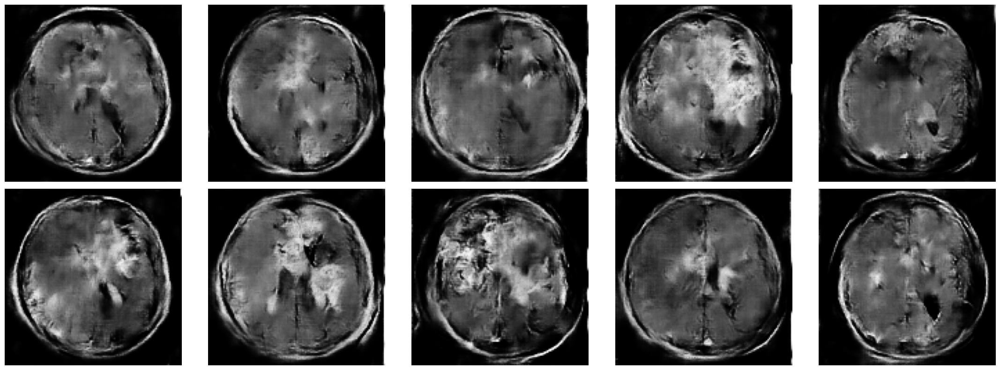

  0%|          | 0/3750 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 1/3750 [00:00<11:15,  5.55it/s]

1/1 [==============================] - 0s 38ms/step


  0%|          | 2/3750 [00:00<12:39,  4.94it/s]

1/1 [==============================] - 0s 37ms/step


  0%|          | 3/3750 [00:00<13:06,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 4/3750 [00:00<12:32,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 5/3750 [00:00<12:05,  5.16it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 6/3750 [00:01<11:27,  5.45it/s]

1/1 [==============================] - 0s 42ms/step


  0%|          | 7/3750 [00:01<11:55,  5.23it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 8/3750 [00:01<11:19,  5.51it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 9/3750 [00:01<11:37,  5.37it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 10/3750 [00:01<11:16,  5.52it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 11/3750 [00:02<11:06,  5.61it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 12/3750 [00:02<11:27,  5.44it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 13/3750 [00:02<11:30,  5.41it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 14/3750 [00:02<11:35,  5.37it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 15/3750 [00:02<11:29,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 16/3750 [00:02<11:21,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 17/3750 [00:03<11:28,  5.42it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 18/3750 [00:03<11:18,  5.50it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 19/3750 [00:03<10:58,  5.67it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 20/3750 [00:03<10:50,  5.74it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 21/3750 [00:03<11:09,  5.57it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 22/3750 [00:04<11:17,  5.51it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 23/3750 [00:04<11:31,  5.39it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 24/3750 [00:04<11:41,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 25/3750 [00:04<11:27,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 26/3750 [00:04<11:21,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 27/3750 [00:04<10:56,  5.67it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 28/3750 [00:05<10:48,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 29/3750 [00:05<10:45,  5.76it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 30/3750 [00:05<11:14,  5.52it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 31/3750 [00:05<10:47,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 32/3750 [00:05<10:48,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 33/3750 [00:06<11:16,  5.49it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 34/3750 [00:06<11:21,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 35/3750 [00:06<11:22,  5.45it/s]

1/1 [==============================] - 0s 40ms/step


  1%|          | 36/3750 [00:06<12:42,  4.87it/s]

1/1 [==============================] - 0s 39ms/step


  1%|          | 37/3750 [00:06<13:19,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 38/3750 [00:07<12:59,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 39/3750 [00:07<12:59,  4.76it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 40/3750 [00:07<12:57,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 41/3750 [00:07<13:15,  4.66it/s]

1/1 [==============================] - 0s 57ms/step


  1%|          | 42/3750 [00:07<13:32,  4.56it/s]

1/1 [==============================] - 0s 41ms/step


  1%|          | 43/3750 [00:08<13:27,  4.59it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 44/3750 [00:08<13:27,  4.59it/s]

1/1 [==============================] - 0s 51ms/step


  1%|          | 45/3750 [00:08<14:09,  4.36it/s]

1/1 [==============================] - 0s 54ms/step


  1%|          | 46/3750 [00:08<15:02,  4.11it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▏         | 47/3750 [00:09<15:20,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


  1%|▏         | 48/3750 [00:09<15:19,  4.03it/s]

1/1 [==============================] - 0s 47ms/step


  1%|▏         | 49/3750 [00:09<15:21,  4.02it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▏         | 50/3750 [00:09<14:56,  4.13it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▏         | 51/3750 [00:10<14:23,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


  1%|▏         | 52/3750 [00:10<14:04,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 53/3750 [00:10<13:14,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 54/3750 [00:10<12:57,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 55/3750 [00:10<13:27,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 56/3750 [00:11<13:07,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 57/3750 [00:11<12:48,  4.81it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 58/3750 [00:11<12:54,  4.77it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▏         | 59/3750 [00:11<13:01,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 60/3750 [00:11<12:39,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 61/3750 [00:12<12:28,  4.93it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 62/3750 [00:12<13:11,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 63/3750 [00:12<12:52,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 64/3750 [00:12<12:42,  4.84it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 65/3750 [00:13<13:00,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 66/3750 [00:13<13:13,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 67/3750 [00:13<13:34,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 68/3750 [00:13<13:02,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 69/3750 [00:13<12:22,  4.96it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 70/3750 [00:14<12:35,  4.87it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 71/3750 [00:14<12:51,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 72/3750 [00:14<12:47,  4.79it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 73/3750 [00:14<12:40,  4.83it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 74/3750 [00:14<13:18,  4.60it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 75/3750 [00:15<13:03,  4.69it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 76/3750 [00:15<13:24,  4.57it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 77/3750 [00:15<13:13,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 78/3750 [00:15<12:53,  4.75it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 79/3750 [00:16<13:26,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 80/3750 [00:16<13:24,  4.56it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 81/3750 [00:16<13:18,  4.59it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 82/3750 [00:16<13:25,  4.56it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 83/3750 [00:16<13:14,  4.61it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 84/3750 [00:17<13:03,  4.68it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 85/3750 [00:17<13:02,  4.68it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 86/3750 [00:17<13:15,  4.61it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 87/3750 [00:17<13:07,  4.65it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 88/3750 [00:17<12:37,  4.83it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 89/3750 [00:18<12:43,  4.79it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 90/3750 [00:18<11:59,  5.09it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 91/3750 [00:18<11:57,  5.10it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 92/3750 [00:18<11:43,  5.20it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 93/3750 [00:18<11:46,  5.18it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 94/3750 [00:19<11:55,  5.11it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 95/3750 [00:19<12:07,  5.02it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 96/3750 [00:19<11:37,  5.24it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 97/3750 [00:19<11:30,  5.29it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 98/3750 [00:19<11:28,  5.31it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 99/3750 [00:20<11:02,  5.51it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 100/3750 [00:20<11:25,  5.33it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 101/3750 [00:20<11:26,  5.31it/s]

1/1 [==============================] - 0s 56ms/step


  3%|▎         | 102/3750 [00:20<11:45,  5.17it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 103/3750 [00:20<12:20,  4.93it/s]

1/1 [==============================] - 0s 42ms/step


  3%|▎         | 104/3750 [00:21<14:09,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 105/3750 [00:21<14:32,  4.18it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 106/3750 [00:21<15:22,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 107/3750 [00:21<15:47,  3.85it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 108/3750 [00:22<15:58,  3.80it/s]

1/1 [==============================] - 0s 53ms/step


  3%|▎         | 109/3750 [00:22<16:10,  3.75it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 110/3750 [00:22<15:50,  3.83it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 111/3750 [00:23<15:31,  3.91it/s]

1/1 [==============================] - 0s 46ms/step


  3%|▎         | 112/3750 [00:23<15:16,  3.97it/s]

1/1 [==============================] - 0s 54ms/step


  3%|▎         | 113/3750 [00:23<15:03,  4.03it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 114/3750 [00:23<14:29,  4.18it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 115/3750 [00:23<14:10,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 116/3750 [00:24<14:22,  4.21it/s]

1/1 [==============================] - 0s 44ms/step


  3%|▎         | 117/3750 [00:24<14:35,  4.15it/s]

1/1 [==============================] - 0s 48ms/step


  3%|▎         | 118/3750 [00:24<14:42,  4.11it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 119/3750 [00:24<14:19,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 120/3750 [00:25<14:09,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 121/3750 [00:25<14:34,  4.15it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 122/3750 [00:25<14:12,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 123/3750 [00:25<14:10,  4.26it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 124/3750 [00:26<13:29,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 125/3750 [00:26<13:28,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 126/3750 [00:26<13:29,  4.48it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 127/3750 [00:26<13:01,  4.64it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 128/3750 [00:26<12:48,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 129/3750 [00:27<12:53,  4.68it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 130/3750 [00:27<13:05,  4.61it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 131/3750 [00:27<12:58,  4.65it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 132/3750 [00:27<12:47,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 133/3750 [00:27<12:43,  4.74it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 134/3750 [00:28<12:12,  4.94it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 135/3750 [00:28<11:20,  5.31it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▎         | 136/3750 [00:28<11:18,  5.33it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 137/3750 [00:28<10:56,  5.51it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 138/3750 [00:28<10:39,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 139/3750 [00:29<11:12,  5.37it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 140/3750 [00:29<11:24,  5.27it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 141/3750 [00:29<10:45,  5.59it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 142/3750 [00:29<10:29,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 143/3750 [00:29<10:53,  5.52it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 144/3750 [00:29<11:04,  5.42it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 145/3750 [00:30<11:01,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 146/3750 [00:30<10:28,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 147/3750 [00:30<10:23,  5.78it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 148/3750 [00:30<10:47,  5.56it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 149/3750 [00:30<10:59,  5.46it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 150/3750 [00:30<10:43,  5.60it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 151/3750 [00:31<10:18,  5.81it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 152/3750 [00:31<10:13,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 153/3750 [00:31<10:36,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 154/3750 [00:31<10:52,  5.51it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 155/3750 [00:31<10:57,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 156/3750 [00:32<10:32,  5.68it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 157/3750 [00:32<10:24,  5.75it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 158/3750 [00:32<09:56,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 159/3750 [00:32<10:23,  5.76it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 160/3750 [00:32<10:06,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 161/3750 [00:32<10:38,  5.62it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 162/3750 [00:33<10:51,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 163/3750 [00:33<11:01,  5.42it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 164/3750 [00:33<11:11,  5.34it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 165/3750 [00:33<10:51,  5.51it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 166/3750 [00:33<11:16,  5.30it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 167/3750 [00:34<10:48,  5.52it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 168/3750 [00:34<10:57,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 169/3750 [00:34<11:15,  5.30it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 170/3750 [00:34<11:17,  5.28it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 171/3750 [00:34<11:24,  5.23it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 172/3750 [00:34<11:17,  5.28it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 173/3750 [00:35<11:16,  5.28it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 174/3750 [00:35<11:55,  5.00it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 175/3750 [00:35<12:23,  4.81it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 176/3750 [00:35<13:04,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 177/3750 [00:36<13:26,  4.43it/s]

1/1 [==============================] - 0s 51ms/step


  5%|▍         | 178/3750 [00:36<13:43,  4.34it/s]

1/1 [==============================] - 0s 52ms/step


  5%|▍         | 179/3750 [00:36<14:45,  4.03it/s]

1/1 [==============================] - 0s 44ms/step


  5%|▍         | 180/3750 [00:36<15:04,  3.95it/s]

1/1 [==============================] - 0s 43ms/step


  5%|▍         | 181/3750 [00:37<15:13,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▍         | 182/3750 [00:37<14:49,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▍         | 183/3750 [00:37<14:35,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▍         | 184/3750 [00:37<15:06,  3.94it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▍         | 185/3750 [00:38<14:21,  4.14it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▍         | 186/3750 [00:38<15:04,  3.94it/s]

1/1 [==============================] - 0s 43ms/step


  5%|▍         | 187/3750 [00:38<14:34,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 188/3750 [00:38<14:11,  4.18it/s]

1/1 [==============================] - 0s 48ms/step


  5%|▌         | 189/3750 [00:39<14:09,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 190/3750 [00:39<14:35,  4.07it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 191/3750 [00:39<13:43,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 192/3750 [00:39<13:28,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 193/3750 [00:40<14:07,  4.20it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 194/3750 [00:40<13:26,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 195/3750 [00:40<13:33,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 196/3750 [00:40<12:49,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 197/3750 [00:40<12:32,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 198/3750 [00:41<12:39,  4.68it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 199/3750 [00:41<12:39,  4.68it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 200/3750 [00:41<12:13,  4.84it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 201/3750 [00:41<11:57,  4.94it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 202/3750 [00:41<12:09,  4.86it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 203/3750 [00:42<12:20,  4.79it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 204/3750 [00:42<12:20,  4.79it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 205/3750 [00:42<11:52,  4.98it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 206/3750 [00:42<11:31,  5.12it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 207/3750 [00:42<11:38,  5.07it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 208/3750 [00:43<11:09,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 209/3750 [00:43<11:17,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 210/3750 [00:43<10:44,  5.49it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 211/3750 [00:43<10:32,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 212/3750 [00:43<10:46,  5.47it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 213/3750 [00:43<10:48,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 214/3750 [00:44<11:02,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 215/3750 [00:44<10:53,  5.41it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 216/3750 [00:44<10:35,  5.57it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 217/3750 [00:44<10:43,  5.49it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 218/3750 [00:44<11:18,  5.21it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 219/3750 [00:45<11:16,  5.22it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 220/3750 [00:45<11:23,  5.17it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 221/3750 [00:45<10:46,  5.46it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 222/3750 [00:45<10:34,  5.56it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 223/3750 [00:45<10:44,  5.47it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 224/3750 [00:45<10:55,  5.38it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 225/3750 [00:46<11:14,  5.23it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 226/3750 [00:46<10:34,  5.55it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 227/3750 [00:46<10:25,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 228/3750 [00:46<10:40,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 229/3750 [00:46<10:58,  5.35it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 230/3750 [00:47<10:51,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 231/3750 [00:47<11:12,  5.23it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 232/3750 [00:47<11:13,  5.22it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 233/3750 [00:47<11:14,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 234/3750 [00:47<11:25,  5.13it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 235/3750 [00:48<11:08,  5.26it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 236/3750 [00:48<11:10,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 237/3750 [00:48<10:41,  5.48it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 238/3750 [00:48<10:52,  5.38it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 239/3750 [00:48<11:11,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 240/3750 [00:49<11:09,  5.24it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 241/3750 [00:49<10:49,  5.40it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▋         | 242/3750 [00:49<12:30,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 243/3750 [00:49<12:44,  4.59it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 244/3750 [00:49<12:44,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 245/3750 [00:50<12:12,  4.79it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 246/3750 [00:50<12:05,  4.83it/s]

1/1 [==============================] - 0s 53ms/step


  7%|▋         | 247/3750 [00:50<12:55,  4.52it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 248/3750 [00:50<12:45,  4.58it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 249/3750 [00:50<12:41,  4.59it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 250/3750 [00:51<13:26,  4.34it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 251/3750 [00:51<13:23,  4.35it/s]

1/1 [==============================] - 0s 53ms/step


  7%|▋         | 252/3750 [00:51<14:20,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 253/3750 [00:51<13:48,  4.22it/s]

1/1 [==============================] - 0s 41ms/step


  7%|▋         | 254/3750 [00:52<13:25,  4.34it/s]

1/1 [==============================] - 0s 40ms/step


  7%|▋         | 255/3750 [00:52<13:23,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 256/3750 [00:52<13:27,  4.33it/s]

1/1 [==============================] - 0s 41ms/step


  7%|▋         | 257/3750 [00:52<13:45,  4.23it/s]

1/1 [==============================] - 0s 55ms/step


  7%|▋         | 258/3750 [00:53<14:43,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


  7%|▋         | 259/3750 [00:53<14:31,  4.00it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 260/3750 [00:53<13:55,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 261/3750 [00:53<13:16,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 262/3750 [00:54<12:44,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 263/3750 [00:54<12:11,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 264/3750 [00:54<11:52,  4.89it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 265/3750 [00:54<12:06,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 266/3750 [00:54<11:37,  5.00it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 267/3750 [00:55<12:12,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 268/3750 [00:55<11:41,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 269/3750 [00:55<12:25,  4.67it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 270/3750 [00:55<12:40,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 271/3750 [00:55<12:38,  4.59it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 272/3750 [00:56<12:59,  4.46it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 273/3750 [00:56<12:46,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 274/3750 [00:56<12:22,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 275/3750 [00:56<12:27,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 276/3750 [00:57<12:24,  4.67it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 277/3750 [00:57<11:56,  4.85it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 278/3750 [00:57<12:01,  4.81it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 279/3750 [00:57<11:37,  4.98it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 280/3750 [00:57<11:36,  4.98it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 281/3750 [00:57<11:45,  4.92it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 282/3750 [00:58<11:21,  5.09it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 283/3750 [00:58<11:12,  5.16it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 284/3750 [00:58<18:06,  3.19it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 285/3750 [00:59<16:43,  3.45it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 286/3750 [00:59<15:34,  3.71it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 287/3750 [00:59<14:25,  4.00it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 288/3750 [00:59<14:21,  4.02it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 289/3750 [01:00<13:47,  4.18it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 290/3750 [01:00<13:54,  4.14it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 291/3750 [01:00<13:22,  4.31it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 292/3750 [01:00<13:25,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 293/3750 [01:00<12:56,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 294/3750 [01:01<12:10,  4.73it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 295/3750 [01:01<11:57,  4.81it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 296/3750 [01:01<12:05,  4.76it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 297/3750 [01:01<12:12,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 298/3750 [01:02<12:22,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 299/3750 [01:02<12:25,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 300/3750 [01:02<12:30,  4.60it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 301/3750 [01:02<12:48,  4.49it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 302/3750 [01:02<12:58,  4.43it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 303/3750 [01:03<12:27,  4.61it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 304/3750 [01:03<12:37,  4.55it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 305/3750 [01:03<12:41,  4.52it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 306/3750 [01:03<12:53,  4.45it/s]

1/1 [==============================] - 0s 60ms/step


  8%|▊         | 307/3750 [01:04<14:12,  4.04it/s]

1/1 [==============================] - 0s 45ms/step


  8%|▊         | 308/3750 [01:04<14:44,  3.89it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 309/3750 [01:04<14:18,  4.01it/s]

1/1 [==============================] - 0s 46ms/step


  8%|▊         | 310/3750 [01:04<14:18,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 311/3750 [01:05<13:57,  4.10it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 312/3750 [01:05<14:30,  3.95it/s]

1/1 [==============================] - 0s 58ms/step


  8%|▊         | 313/3750 [01:05<15:17,  3.74it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 314/3750 [01:05<14:25,  3.97it/s]

1/1 [==============================] - 0s 47ms/step


  8%|▊         | 315/3750 [01:06<14:36,  3.92it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 316/3750 [01:06<14:16,  4.01it/s]

1/1 [==============================] - 0s 48ms/step


  8%|▊         | 317/3750 [01:06<14:20,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 318/3750 [01:06<14:16,  4.01it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▊         | 319/3750 [01:07<14:09,  4.04it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▊         | 320/3750 [01:07<14:39,  3.90it/s]

1/1 [==============================] - 0s 50ms/step


  9%|▊         | 321/3750 [01:07<14:28,  3.95it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▊         | 322/3750 [01:07<14:13,  4.02it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 323/3750 [01:08<13:26,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 324/3750 [01:08<13:27,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 325/3750 [01:08<12:52,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 326/3750 [01:08<12:31,  4.55it/s]

1/1 [==============================] - 0s 49ms/step


  9%|▊         | 327/3750 [01:08<12:27,  4.58it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 328/3750 [01:09<12:16,  4.64it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 329/3750 [01:09<12:10,  4.68it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 330/3750 [01:09<11:42,  4.87it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 331/3750 [01:09<11:40,  4.88it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 332/3750 [01:09<11:39,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 333/3750 [01:10<11:47,  4.83it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 334/3750 [01:10<11:44,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 335/3750 [01:10<11:22,  5.00it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 336/3750 [01:10<11:35,  4.91it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 337/3750 [01:10<11:40,  4.87it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 338/3750 [01:11<11:56,  4.76it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 339/3750 [01:11<12:01,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 340/3750 [01:11<11:58,  4.74it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 341/3750 [01:11<11:41,  4.86it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 342/3750 [01:12<11:44,  4.84it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 343/3750 [01:12<11:53,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 344/3750 [01:12<11:33,  4.91it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 345/3750 [01:12<11:53,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 346/3750 [01:12<12:08,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 347/3750 [01:13<12:07,  4.68it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 348/3750 [01:13<11:44,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 349/3750 [01:13<11:55,  4.75it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 350/3750 [01:13<11:55,  4.76it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 351/3750 [01:13<11:50,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 352/3750 [01:14<11:45,  4.81it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 353/3750 [01:14<11:05,  5.10it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 354/3750 [01:14<11:28,  4.94it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 355/3750 [01:14<11:12,  5.04it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 356/3750 [01:14<10:56,  5.17it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 357/3750 [01:15<11:09,  5.07it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 358/3750 [01:15<11:12,  5.04it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 359/3750 [01:15<11:09,  5.07it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 360/3750 [01:15<10:49,  5.22it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 361/3750 [01:15<10:30,  5.38it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 362/3750 [01:16<10:49,  5.22it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 363/3750 [01:16<10:41,  5.28it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 364/3750 [01:16<11:21,  4.97it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 365/3750 [01:16<11:29,  4.91it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 366/3750 [01:16<11:41,  4.82it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 367/3750 [01:17<11:37,  4.85it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 368/3750 [01:17<11:19,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 369/3750 [01:17<11:37,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 370/3750 [01:17<11:49,  4.76it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 371/3750 [01:17<11:46,  4.79it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 372/3750 [01:18<12:11,  4.62it/s]

1/1 [==============================] - 0s 44ms/step


 10%|▉         | 373/3750 [01:18<12:59,  4.33it/s]

1/1 [==============================] - 0s 38ms/step


 10%|▉         | 374/3750 [01:18<12:59,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 375/3750 [01:18<12:40,  4.44it/s]

1/1 [==============================] - 0s 56ms/step


 10%|█         | 376/3750 [01:19<12:41,  4.43it/s]

1/1 [==============================] - 0s 63ms/step


 10%|█         | 377/3750 [01:19<13:54,  4.04it/s]

1/1 [==============================] - 0s 52ms/step


 10%|█         | 378/3750 [01:19<13:51,  4.06it/s]

1/1 [==============================] - 0s 54ms/step


 10%|█         | 379/3750 [01:19<13:52,  4.05it/s]

1/1 [==============================] - 0s 43ms/step


 10%|█         | 380/3750 [01:20<14:12,  3.95it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█         | 381/3750 [01:20<14:02,  4.00it/s]

1/1 [==============================] - 0s 60ms/step


 10%|█         | 382/3750 [01:20<14:04,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 383/3750 [01:20<13:37,  4.12it/s]

1/1 [==============================] - 0s 43ms/step


 10%|█         | 384/3750 [01:21<14:02,  3.99it/s]

1/1 [==============================] - 0s 39ms/step


 10%|█         | 385/3750 [01:21<14:19,  3.92it/s]

1/1 [==============================] - 0s 42ms/step


 10%|█         | 386/3750 [01:21<14:48,  3.79it/s]

1/1 [==============================] - 0s 36ms/step


 10%|█         | 387/3750 [01:21<14:25,  3.88it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 388/3750 [01:22<13:45,  4.07it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 389/3750 [01:22<12:46,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 390/3750 [01:22<12:40,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 391/3750 [01:22<12:39,  4.42it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 392/3750 [01:22<12:09,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 393/3750 [01:23<12:35,  4.44it/s]

1/1 [==============================] - 0s 45ms/step


 11%|█         | 394/3750 [01:23<12:33,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 395/3750 [01:23<11:52,  4.71it/s]

1/1 [==============================] - 0s 45ms/step


 11%|█         | 396/3750 [01:23<11:46,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 397/3750 [01:24<11:33,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 398/3750 [01:24<11:59,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 399/3750 [01:24<11:37,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 400/3750 [01:24<11:31,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 401/3750 [01:24<11:24,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 402/3750 [01:25<11:15,  4.95it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 403/3750 [01:25<10:58,  5.08it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 404/3750 [01:25<11:16,  4.95it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 405/3750 [01:25<11:24,  4.88it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 406/3750 [01:25<11:49,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 407/3750 [01:26<11:57,  4.66it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 408/3750 [01:26<12:18,  4.53it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 409/3750 [01:26<12:21,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 410/3750 [01:26<12:21,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 411/3750 [01:27<12:32,  4.44it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 412/3750 [01:27<12:15,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 413/3750 [01:27<12:30,  4.44it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 414/3750 [01:27<12:28,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 415/3750 [01:27<12:23,  4.48it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 416/3750 [01:28<12:21,  4.50it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 417/3750 [01:28<11:57,  4.65it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 418/3750 [01:28<12:19,  4.50it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 419/3750 [01:28<12:21,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 420/3750 [01:29<12:32,  4.42it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 421/3750 [01:29<12:00,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 422/3750 [01:29<12:22,  4.48it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 423/3750 [01:29<11:42,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 424/3750 [01:29<11:47,  4.70it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 425/3750 [01:30<12:17,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 426/3750 [01:30<12:24,  4.47it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 427/3750 [01:30<12:13,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 428/3750 [01:30<12:12,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 429/3750 [01:30<11:59,  4.62it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 430/3750 [01:31<11:50,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 431/3750 [01:31<11:55,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 432/3750 [01:31<11:54,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 433/3750 [01:31<11:40,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 434/3750 [01:32<11:11,  4.94it/s]

1/1 [==============================] - 0s 46ms/step


 12%|█▏        | 435/3750 [01:32<12:20,  4.48it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█▏        | 436/3750 [01:32<12:47,  4.32it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 437/3750 [01:32<12:26,  4.44it/s]

1/1 [==============================] - 0s 49ms/step


 12%|█▏        | 438/3750 [01:32<12:35,  4.38it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█▏        | 439/3750 [01:33<13:10,  4.19it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█▏        | 440/3750 [01:33<12:47,  4.31it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 441/3750 [01:33<12:59,  4.25it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 442/3750 [01:33<12:54,  4.27it/s]

1/1 [==============================] - 0s 44ms/step


 12%|█▏        | 443/3750 [01:34<13:01,  4.23it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 444/3750 [01:34<13:22,  4.12it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 445/3750 [01:34<12:46,  4.31it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 446/3750 [01:34<12:12,  4.51it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 447/3750 [01:35<12:23,  4.44it/s]

1/1 [==============================] - 0s 44ms/step


 12%|█▏        | 448/3750 [01:35<12:21,  4.46it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 449/3750 [01:35<12:40,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 450/3750 [01:35<12:25,  4.43it/s]

1/1 [==============================] - 0s 50ms/step


 12%|█▏        | 451/3750 [01:36<13:13,  4.16it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█▏        | 452/3750 [01:36<13:57,  3.94it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 453/3750 [01:36<14:04,  3.90it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 454/3750 [01:36<13:12,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 455/3750 [01:36<12:55,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 456/3750 [01:37<12:10,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 457/3750 [01:37<12:04,  4.55it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 458/3750 [01:37<12:07,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 459/3750 [01:37<12:29,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 460/3750 [01:38<12:54,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 461/3750 [01:38<12:11,  4.50it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 462/3750 [01:38<12:28,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 463/3750 [01:38<12:03,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 464/3750 [01:38<12:20,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 465/3750 [01:39<12:24,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 466/3750 [01:39<12:01,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 467/3750 [01:39<12:10,  4.49it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 468/3750 [01:39<12:04,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 469/3750 [01:40<12:06,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 470/3750 [01:40<11:54,  4.59it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 471/3750 [01:40<12:07,  4.51it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 472/3750 [01:40<11:23,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 473/3750 [01:40<11:19,  4.83it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 474/3750 [01:41<11:24,  4.78it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 475/3750 [01:41<11:52,  4.60it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 476/3750 [01:41<11:15,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 477/3750 [01:41<11:26,  4.77it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 478/3750 [01:41<11:38,  4.68it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 479/3750 [01:42<11:21,  4.80it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 480/3750 [01:42<11:41,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 481/3750 [01:42<11:47,  4.62it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 482/3750 [01:42<11:31,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 483/3750 [01:43<11:32,  4.72it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 484/3750 [01:43<11:41,  4.65it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 485/3750 [01:43<11:27,  4.75it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 486/3750 [01:43<11:52,  4.58it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 487/3750 [01:43<11:40,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 488/3750 [01:44<11:15,  4.83it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 489/3750 [01:44<11:16,  4.82it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 490/3750 [01:44<11:13,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 491/3750 [01:44<10:45,  5.05it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 492/3750 [01:44<11:11,  4.85it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 493/3750 [01:45<11:15,  4.82it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 494/3750 [01:45<11:14,  4.82it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 495/3750 [01:45<10:48,  5.02it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 496/3750 [01:45<10:54,  4.97it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 497/3750 [01:45<10:52,  4.99it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 498/3750 [01:46<10:58,  4.94it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 499/3750 [01:46<11:11,  4.84it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 500/3750 [01:46<11:23,  4.75it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 501/3750 [01:46<11:59,  4.51it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 502/3750 [01:47<12:28,  4.34it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 503/3750 [01:47<12:15,  4.41it/s]

1/1 [==============================] - 0s 42ms/step


 13%|█▎        | 504/3750 [01:47<12:42,  4.26it/s]

1/1 [==============================] - 0s 56ms/step


 13%|█▎        | 505/3750 [01:47<13:11,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 506/3750 [01:48<13:24,  4.03it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▎        | 507/3750 [01:48<13:31,  4.00it/s]

1/1 [==============================] - 0s 60ms/step


 14%|█▎        | 508/3750 [01:48<14:12,  3.80it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▎        | 509/3750 [01:48<13:40,  3.95it/s]

1/1 [==============================] - 0s 46ms/step


 14%|█▎        | 510/3750 [01:49<14:10,  3.81it/s]

1/1 [==============================] - 0s 56ms/step


 14%|█▎        | 511/3750 [01:49<14:33,  3.71it/s]

1/1 [==============================] - 0s 62ms/step


 14%|█▎        | 512/3750 [01:49<14:14,  3.79it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▎        | 513/3750 [01:49<13:34,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▎        | 514/3750 [01:50<13:36,  3.96it/s]

1/1 [==============================] - 0s 49ms/step


 14%|█▎        | 515/3750 [01:50<13:29,  4.00it/s]

1/1 [==============================] - 0s 57ms/step


 14%|█▍        | 516/3750 [01:50<14:27,  3.73it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 517/3750 [01:50<13:51,  3.89it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 518/3750 [01:51<12:41,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 519/3750 [01:51<12:15,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 520/3750 [01:51<11:54,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 521/3750 [01:51<11:27,  4.70it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 522/3750 [01:51<12:07,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 523/3750 [01:52<12:27,  4.32it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 524/3750 [01:52<12:23,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 525/3750 [01:52<11:52,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 526/3750 [01:52<11:35,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 527/3750 [01:53<11:45,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 528/3750 [01:53<11:23,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 529/3750 [01:53<10:49,  4.96it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 530/3750 [01:53<11:30,  4.67it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 531/3750 [01:53<11:02,  4.86it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 532/3750 [01:54<10:56,  4.90it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 533/3750 [01:54<10:58,  4.89it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 534/3750 [01:54<10:31,  5.09it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 535/3750 [01:54<10:15,  5.22it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 536/3750 [01:54<10:30,  5.10it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 537/3750 [01:55<10:54,  4.91it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 538/3750 [01:55<11:00,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 539/3750 [01:55<10:24,  5.14it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 540/3750 [01:55<10:28,  5.10it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 541/3750 [01:55<10:31,  5.08it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 542/3750 [01:56<10:39,  5.01it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 543/3750 [01:56<10:23,  5.14it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 544/3750 [01:56<10:28,  5.10it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 545/3750 [01:56<10:50,  4.93it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 546/3750 [01:56<11:22,  4.70it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 547/3750 [01:57<11:31,  4.63it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 548/3750 [01:57<11:31,  4.63it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 549/3750 [01:57<11:31,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 550/3750 [01:57<11:15,  4.74it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 551/3750 [01:57<10:55,  4.88it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 552/3750 [01:58<11:22,  4.68it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 553/3750 [01:58<11:17,  4.72it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 554/3750 [01:58<11:22,  4.68it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 555/3750 [01:58<11:44,  4.54it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 556/3750 [01:59<11:17,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 557/3750 [01:59<10:59,  4.84it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 558/3750 [01:59<11:17,  4.71it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 559/3750 [01:59<10:57,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 560/3750 [01:59<11:16,  4.71it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 561/3750 [02:00<11:13,  4.74it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 562/3750 [02:00<11:24,  4.66it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 563/3750 [02:00<11:22,  4.67it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▌        | 564/3750 [02:00<12:27,  4.26it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 565/3750 [02:01<12:33,  4.23it/s]

1/1 [==============================] - 0s 57ms/step


 15%|█▌        | 566/3750 [02:01<12:39,  4.19it/s]

1/1 [==============================] - 0s 55ms/step


 15%|█▌        | 567/3750 [02:01<13:37,  3.89it/s]

1/1 [==============================] - 0s 58ms/step


 15%|█▌        | 568/3750 [02:01<13:49,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 569/3750 [02:02<13:25,  3.95it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 570/3750 [02:02<13:18,  3.98it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 571/3750 [02:02<12:21,  4.29it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▌        | 572/3750 [02:02<12:00,  4.41it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▌        | 573/3750 [02:02<12:38,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 574/3750 [02:03<12:29,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 575/3750 [02:03<13:12,  4.01it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▌        | 576/3750 [02:03<13:25,  3.94it/s]

1/1 [==============================] - 0s 45ms/step


 15%|█▌        | 577/3750 [02:04<13:39,  3.87it/s]

1/1 [==============================] - 0s 46ms/step


 15%|█▌        | 578/3750 [02:04<13:57,  3.79it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▌        | 579/3750 [02:04<14:01,  3.77it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 580/3750 [02:04<13:30,  3.91it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 581/3750 [02:04<12:24,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 582/3750 [02:05<11:59,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 583/3750 [02:05<12:11,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 584/3750 [02:05<11:48,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 585/3750 [02:05<11:53,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 586/3750 [02:06<12:04,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 587/3750 [02:06<11:55,  4.42it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 588/3750 [02:06<12:08,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 589/3750 [02:06<11:36,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 590/3750 [02:06<11:34,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 591/3750 [02:07<11:13,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 592/3750 [02:07<11:25,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 593/3750 [02:07<11:30,  4.57it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 594/3750 [02:07<11:29,  4.57it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 595/3750 [02:08<11:19,  4.64it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 596/3750 [02:08<10:59,  4.78it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 597/3750 [02:08<11:10,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 598/3750 [02:08<11:30,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 599/3750 [02:08<11:30,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 600/3750 [02:09<11:08,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 601/3750 [02:09<11:16,  4.65it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 602/3750 [02:09<10:54,  4.81it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 603/3750 [02:09<10:52,  4.83it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 604/3750 [02:09<10:33,  4.97it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 605/3750 [02:10<10:29,  4.99it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 606/3750 [02:10<10:59,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 607/3750 [02:10<10:46,  4.86it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 608/3750 [02:10<10:32,  4.97it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 609/3750 [02:10<10:48,  4.84it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 610/3750 [02:11<10:48,  4.84it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 611/3750 [02:11<10:59,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 612/3750 [02:11<11:23,  4.59it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▋        | 613/3750 [02:11<11:31,  4.54it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▋        | 614/3750 [02:12<11:21,  4.60it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▋        | 615/3750 [02:12<11:54,  4.39it/s]

1/1 [==============================] - 0s 58ms/step


 16%|█▋        | 616/3750 [02:12<12:22,  4.22it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▋        | 617/3750 [02:12<12:38,  4.13it/s]

1/1 [==============================] - 0s 57ms/step


 16%|█▋        | 618/3750 [02:13<13:22,  3.90it/s]

1/1 [==============================] - 0s 58ms/step


 17%|█▋        | 619/3750 [02:13<13:49,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 620/3750 [02:13<13:14,  3.94it/s]

1/1 [==============================] - 0s 41ms/step


 17%|█▋        | 621/3750 [02:13<13:05,  3.99it/s]

1/1 [==============================] - 0s 63ms/step


 17%|█▋        | 622/3750 [02:14<13:14,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 623/3750 [02:14<13:25,  3.88it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 624/3750 [02:14<13:22,  3.90it/s]

1/1 [==============================] - 0s 42ms/step


 17%|█▋        | 625/3750 [02:14<13:02,  3.99it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 626/3750 [02:15<12:38,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 627/3750 [02:15<12:52,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 628/3750 [02:15<13:11,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 629/3750 [02:15<13:54,  3.74it/s]

1/1 [==============================] - 0s 62ms/step


 17%|█▋        | 630/3750 [02:16<13:34,  3.83it/s]

1/1 [==============================] - 0s 54ms/step


 17%|█▋        | 631/3750 [02:16<13:23,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 632/3750 [02:16<12:40,  4.10it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 633/3750 [02:16<12:22,  4.20it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 634/3750 [02:17<12:05,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 635/3750 [02:17<11:52,  4.37it/s]

1/1 [==============================] - 0s 61ms/step


 17%|█▋        | 636/3750 [02:17<12:28,  4.16it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 637/3750 [02:17<12:11,  4.26it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 638/3750 [02:18<12:22,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 639/3750 [02:18<12:15,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 640/3750 [02:18<12:49,  4.04it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 641/3750 [02:18<12:52,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 642/3750 [02:19<12:49,  4.04it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 643/3750 [02:19<12:24,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 644/3750 [02:19<11:43,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 645/3750 [02:19<11:11,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 646/3750 [02:19<11:33,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 647/3750 [02:20<11:52,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 648/3750 [02:20<11:47,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 649/3750 [02:20<11:36,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 650/3750 [02:20<11:31,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 651/3750 [02:21<11:51,  4.36it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 652/3750 [02:21<11:38,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 653/3750 [02:21<10:57,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 654/3750 [02:21<10:50,  4.76it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 655/3750 [02:21<10:41,  4.82it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 656/3750 [02:22<10:54,  4.73it/s]

1/1 [==============================] - 0s 53ms/step


 18%|█▊        | 657/3750 [02:22<11:40,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 658/3750 [02:22<11:12,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 659/3750 [02:22<11:30,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 660/3750 [02:23<11:57,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 661/3750 [02:23<11:31,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 662/3750 [02:23<11:06,  4.64it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 663/3750 [02:23<11:27,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 664/3750 [02:23<11:39,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 665/3750 [02:24<11:15,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 666/3750 [02:24<10:49,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 667/3750 [02:24<11:14,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 668/3750 [02:24<11:22,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 669/3750 [02:25<11:46,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 670/3750 [02:25<11:06,  4.62it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 671/3750 [02:25<10:53,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 672/3750 [02:25<10:57,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 673/3750 [02:25<10:45,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 674/3750 [02:26<10:34,  4.85it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 675/3750 [02:26<10:44,  4.77it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 676/3750 [02:26<10:31,  4.87it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 677/3750 [02:26<10:26,  4.90it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 678/3750 [02:26<10:42,  4.78it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 679/3750 [02:27<11:03,  4.63it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 680/3750 [02:27<10:37,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 681/3750 [02:27<10:34,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 682/3750 [02:27<10:26,  4.90it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 683/3750 [02:27<10:00,  5.11it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 684/3750 [02:28<10:11,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 685/3750 [02:28<10:40,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 686/3750 [02:28<10:58,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 687/3750 [02:28<10:33,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 688/3750 [02:28<10:43,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 689/3750 [02:29<10:19,  4.94it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 690/3750 [02:29<10:51,  4.70it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 691/3750 [02:29<11:40,  4.37it/s]

1/1 [==============================] - 0s 54ms/step


 18%|█▊        | 692/3750 [02:29<12:40,  4.02it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 693/3750 [02:30<13:01,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 694/3750 [02:30<12:37,  4.03it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▊        | 695/3750 [02:30<12:33,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 696/3750 [02:30<12:09,  4.19it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▊        | 697/3750 [02:31<12:03,  4.22it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▊        | 698/3750 [02:31<12:20,  4.12it/s]

1/1 [==============================] - 0s 58ms/step


 19%|█▊        | 699/3750 [02:31<12:41,  4.00it/s]

1/1 [==============================] - 0s 52ms/step


 19%|█▊        | 700/3750 [02:31<13:40,  3.72it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 701/3750 [02:32<13:12,  3.85it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▊        | 702/3750 [02:32<13:04,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 703/3750 [02:32<13:01,  3.90it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 704/3750 [02:32<12:49,  3.96it/s]

1/1 [==============================] - 0s 51ms/step


 19%|█▉        | 705/3750 [02:33<13:08,  3.86it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 706/3750 [02:33<12:26,  4.08it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 707/3750 [02:33<12:25,  4.08it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 708/3750 [02:33<11:55,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 709/3750 [02:34<11:58,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 710/3750 [02:34<11:15,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 711/3750 [02:34<10:49,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 712/3750 [02:34<10:57,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 713/3750 [02:34<11:24,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 714/3750 [02:35<11:39,  4.34it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 715/3750 [02:35<11:15,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 716/3750 [02:35<11:28,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 717/3750 [02:35<11:11,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 718/3750 [02:36<11:13,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 719/3750 [02:36<10:53,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 720/3750 [02:36<10:44,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 721/3750 [02:36<11:01,  4.58it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▉        | 722/3750 [02:36<11:50,  4.26it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 723/3750 [02:37<12:01,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 724/3750 [02:37<11:39,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 725/3750 [02:37<11:10,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 726/3750 [02:37<10:46,  4.68it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 727/3750 [02:38<11:00,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 728/3750 [02:38<10:50,  4.64it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 729/3750 [02:38<10:55,  4.61it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 730/3750 [02:38<10:54,  4.61it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 731/3750 [02:38<10:33,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 732/3750 [02:39<10:30,  4.79it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 733/3750 [02:39<10:30,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 734/3750 [02:39<10:18,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 735/3750 [02:39<10:12,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 736/3750 [02:39<10:43,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 737/3750 [02:40<10:56,  4.59it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 738/3750 [02:40<10:51,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 739/3750 [02:40<10:55,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 740/3750 [02:40<10:50,  4.63it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 741/3750 [02:41<10:48,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 742/3750 [02:41<10:44,  4.67it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 743/3750 [02:41<10:39,  4.70it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 744/3750 [02:41<10:39,  4.70it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 745/3750 [02:41<10:17,  4.87it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 746/3750 [02:42<10:08,  4.93it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 747/3750 [02:42<10:23,  4.81it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 748/3750 [02:42<10:29,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 749/3750 [02:42<10:36,  4.71it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 750/3750 [02:42<10:56,  4.57it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 751/3750 [02:43<11:01,  4.54it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 752/3750 [02:43<11:10,  4.47it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 753/3750 [02:43<11:08,  4.48it/s]

1/1 [==============================] - 0s 39ms/step


 20%|██        | 754/3750 [02:43<11:11,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 755/3750 [02:44<11:23,  4.38it/s]

1/1 [==============================] - 0s 48ms/step


 20%|██        | 756/3750 [02:44<11:52,  4.20it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 757/3750 [02:44<11:36,  4.29it/s]

1/1 [==============================] - 0s 43ms/step


 20%|██        | 758/3750 [02:44<12:10,  4.10it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 759/3750 [02:45<12:08,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 760/3750 [02:45<12:08,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 761/3750 [02:45<11:37,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 762/3750 [02:45<11:13,  4.44it/s]

1/1 [==============================] - 0s 38ms/step


 20%|██        | 763/3750 [02:45<11:32,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 764/3750 [02:46<11:51,  4.20it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 765/3750 [02:46<12:00,  4.14it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 766/3750 [02:46<11:26,  4.35it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 767/3750 [02:46<11:58,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 768/3750 [02:47<11:56,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 769/3750 [02:47<11:55,  4.17it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 770/3750 [02:47<11:50,  4.19it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 771/3750 [02:47<11:48,  4.20it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 772/3750 [02:48<11:47,  4.21it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 773/3750 [02:48<11:45,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 774/3750 [02:48<11:21,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 775/3750 [02:48<10:54,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 776/3750 [02:48<10:22,  4.77it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 777/3750 [02:49<10:44,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 778/3750 [02:49<10:22,  4.78it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 779/3750 [02:49<10:46,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 780/3750 [02:49<10:31,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 781/3750 [02:50<10:40,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 782/3750 [02:50<10:42,  4.62it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 783/3750 [02:50<11:05,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 784/3750 [02:50<10:41,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 785/3750 [02:50<10:06,  4.89it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 786/3750 [02:51<10:19,  4.78it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 787/3750 [02:51<10:42,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 788/3750 [02:51<10:50,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 789/3750 [02:51<10:23,  4.75it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 790/3750 [02:52<10:35,  4.66it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 791/3750 [02:52<10:48,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 792/3750 [02:52<10:15,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 793/3750 [02:52<10:50,  4.55it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 794/3750 [02:52<10:47,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 795/3750 [02:53<10:43,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 796/3750 [02:53<10:09,  4.85it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 797/3750 [02:53<09:42,  5.07it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██▏       | 798/3750 [02:53<09:53,  4.97it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 799/3750 [02:53<09:28,  5.19it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 800/3750 [02:54<09:32,  5.15it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██▏       | 801/3750 [02:54<10:00,  4.91it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 802/3750 [02:54<09:49,  5.00it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 803/3750 [02:54<09:36,  5.12it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 804/3750 [02:54<09:41,  5.07it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 805/3750 [02:55<09:44,  5.04it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 806/3750 [02:55<09:48,  5.00it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 807/3750 [02:55<09:46,  5.02it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 808/3750 [02:55<10:07,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 809/3750 [02:55<10:36,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 810/3750 [02:56<10:34,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 811/3750 [02:56<10:36,  4.62it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 812/3750 [02:56<10:00,  4.89it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 813/3750 [02:56<10:14,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 814/3750 [02:56<10:17,  4.76it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 815/3750 [02:57<09:43,  5.03it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 816/3750 [02:57<09:44,  5.02it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 817/3750 [02:57<09:25,  5.19it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 818/3750 [02:57<09:59,  4.89it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 819/3750 [02:57<10:46,  4.54it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 820/3750 [02:58<10:40,  4.58it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██▏       | 821/3750 [02:58<10:59,  4.44it/s]

1/1 [==============================] - 0s 56ms/step


 22%|██▏       | 822/3750 [02:58<12:07,  4.02it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 823/3750 [02:58<11:48,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 824/3750 [02:59<11:31,  4.23it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██▏       | 825/3750 [02:59<11:56,  4.08it/s]

1/1 [==============================] - 0s 58ms/step


 22%|██▏       | 826/3750 [02:59<12:32,  3.88it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 827/3750 [02:59<12:19,  3.95it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██▏       | 828/3750 [03:00<12:32,  3.88it/s]

1/1 [==============================] - 0s 66ms/step


 22%|██▏       | 829/3750 [03:00<12:29,  3.90it/s]

1/1 [==============================] - 0s 59ms/step


 22%|██▏       | 830/3750 [03:00<13:05,  3.72it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 831/3750 [03:01<13:16,  3.67it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 832/3750 [03:01<12:34,  3.87it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 833/3750 [03:01<12:25,  3.92it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 834/3750 [03:01<11:32,  4.21it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 835/3750 [03:01<10:34,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 836/3750 [03:02<10:24,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 837/3750 [03:02<10:27,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 838/3750 [03:02<10:14,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 839/3750 [03:02<10:40,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 840/3750 [03:03<10:58,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 841/3750 [03:03<10:51,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 842/3750 [03:03<10:30,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 843/3750 [03:03<10:47,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 844/3750 [03:03<11:00,  4.40it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 845/3750 [03:04<10:31,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 846/3750 [03:04<10:28,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 847/3750 [03:04<10:09,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 848/3750 [03:04<10:18,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 849/3750 [03:04<10:15,  4.71it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 850/3750 [03:05<10:42,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 851/3750 [03:05<10:22,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 852/3750 [03:05<10:07,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 853/3750 [03:05<10:12,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 854/3750 [03:06<10:21,  4.66it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 855/3750 [03:06<10:48,  4.46it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 856/3750 [03:06<10:37,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 857/3750 [03:06<09:54,  4.87it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 858/3750 [03:06<10:34,  4.56it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 859/3750 [03:07<10:01,  4.81it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 860/3750 [03:07<10:47,  4.47it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 861/3750 [03:07<10:39,  4.52it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 862/3750 [03:07<10:31,  4.57it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 863/3750 [03:07<10:26,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 864/3750 [03:08<10:11,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 865/3750 [03:08<10:16,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 866/3750 [03:08<09:41,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 867/3750 [03:08<10:18,  4.66it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 868/3750 [03:09<09:36,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 869/3750 [03:09<09:32,  5.03it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 870/3750 [03:09<10:13,  4.69it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 871/3750 [03:09<10:00,  4.79it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 872/3750 [03:09<09:52,  4.86it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 873/3750 [03:10<09:54,  4.84it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 874/3750 [03:10<09:42,  4.94it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 875/3750 [03:10<09:27,  5.07it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 876/3750 [03:10<10:02,  4.77it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 877/3750 [03:10<10:06,  4.74it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 878/3750 [03:11<10:11,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 879/3750 [03:11<10:16,  4.66it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 880/3750 [03:11<10:14,  4.67it/s]

1/1 [==============================] - 0s 58ms/step


 23%|██▎       | 881/3750 [03:11<10:58,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 882/3750 [03:12<10:50,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 883/3750 [03:12<10:43,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 884/3750 [03:12<11:05,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 885/3750 [03:12<10:47,  4.42it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▎       | 886/3750 [03:12<10:38,  4.49it/s]

1/1 [==============================] - 0s 57ms/step


 24%|██▎       | 887/3750 [03:13<10:53,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 888/3750 [03:13<11:11,  4.26it/s]

1/1 [==============================] - 0s 51ms/step


 24%|██▎       | 889/3750 [03:13<11:48,  4.04it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▎       | 890/3750 [03:13<11:49,  4.03it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 891/3750 [03:14<11:09,  4.27it/s]

1/1 [==============================] - 0s 54ms/step


 24%|██▍       | 892/3750 [03:14<11:49,  4.03it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▍       | 893/3750 [03:14<12:19,  3.86it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 894/3750 [03:15<13:03,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 895/3750 [03:15<12:46,  3.73it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 896/3750 [03:15<12:29,  3.81it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 897/3750 [03:15<12:35,  3.78it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 898/3750 [03:16<12:14,  3.88it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 899/3750 [03:16<11:26,  4.15it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 900/3750 [03:16<11:12,  4.24it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 901/3750 [03:16<10:49,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 902/3750 [03:16<10:33,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 903/3750 [03:17<10:09,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 904/3750 [03:17<10:07,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 905/3750 [03:17<10:31,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 906/3750 [03:17<10:42,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 907/3750 [03:17<10:41,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 908/3750 [03:18<10:48,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 909/3750 [03:18<11:00,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 910/3750 [03:18<10:27,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 911/3750 [03:18<10:47,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 912/3750 [03:19<10:59,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 913/3750 [03:19<10:49,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 914/3750 [03:19<10:25,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 915/3750 [03:19<10:17,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 916/3750 [03:20<10:33,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 917/3750 [03:20<10:28,  4.51it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 918/3750 [03:20<10:21,  4.55it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 919/3750 [03:20<10:20,  4.57it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 920/3750 [03:20<09:47,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 921/3750 [03:21<10:11,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 922/3750 [03:21<10:10,  4.63it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 923/3750 [03:21<10:03,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 924/3750 [03:21<09:59,  4.71it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 925/3750 [03:21<10:09,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 926/3750 [03:22<10:13,  4.60it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 927/3750 [03:22<10:05,  4.66it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 928/3750 [03:22<09:59,  4.71it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 929/3750 [03:22<09:45,  4.82it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▍       | 930/3750 [03:22<09:35,  4.90it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 931/3750 [03:23<09:35,  4.90it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 932/3750 [03:23<09:17,  5.06it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 933/3750 [03:23<09:16,  5.06it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 934/3750 [03:23<09:35,  4.89it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 935/3750 [03:23<09:40,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 936/3750 [03:24<09:45,  4.81it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 937/3750 [03:24<09:20,  5.01it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 938/3750 [03:24<09:30,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 939/3750 [03:24<09:25,  4.97it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 940/3750 [03:24<09:04,  5.16it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 941/3750 [03:25<08:40,  5.39it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 942/3750 [03:25<08:20,  5.61it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 943/3750 [03:25<08:33,  5.46it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 944/3750 [03:25<08:43,  5.36it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 945/3750 [03:25<08:54,  5.25it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 946/3750 [03:26<09:04,  5.15it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 947/3750 [03:26<09:59,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 948/3750 [03:26<09:47,  4.77it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 949/3750 [03:26<09:47,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 950/3750 [03:26<09:41,  4.81it/s]

1/1 [==============================] - 0s 43ms/step


 25%|██▌       | 951/3750 [03:27<10:30,  4.44it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▌       | 952/3750 [03:27<10:25,  4.47it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 953/3750 [03:27<10:52,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 954/3750 [03:27<11:03,  4.22it/s]

1/1 [==============================] - 0s 53ms/step


 25%|██▌       | 955/3750 [03:28<11:25,  4.08it/s]

1/1 [==============================] - 0s 47ms/step


 25%|██▌       | 956/3750 [03:28<11:39,  4.00it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 957/3750 [03:28<12:01,  3.87it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 958/3750 [03:28<12:07,  3.84it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 959/3750 [03:29<11:29,  4.05it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 960/3750 [03:29<11:20,  4.10it/s]

1/1 [==============================] - 0s 44ms/step


 26%|██▌       | 961/3750 [03:29<11:27,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 962/3750 [03:29<11:21,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 963/3750 [03:30<11:17,  4.11it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 964/3750 [03:30<10:38,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 965/3750 [03:30<10:37,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 966/3750 [03:30<10:39,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 967/3750 [03:31<10:01,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 968/3750 [03:31<09:51,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 969/3750 [03:31<09:29,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 970/3750 [03:31<09:23,  4.93it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 971/3750 [03:31<08:51,  5.23it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 972/3750 [03:31<09:04,  5.11it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 973/3750 [03:32<09:07,  5.08it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 974/3750 [03:32<09:05,  5.09it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 975/3750 [03:32<09:05,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 976/3750 [03:32<09:07,  5.06it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 977/3750 [03:32<09:04,  5.10it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 978/3750 [03:33<09:07,  5.06it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 979/3750 [03:33<08:47,  5.26it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 980/3750 [03:33<08:56,  5.16it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 981/3750 [03:33<09:15,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 982/3750 [03:33<09:28,  4.87it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 983/3750 [03:34<09:58,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 984/3750 [03:34<09:38,  4.78it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 985/3750 [03:34<09:48,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 986/3750 [03:34<10:09,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 987/3750 [03:35<09:52,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 988/3750 [03:35<09:29,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 989/3750 [03:35<09:12,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 990/3750 [03:35<09:03,  5.08it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 991/3750 [03:35<09:11,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 992/3750 [03:36<08:49,  5.21it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 993/3750 [03:36<08:50,  5.19it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 994/3750 [03:36<08:32,  5.37it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 995/3750 [03:36<08:45,  5.24it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 996/3750 [03:36<08:31,  5.38it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 997/3750 [03:36<08:41,  5.28it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 998/3750 [03:37<08:44,  5.24it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 999/3750 [03:37<08:49,  5.20it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 1000/3750 [03:37<09:03,  5.06it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 1001/3750 [03:37<08:58,  5.11it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 1002/3750 [03:37<08:58,  5.10it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 1003/3750 [03:38<09:30,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 1004/3750 [03:38<09:25,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 1005/3750 [03:38<09:53,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 1006/3750 [03:38<09:40,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 1007/3750 [03:39<09:56,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 1008/3750 [03:39<09:58,  4.58it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 1009/3750 [03:39<09:39,  4.73it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 1010/3750 [03:39<09:50,  4.64it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 1011/3750 [03:39<09:53,  4.61it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 1012/3750 [03:40<10:38,  4.29it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██▋       | 1013/3750 [03:40<11:23,  4.00it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 1014/3750 [03:40<11:25,  3.99it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 1015/3750 [03:40<11:06,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 1016/3750 [03:41<10:46,  4.23it/s]

1/1 [==============================] - 0s 57ms/step


 27%|██▋       | 1017/3750 [03:41<11:38,  3.91it/s]

1/1 [==============================] - 0s 51ms/step


 27%|██▋       | 1018/3750 [03:41<11:48,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 1019/3750 [03:41<11:07,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 1020/3750 [03:42<10:56,  4.16it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 1021/3750 [03:42<10:24,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 1022/3750 [03:42<10:38,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 1023/3750 [03:42<10:18,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 1024/3750 [03:43<10:08,  4.48it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 1025/3750 [03:43<10:34,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 1026/3750 [03:43<10:45,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 1027/3750 [03:43<11:11,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 1028/3750 [03:44<10:41,  4.24it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 1029/3750 [03:44<10:38,  4.26it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 1030/3750 [03:44<10:26,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 1031/3750 [03:44<09:46,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1032/3750 [03:44<10:14,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1033/3750 [03:45<10:17,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1034/3750 [03:45<10:25,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1035/3750 [03:45<10:33,  4.28it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 1036/3750 [03:45<10:30,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1037/3750 [03:46<10:07,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1038/3750 [03:46<09:50,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1039/3750 [03:46<10:09,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1040/3750 [03:46<09:47,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1041/3750 [03:46<09:17,  4.86it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1042/3750 [03:47<09:17,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1043/3750 [03:47<09:40,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1044/3750 [03:47<09:24,  4.79it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 1045/3750 [03:47<09:48,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1046/3750 [03:47<09:46,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1047/3750 [03:48<10:05,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1048/3750 [03:48<10:03,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1049/3750 [03:48<09:43,  4.63it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 1050/3750 [03:48<09:16,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1051/3750 [03:49<09:40,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1052/3750 [03:49<09:19,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1053/3750 [03:49<09:11,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1054/3750 [03:49<09:35,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1055/3750 [03:49<09:34,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1056/3750 [03:50<09:31,  4.72it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 1057/3750 [03:50<09:50,  4.56it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 1058/3750 [03:50<09:31,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 1059/3750 [03:50<09:56,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1060/3750 [03:51<10:15,  4.37it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 1061/3750 [03:51<10:18,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1062/3750 [03:51<10:14,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1063/3750 [03:51<10:19,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1064/3750 [03:51<09:53,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1065/3750 [03:52<09:43,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1066/3750 [03:52<10:01,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1067/3750 [03:52<10:15,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1068/3750 [03:52<10:22,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 1069/3750 [03:53<09:59,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 1070/3750 [03:53<09:38,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 1071/3750 [03:53<09:18,  4.79it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 1072/3750 [03:53<09:18,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 1073/3750 [03:53<09:52,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 1074/3750 [03:54<09:53,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 1075/3750 [03:54<10:09,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 1076/3750 [03:54<10:40,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▊       | 1077/3750 [03:54<10:20,  4.31it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▊       | 1078/3750 [03:55<10:28,  4.25it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 1079/3750 [03:55<10:23,  4.28it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 1080/3750 [03:55<10:48,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 1081/3750 [03:55<10:11,  4.36it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 1082/3750 [03:56<10:21,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1083/3750 [03:56<09:57,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 1084/3750 [03:56<09:53,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 1085/3750 [03:56<10:09,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 1086/3750 [03:56<09:46,  4.54it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 1087/3750 [03:57<09:50,  4.51it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▉       | 1088/3750 [03:57<10:15,  4.33it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 1089/3750 [03:57<10:04,  4.40it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 1090/3750 [03:57<10:32,  4.20it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 1091/3750 [03:58<11:21,  3.90it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1092/3750 [03:58<10:51,  4.08it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 1093/3750 [03:58<10:11,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1094/3750 [03:58<09:58,  4.44it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 1095/3750 [03:58<09:33,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 1096/3750 [03:59<09:22,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1097/3750 [03:59<09:40,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 1098/3750 [03:59<09:38,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 1099/3750 [03:59<09:53,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 1100/3750 [04:00<10:10,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 1101/3750 [04:00<09:43,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 1102/3750 [04:00<09:31,  4.64it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 1103/3750 [04:00<09:16,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 1104/3750 [04:00<09:38,  4.57it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 1105/3750 [04:01<09:29,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 1106/3750 [04:01<09:48,  4.49it/s]

1/1 [==============================] - 0s 44ms/step


 30%|██▉       | 1107/3750 [04:01<10:12,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 1108/3750 [04:01<09:52,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1109/3750 [04:02<09:27,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 1110/3750 [04:02<09:41,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 1111/3750 [04:02<09:25,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 1112/3750 [04:02<09:06,  4.83it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1113/3750 [04:02<09:01,  4.87it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1114/3750 [04:03<09:25,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 1115/3750 [04:03<09:06,  4.82it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1116/3750 [04:03<09:00,  4.88it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1117/3750 [04:03<09:09,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 1118/3750 [04:03<09:14,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 1119/3750 [04:04<08:52,  4.94it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 1120/3750 [04:04<08:52,  4.94it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1121/3750 [04:04<09:13,  4.75it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 1122/3750 [04:04<09:51,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1123/3750 [04:05<09:51,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1124/3750 [04:05<09:52,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 1125/3750 [04:05<09:59,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1126/3750 [04:05<09:35,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 1127/3750 [04:05<09:39,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1128/3750 [04:06<09:23,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1129/3750 [04:06<08:55,  4.90it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 1130/3750 [04:06<08:33,  5.10it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 1131/3750 [04:06<08:54,  4.90it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 1132/3750 [04:06<08:44,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1133/3750 [04:07<09:15,  4.71it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 1134/3750 [04:07<09:19,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 1135/3750 [04:07<09:41,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1136/3750 [04:07<09:57,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 1137/3750 [04:08<09:34,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 1138/3750 [04:08<09:55,  4.39it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1139/3750 [04:08<10:05,  4.31it/s]

1/1 [==============================] - 0s 53ms/step


 30%|███       | 1140/3750 [04:08<10:56,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 1141/3750 [04:09<10:30,  4.14it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1142/3750 [04:09<10:19,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1143/3750 [04:09<10:07,  4.29it/s]

1/1 [==============================] - 0s 67ms/step


 31%|███       | 1144/3750 [04:09<11:06,  3.91it/s]

1/1 [==============================] - 0s 46ms/step


 31%|███       | 1145/3750 [04:10<11:06,  3.91it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1146/3750 [04:10<11:08,  3.90it/s]

1/1 [==============================] - 0s 55ms/step


 31%|███       | 1147/3750 [04:10<11:28,  3.78it/s]

1/1 [==============================] - 0s 58ms/step


 31%|███       | 1148/3750 [04:10<11:25,  3.79it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 1149/3750 [04:11<10:53,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 1150/3750 [04:11<11:05,  3.91it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1151/3750 [04:11<10:44,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 1152/3750 [04:11<10:35,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 1153/3750 [04:11<10:09,  4.26it/s]

1/1 [==============================] - 0s 59ms/step


 31%|███       | 1154/3750 [04:12<10:44,  4.03it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 1155/3750 [04:12<10:46,  4.01it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 1156/3750 [04:12<10:39,  4.06it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1157/3750 [04:12<10:04,  4.29it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 1158/3750 [04:13<10:13,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1159/3750 [04:13<09:41,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1160/3750 [04:13<09:48,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1161/3750 [04:13<09:27,  4.56it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 1162/3750 [04:14<09:43,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1163/3750 [04:14<09:21,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1164/3750 [04:14<09:14,  4.66it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 1165/3750 [04:14<08:55,  4.83it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1166/3750 [04:14<08:51,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1167/3750 [04:15<09:17,  4.64it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 1168/3750 [04:15<09:44,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 1169/3750 [04:15<09:12,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1170/3750 [04:15<09:23,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1171/3750 [04:15<09:09,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 1172/3750 [04:16<09:20,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 1173/3750 [04:16<09:45,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 1174/3750 [04:16<09:27,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 1175/3750 [04:16<09:18,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 1176/3750 [04:17<09:17,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 1177/3750 [04:17<08:57,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 1178/3750 [04:17<08:50,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 1179/3750 [04:17<08:46,  4.89it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 1180/3750 [04:17<09:02,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 1181/3750 [04:18<09:00,  4.75it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 1182/3750 [04:18<08:55,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1183/3750 [04:18<09:02,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1184/3750 [04:18<08:40,  4.93it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1185/3750 [04:18<08:34,  4.99it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1186/3750 [04:19<08:47,  4.86it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1187/3750 [04:19<08:35,  4.97it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1188/3750 [04:19<08:48,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1189/3750 [04:19<08:42,  4.90it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1190/3750 [04:19<09:17,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1191/3750 [04:20<09:22,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1192/3750 [04:20<09:14,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1193/3750 [04:20<08:58,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1194/3750 [04:20<09:06,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1195/3750 [04:21<09:24,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1196/3750 [04:21<09:26,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1197/3750 [04:21<09:33,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1198/3750 [04:21<09:09,  4.65it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1199/3750 [04:21<09:06,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1200/3750 [04:22<09:23,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 1201/3750 [04:22<09:12,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1202/3750 [04:22<09:00,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1203/3750 [04:22<09:20,  4.55it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 1204/3750 [04:23<09:42,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1205/3750 [04:23<10:11,  4.16it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 1206/3750 [04:23<10:36,  4.00it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 1207/3750 [04:23<10:38,  3.98it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1208/3750 [04:24<10:26,  4.06it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1209/3750 [04:24<10:43,  3.95it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 1210/3750 [04:24<10:43,  3.95it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 1211/3750 [04:24<10:33,  4.01it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1212/3750 [04:25<10:02,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1213/3750 [04:25<09:53,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1214/3750 [04:25<09:50,  4.29it/s]

1/1 [==============================] - 0s 53ms/step


 32%|███▏      | 1215/3750 [04:25<10:01,  4.21it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 1216/3750 [04:26<09:52,  4.27it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 1217/3750 [04:26<10:01,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 1218/3750 [04:26<09:55,  4.25it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 1219/3750 [04:26<10:22,  4.07it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 1220/3750 [04:27<10:22,  4.06it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 1221/3750 [04:27<10:13,  4.12it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1222/3750 [04:27<10:15,  4.11it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1223/3750 [04:27<10:07,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1224/3750 [04:27<10:06,  4.16it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1225/3750 [04:28<09:39,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1226/3750 [04:28<09:50,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1227/3750 [04:28<10:05,  4.16it/s]

1/1 [==============================] - 0s 54ms/step


 33%|███▎      | 1228/3750 [04:28<10:04,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1229/3750 [04:29<10:04,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1230/3750 [04:29<09:31,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1231/3750 [04:29<09:13,  4.55it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 1232/3750 [04:29<09:45,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1233/3750 [04:30<09:27,  4.44it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 1234/3750 [04:30<10:02,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1235/3750 [04:30<10:17,  4.07it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███▎      | 1236/3750 [04:30<10:30,  3.99it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███▎      | 1237/3750 [04:31<10:14,  4.09it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 1238/3750 [04:31<10:14,  4.09it/s]

1/1 [==============================] - 0s 59ms/step


 33%|███▎      | 1239/3750 [04:31<10:37,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 1240/3750 [04:31<10:14,  4.09it/s]

1/1 [==============================] - 0s 52ms/step


 33%|███▎      | 1241/3750 [04:32<10:48,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 1242/3750 [04:32<10:43,  3.90it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 1243/3750 [04:32<10:21,  4.03it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 1244/3750 [04:32<10:28,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1245/3750 [04:33<10:07,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 1246/3750 [04:33<09:56,  4.20it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1247/3750 [04:33<09:45,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1248/3750 [04:33<09:04,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1249/3750 [04:33<09:04,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1250/3750 [04:34<08:49,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1251/3750 [04:34<09:07,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1252/3750 [04:34<09:04,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1253/3750 [04:34<09:22,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1254/3750 [04:34<08:46,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1255/3750 [04:35<08:58,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1256/3750 [04:35<09:02,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1257/3750 [04:35<08:31,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1258/3750 [04:35<08:28,  4.90it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1259/3750 [04:35<08:29,  4.89it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 1260/3750 [04:36<08:41,  4.77it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 1261/3750 [04:36<08:16,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1262/3750 [04:36<08:52,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 1263/3750 [04:36<08:53,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 1264/3750 [04:37<09:12,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 1265/3750 [04:37<09:09,  4.52it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 1266/3750 [04:37<09:15,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 1267/3750 [04:37<09:12,  4.50it/s]

1/1 [==============================] - 0s 52ms/step


 34%|███▍      | 1268/3750 [04:38<09:46,  4.23it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 1269/3750 [04:38<10:17,  4.02it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▍      | 1270/3750 [04:38<10:09,  4.07it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1271/3750 [04:38<09:46,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 1272/3750 [04:38<09:28,  4.36it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 1273/3750 [04:39<10:02,  4.11it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 1274/3750 [04:39<09:57,  4.14it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 1275/3750 [04:39<10:10,  4.06it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1276/3750 [04:39<10:11,  4.04it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 1277/3750 [04:40<11:10,  3.69it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1278/3750 [04:40<10:32,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 1279/3750 [04:40<10:20,  3.98it/s]

1/1 [==============================] - 0s 51ms/step


 34%|███▍      | 1280/3750 [04:41<10:23,  3.96it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 1281/3750 [04:41<10:04,  4.08it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 1282/3750 [04:41<10:18,  3.99it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 1283/3750 [04:41<10:43,  3.83it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1284/3750 [04:42<10:09,  4.04it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1285/3750 [04:42<09:44,  4.22it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1286/3750 [04:42<09:42,  4.23it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1287/3750 [04:42<09:42,  4.23it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1288/3750 [04:42<09:34,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1289/3750 [04:43<09:06,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1290/3750 [04:43<09:09,  4.48it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 1291/3750 [04:43<09:10,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1292/3750 [04:43<09:01,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1293/3750 [04:44<09:00,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1294/3750 [04:44<08:31,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1295/3750 [04:44<08:23,  4.87it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 1296/3750 [04:44<08:19,  4.92it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1297/3750 [04:44<08:17,  4.93it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1298/3750 [04:44<08:11,  4.99it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1299/3750 [04:45<07:55,  5.15it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1300/3750 [04:45<08:27,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1301/3750 [04:45<08:39,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1302/3750 [04:45<09:06,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1303/3750 [04:46<08:47,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1304/3750 [04:46<08:37,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1305/3750 [04:46<08:52,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1306/3750 [04:46<09:09,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1307/3750 [04:46<08:58,  4.54it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 1308/3750 [04:47<08:38,  4.71it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1309/3750 [04:47<08:56,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1310/3750 [04:47<08:39,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1311/3750 [04:47<08:33,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1312/3750 [04:47<08:21,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1313/3750 [04:48<08:13,  4.94it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1314/3750 [04:48<08:41,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1315/3750 [04:48<08:48,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1316/3750 [04:48<08:37,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1317/3750 [04:49<08:26,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1318/3750 [04:49<08:21,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1319/3750 [04:49<08:29,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1320/3750 [04:49<08:19,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1321/3750 [04:49<08:19,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1322/3750 [04:50<08:24,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1323/3750 [04:50<08:46,  4.61it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 1324/3750 [04:50<08:56,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1325/3750 [04:50<08:44,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1326/3750 [04:50<08:58,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1327/3750 [04:51<09:16,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1328/3750 [04:51<09:22,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1329/3750 [04:51<08:52,  4.54it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▌      | 1330/3750 [04:51<09:23,  4.30it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 1331/3750 [04:52<09:09,  4.40it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 1332/3750 [04:52<09:35,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 1333/3750 [04:52<09:50,  4.09it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 1334/3750 [04:52<10:18,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 1335/3750 [04:53<09:35,  4.19it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 1336/3750 [04:53<09:16,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1337/3750 [04:53<09:06,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 1338/3750 [04:53<09:22,  4.29it/s]

1/1 [==============================] - 0s 53ms/step


 36%|███▌      | 1339/3750 [04:54<09:26,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1340/3750 [04:54<08:51,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1341/3750 [04:54<08:48,  4.56it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1342/3750 [04:54<08:31,  4.71it/s]

1/1 [==============================] - 0s 61ms/step


 36%|███▌      | 1343/3750 [04:54<09:01,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1344/3750 [04:55<08:52,  4.52it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 1345/3750 [04:55<09:19,  4.30it/s]

1/1 [==============================] - 0s 57ms/step


 36%|███▌      | 1346/3750 [04:55<09:34,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1347/3750 [04:55<09:31,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 1348/3750 [04:56<09:38,  4.15it/s]

1/1 [==============================] - 0s 50ms/step


 36%|███▌      | 1349/3750 [04:56<10:03,  3.98it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1350/3750 [04:56<09:21,  4.27it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1351/3750 [04:56<08:53,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1352/3750 [04:57<08:45,  4.57it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 1353/3750 [04:57<08:34,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1354/3750 [04:57<08:11,  4.88it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1355/3750 [04:57<08:25,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1356/3750 [04:57<08:31,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1357/3750 [04:58<08:18,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1358/3750 [04:58<08:13,  4.85it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1359/3750 [04:58<08:35,  4.64it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 1360/3750 [04:58<08:25,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 1361/3750 [04:58<08:47,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1362/3750 [04:59<08:57,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1363/3750 [04:59<08:27,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 1364/3750 [04:59<08:18,  4.78it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 1365/3750 [04:59<08:08,  4.89it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 1366/3750 [04:59<08:29,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1367/3750 [05:00<08:46,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 1368/3750 [05:00<08:31,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1369/3750 [05:00<08:46,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1370/3750 [05:00<08:52,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1371/3750 [05:01<08:52,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1372/3750 [05:01<09:14,  4.29it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1373/3750 [05:01<09:01,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1374/3750 [05:01<08:41,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1375/3750 [05:01<08:30,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1376/3750 [05:02<08:48,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1377/3750 [05:02<08:35,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1378/3750 [05:02<08:45,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1379/3750 [05:02<09:05,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1380/3750 [05:03<09:00,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1381/3750 [05:03<08:57,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1382/3750 [05:03<08:37,  4.58it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1383/3750 [05:03<08:17,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1384/3750 [05:03<08:07,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1385/3750 [05:04<08:00,  4.93it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 1386/3750 [05:04<07:46,  5.07it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 1387/3750 [05:04<07:29,  5.25it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 1388/3750 [05:04<07:16,  5.41it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1389/3750 [05:04<08:06,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1390/3750 [05:05<07:58,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1391/3750 [05:05<07:37,  5.15it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 1392/3750 [05:05<08:20,  4.71it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1393/3750 [05:05<08:41,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1394/3750 [05:06<08:51,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1395/3750 [05:06<08:58,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 1396/3750 [05:06<08:37,  4.55it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 1397/3750 [05:06<08:53,  4.41it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 1398/3750 [05:07<15:56,  2.46it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 1399/3750 [05:07<14:04,  2.78it/s]

1/1 [==============================] - 0s 49ms/step


 37%|███▋      | 1400/3750 [05:08<13:07,  2.98it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 1401/3750 [05:08<12:18,  3.18it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 1402/3750 [05:08<11:27,  3.42it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 1403/3750 [05:08<11:18,  3.46it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 1404/3750 [05:09<10:35,  3.69it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 1405/3750 [05:09<10:41,  3.65it/s]

1/1 [==============================] - 0s 43ms/step


 37%|███▋      | 1406/3750 [05:09<10:34,  3.69it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 1407/3750 [05:09<10:33,  3.70it/s]

1/1 [==============================] - 0s 50ms/step


 38%|███▊      | 1408/3750 [05:10<10:53,  3.58it/s]

1/1 [==============================] - 0s 50ms/step


 38%|███▊      | 1409/3750 [05:10<10:20,  3.78it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 1410/3750 [05:10<10:23,  3.76it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1411/3750 [05:10<10:26,  3.73it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1412/3750 [05:11<09:58,  3.91it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1413/3750 [05:11<09:38,  4.04it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1414/3750 [05:11<09:06,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1415/3750 [05:11<08:50,  4.40it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 1416/3750 [05:12<08:48,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1417/3750 [05:12<09:06,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1418/3750 [05:12<08:50,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1419/3750 [05:12<09:02,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1420/3750 [05:12<08:51,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1421/3750 [05:13<09:05,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1422/3750 [05:13<08:45,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1423/3750 [05:13<08:37,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1424/3750 [05:13<08:36,  4.50it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1425/3750 [05:14<09:01,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1426/3750 [05:14<09:11,  4.22it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1427/3750 [05:14<08:44,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1428/3750 [05:14<08:39,  4.47it/s]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 1429/3750 [05:15<09:17,  4.17it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1430/3750 [05:15<08:54,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1431/3750 [05:15<08:33,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1432/3750 [05:15<08:36,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1433/3750 [05:15<08:34,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1434/3750 [05:16<08:55,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1435/3750 [05:16<08:56,  4.31it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 1436/3750 [05:16<09:03,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1437/3750 [05:16<08:46,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1438/3750 [05:17<08:32,  4.51it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1439/3750 [05:17<08:24,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1440/3750 [05:17<08:39,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1441/3750 [05:17<08:35,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1442/3750 [05:17<09:01,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1443/3750 [05:18<08:50,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 1444/3750 [05:18<08:38,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 1445/3750 [05:18<08:28,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 1446/3750 [05:18<08:14,  4.66it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▊      | 1447/3750 [05:19<08:14,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 1448/3750 [05:19<08:10,  4.69it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 1449/3750 [05:19<08:05,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 1450/3750 [05:19<08:28,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 1451/3750 [05:19<08:36,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 1452/3750 [05:20<08:33,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 1453/3750 [05:20<08:33,  4.47it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1454/3750 [05:20<08:37,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 1455/3750 [05:20<08:39,  4.42it/s]

1/1 [==============================] - 0s 52ms/step


 39%|███▉      | 1456/3750 [05:21<09:01,  4.24it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 1457/3750 [05:21<09:24,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 1458/3750 [05:21<09:27,  4.04it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 1459/3750 [05:21<09:34,  3.98it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1460/3750 [05:22<09:30,  4.02it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 1461/3750 [05:22<09:11,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 1462/3750 [05:22<09:21,  4.07it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1463/3750 [05:22<09:13,  4.13it/s]

1/1 [==============================] - 0s 52ms/step


 39%|███▉      | 1464/3750 [05:23<09:33,  3.99it/s]

1/1 [==============================] - 0s 45ms/step


 39%|███▉      | 1465/3750 [05:23<10:03,  3.79it/s]

1/1 [==============================] - 0s 49ms/step


 39%|███▉      | 1466/3750 [05:23<10:21,  3.67it/s]

1/1 [==============================] - 0s 56ms/step


 39%|███▉      | 1467/3750 [05:23<09:59,  3.81it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 1468/3750 [05:24<10:20,  3.68it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 1469/3750 [05:24<10:21,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 1470/3750 [05:24<09:58,  3.81it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 1471/3750 [05:24<09:38,  3.94it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1472/3750 [05:25<09:27,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 1473/3750 [05:25<08:54,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1474/3750 [05:25<09:00,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1475/3750 [05:25<08:40,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1476/3750 [05:26<08:55,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1477/3750 [05:26<08:32,  4.43it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▉      | 1478/3750 [05:26<08:31,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1479/3750 [05:26<08:30,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1480/3750 [05:26<08:30,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 1481/3750 [05:27<08:34,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1482/3750 [05:27<08:40,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1483/3750 [05:27<08:27,  4.47it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 1484/3750 [05:27<08:12,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1485/3750 [05:28<08:01,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1486/3750 [05:28<08:16,  4.56it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███▉      | 1487/3750 [05:28<08:51,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 1488/3750 [05:28<08:28,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1489/3750 [05:29<08:35,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1490/3750 [05:29<08:34,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1491/3750 [05:29<08:15,  4.56it/s]

1/1 [==============================] - 0s 38ms/step


 40%|███▉      | 1492/3750 [05:29<08:39,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 1493/3750 [05:29<08:40,  4.34it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 1494/3750 [05:30<08:39,  4.34it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 1495/3750 [05:30<08:13,  4.57it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 1496/3750 [05:30<08:31,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 1497/3750 [05:30<08:09,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1498/3750 [05:31<08:21,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1499/3750 [05:31<08:12,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1500/3750 [05:31<08:01,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 1501/3750 [05:31<08:08,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1502/3750 [05:31<08:09,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 1503/3750 [05:32<07:55,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 1504/3750 [05:32<08:22,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 1505/3750 [05:32<08:22,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 1506/3750 [05:32<08:05,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 1507/3750 [05:32<07:57,  4.70it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 1508/3750 [05:33<07:51,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1509/3750 [05:33<07:39,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1510/3750 [05:33<07:51,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1511/3750 [05:33<07:58,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1512/3750 [05:34<07:48,  4.78it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 1513/3750 [05:34<08:01,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1514/3750 [05:34<08:05,  4.60it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 1515/3750 [05:34<07:57,  4.68it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 1516/3750 [05:34<08:22,  4.45it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 1517/3750 [05:35<08:57,  4.16it/s]

1/1 [==============================] - 0s 52ms/step


 40%|████      | 1518/3750 [05:35<09:08,  4.07it/s]

1/1 [==============================] - 0s 47ms/step


 41%|████      | 1519/3750 [05:35<09:00,  4.13it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 1520/3750 [05:35<09:15,  4.02it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1521/3750 [05:36<08:51,  4.19it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 1522/3750 [05:36<08:40,  4.28it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 1523/3750 [05:36<09:27,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 1524/3750 [05:36<09:32,  3.89it/s]

1/1 [==============================] - 0s 62ms/step


 41%|████      | 1525/3750 [05:37<09:36,  3.86it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 1526/3750 [05:37<09:31,  3.89it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 1527/3750 [05:37<09:21,  3.96it/s]

1/1 [==============================] - 0s 57ms/step


 41%|████      | 1528/3750 [05:37<09:42,  3.82it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 1529/3750 [05:38<09:42,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 1530/3750 [05:38<09:21,  3.95it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 1531/3750 [05:38<09:31,  3.89it/s]

1/1 [==============================] - 0s 52ms/step


 41%|████      | 1532/3750 [05:39<09:42,  3.80it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1533/3750 [05:39<09:30,  3.89it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1534/3750 [05:39<09:20,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 1535/3750 [05:39<09:04,  4.07it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1536/3750 [05:39<08:38,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 1537/3750 [05:40<08:54,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 1538/3750 [05:40<08:40,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1539/3750 [05:40<08:16,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1540/3750 [05:40<07:59,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1541/3750 [05:41<08:22,  4.39it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 1542/3750 [05:41<08:38,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 1543/3750 [05:41<08:06,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1544/3750 [05:41<08:22,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1545/3750 [05:41<08:05,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1546/3750 [05:42<08:08,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 1547/3750 [05:42<07:45,  4.73it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 1548/3750 [05:42<07:44,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 1549/3750 [05:42<07:31,  4.88it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 1550/3750 [05:43<07:53,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 1551/3750 [05:43<08:01,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 1552/3750 [05:43<07:42,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 1553/3750 [05:43<07:47,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 1554/3750 [05:43<07:44,  4.72it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████▏     | 1555/3750 [05:44<08:09,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 1556/3750 [05:44<08:24,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1557/3750 [05:44<08:01,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1558/3750 [05:44<07:36,  4.80it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1559/3750 [05:44<07:58,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1560/3750 [05:45<08:03,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1561/3750 [05:45<08:22,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1562/3750 [05:45<08:29,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1563/3750 [05:45<08:09,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1564/3750 [05:46<08:00,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1565/3750 [05:46<08:03,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1566/3750 [05:46<07:52,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1567/3750 [05:46<07:48,  4.66it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 1568/3750 [05:47<08:19,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1569/3750 [05:47<08:03,  4.51it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 1570/3750 [05:47<08:13,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1571/3750 [05:47<07:51,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1572/3750 [05:47<07:52,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1573/3750 [05:48<08:08,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1574/3750 [05:48<08:21,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 1575/3750 [05:48<08:06,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1576/3750 [05:48<07:55,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1577/3750 [05:49<08:20,  4.35it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 1578/3750 [05:49<08:23,  4.31it/s]

1/1 [==============================] - 0s 49ms/step


 42%|████▏     | 1579/3750 [05:49<08:51,  4.08it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 1580/3750 [05:49<09:18,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 1581/3750 [05:50<08:52,  4.07it/s]

1/1 [==============================] - 0s 57ms/step


 42%|████▏     | 1582/3750 [05:50<08:58,  4.03it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 1583/3750 [05:50<08:36,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 1584/3750 [05:50<08:12,  4.40it/s]

1/1 [==============================] - 0s 48ms/step


 42%|████▏     | 1585/3750 [05:50<08:17,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 1586/3750 [05:51<08:35,  4.20it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1587/3750 [05:51<08:23,  4.29it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1588/3750 [05:51<08:10,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1589/3750 [05:51<08:05,  4.45it/s]

1/1 [==============================] - 0s 49ms/step


 42%|████▏     | 1590/3750 [05:52<08:18,  4.33it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 1591/3750 [05:52<08:44,  4.11it/s]

1/1 [==============================] - 0s 55ms/step


 42%|████▏     | 1592/3750 [05:52<08:54,  4.04it/s]

1/1 [==============================] - 0s 46ms/step


 42%|████▏     | 1593/3750 [05:52<08:47,  4.09it/s]

1/1 [==============================] - 0s 52ms/step


 43%|████▎     | 1594/3750 [05:53<08:44,  4.11it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 1595/3750 [05:53<08:41,  4.14it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 1596/3750 [05:53<09:04,  3.96it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1597/3750 [05:53<08:21,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1598/3750 [05:54<07:56,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1599/3750 [05:54<07:35,  4.73it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1600/3750 [05:54<07:58,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 1601/3750 [05:54<07:55,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1602/3750 [05:54<07:44,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1603/3750 [05:55<07:37,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1604/3750 [05:55<08:05,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1605/3750 [05:55<07:51,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1606/3750 [05:55<07:58,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1607/3750 [05:55<07:43,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1608/3750 [05:56<07:32,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1609/3750 [05:56<07:16,  4.90it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1610/3750 [05:56<07:01,  5.07it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1611/3750 [05:56<07:08,  5.00it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1612/3750 [05:56<07:06,  5.01it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1613/3750 [05:57<07:17,  4.88it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1614/3750 [05:57<07:11,  4.95it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1615/3750 [05:57<07:21,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1616/3750 [05:57<07:43,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1617/3750 [05:58<07:52,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1618/3750 [05:58<07:41,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1619/3750 [05:58<07:36,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1620/3750 [05:58<07:52,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1621/3750 [05:58<07:40,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1622/3750 [05:59<07:34,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1623/3750 [05:59<07:25,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1624/3750 [05:59<07:25,  4.77it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1625/3750 [05:59<07:19,  4.83it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1626/3750 [05:59<07:38,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1627/3750 [06:00<07:57,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1628/3750 [06:00<07:34,  4.67it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 1629/3750 [06:00<07:50,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1630/3750 [06:00<07:56,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1631/3750 [06:01<07:48,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 1632/3750 [06:01<07:33,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 1633/3750 [06:01<07:40,  4.60it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 1634/3750 [06:01<07:45,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 1635/3750 [06:01<07:59,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 1636/3750 [06:02<08:09,  4.32it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▎     | 1637/3750 [06:02<08:44,  4.03it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 1638/3750 [06:02<08:26,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 1639/3750 [06:02<08:17,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 1640/3750 [06:03<08:02,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1641/3750 [06:03<07:45,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1642/3750 [06:03<07:51,  4.47it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 1643/3750 [06:03<08:01,  4.38it/s]

1/1 [==============================] - 0s 62ms/step


 44%|████▍     | 1644/3750 [06:04<08:23,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 1645/3750 [06:04<08:25,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 1646/3750 [06:04<08:25,  4.16it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 1647/3750 [06:04<08:22,  4.19it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 1648/3750 [06:05<08:28,  4.14it/s]

1/1 [==============================] - 0s 58ms/step


 44%|████▍     | 1649/3750 [06:05<08:46,  3.99it/s]

1/1 [==============================] - 0s 61ms/step


 44%|████▍     | 1650/3750 [06:05<09:04,  3.86it/s]

1/1 [==============================] - 0s 48ms/step


 44%|████▍     | 1651/3750 [06:05<08:53,  3.93it/s]

1/1 [==============================] - 0s 55ms/step


 44%|████▍     | 1652/3750 [06:06<08:46,  3.99it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1653/3750 [06:06<08:17,  4.21it/s]

1/1 [==============================] - 0s 53ms/step


 44%|████▍     | 1654/3750 [06:06<08:24,  4.15it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 1655/3750 [06:06<08:11,  4.26it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 1656/3750 [06:06<08:09,  4.28it/s]

1/1 [==============================] - 0s 57ms/step


 44%|████▍     | 1657/3750 [06:07<08:27,  4.13it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 1658/3750 [06:07<08:30,  4.10it/s]

1/1 [==============================] - 0s 56ms/step


 44%|████▍     | 1659/3750 [06:07<08:28,  4.11it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 1660/3750 [06:07<08:13,  4.24it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 1661/3750 [06:08<08:39,  4.02it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 1662/3750 [06:08<08:52,  3.92it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1663/3750 [06:08<08:12,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1664/3750 [06:08<08:03,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1665/3750 [06:09<07:42,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1666/3750 [06:09<07:42,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1667/3750 [06:09<07:32,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1668/3750 [06:09<07:20,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1669/3750 [06:09<07:09,  4.85it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 1670/3750 [06:10<07:32,  4.60it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 1671/3750 [06:10<07:11,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1672/3750 [06:10<07:33,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1673/3750 [06:10<07:20,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1674/3750 [06:11<07:40,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1675/3750 [06:11<07:17,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1676/3750 [06:11<07:49,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1677/3750 [06:11<07:51,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1678/3750 [06:11<07:59,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1679/3750 [06:12<07:41,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1680/3750 [06:12<07:27,  4.62it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 1681/3750 [06:12<07:53,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1682/3750 [06:12<07:38,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1683/3750 [06:13<07:25,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1684/3750 [06:13<07:17,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1685/3750 [06:13<07:12,  4.77it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 1686/3750 [06:13<07:15,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1687/3750 [06:13<07:34,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 1688/3750 [06:14<07:21,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1689/3750 [06:14<07:05,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 1690/3750 [06:14<07:14,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 1691/3750 [06:14<07:07,  4.82it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1692/3750 [06:14<07:23,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1693/3750 [06:15<07:38,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1694/3750 [06:15<07:21,  4.66it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▌     | 1695/3750 [06:15<07:18,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 1696/3750 [06:15<07:03,  4.85it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 1697/3750 [06:16<07:14,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1698/3750 [06:16<07:33,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1699/3750 [06:16<07:19,  4.67it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 1700/3750 [06:16<07:41,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 1701/3750 [06:16<07:54,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 1702/3750 [06:17<07:24,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1703/3750 [06:17<07:47,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1704/3750 [06:17<07:41,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1705/3750 [06:17<07:25,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 1706/3750 [06:18<07:39,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1707/3750 [06:18<07:24,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1708/3750 [06:18<07:42,  4.42it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▌     | 1709/3750 [06:18<07:43,  4.40it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 1710/3750 [06:18<07:27,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1711/3750 [06:19<07:29,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1712/3750 [06:19<07:52,  4.31it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▌     | 1713/3750 [06:19<07:42,  4.40it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 1714/3750 [06:19<07:46,  4.37it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 1715/3750 [06:20<08:04,  4.20it/s]

1/1 [==============================] - 0s 54ms/step


 46%|████▌     | 1716/3750 [06:20<08:29,  3.99it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1717/3750 [06:20<08:02,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1718/3750 [06:20<08:17,  4.08it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 1719/3750 [06:21<08:09,  4.15it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 1720/3750 [06:21<08:21,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 1721/3750 [06:21<08:16,  4.08it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▌     | 1722/3750 [06:21<08:05,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1723/3750 [06:22<08:17,  4.07it/s]

1/1 [==============================] - 0s 57ms/step


 46%|████▌     | 1724/3750 [06:22<08:35,  3.93it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 1725/3750 [06:22<09:08,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1726/3750 [06:22<08:52,  3.80it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1727/3750 [06:23<08:45,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 1728/3750 [06:23<08:28,  3.97it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1729/3750 [06:23<08:20,  4.04it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1730/3750 [06:23<07:59,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1731/3750 [06:24<07:52,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 1732/3750 [06:24<08:01,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1733/3750 [06:24<07:32,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1734/3750 [06:24<07:44,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 1735/3750 [06:24<07:44,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1736/3750 [06:25<07:43,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1737/3750 [06:25<07:24,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1738/3750 [06:25<07:24,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 1739/3750 [06:25<07:26,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 1740/3750 [06:26<07:44,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1741/3750 [06:26<07:20,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1742/3750 [06:26<07:38,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 1743/3750 [06:26<07:25,  4.51it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 1744/3750 [06:26<07:26,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1745/3750 [06:27<07:10,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1746/3750 [06:27<06:49,  4.90it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1747/3750 [06:27<07:09,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1748/3750 [06:27<07:24,  4.50it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 1749/3750 [06:28<07:13,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1750/3750 [06:28<07:07,  4.68it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 1751/3750 [06:28<07:00,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1752/3750 [06:28<07:05,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1753/3750 [06:28<06:57,  4.79it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1754/3750 [06:29<07:21,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1755/3750 [06:29<07:10,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1756/3750 [06:29<06:59,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1757/3750 [06:29<07:23,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1758/3750 [06:29<07:08,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1759/3750 [06:30<07:16,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1760/3750 [06:30<07:06,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1761/3750 [06:30<07:01,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1762/3750 [06:30<06:49,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1763/3750 [06:31<07:02,  4.70it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 1764/3750 [06:31<06:51,  4.83it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 1765/3750 [06:31<07:12,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1766/3750 [06:31<07:12,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1767/3750 [06:31<06:59,  4.73it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 1768/3750 [06:32<07:08,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1769/3750 [06:32<07:02,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1770/3750 [06:32<07:20,  4.50it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 1771/3750 [06:32<07:23,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 1772/3750 [06:33<07:26,  4.43it/s]

1/1 [==============================] - 0s 59ms/step


 47%|████▋     | 1773/3750 [06:33<08:09,  4.04it/s]

1/1 [==============================] - 0s 57ms/step


 47%|████▋     | 1774/3750 [06:33<08:18,  3.97it/s]

1/1 [==============================] - 0s 55ms/step


 47%|████▋     | 1775/3750 [06:33<08:23,  3.92it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 1776/3750 [06:34<08:31,  3.86it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 1777/3750 [06:34<08:35,  3.83it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 1778/3750 [06:34<08:05,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 1779/3750 [06:34<07:42,  4.26it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 1780/3750 [06:35<08:07,  4.04it/s]

1/1 [==============================] - 0s 57ms/step


 47%|████▋     | 1781/3750 [06:35<08:37,  3.80it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1782/3750 [06:35<08:12,  4.00it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1783/3750 [06:35<08:11,  4.00it/s]

1/1 [==============================] - 0s 58ms/step


 48%|████▊     | 1784/3750 [06:36<08:41,  3.77it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 1785/3750 [06:36<08:54,  3.67it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 1786/3750 [06:36<08:32,  3.83it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1787/3750 [06:36<08:04,  4.05it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 1788/3750 [06:37<07:52,  4.15it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 1789/3750 [06:37<07:52,  4.15it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 1790/3750 [06:37<08:12,  3.98it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1791/3750 [06:37<07:41,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1792/3750 [06:38<07:11,  4.54it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 1793/3750 [06:38<07:25,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1794/3750 [06:38<07:28,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1795/3750 [06:38<07:36,  4.28it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1796/3750 [06:38<07:17,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1797/3750 [06:39<07:10,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1798/3750 [06:39<07:15,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1799/3750 [06:39<07:17,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1800/3750 [06:39<07:04,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1801/3750 [06:40<07:01,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1802/3750 [06:40<07:18,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1803/3750 [06:40<07:18,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 1804/3750 [06:40<07:19,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1805/3750 [06:40<07:04,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1806/3750 [06:41<06:52,  4.71it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 1807/3750 [06:41<06:44,  4.81it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1808/3750 [06:41<06:54,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1809/3750 [06:41<07:00,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1810/3750 [06:41<06:57,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1811/3750 [06:42<06:49,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1812/3750 [06:42<07:13,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1813/3750 [06:42<07:16,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1814/3750 [06:42<07:21,  4.38it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 1815/3750 [06:43<06:59,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1816/3750 [06:43<06:54,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1817/3750 [06:43<06:56,  4.64it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1818/3750 [06:43<07:11,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 1819/3750 [06:43<06:59,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 1820/3750 [06:44<06:37,  4.86it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 1821/3750 [06:44<06:34,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 1822/3750 [06:44<06:29,  4.95it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 1823/3750 [06:44<06:41,  4.80it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 1824/3750 [06:44<06:50,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 1825/3750 [06:45<06:44,  4.76it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 1826/3750 [06:45<07:10,  4.47it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 1827/3750 [06:45<07:06,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 1828/3750 [06:45<07:06,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1829/3750 [06:46<07:01,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1830/3750 [06:46<06:57,  4.59it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 1831/3750 [06:46<07:14,  4.42it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 1832/3750 [06:46<07:08,  4.47it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 1833/3750 [06:47<07:22,  4.34it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 1834/3750 [06:47<07:41,  4.15it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 1835/3750 [06:47<07:38,  4.18it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 1836/3750 [06:47<07:27,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 1837/3750 [06:48<07:45,  4.11it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 1838/3750 [06:48<08:03,  3.95it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 1839/3750 [06:48<08:17,  3.84it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 1840/3750 [06:48<08:08,  3.91it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 1841/3750 [06:49<07:58,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 1842/3750 [06:49<07:28,  4.25it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 1843/3750 [06:49<07:20,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1844/3750 [06:49<07:18,  4.35it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 1845/3750 [06:49<07:15,  4.37it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 1846/3750 [06:50<07:36,  4.17it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 1847/3750 [06:50<07:51,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 1848/3750 [06:50<07:35,  4.18it/s]

1/1 [==============================] - 0s 65ms/step


 49%|████▉     | 1849/3750 [06:50<08:01,  3.95it/s]

1/1 [==============================] - 0s 53ms/step


 49%|████▉     | 1850/3750 [06:51<08:43,  3.63it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 1851/3750 [06:51<08:41,  3.64it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 1852/3750 [06:51<08:35,  3.68it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 1853/3750 [06:52<08:20,  3.79it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 1854/3750 [06:52<08:35,  3.68it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 1855/3750 [06:52<08:32,  3.70it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 1856/3750 [06:52<08:09,  3.87it/s]

1/1 [==============================] - 0s 48ms/step


 50%|████▉     | 1857/3750 [06:53<08:26,  3.74it/s]

1/1 [==============================] - 0s 37ms/step


 50%|████▉     | 1858/3750 [06:53<08:23,  3.76it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 1859/3750 [06:53<08:23,  3.76it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 1860/3750 [06:53<08:08,  3.87it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1861/3750 [06:54<07:47,  4.04it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 1862/3750 [06:54<07:36,  4.14it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1863/3750 [06:54<07:10,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 1864/3750 [06:54<06:46,  4.64it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 1865/3750 [06:54<06:39,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1866/3750 [06:55<06:36,  4.75it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 1867/3750 [06:55<06:43,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 1868/3750 [06:55<06:41,  4.69it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 1869/3750 [06:55<06:14,  5.02it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1870/3750 [06:55<06:19,  4.96it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 1871/3750 [06:56<06:18,  4.97it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 1872/3750 [06:56<06:09,  5.08it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 1873/3750 [06:56<06:01,  5.20it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 1874/3750 [06:56<06:14,  5.01it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1875/3750 [06:56<06:14,  5.01it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 1876/3750 [06:57<06:17,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1877/3750 [06:57<06:05,  5.13it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1878/3750 [06:57<06:08,  5.08it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1879/3750 [06:57<06:09,  5.06it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 1880/3750 [06:57<05:58,  5.22it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 1881/3750 [06:58<06:05,  5.12it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1882/3750 [06:58<06:10,  5.04it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 1883/3750 [06:58<06:05,  5.11it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1884/3750 [06:58<06:07,  5.08it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 1885/3750 [06:58<06:11,  5.02it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1886/3750 [06:59<06:22,  4.87it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 1887/3750 [06:59<06:40,  4.65it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 1888/3750 [06:59<06:51,  4.52it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 1889/3750 [06:59<07:05,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1890/3750 [07:00<06:41,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1891/3750 [07:00<06:25,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1892/3750 [07:00<06:42,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1893/3750 [07:00<07:00,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1894/3750 [07:00<06:48,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1895/3750 [07:01<07:04,  4.37it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1896/3750 [07:01<06:56,  4.45it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 1897/3750 [07:01<07:08,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1898/3750 [07:01<06:50,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 1899/3750 [07:02<06:55,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1900/3750 [07:02<06:53,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1901/3750 [07:02<06:57,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 1902/3750 [07:02<07:15,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1903/3750 [07:03<07:26,  4.14it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1904/3750 [07:03<07:07,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1905/3750 [07:03<07:04,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1906/3750 [07:03<06:48,  4.52it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 1907/3750 [07:03<07:15,  4.23it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 1908/3750 [07:04<07:31,  4.08it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1909/3750 [07:04<07:30,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1910/3750 [07:04<07:20,  4.18it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 1911/3750 [07:04<07:16,  4.21it/s]

1/1 [==============================] - 0s 61ms/step


 51%|█████     | 1912/3750 [07:05<07:30,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 1913/3750 [07:05<07:18,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1914/3750 [07:05<07:06,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1915/3750 [07:05<06:56,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1916/3750 [07:06<06:37,  4.61it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 1917/3750 [07:06<07:04,  4.32it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 1918/3750 [07:06<07:12,  4.24it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 1919/3750 [07:06<07:31,  4.05it/s]

1/1 [==============================] - 0s 56ms/step


 51%|█████     | 1920/3750 [07:07<07:46,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1921/3750 [07:07<07:28,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████▏    | 1922/3750 [07:07<07:39,  3.98it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 1923/3750 [07:07<07:51,  3.87it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 1924/3750 [07:08<07:44,  3.93it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 1925/3750 [07:08<07:15,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1926/3750 [07:08<07:12,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1927/3750 [07:08<06:40,  4.55it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 1928/3750 [07:08<06:39,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1929/3750 [07:09<06:49,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 1930/3750 [07:09<07:04,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 1931/3750 [07:09<06:50,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1932/3750 [07:09<06:29,  4.67it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 1933/3750 [07:10<06:44,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1934/3750 [07:10<06:28,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1935/3750 [07:10<06:44,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1936/3750 [07:10<06:29,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1937/3750 [07:10<06:24,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1938/3750 [07:11<06:25,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1939/3750 [07:11<06:43,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1940/3750 [07:11<06:54,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1941/3750 [07:11<06:40,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1942/3750 [07:11<06:35,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1943/3750 [07:12<06:24,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1944/3750 [07:12<06:19,  4.76it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1945/3750 [07:12<06:29,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1946/3750 [07:12<06:16,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1947/3750 [07:13<06:02,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1948/3750 [07:13<06:02,  4.97it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1949/3750 [07:13<05:47,  5.19it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1950/3750 [07:13<05:47,  5.18it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1951/3750 [07:13<05:47,  5.18it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1952/3750 [07:13<05:56,  5.05it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 1953/3750 [07:14<06:08,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1954/3750 [07:14<05:55,  5.05it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1955/3750 [07:14<06:26,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1956/3750 [07:14<06:21,  4.71it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 1957/3750 [07:15<06:20,  4.72it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 1958/3750 [07:15<06:47,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1959/3750 [07:15<06:36,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1960/3750 [07:15<06:31,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1961/3750 [07:15<06:10,  4.83it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1962/3750 [07:16<06:19,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1963/3750 [07:16<06:30,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1964/3750 [07:16<06:47,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1965/3750 [07:16<07:00,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1966/3750 [07:17<06:44,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1967/3750 [07:17<06:55,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1968/3750 [07:17<06:47,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1969/3750 [07:17<06:24,  4.63it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 1970/3750 [07:17<06:29,  4.57it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 1971/3750 [07:18<06:55,  4.28it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 1972/3750 [07:18<06:58,  4.24it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 1973/3750 [07:18<06:56,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 1974/3750 [07:18<06:56,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1975/3750 [07:19<06:43,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 1976/3750 [07:19<06:35,  4.48it/s]

1/1 [==============================] - 0s 56ms/step


 53%|█████▎    | 1977/3750 [07:19<06:49,  4.33it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 1978/3750 [07:19<06:53,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1979/3750 [07:20<07:01,  4.20it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 1980/3750 [07:20<07:10,  4.12it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 1981/3750 [07:20<07:06,  4.15it/s]

1/1 [==============================] - 0s 60ms/step


 53%|█████▎    | 1982/3750 [07:20<07:10,  4.11it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 1983/3750 [07:21<07:07,  4.14it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 1984/3750 [07:21<07:02,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1985/3750 [07:21<06:56,  4.24it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 1986/3750 [07:21<06:52,  4.28it/s]

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 1987/3750 [07:22<07:24,  3.97it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1988/3750 [07:22<07:24,  3.97it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 1989/3750 [07:22<06:51,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 1990/3750 [07:22<06:42,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1991/3750 [07:22<06:35,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1992/3750 [07:23<06:25,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1993/3750 [07:23<06:14,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1994/3750 [07:23<06:23,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1995/3750 [07:23<06:35,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1996/3750 [07:24<06:22,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1997/3750 [07:24<06:25,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1998/3750 [07:24<06:28,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1999/3750 [07:24<06:35,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 2000/3750 [07:24<06:37,  4.40it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 2001/3750 [07:25<06:25,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 2002/3750 [07:25<06:12,  4.69it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 2003/3750 [07:25<06:03,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 2004/3750 [07:25<06:23,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 2005/3750 [07:25<06:23,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 2006/3750 [07:26<06:08,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 2007/3750 [07:26<06:25,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 2008/3750 [07:26<06:13,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 2009/3750 [07:26<06:19,  4.59it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 2010/3750 [07:27<06:41,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 2011/3750 [07:27<06:44,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 2012/3750 [07:27<06:48,  4.25it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 2013/3750 [07:27<06:44,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 2014/3750 [07:28<06:21,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 2015/3750 [07:28<06:09,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 2016/3750 [07:28<05:54,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 2017/3750 [07:28<05:55,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 2018/3750 [07:28<06:04,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 2019/3750 [07:29<06:22,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 2020/3750 [07:29<06:24,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 2021/3750 [07:29<06:04,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 2022/3750 [07:29<06:02,  4.77it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 2023/3750 [07:29<06:18,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 2024/3750 [07:30<06:03,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 2025/3750 [07:30<06:01,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 2026/3750 [07:30<05:54,  4.87it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 2027/3750 [07:30<05:48,  4.95it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 2028/3750 [07:30<05:36,  5.12it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 2029/3750 [07:31<05:42,  5.03it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 2030/3750 [07:31<05:29,  5.22it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 2031/3750 [07:31<05:34,  5.14it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 2032/3750 [07:31<05:22,  5.32it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 2033/3750 [07:31<05:14,  5.46it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 2034/3750 [07:32<05:22,  5.32it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 2035/3750 [07:32<05:36,  5.09it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 2036/3750 [07:32<06:09,  4.64it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 2037/3750 [07:32<06:09,  4.64it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▍    | 2038/3750 [07:32<06:26,  4.43it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 2039/3750 [07:33<06:45,  4.22it/s]

1/1 [==============================] - 0s 66ms/step


 54%|█████▍    | 2040/3750 [07:33<06:57,  4.09it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 2041/3750 [07:33<07:14,  3.93it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 2042/3750 [07:33<06:55,  4.11it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 2043/3750 [07:34<06:50,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 2044/3750 [07:34<06:38,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 2045/3750 [07:34<06:59,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 2046/3750 [07:34<07:06,  3.99it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 2047/3750 [07:35<07:22,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 2048/3750 [07:35<07:25,  3.82it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 2049/3750 [07:35<07:40,  3.69it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▍    | 2050/3750 [07:36<07:23,  3.83it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 2051/3750 [07:36<07:32,  3.76it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 2052/3750 [07:36<06:57,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 2053/3750 [07:36<06:55,  4.08it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 2054/3750 [07:37<07:00,  4.04it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 2055/3750 [07:37<06:54,  4.09it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 2056/3750 [07:37<06:34,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 2057/3750 [07:37<06:19,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 2058/3750 [07:37<06:18,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 2059/3750 [07:38<06:05,  4.63it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 2060/3750 [07:38<06:19,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 2061/3750 [07:38<06:21,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 2062/3750 [07:38<06:14,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 2063/3750 [07:38<06:08,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 2064/3750 [07:39<06:18,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 2065/3750 [07:39<06:07,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 2066/3750 [07:39<06:17,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 2067/3750 [07:39<06:36,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 2068/3750 [07:40<06:14,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 2069/3750 [07:40<05:58,  4.69it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 2070/3750 [07:40<06:04,  4.61it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 2071/3750 [07:40<06:10,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 2072/3750 [07:41<06:28,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 2073/3750 [07:41<06:20,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 2074/3750 [07:41<06:11,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 2075/3750 [07:41<06:03,  4.61it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 2076/3750 [07:41<05:57,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 2077/3750 [07:42<06:10,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 2078/3750 [07:42<06:02,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 2079/3750 [07:42<06:14,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 2080/3750 [07:42<06:24,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 2081/3750 [07:43<06:33,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 2082/3750 [07:43<06:35,  4.21it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 2083/3750 [07:43<06:14,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 2084/3750 [07:43<06:14,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 2085/3750 [07:43<06:23,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 2086/3750 [07:44<06:27,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 2087/3750 [07:44<06:12,  4.47it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 2088/3750 [07:44<06:04,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 2089/3750 [07:44<06:10,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 2090/3750 [07:45<06:31,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 2091/3750 [07:45<06:18,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 2092/3750 [07:45<06:27,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 2093/3750 [07:45<06:15,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 2094/3750 [07:45<05:57,  4.63it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 2095/3750 [07:46<05:55,  4.65it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 2096/3750 [07:46<06:12,  4.44it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 2097/3750 [07:46<06:10,  4.47it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 2098/3750 [07:46<06:00,  4.58it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 2099/3750 [07:47<06:34,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 2100/3750 [07:47<06:35,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 2101/3750 [07:47<06:35,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 2102/3750 [07:47<06:43,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 2103/3750 [07:48<06:44,  4.07it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 2104/3750 [07:48<06:22,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 2105/3750 [07:48<06:07,  4.48it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 2106/3750 [07:48<06:12,  4.42it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 2107/3750 [07:48<06:20,  4.32it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 2108/3750 [07:49<06:33,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 2109/3750 [07:49<06:20,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 2110/3750 [07:49<06:30,  4.20it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▋    | 2111/3750 [07:49<06:49,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 2112/3750 [07:50<07:19,  3.73it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 2113/3750 [07:50<06:44,  4.04it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 2114/3750 [07:50<06:17,  4.33it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 2115/3750 [07:50<06:18,  4.32it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 2116/3750 [07:51<06:21,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 2117/3750 [07:51<06:08,  4.43it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 2118/3750 [07:51<06:07,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2119/3750 [07:51<06:08,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2120/3750 [07:52<05:57,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2121/3750 [07:52<05:50,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2122/3750 [07:52<05:43,  4.74it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 2123/3750 [07:52<05:50,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 2124/3750 [07:52<05:42,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2125/3750 [07:53<05:46,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2126/3750 [07:53<05:37,  4.81it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2127/3750 [07:53<05:31,  4.90it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 2128/3750 [07:53<05:28,  4.93it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2129/3750 [07:53<05:27,  4.95it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2130/3750 [07:54<05:29,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2131/3750 [07:54<05:46,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2132/3750 [07:54<05:41,  4.74it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 2133/3750 [07:54<05:32,  4.86it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 2134/3750 [07:54<05:46,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2135/3750 [07:55<06:08,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2136/3750 [07:55<06:11,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 2137/3750 [07:55<05:57,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 2138/3750 [07:55<06:06,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2139/3750 [07:56<05:47,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2140/3750 [07:56<05:44,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2141/3750 [07:56<05:41,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 2142/3750 [07:56<05:35,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2143/3750 [07:56<05:45,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2144/3750 [07:57<06:05,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2145/3750 [07:57<05:57,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 2146/3750 [07:57<05:41,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2147/3750 [07:57<05:53,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2148/3750 [07:58<05:43,  4.66it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 2149/3750 [07:58<05:40,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2150/3750 [07:58<05:55,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2151/3750 [07:58<05:46,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2152/3750 [07:58<05:39,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2153/3750 [07:59<05:50,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2154/3750 [07:59<06:05,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2155/3750 [07:59<05:52,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2156/3750 [07:59<05:39,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2157/3750 [07:59<05:46,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 2158/3750 [08:00<05:47,  4.58it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 2159/3750 [08:00<05:54,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 2160/3750 [08:00<06:03,  4.38it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 2161/3750 [08:00<06:11,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 2162/3750 [08:01<06:35,  4.01it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 2163/3750 [08:01<06:51,  3.85it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 2164/3750 [08:01<06:33,  4.03it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 2165/3750 [08:01<06:21,  4.16it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 2166/3750 [08:02<06:13,  4.24it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 2167/3750 [08:02<06:07,  4.31it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 2168/3750 [08:02<06:03,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 2169/3750 [08:02<05:56,  4.44it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 2170/3750 [08:03<05:58,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 2171/3750 [08:03<06:16,  4.19it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 2172/3750 [08:03<06:25,  4.09it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 2173/3750 [08:03<06:41,  3.93it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2174/3750 [08:04<06:41,  3.93it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 2175/3750 [08:04<06:44,  3.90it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 2176/3750 [08:04<06:25,  4.08it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 2177/3750 [08:04<05:54,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 2178/3750 [08:04<05:42,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 2179/3750 [08:05<05:57,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 2180/3750 [08:05<05:49,  4.50it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 2181/3750 [08:05<05:59,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 2182/3750 [08:05<05:48,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2183/3750 [08:06<05:41,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2184/3750 [08:06<05:33,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2185/3750 [08:06<05:41,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 2186/3750 [08:06<05:34,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 2187/3750 [08:06<05:45,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 2188/3750 [08:07<05:36,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 2189/3750 [08:07<05:34,  4.67it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 2190/3750 [08:07<05:44,  4.53it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 2191/3750 [08:07<05:36,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2192/3750 [08:08<05:30,  4.71it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 2193/3750 [08:08<05:19,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 2194/3750 [08:08<05:35,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 2195/3750 [08:08<05:24,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 2196/3750 [08:08<05:29,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 2197/3750 [08:09<05:36,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 2198/3750 [08:09<05:55,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 2199/3750 [08:09<05:48,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 2200/3750 [08:09<05:56,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 2201/3750 [08:10<05:43,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 2202/3750 [08:10<05:51,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 2203/3750 [08:10<05:36,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 2204/3750 [08:10<05:27,  4.72it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 2205/3750 [08:10<05:27,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 2206/3750 [08:11<05:40,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2207/3750 [08:11<05:56,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2208/3750 [08:11<05:45,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 2209/3750 [08:11<05:33,  4.63it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 2210/3750 [08:11<05:41,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 2211/3750 [08:12<05:36,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2212/3750 [08:12<05:35,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 2213/3750 [08:12<05:27,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2214/3750 [08:12<05:18,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2215/3750 [08:13<05:26,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 2216/3750 [08:13<05:30,  4.64it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 2217/3750 [08:13<05:43,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 2218/3750 [08:13<05:24,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2219/3750 [08:13<05:26,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 2220/3750 [08:14<05:16,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 2221/3750 [08:14<05:22,  4.74it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 2222/3750 [08:14<05:40,  4.49it/s]

1/1 [==============================] - 0s 53ms/step


 59%|█████▉    | 2223/3750 [08:14<06:12,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 2224/3750 [08:15<06:12,  4.10it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 2225/3750 [08:15<06:08,  4.14it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2226/3750 [08:15<05:51,  4.33it/s]

1/1 [==============================] - 0s 45ms/step


 59%|█████▉    | 2227/3750 [08:15<06:00,  4.22it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 2228/3750 [08:16<06:09,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 2229/3750 [08:16<06:10,  4.11it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 2230/3750 [08:16<05:55,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 2231/3750 [08:16<06:04,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 2232/3750 [08:16<05:51,  4.31it/s]

1/1 [==============================] - 0s 41ms/step


 60%|█████▉    | 2233/3750 [08:17<06:08,  4.11it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 2234/3750 [08:17<06:05,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 2235/3750 [08:17<05:48,  4.35it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 2236/3750 [08:17<06:00,  4.20it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 2237/3750 [08:18<06:08,  4.11it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 2238/3750 [08:18<06:10,  4.08it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 2239/3750 [08:18<06:11,  4.07it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 2240/3750 [08:18<05:42,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 2241/3750 [08:19<05:32,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 2242/3750 [08:19<05:45,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 2243/3750 [08:19<05:53,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 2244/3750 [08:19<05:33,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 2245/3750 [08:20<05:43,  4.38it/s]

1/1 [==============================] - 0s 43ms/step


 60%|█████▉    | 2246/3750 [08:20<05:58,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 2247/3750 [08:20<05:43,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 2248/3750 [08:20<05:34,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 2249/3750 [08:20<05:39,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 2250/3750 [08:21<05:24,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 2251/3750 [08:21<05:28,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2252/3750 [08:21<05:28,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2253/3750 [08:21<05:38,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2254/3750 [08:22<05:44,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 2255/3750 [08:22<05:46,  4.32it/s]

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 2256/3750 [08:22<05:42,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2257/3750 [08:22<05:30,  4.51it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 2258/3750 [08:22<05:40,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 2259/3750 [08:23<05:47,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 2260/3750 [08:23<05:40,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 2261/3750 [08:23<05:52,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2262/3750 [08:23<05:54,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 2263/3750 [08:24<06:00,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 2264/3750 [08:24<05:40,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 2265/3750 [08:24<05:46,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 2266/3750 [08:24<05:33,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 2267/3750 [08:24<05:10,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2268/3750 [08:25<05:03,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2269/3750 [08:25<05:04,  4.86it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2270/3750 [08:25<05:05,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2271/3750 [08:25<04:59,  4.94it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2272/3750 [08:26<05:02,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2273/3750 [08:26<04:56,  4.98it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2274/3750 [08:26<04:58,  4.94it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2275/3750 [08:26<05:09,  4.77it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2276/3750 [08:26<05:18,  4.63it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2277/3750 [08:27<05:07,  4.79it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2278/3750 [08:27<05:23,  4.56it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████    | 2279/3750 [08:27<05:35,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2280/3750 [08:27<05:44,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2281/3750 [08:28<05:48,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2282/3750 [08:28<05:26,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2283/3750 [08:28<05:21,  4.56it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 2284/3750 [08:28<05:17,  4.62it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 2285/3750 [08:28<05:26,  4.49it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 2286/3750 [08:29<05:30,  4.43it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 2287/3750 [08:29<05:27,  4.47it/s]

1/1 [==============================] - 0s 52ms/step


 61%|██████    | 2288/3750 [08:29<05:52,  4.14it/s]

1/1 [==============================] - 0s 60ms/step


 61%|██████    | 2289/3750 [08:29<05:55,  4.11it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2290/3750 [08:30<05:45,  4.23it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 2291/3750 [08:30<06:08,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 2292/3750 [08:30<05:55,  4.10it/s]

1/1 [==============================] - 0s 52ms/step


 61%|██████    | 2293/3750 [08:30<06:08,  3.95it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 2294/3750 [08:31<05:50,  4.16it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 2295/3750 [08:31<06:05,  3.98it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 2296/3750 [08:31<06:01,  4.02it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████▏   | 2297/3750 [08:31<06:00,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████▏   | 2298/3750 [08:32<06:00,  4.03it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████▏   | 2299/3750 [08:32<06:12,  3.89it/s]

1/1 [==============================] - 0s 58ms/step


 61%|██████▏   | 2300/3750 [08:32<06:30,  3.71it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 2301/3750 [08:32<06:12,  3.89it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 2302/3750 [08:33<06:10,  3.91it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 2303/3750 [08:33<05:46,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 2304/3750 [08:33<05:34,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 2305/3750 [08:33<05:27,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 2306/3750 [08:34<05:25,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2307/3750 [08:34<05:15,  4.57it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 2308/3750 [08:34<05:05,  4.72it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2309/3750 [08:34<05:00,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2310/3750 [08:34<05:15,  4.57it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2311/3750 [08:35<05:08,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2312/3750 [08:35<05:03,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2313/3750 [08:35<05:02,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2314/3750 [08:35<05:08,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2315/3750 [08:35<05:17,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2316/3750 [08:36<05:22,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2317/3750 [08:36<05:21,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2318/3750 [08:36<05:10,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2319/3750 [08:36<05:24,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 2320/3750 [08:37<05:26,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2321/3750 [08:37<05:17,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2322/3750 [08:37<05:05,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2323/3750 [08:37<04:59,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2324/3750 [08:37<05:13,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2325/3750 [08:38<05:22,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2326/3750 [08:38<05:04,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2327/3750 [08:38<05:16,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2328/3750 [08:38<05:23,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2329/3750 [08:39<05:11,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2330/3750 [08:39<05:03,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2331/3750 [08:39<04:55,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2332/3750 [08:39<04:56,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2333/3750 [08:39<05:14,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2334/3750 [08:40<05:20,  4.42it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 2335/3750 [08:40<05:31,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2336/3750 [08:40<05:11,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 2337/3750 [08:40<05:17,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2338/3750 [08:41<05:10,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2339/3750 [08:41<05:00,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2340/3750 [08:41<04:58,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2341/3750 [08:41<04:50,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2342/3750 [08:41<04:47,  4.89it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2343/3750 [08:42<05:02,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2344/3750 [08:42<05:09,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2345/3750 [08:42<05:19,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2346/3750 [08:42<05:13,  4.47it/s]

1/1 [==============================] - 0s 51ms/step


 63%|██████▎   | 2347/3750 [08:42<05:21,  4.37it/s]

1/1 [==============================] - 0s 51ms/step


 63%|██████▎   | 2348/3750 [08:43<05:41,  4.10it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 2349/3750 [08:43<05:38,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2350/3750 [08:43<05:19,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2351/3750 [08:43<05:35,  4.17it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 2352/3750 [08:44<05:32,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 2353/3750 [08:44<05:29,  4.25it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 2354/3750 [08:44<05:28,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2355/3750 [08:44<05:13,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2356/3750 [08:45<05:07,  4.53it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 2357/3750 [08:45<05:29,  4.23it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 2358/3750 [08:45<05:30,  4.22it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 2359/3750 [08:45<05:28,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2360/3750 [08:46<05:17,  4.38it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 2361/3750 [08:46<05:39,  4.09it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2362/3750 [08:46<05:27,  4.24it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2363/3750 [08:46<05:40,  4.07it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2364/3750 [08:47<05:35,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2365/3750 [08:47<05:31,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2366/3750 [08:47<05:20,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2367/3750 [08:47<04:58,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2368/3750 [08:47<05:00,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2369/3750 [08:48<05:02,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2370/3750 [08:48<05:12,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2371/3750 [08:48<04:55,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2372/3750 [08:48<05:09,  4.45it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2373/3750 [08:48<05:02,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2374/3750 [08:49<04:54,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2375/3750 [08:49<04:49,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2376/3750 [08:49<04:52,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2377/3750 [08:49<05:04,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2378/3750 [08:50<04:54,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2379/3750 [08:50<05:07,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2380/3750 [08:50<05:14,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2381/3750 [08:50<05:02,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 2382/3750 [08:50<05:10,  4.41it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 2383/3750 [08:51<04:58,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 2384/3750 [08:51<04:52,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 2385/3750 [08:51<04:51,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 2386/3750 [08:51<04:39,  4.87it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 2387/3750 [08:51<04:27,  5.10it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 2388/3750 [08:52<04:32,  5.00it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▎   | 2389/3750 [08:52<04:32,  5.00it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 2390/3750 [08:52<04:48,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2391/3750 [08:52<04:48,  4.70it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 2392/3750 [08:53<05:00,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2393/3750 [08:53<04:44,  4.77it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 2394/3750 [08:53<04:40,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2395/3750 [08:53<04:36,  4.91it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2396/3750 [08:53<04:24,  5.12it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2397/3750 [08:53<04:24,  5.12it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2398/3750 [08:54<04:23,  5.13it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2399/3750 [08:54<04:14,  5.30it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2400/3750 [08:54<04:17,  5.23it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2401/3750 [08:54<04:20,  5.18it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2402/3750 [08:54<04:19,  5.20it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2403/3750 [08:55<04:19,  5.20it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2404/3750 [08:55<04:21,  5.15it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2405/3750 [08:55<04:23,  5.10it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2406/3750 [08:55<04:18,  5.19it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2407/3750 [08:55<04:12,  5.33it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2408/3750 [08:56<04:22,  5.11it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2409/3750 [08:56<04:40,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2410/3750 [08:56<04:28,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2411/3750 [08:56<04:26,  5.03it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2412/3750 [08:56<04:35,  4.86it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2413/3750 [08:57<04:58,  4.48it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 2414/3750 [08:57<04:59,  4.46it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 2415/3750 [08:57<05:09,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 2416/3750 [08:57<05:04,  4.39it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 2417/3750 [08:58<05:06,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 2418/3750 [08:58<04:59,  4.45it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▍   | 2419/3750 [08:58<05:08,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 2420/3750 [08:58<04:58,  4.45it/s]

1/1 [==============================] - 0s 54ms/step


 65%|██████▍   | 2421/3750 [08:59<05:20,  4.14it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2422/3750 [08:59<05:12,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2423/3750 [08:59<05:10,  4.27it/s]

1/1 [==============================] - 0s 57ms/step


 65%|██████▍   | 2424/3750 [08:59<05:38,  3.92it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▍   | 2425/3750 [09:00<05:42,  3.87it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▍   | 2426/3750 [09:00<05:43,  3.85it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 2427/3750 [09:00<05:26,  4.05it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 2428/3750 [09:00<05:12,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 2429/3750 [09:01<05:18,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 2430/3750 [09:01<05:17,  4.16it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2431/3750 [09:01<05:18,  4.15it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▍   | 2432/3750 [09:01<05:20,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2433/3750 [09:02<05:18,  4.13it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2434/3750 [09:02<05:03,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2435/3750 [09:02<04:43,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 2436/3750 [09:02<04:51,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2437/3750 [09:02<04:39,  4.69it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 2438/3750 [09:03<04:31,  4.84it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2439/3750 [09:03<04:26,  4.91it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2440/3750 [09:03<04:40,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2441/3750 [09:03<04:35,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2442/3750 [09:03<04:39,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2443/3750 [09:04<04:45,  4.59it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2444/3750 [09:04<04:39,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2445/3750 [09:04<04:33,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2446/3750 [09:04<04:33,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2447/3750 [09:04<04:48,  4.52it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 2448/3750 [09:05<04:42,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2449/3750 [09:05<04:37,  4.68it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 2450/3750 [09:05<04:47,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2451/3750 [09:05<04:45,  4.55it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 2452/3750 [09:06<04:57,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2453/3750 [09:06<05:03,  4.27it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▌   | 2454/3750 [09:06<05:24,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 2455/3750 [09:06<05:16,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2456/3750 [09:07<05:13,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2457/3750 [09:07<05:07,  4.21it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2458/3750 [09:07<05:01,  4.28it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 2459/3750 [09:07<05:14,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2460/3750 [09:08<05:13,  4.12it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2461/3750 [09:08<05:05,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2462/3750 [09:08<04:56,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2463/3750 [09:08<04:58,  4.31it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 2464/3750 [09:08<04:52,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2465/3750 [09:09<04:45,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2466/3750 [09:09<04:40,  4.58it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 2467/3750 [09:09<04:49,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 2468/3750 [09:09<05:14,  4.08it/s]

1/1 [==============================] - 0s 62ms/step


 66%|██████▌   | 2469/3750 [09:10<05:24,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 2470/3750 [09:10<05:13,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 2471/3750 [09:10<05:05,  4.19it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████▌   | 2472/3750 [09:10<05:08,  4.14it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2473/3750 [09:11<05:08,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 2474/3750 [09:11<04:51,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 2475/3750 [09:11<04:54,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2476/3750 [09:11<04:41,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2477/3750 [09:12<04:51,  4.37it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 2478/3750 [09:12<04:56,  4.29it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 2479/3750 [09:12<05:18,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 2480/3750 [09:12<05:06,  4.14it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 2481/3750 [09:12<04:59,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2482/3750 [09:13<04:53,  4.32it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 2483/3750 [09:13<05:10,  4.08it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████▌   | 2484/3750 [09:13<05:22,  3.92it/s]

1/1 [==============================] - 0s 56ms/step


 66%|██████▋   | 2485/3750 [09:14<05:21,  3.93it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 2486/3750 [09:14<05:15,  4.00it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▋   | 2487/3750 [09:14<05:16,  3.99it/s]

1/1 [==============================] - 0s 52ms/step


 66%|██████▋   | 2488/3750 [09:14<05:11,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 2489/3750 [09:15<05:20,  3.93it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████▋   | 2490/3750 [09:15<05:31,  3.81it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████▋   | 2491/3750 [09:15<05:34,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 2492/3750 [09:15<05:32,  3.78it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 2493/3750 [09:16<05:05,  4.12it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2494/3750 [09:16<04:42,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2495/3750 [09:16<04:48,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2496/3750 [09:16<04:35,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2497/3750 [09:16<04:26,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2498/3750 [09:17<04:16,  4.88it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2499/3750 [09:17<04:28,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2500/3750 [09:17<04:17,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2501/3750 [09:17<04:29,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2502/3750 [09:17<04:24,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2503/3750 [09:18<04:21,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2504/3750 [09:18<04:17,  4.84it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2505/3750 [09:18<04:09,  4.99it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2506/3750 [09:18<04:23,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2507/3750 [09:18<04:20,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2508/3750 [09:19<04:34,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2509/3750 [09:19<04:29,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2510/3750 [09:19<04:28,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2511/3750 [09:19<04:15,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2512/3750 [09:19<04:05,  5.04it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 2513/3750 [09:20<04:13,  4.88it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2514/3750 [09:20<04:06,  5.01it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2515/3750 [09:21<07:23,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2516/3750 [09:21<06:54,  2.98it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 2517/3750 [09:21<06:10,  3.33it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2518/3750 [09:21<05:52,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2519/3750 [09:22<05:23,  3.80it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2520/3750 [09:22<05:20,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 2521/3750 [09:22<05:17,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2522/3750 [09:22<05:08,  3.99it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 2523/3750 [09:23<05:02,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 2524/3750 [09:23<05:11,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 2525/3750 [09:23<05:01,  4.06it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2526/3750 [09:23<04:49,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2527/3750 [09:23<04:40,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 2528/3750 [09:24<04:25,  4.61it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 2529/3750 [09:24<04:28,  4.55it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 2530/3750 [09:24<04:37,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2531/3750 [09:24<04:38,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2532/3750 [09:25<04:49,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2533/3750 [09:25<04:41,  4.32it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 2534/3750 [09:25<04:57,  4.08it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2535/3750 [09:25<04:43,  4.28it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 2536/3750 [09:26<04:53,  4.13it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 2537/3750 [09:26<04:55,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 2538/3750 [09:26<04:50,  4.17it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 2539/3750 [09:26<04:48,  4.20it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 2540/3750 [09:27<04:53,  4.13it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 2541/3750 [09:27<05:05,  3.96it/s]

1/1 [==============================] - 0s 62ms/step


 68%|██████▊   | 2542/3750 [09:27<05:09,  3.90it/s]

1/1 [==============================] - 0s 51ms/step


 68%|██████▊   | 2543/3750 [09:27<05:08,  3.92it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 2544/3750 [09:28<05:08,  3.91it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 2545/3750 [09:28<04:55,  4.08it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 2546/3750 [09:28<04:59,  4.02it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 2547/3750 [09:28<05:04,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 2548/3750 [09:29<04:58,  4.03it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 2549/3750 [09:29<05:10,  3.87it/s]

1/1 [==============================] - 0s 49ms/step


 68%|██████▊   | 2550/3750 [09:29<05:18,  3.77it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 2551/3750 [09:29<05:27,  3.67it/s]

1/1 [==============================] - 0s 69ms/step


 68%|██████▊   | 2552/3750 [09:30<05:47,  3.45it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2553/3750 [09:30<05:40,  3.52it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2554/3750 [09:30<05:34,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2555/3750 [09:31<05:23,  3.69it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2556/3750 [09:31<05:15,  3.79it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2557/3750 [09:31<05:12,  3.82it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2558/3750 [09:31<04:47,  4.15it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2559/3750 [09:31<04:32,  4.37it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2560/3750 [09:32<04:34,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2561/3750 [09:32<04:27,  4.45it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2562/3750 [09:32<04:21,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2563/3750 [09:32<04:19,  4.57it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 2564/3750 [09:33<04:25,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2565/3750 [09:33<04:20,  4.54it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2566/3750 [09:33<04:18,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2567/3750 [09:33<04:22,  4.50it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 2568/3750 [09:33<04:29,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 2569/3750 [09:34<04:26,  4.42it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 2570/3750 [09:34<04:33,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 2571/3750 [09:34<04:41,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 2572/3750 [09:34<04:31,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 2573/3750 [09:35<04:31,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 2574/3750 [09:35<04:17,  4.56it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 2575/3750 [09:35<04:14,  4.61it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 2576/3750 [09:35<04:30,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 2577/3750 [09:35<04:20,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 2578/3750 [09:36<04:27,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2579/3750 [09:36<04:33,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 2580/3750 [09:36<04:42,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2581/3750 [09:36<04:31,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2582/3750 [09:37<04:38,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2583/3750 [09:37<04:26,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2584/3750 [09:37<04:09,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2585/3750 [09:37<04:08,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2586/3750 [09:37<04:07,  4.71it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2587/3750 [09:38<04:19,  4.49it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 2588/3750 [09:38<04:15,  4.55it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2589/3750 [09:38<04:05,  4.73it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 2590/3750 [09:38<04:21,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2591/3750 [09:39<04:26,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 2592/3750 [09:39<04:13,  4.57it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 2593/3750 [09:39<04:01,  4.79it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2594/3750 [09:39<03:58,  4.85it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▉   | 2595/3750 [09:39<04:20,  4.43it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 2596/3750 [09:40<04:24,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2597/3750 [09:40<04:31,  4.25it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▉   | 2598/3750 [09:40<04:34,  4.20it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 2599/3750 [09:40<04:36,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2600/3750 [09:41<04:27,  4.30it/s]

1/1 [==============================] - 0s 59ms/step


 69%|██████▉   | 2601/3750 [09:41<04:51,  3.94it/s]

1/1 [==============================] - 0s 55ms/step


 69%|██████▉   | 2602/3750 [09:41<05:15,  3.64it/s]

1/1 [==============================] - 0s 55ms/step


 69%|██████▉   | 2603/3750 [09:42<05:06,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 2604/3750 [09:42<05:11,  3.68it/s]

1/1 [==============================] - 0s 66ms/step


 69%|██████▉   | 2605/3750 [09:42<05:29,  3.47it/s]

1/1 [==============================] - 0s 46ms/step


 69%|██████▉   | 2606/3750 [09:42<05:12,  3.66it/s]

1/1 [==============================] - 0s 39ms/step


 70%|██████▉   | 2607/3750 [09:43<05:09,  3.70it/s]

1/1 [==============================] - 0s 49ms/step


 70%|██████▉   | 2608/3750 [09:43<05:14,  3.64it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 2609/3750 [09:43<05:14,  3.63it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 2610/3750 [09:43<04:54,  3.87it/s]

1/1 [==============================] - 0s 45ms/step


 70%|██████▉   | 2611/3750 [09:44<04:50,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 70%|██████▉   | 2612/3750 [09:44<04:56,  3.84it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 2613/3750 [09:44<04:41,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 2614/3750 [09:44<04:29,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2615/3750 [09:45<04:19,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 2616/3750 [09:45<04:10,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2617/3750 [09:45<04:16,  4.42it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 2618/3750 [09:45<04:05,  4.62it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 2619/3750 [09:45<04:02,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2620/3750 [09:46<03:59,  4.72it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 2621/3750 [09:46<03:56,  4.78it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 2622/3750 [09:46<04:00,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 2623/3750 [09:46<03:57,  4.74it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 2624/3750 [09:47<03:56,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 2625/3750 [09:47<04:02,  4.64it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 2626/3750 [09:47<04:11,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 2627/3750 [09:47<04:18,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2628/3750 [09:47<04:21,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2629/3750 [09:48<04:25,  4.23it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2630/3750 [09:48<04:23,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2631/3750 [09:48<04:14,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2632/3750 [09:48<04:06,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2633/3750 [09:49<04:17,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2634/3750 [09:49<04:09,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 2635/3750 [09:49<04:14,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 2636/3750 [09:49<04:22,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 2637/3750 [09:50<04:24,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 2638/3750 [09:50<04:17,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2639/3750 [09:50<04:05,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 2640/3750 [09:50<04:08,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 2641/3750 [09:50<04:03,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 2642/3750 [09:51<04:11,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 2643/3750 [09:51<04:13,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2644/3750 [09:51<04:19,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2645/3750 [09:51<04:10,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2646/3750 [09:52<04:01,  4.57it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2647/3750 [09:52<04:11,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2648/3750 [09:52<04:06,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2649/3750 [09:52<04:00,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2650/3750 [09:52<04:07,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2651/3750 [09:53<04:03,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2652/3750 [09:53<03:58,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2653/3750 [09:53<03:54,  4.68it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 2654/3750 [09:53<03:48,  4.79it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2655/3750 [09:53<03:47,  4.82it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2656/3750 [09:54<04:00,  4.54it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 2657/3750 [09:54<04:09,  4.38it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 2658/3750 [09:54<04:23,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2659/3750 [09:54<04:26,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 2660/3750 [09:55<04:36,  3.94it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 2661/3750 [09:55<04:52,  3.72it/s]

1/1 [==============================] - 0s 54ms/step


 71%|███████   | 2662/3750 [09:55<04:56,  3.68it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2663/3750 [09:56<04:40,  3.88it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 2664/3750 [09:56<04:45,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 2665/3750 [09:56<04:44,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 2666/3750 [09:56<04:38,  3.89it/s]

1/1 [==============================] - 0s 62ms/step


 71%|███████   | 2667/3750 [09:57<04:48,  3.75it/s]

1/1 [==============================] - 0s 53ms/step


 71%|███████   | 2668/3750 [09:57<04:46,  3.78it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 2669/3750 [09:57<04:33,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 2670/3750 [09:57<04:20,  4.14it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 2671/3750 [09:58<04:30,  3.99it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████▏  | 2672/3750 [09:58<04:32,  3.95it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 2673/3750 [09:58<04:12,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 2674/3750 [09:58<04:13,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 2675/3750 [09:59<04:15,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 2676/3750 [09:59<04:18,  4.16it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 2677/3750 [09:59<04:05,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 2678/3750 [09:59<04:01,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 2679/3750 [09:59<03:59,  4.47it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 2680/3750 [10:00<03:56,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 2681/3750 [10:00<04:04,  4.38it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 2682/3750 [10:00<04:19,  4.12it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2683/3750 [10:00<04:20,  4.10it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2684/3750 [10:01<04:22,  4.07it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2685/3750 [10:01<04:19,  4.10it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 2686/3750 [10:01<04:21,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 2687/3750 [10:01<04:09,  4.27it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 2688/3750 [10:02<04:12,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2689/3750 [10:02<04:02,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2690/3750 [10:02<03:54,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2691/3750 [10:02<03:51,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2692/3750 [10:02<03:47,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2693/3750 [10:03<03:49,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2694/3750 [10:03<03:53,  4.52it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 2695/3750 [10:03<03:47,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2696/3750 [10:03<03:38,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2697/3750 [10:03<03:38,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2698/3750 [10:04<03:43,  4.71it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 2699/3750 [10:04<03:51,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2700/3750 [10:04<03:59,  4.39it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 2701/3750 [10:04<04:11,  4.17it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2702/3750 [10:05<04:12,  4.15it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2703/3750 [10:05<04:03,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2704/3750 [10:05<03:57,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2705/3750 [10:05<03:53,  4.47it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 2706/3750 [10:06<04:07,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2707/3750 [10:06<03:53,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2708/3750 [10:06<03:53,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2709/3750 [10:06<03:55,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2710/3750 [10:07<03:58,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2711/3750 [10:07<03:45,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2712/3750 [10:07<03:48,  4.54it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2713/3750 [10:07<03:51,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2714/3750 [10:07<03:53,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2715/3750 [10:08<04:03,  4.24it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 2716/3750 [10:08<04:15,  4.04it/s]

1/1 [==============================] - 0s 55ms/step


 72%|███████▏  | 2717/3750 [10:08<04:24,  3.91it/s]

1/1 [==============================] - 0s 55ms/step


 72%|███████▏  | 2718/3750 [10:08<04:27,  3.86it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 2719/3750 [10:09<04:18,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 2720/3750 [10:09<04:07,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 2721/3750 [10:09<04:16,  4.01it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2722/3750 [10:09<04:08,  4.13it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 2723/3750 [10:10<04:11,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2724/3750 [10:10<04:07,  4.15it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 2725/3750 [10:10<04:02,  4.23it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 2726/3750 [10:10<03:55,  4.34it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 2727/3750 [10:11<04:04,  4.19it/s]

1/1 [==============================] - 0s 46ms/step


 73%|███████▎  | 2728/3750 [10:11<04:17,  3.97it/s]

1/1 [==============================] - 0s 57ms/step


 73%|███████▎  | 2729/3750 [10:11<04:25,  3.84it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2730/3750 [10:11<04:29,  3.78it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 2731/3750 [10:12<04:28,  3.80it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2732/3750 [10:12<04:19,  3.93it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2733/3750 [10:12<04:01,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2734/3750 [10:12<04:02,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2735/3750 [10:13<03:51,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2736/3750 [10:13<03:54,  4.32it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 2737/3750 [10:13<04:10,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 2738/3750 [10:13<04:10,  4.04it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2739/3750 [10:14<04:15,  3.96it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2740/3750 [10:14<03:57,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2741/3750 [10:14<03:51,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2742/3750 [10:14<03:51,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2743/3750 [10:14<03:57,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2744/3750 [10:15<03:48,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2745/3750 [10:15<03:43,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2746/3750 [10:15<03:32,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2747/3750 [10:15<03:41,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2748/3750 [10:16<03:42,  4.51it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 2749/3750 [10:16<03:38,  4.57it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 2750/3750 [10:16<03:40,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2751/3750 [10:16<03:46,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2752/3750 [10:16<03:40,  4.52it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 2753/3750 [10:17<03:47,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2754/3750 [10:17<03:49,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2755/3750 [10:17<03:38,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2756/3750 [10:17<03:32,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 2757/3750 [10:18<03:43,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 2758/3750 [10:18<03:43,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 2759/3750 [10:18<03:35,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 2760/3750 [10:18<03:43,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 2761/3750 [10:18<03:48,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▎  | 2762/3750 [10:19<03:53,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 2763/3750 [10:19<03:47,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 2764/3750 [10:19<03:56,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 2765/3750 [10:19<03:49,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2766/3750 [10:20<03:43,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 2767/3750 [10:20<03:40,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2768/3750 [10:20<03:35,  4.57it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2769/3750 [10:20<03:43,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2770/3750 [10:21<03:37,  4.51it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 2771/3750 [10:21<03:38,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2772/3750 [10:21<03:39,  4.45it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 2773/3750 [10:21<03:38,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2774/3750 [10:21<03:35,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2775/3750 [10:22<03:42,  4.39it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▍  | 2776/3750 [10:22<03:46,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 2777/3750 [10:22<03:51,  4.20it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 2778/3750 [10:22<03:43,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 2779/3750 [10:23<03:41,  4.39it/s]

1/1 [==============================] - 0s 44ms/step


 74%|███████▍  | 2780/3750 [10:23<03:51,  4.19it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 2781/3750 [10:23<03:54,  4.14it/s]

1/1 [==============================] - 0s 44ms/step


 74%|███████▍  | 2782/3750 [10:23<03:55,  4.11it/s]

1/1 [==============================] - 0s 61ms/step


 74%|███████▍  | 2783/3750 [10:24<04:12,  3.84it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2784/3750 [10:24<04:12,  3.83it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 2785/3750 [10:24<04:00,  4.01it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 2786/3750 [10:24<03:57,  4.06it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 2787/3750 [10:25<03:53,  4.13it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 2788/3750 [10:25<03:47,  4.22it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 2789/3750 [10:25<03:47,  4.22it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 2790/3750 [10:25<03:53,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2791/3750 [10:26<03:47,  4.22it/s]

1/1 [==============================] - 0s 44ms/step


 74%|███████▍  | 2792/3750 [10:26<03:42,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 2793/3750 [10:26<03:51,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2794/3750 [10:26<03:36,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 2795/3750 [10:26<03:30,  4.54it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 2796/3750 [10:27<03:20,  4.75it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 2797/3750 [10:27<03:20,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 2798/3750 [10:27<03:10,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2799/3750 [10:27<03:22,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2800/3750 [10:27<03:15,  4.85it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2801/3750 [10:28<03:05,  5.12it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2802/3750 [10:28<03:06,  5.08it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2803/3750 [10:28<03:09,  4.99it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2804/3750 [10:28<03:11,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 2805/3750 [10:28<03:04,  5.13it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2806/3750 [10:29<03:09,  4.98it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2807/3750 [10:29<03:12,  4.89it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2808/3750 [10:29<03:11,  4.92it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2809/3750 [10:29<03:04,  5.11it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 2810/3750 [10:29<03:05,  5.08it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▍  | 2811/3750 [10:30<03:14,  4.83it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 2812/3750 [10:30<03:22,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2813/3750 [10:30<03:22,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2814/3750 [10:30<03:29,  4.46it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 2815/3750 [10:31<03:27,  4.51it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 2816/3750 [10:31<03:33,  4.37it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 2817/3750 [10:31<03:36,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 2818/3750 [10:31<03:29,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2819/3750 [10:31<03:27,  4.48it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 2820/3750 [10:32<03:25,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 2821/3750 [10:32<03:44,  4.14it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2822/3750 [10:32<03:27,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2823/3750 [10:32<03:24,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 2824/3750 [10:33<03:30,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 2825/3750 [10:33<03:33,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2826/3750 [10:33<03:36,  4.27it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2827/3750 [10:33<03:39,  4.20it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2828/3750 [10:34<03:28,  4.42it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▌  | 2829/3750 [10:34<03:33,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2830/3750 [10:34<03:36,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2831/3750 [10:34<03:24,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2832/3750 [10:34<03:21,  4.55it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 2833/3750 [10:35<03:27,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2834/3750 [10:35<03:33,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 2835/3750 [10:35<03:37,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2836/3750 [10:35<03:38,  4.19it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2837/3750 [10:36<03:26,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2838/3750 [10:36<03:34,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2839/3750 [10:36<03:25,  4.42it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 2840/3750 [10:36<03:26,  4.42it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 2841/3750 [10:36<03:20,  4.53it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 2842/3750 [10:37<03:22,  4.49it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 2843/3750 [10:37<03:21,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2844/3750 [10:37<03:17,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2845/3750 [10:37<03:17,  4.58it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 2846/3750 [10:38<03:21,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2847/3750 [10:38<03:18,  4.55it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 2848/3750 [10:38<03:21,  4.48it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▌  | 2849/3750 [10:38<03:21,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2850/3750 [10:38<03:13,  4.66it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 2851/3750 [10:39<03:12,  4.67it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 2852/3750 [10:39<03:25,  4.36it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 2853/3750 [10:39<03:38,  4.11it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2854/3750 [10:39<03:26,  4.34it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 2855/3750 [10:40<03:43,  4.00it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████▌  | 2856/3750 [10:40<03:41,  4.03it/s]

1/1 [==============================] - 0s 58ms/step


 76%|███████▌  | 2857/3750 [10:40<03:56,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 2858/3750 [10:40<03:45,  3.96it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2859/3750 [10:41<03:46,  3.94it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 2860/3750 [10:41<03:44,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▋  | 2861/3750 [10:41<03:35,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 2862/3750 [10:41<03:28,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 2863/3750 [10:42<03:29,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 2864/3750 [10:42<03:25,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 2865/3750 [10:42<03:18,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 2866/3750 [10:42<03:07,  4.72it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▋  | 2867/3750 [10:42<03:07,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 2868/3750 [10:43<03:03,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2869/3750 [10:43<03:05,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2870/3750 [10:43<03:03,  4.80it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2871/3750 [10:43<03:18,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2872/3750 [10:44<03:16,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2873/3750 [10:44<03:24,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 2874/3750 [10:44<03:30,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 2875/3750 [10:44<03:19,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2876/3750 [10:45<03:16,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2877/3750 [10:45<03:10,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2878/3750 [10:45<03:15,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2879/3750 [10:45<03:08,  4.61it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 2880/3750 [10:45<03:07,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2881/3750 [10:46<03:13,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 2882/3750 [10:46<03:17,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2883/3750 [10:46<03:07,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2884/3750 [10:46<03:13,  4.47it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2885/3750 [10:46<03:09,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2886/3750 [10:47<03:16,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2887/3750 [10:47<03:10,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2888/3750 [10:47<03:14,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2889/3750 [10:47<03:14,  4.42it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2890/3750 [10:48<03:10,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2891/3750 [10:48<03:13,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2892/3750 [10:48<03:06,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2893/3750 [10:48<03:14,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2894/3750 [10:49<03:14,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2895/3750 [10:49<03:16,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2896/3750 [10:49<03:20,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2897/3750 [10:49<03:19,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2898/3750 [10:49<03:08,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2899/3750 [10:50<03:03,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2900/3750 [10:50<03:02,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2901/3750 [10:50<03:04,  4.60it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 2902/3750 [10:50<03:14,  4.36it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 2903/3750 [10:51<03:25,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 2904/3750 [10:51<03:30,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 2905/3750 [10:51<03:23,  4.14it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2906/3750 [10:51<03:14,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 2907/3750 [10:52<03:13,  4.35it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 2908/3750 [10:52<03:14,  4.32it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 2909/3750 [10:52<03:10,  4.41it/s]

1/1 [==============================] - 0s 57ms/step


 78%|███████▊  | 2910/3750 [10:52<03:26,  4.07it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 2911/3750 [10:53<03:31,  3.97it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 2912/3750 [10:53<03:31,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 2913/3750 [10:53<03:23,  4.12it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 2914/3750 [10:53<03:32,  3.93it/s]

1/1 [==============================] - 0s 45ms/step


 78%|███████▊  | 2915/3750 [10:54<03:30,  3.96it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2916/3750 [10:54<03:20,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 2917/3750 [10:54<03:15,  4.27it/s]

1/1 [==============================] - 0s 50ms/step


 78%|███████▊  | 2918/3750 [10:54<03:35,  3.86it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 2919/3750 [10:55<03:29,  3.96it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2920/3750 [10:55<03:17,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2921/3750 [10:55<03:09,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2922/3750 [10:55<03:05,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2923/3750 [10:55<03:05,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2924/3750 [10:56<03:01,  4.56it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 2925/3750 [10:56<02:58,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2926/3750 [10:56<02:54,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2927/3750 [10:56<03:02,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2928/3750 [10:56<03:01,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 2929/3750 [10:57<03:08,  4.35it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 2930/3750 [10:57<03:10,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2931/3750 [10:57<03:06,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2932/3750 [10:57<03:04,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2933/3750 [10:58<02:57,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2934/3750 [10:58<02:53,  4.69it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 2935/3750 [10:58<03:01,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2936/3750 [10:58<03:04,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 2937/3750 [10:59<03:12,  4.23it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2938/3750 [10:59<03:13,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2939/3750 [10:59<03:15,  4.14it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2940/3750 [10:59<03:16,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2941/3750 [10:59<03:06,  4.33it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 2942/3750 [11:00<03:02,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2943/3750 [11:00<03:03,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 2944/3750 [11:00<03:10,  4.23it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 2945/3750 [11:00<03:12,  4.19it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 2946/3750 [11:01<03:09,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 2947/3750 [11:01<02:58,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 2948/3750 [11:01<02:55,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 2949/3750 [11:01<02:56,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 2950/3750 [11:02<03:00,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 2951/3750 [11:02<02:54,  4.59it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▊  | 2952/3750 [11:02<03:08,  4.22it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▊  | 2953/3750 [11:02<03:12,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 2954/3750 [11:02<03:14,  4.09it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2955/3750 [11:03<02:59,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2956/3750 [11:03<02:53,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2957/3750 [11:03<02:50,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2958/3750 [11:03<02:45,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2959/3750 [11:04<02:53,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 2960/3750 [11:04<02:52,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2961/3750 [11:04<02:55,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2962/3750 [11:04<02:49,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2963/3750 [11:04<02:41,  4.87it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 2964/3750 [11:05<02:45,  4.76it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 2965/3750 [11:05<02:58,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 2966/3750 [11:05<02:54,  4.49it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▉  | 2967/3750 [11:05<02:58,  4.39it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 2968/3750 [11:05<02:52,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 2969/3750 [11:06<02:48,  4.63it/s]

1/1 [==============================] - 0s 59ms/step


 79%|███████▉  | 2970/3750 [11:06<03:02,  4.28it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2971/3750 [11:06<02:56,  4.40it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 2972/3750 [11:06<03:09,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 2973/3750 [11:07<03:05,  4.19it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 2974/3750 [11:07<03:11,  4.04it/s]

1/1 [==============================] - 0s 60ms/step


 79%|███████▉  | 2975/3750 [11:07<03:23,  3.80it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 2976/3750 [11:08<03:20,  3.86it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 2977/3750 [11:08<03:12,  4.01it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 2978/3750 [11:08<03:03,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 2979/3750 [11:08<03:10,  4.04it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 2980/3750 [11:08<03:05,  4.14it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 2981/3750 [11:09<03:15,  3.94it/s]

1/1 [==============================] - 0s 51ms/step


 80%|███████▉  | 2982/3750 [11:09<03:17,  3.90it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2983/3750 [11:09<03:12,  3.99it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2984/3750 [11:09<03:09,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 2985/3750 [11:10<03:00,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 2986/3750 [11:10<03:00,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 2987/3750 [11:10<02:49,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2988/3750 [11:10<02:44,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2989/3750 [11:10<02:38,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2990/3750 [11:11<02:38,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2991/3750 [11:11<02:44,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 2992/3750 [11:11<02:50,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2993/3750 [11:11<02:47,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2994/3750 [11:12<02:50,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2995/3750 [11:12<02:53,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2996/3750 [11:12<02:41,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2997/3750 [11:12<02:43,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 2998/3750 [11:12<02:45,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 2999/3750 [11:13<02:48,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 3000/3750 [11:13<02:52,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 3001/3750 [11:13<02:55,  4.27it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 3002/3750 [11:13<02:56,  4.24it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 3003/3750 [11:14<02:58,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 3004/3750 [11:14<02:52,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 3005/3750 [11:14<02:50,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 3006/3750 [11:14<02:45,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 3007/3750 [11:15<02:47,  4.45it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 3008/3750 [11:15<02:53,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 3009/3750 [11:15<02:51,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 3010/3750 [11:15<02:47,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 3011/3750 [11:15<02:44,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 3012/3750 [11:16<02:46,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 3013/3750 [11:16<02:41,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 3014/3750 [11:16<02:35,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 3015/3750 [11:16<02:29,  4.93it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 3016/3750 [11:17<02:33,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 3017/3750 [11:17<02:45,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 3018/3750 [11:17<02:37,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 3019/3750 [11:17<02:42,  4.51it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 3020/3750 [11:17<02:40,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 3021/3750 [11:18<02:47,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 3022/3750 [11:18<02:53,  4.20it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 3023/3750 [11:18<02:58,  4.08it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 3024/3750 [11:18<02:56,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 3025/3750 [11:19<02:50,  4.26it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 3026/3750 [11:19<02:44,  4.40it/s]

1/1 [==============================] - 0s 51ms/step


 81%|████████  | 3027/3750 [11:19<02:46,  4.34it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 3028/3750 [11:19<02:44,  4.39it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 3029/3750 [11:20<02:43,  4.40it/s]

1/1 [==============================] - 0s 59ms/step


 81%|████████  | 3030/3750 [11:20<02:54,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 3031/3750 [11:20<02:58,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 3032/3750 [11:20<02:54,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 3033/3750 [11:21<03:01,  3.95it/s]

1/1 [==============================] - 0s 65ms/step


 81%|████████  | 3034/3750 [11:21<03:10,  3.75it/s]

1/1 [==============================] - 0s 51ms/step


 81%|████████  | 3035/3750 [11:21<03:13,  3.69it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 3036/3750 [11:21<03:04,  3.87it/s]

1/1 [==============================] - 0s 53ms/step


 81%|████████  | 3037/3750 [11:22<03:02,  3.91it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 3038/3750 [11:22<03:02,  3.91it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 3039/3750 [11:22<03:04,  3.86it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 3040/3750 [11:22<03:10,  3.73it/s]

1/1 [==============================] - 0s 58ms/step


 81%|████████  | 3041/3750 [11:23<03:06,  3.81it/s]

1/1 [==============================] - 0s 49ms/step


 81%|████████  | 3042/3750 [11:23<03:01,  3.91it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 3043/3750 [11:23<03:00,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 3044/3750 [11:23<03:06,  3.79it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 3045/3750 [11:24<02:57,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 3046/3750 [11:24<02:57,  3.96it/s]

1/1 [==============================] - 0s 58ms/step


 81%|████████▏ | 3047/3750 [11:24<03:04,  3.81it/s]

1/1 [==============================] - 0s 61ms/step


 81%|████████▏ | 3048/3750 [11:25<03:03,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 3049/3750 [11:25<02:54,  4.03it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████▏ | 3050/3750 [11:25<02:58,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 3051/3750 [11:25<02:50,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 3052/3750 [11:25<02:41,  4.33it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████▏ | 3053/3750 [11:26<02:47,  4.17it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 3054/3750 [11:26<02:41,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████▏ | 3055/3750 [11:26<02:47,  4.16it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████▏ | 3056/3750 [11:26<02:53,  4.00it/s]

1/1 [==============================] - 0s 57ms/step


 82%|████████▏ | 3057/3750 [11:27<02:55,  3.95it/s]

1/1 [==============================] - 0s 63ms/step


 82%|████████▏ | 3058/3750 [11:27<03:05,  3.73it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 3059/3750 [11:27<03:03,  3.77it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 3060/3750 [11:28<03:04,  3.74it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 3061/3750 [11:28<02:52,  3.99it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3062/3750 [11:28<02:53,  3.97it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 3063/3750 [11:28<02:45,  4.15it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3064/3750 [11:28<02:37,  4.36it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 3065/3750 [11:29<02:42,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3066/3750 [11:29<02:36,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3067/3750 [11:29<02:30,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3068/3750 [11:29<02:26,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3069/3750 [11:29<02:23,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3070/3750 [11:30<02:21,  4.79it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 3071/3750 [11:30<02:29,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 3072/3750 [11:30<02:27,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 3073/3750 [11:30<02:29,  4.54it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 3074/3750 [11:31<02:24,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3075/3750 [11:31<02:30,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 3076/3750 [11:31<02:30,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3077/3750 [11:31<02:30,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 3078/3750 [11:31<02:26,  4.59it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 3079/3750 [11:32<02:21,  4.75it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 3080/3750 [11:32<02:21,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 3081/3750 [11:32<02:26,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3082/3750 [11:32<02:23,  4.65it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 3083/3750 [11:33<02:29,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 3084/3750 [11:33<02:27,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 3085/3750 [11:33<02:26,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3086/3750 [11:33<02:30,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 3087/3750 [11:33<02:35,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 3088/3750 [11:34<02:30,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 3089/3750 [11:34<02:28,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 3090/3750 [11:34<02:26,  4.51it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 3091/3750 [11:34<02:27,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 3092/3750 [11:35<02:33,  4.28it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 3093/3750 [11:35<02:32,  4.31it/s]

1/1 [==============================] - 0s 55ms/step


 83%|████████▎ | 3094/3750 [11:35<02:35,  4.22it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 3095/3750 [11:35<02:32,  4.30it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 3096/3750 [11:36<02:36,  4.18it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 3097/3750 [11:36<02:34,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 3098/3750 [11:36<02:33,  4.25it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 3099/3750 [11:36<02:30,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 3100/3750 [11:36<02:28,  4.39it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 3101/3750 [11:37<02:29,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 3102/3750 [11:37<02:25,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 3103/3750 [11:37<02:31,  4.26it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 3104/3750 [11:37<02:34,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 3105/3750 [11:38<02:36,  4.11it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 3106/3750 [11:38<02:30,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 3107/3750 [11:38<02:29,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 3108/3750 [11:38<02:24,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 3109/3750 [11:39<02:20,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 3110/3750 [11:39<02:25,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 3111/3750 [11:39<02:28,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 3112/3750 [11:39<02:30,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 3113/3750 [11:39<02:24,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 3114/3750 [11:40<02:26,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 3115/3750 [11:40<02:20,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 3116/3750 [11:40<02:18,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 3117/3750 [11:40<02:20,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 3118/3750 [11:41<02:16,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 3119/3750 [11:41<02:13,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 3120/3750 [11:41<02:19,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 3121/3750 [11:41<02:16,  4.61it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 3122/3750 [11:41<02:19,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 3123/3750 [11:42<02:25,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 3124/3750 [11:42<02:20,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 3125/3750 [11:42<02:17,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 3126/3750 [11:42<02:13,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 3127/3750 [11:43<02:17,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 3128/3750 [11:43<02:18,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 3129/3750 [11:43<02:21,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 3130/3750 [11:43<02:17,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 3131/3750 [11:43<02:13,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 3132/3750 [11:44<02:18,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 3133/3750 [11:44<02:20,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 3134/3750 [11:44<02:18,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 3135/3750 [11:44<02:15,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 3136/3750 [11:45<02:20,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 3137/3750 [11:45<02:22,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 3138/3750 [11:45<02:25,  4.21it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▎ | 3139/3750 [11:45<02:23,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 3140/3750 [11:46<02:24,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 3141/3750 [11:46<02:22,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 3142/3750 [11:46<02:16,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 3143/3750 [11:46<02:15,  4.49it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 3144/3750 [11:46<02:20,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3145/3750 [11:47<02:16,  4.42it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 3146/3750 [11:47<02:19,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 3147/3750 [11:47<02:13,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 3148/3750 [11:47<02:16,  4.42it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 3149/3750 [11:48<02:15,  4.45it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 3150/3750 [11:48<02:14,  4.47it/s]

1/1 [==============================] - 0s 55ms/step


 84%|████████▍ | 3151/3750 [11:48<02:18,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 3152/3750 [11:48<02:18,  4.32it/s]

1/1 [==============================] - 0s 61ms/step


 84%|████████▍ | 3153/3750 [11:49<02:28,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 3154/3750 [11:49<02:30,  3.96it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3155/3750 [11:49<02:22,  4.17it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 3156/3750 [11:49<02:37,  3.78it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 3157/3750 [11:50<02:37,  3.77it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 3158/3750 [11:50<02:36,  3.79it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 3159/3750 [11:50<02:37,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 3160/3750 [11:50<02:30,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 3161/3750 [11:51<02:38,  3.71it/s]

1/1 [==============================] - 0s 46ms/step


 84%|████████▍ | 3162/3750 [11:51<02:32,  3.85it/s]

1/1 [==============================] - 0s 61ms/step


 84%|████████▍ | 3163/3750 [11:51<02:35,  3.78it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 3164/3750 [11:51<02:34,  3.79it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 3165/3750 [11:52<02:31,  3.85it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3166/3750 [11:52<02:24,  4.04it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 3167/3750 [11:52<02:21,  4.11it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 3168/3750 [11:52<02:20,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 3169/3750 [11:53<02:20,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 3170/3750 [11:53<02:21,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 3171/3750 [11:53<02:11,  4.42it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▍ | 3172/3750 [11:53<02:15,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 3173/3750 [11:54<02:16,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 3174/3750 [11:54<02:14,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 3175/3750 [11:54<02:08,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 3176/3750 [11:54<02:09,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 3177/3750 [11:54<02:05,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 3178/3750 [11:55<02:02,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 3179/3750 [11:55<02:02,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 3180/3750 [11:55<01:59,  4.77it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 3181/3750 [11:55<01:57,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 3182/3750 [11:55<01:56,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 3183/3750 [11:56<02:01,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 3184/3750 [11:56<02:02,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 3185/3750 [11:56<02:06,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 3186/3750 [11:56<02:07,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 3187/3750 [11:57<02:11,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 3188/3750 [11:57<02:06,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 3189/3750 [11:57<02:06,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 3190/3750 [11:57<02:02,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 3191/3750 [11:57<01:59,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 3192/3750 [11:58<01:56,  4.78it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▌ | 3193/3750 [11:58<01:58,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 3194/3750 [11:58<01:57,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 3195/3750 [11:58<02:02,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 3196/3750 [11:59<02:01,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 3197/3750 [11:59<02:06,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 3198/3750 [11:59<02:02,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 3199/3750 [11:59<02:01,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 3200/3750 [11:59<01:58,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 3201/3750 [12:00<02:03,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 3202/3750 [12:00<02:02,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 3203/3750 [12:00<02:00,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 3204/3750 [12:00<02:00,  4.52it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 3205/3750 [12:01<01:57,  4.63it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 3206/3750 [12:01<01:59,  4.54it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 3207/3750 [12:01<01:57,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 3208/3750 [12:01<01:54,  4.74it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 3209/3750 [12:01<01:49,  4.96it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 3210/3750 [12:02<01:48,  4.96it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 3211/3750 [12:02<01:54,  4.71it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 3212/3750 [12:02<02:05,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 3213/3750 [12:02<02:02,  4.37it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 3214/3750 [12:03<02:04,  4.31it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 3215/3750 [12:03<02:06,  4.23it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 3216/3750 [12:03<02:15,  3.93it/s]

1/1 [==============================] - 0s 53ms/step


 86%|████████▌ | 3217/3750 [12:03<02:20,  3.78it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 3218/3750 [12:04<02:22,  3.72it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 3219/3750 [12:04<02:15,  3.93it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 3220/3750 [12:04<02:13,  3.98it/s]

1/1 [==============================] - 0s 57ms/step


 86%|████████▌ | 3221/3750 [12:04<02:13,  3.96it/s]

1/1 [==============================] - 0s 55ms/step


 86%|████████▌ | 3222/3750 [12:05<02:18,  3.81it/s]

1/1 [==============================] - 0s 61ms/step


 86%|████████▌ | 3223/3750 [12:05<02:17,  3.84it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 3224/3750 [12:05<02:17,  3.81it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▌ | 3225/3750 [12:05<02:24,  3.64it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3226/3750 [12:06<02:14,  3.90it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 3227/3750 [12:06<02:15,  3.86it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 3228/3750 [12:06<02:15,  3.84it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 3229/3750 [12:06<02:11,  3.96it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3230/3750 [12:07<02:00,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 3231/3750 [12:07<02:01,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 3232/3750 [12:07<02:02,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 3233/3750 [12:07<01:59,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3234/3750 [12:08<01:54,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 3235/3750 [12:08<01:53,  4.55it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 3236/3750 [12:08<01:52,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 3237/3750 [12:08<01:55,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 3238/3750 [12:08<01:57,  4.38it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▋ | 3239/3750 [12:09<02:00,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 3240/3750 [12:09<02:01,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 3241/3750 [12:09<01:56,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 3242/3750 [12:09<01:57,  4.34it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 3243/3750 [12:10<01:51,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 3244/3750 [12:10<01:55,  4.36it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 3245/3750 [12:10<01:52,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3246/3750 [12:10<01:52,  4.47it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 3247/3750 [12:10<01:52,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 3248/3750 [12:11<01:45,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 3249/3750 [12:11<01:47,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 3250/3750 [12:11<01:43,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 3251/3750 [12:11<01:44,  4.78it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 3252/3750 [12:11<01:45,  4.73it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 3253/3750 [12:12<01:43,  4.78it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 3254/3750 [12:12<01:46,  4.65it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 3255/3750 [12:12<01:42,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 3256/3750 [12:12<01:46,  4.62it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 3257/3750 [12:13<01:52,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 3258/3750 [12:13<01:48,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3259/3750 [12:13<01:46,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3260/3750 [12:13<01:51,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3261/3750 [12:14<01:52,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3262/3750 [12:14<01:48,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3263/3750 [12:14<01:45,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3264/3750 [12:14<01:49,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3265/3750 [12:14<01:50,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3266/3750 [12:15<01:46,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3267/3750 [12:15<01:44,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 3268/3750 [12:15<01:47,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3269/3750 [12:15<01:51,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 3270/3750 [12:16<01:53,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 3271/3750 [12:16<01:56,  4.13it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 3272/3750 [12:16<02:01,  3.92it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3273/3750 [12:16<01:59,  3.99it/s]

1/1 [==============================] - 0s 60ms/step


 87%|████████▋ | 3274/3750 [12:17<02:00,  3.94it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3275/3750 [12:17<02:01,  3.90it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 3276/3750 [12:17<02:02,  3.87it/s]

1/1 [==============================] - 0s 54ms/step


 87%|████████▋ | 3277/3750 [12:17<02:05,  3.76it/s]

1/1 [==============================] - 0s 55ms/step


 87%|████████▋ | 3278/3750 [12:18<02:05,  3.77it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 3279/3750 [12:18<02:00,  3.90it/s]

1/1 [==============================] - 0s 54ms/step


 87%|████████▋ | 3280/3750 [12:18<01:58,  3.96it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 3281/3750 [12:18<02:02,  3.83it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 3282/3750 [12:19<02:00,  3.88it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 3283/3750 [12:19<02:08,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 3284/3750 [12:19<02:06,  3.68it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 3285/3750 [12:20<02:03,  3.76it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 3286/3750 [12:20<02:02,  3.80it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 3287/3750 [12:20<02:02,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 3288/3750 [12:20<02:00,  3.84it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 3289/3750 [12:21<01:55,  3.98it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 3290/3750 [12:21<01:53,  4.04it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 3291/3750 [12:21<01:47,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3292/3750 [12:21<01:43,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3293/3750 [12:21<01:43,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3294/3750 [12:22<01:45,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 3295/3750 [12:22<01:43,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 3296/3750 [12:22<01:46,  4.27it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3297/3750 [12:22<01:41,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3298/3750 [12:22<01:36,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 3299/3750 [12:23<01:37,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 3300/3750 [12:23<01:35,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3301/3750 [12:23<01:35,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 3302/3750 [12:23<01:30,  4.93it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3303/3750 [12:24<01:34,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3304/3750 [12:24<01:37,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3305/3750 [12:24<01:36,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3306/3750 [12:24<01:31,  4.84it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 3307/3750 [12:24<01:28,  5.01it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3308/3750 [12:25<01:34,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3309/3750 [12:25<01:33,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3310/3750 [12:25<01:31,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3311/3750 [12:25<01:33,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 3312/3750 [12:25<01:32,  4.71it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 3313/3750 [12:26<01:36,  4.52it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 3314/3750 [12:26<01:42,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3315/3750 [12:26<01:41,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3316/3750 [12:26<01:39,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3317/3750 [12:27<01:40,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3318/3750 [12:27<01:38,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 3319/3750 [12:27<01:35,  4.54it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 3320/3750 [12:27<01:36,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 3321/3750 [12:28<01:34,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 3322/3750 [12:28<01:32,  4.64it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 3323/3750 [12:28<01:36,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 3324/3750 [12:28<01:34,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 3325/3750 [12:28<01:38,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 3326/3750 [12:29<01:37,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 3327/3750 [12:29<01:36,  4.39it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▊ | 3328/3750 [12:29<01:35,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 3329/3750 [12:29<01:31,  4.60it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 3330/3750 [12:30<01:35,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 3331/3750 [12:30<01:35,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 3332/3750 [12:30<01:32,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3333/3750 [12:30<01:33,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 3334/3750 [12:30<01:37,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 3335/3750 [12:31<01:40,  4.12it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 3336/3750 [12:31<01:43,  3.99it/s]

1/1 [==============================] - 0s 59ms/step


 89%|████████▉ | 3337/3750 [12:31<01:49,  3.75it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 3338/3750 [12:32<01:48,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 3339/3750 [12:32<01:43,  3.97it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 3340/3750 [12:32<01:43,  3.95it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 3341/3750 [12:32<01:44,  3.92it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 3342/3750 [12:33<01:46,  3.84it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 3343/3750 [12:33<01:41,  3.99it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 3344/3750 [12:33<01:43,  3.91it/s]

1/1 [==============================] - 0s 63ms/step


 89%|████████▉ | 3345/3750 [12:33<01:47,  3.77it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 3346/3750 [12:34<01:47,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 3347/3750 [12:34<01:46,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 3348/3750 [12:34<01:41,  3.95it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 3349/3750 [12:34<01:38,  4.07it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 3350/3750 [12:35<01:44,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 3351/3750 [12:35<01:37,  4.07it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 3352/3750 [12:35<01:37,  4.10it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 3353/3750 [12:35<01:31,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 3354/3750 [12:36<01:31,  4.34it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 3355/3750 [12:36<01:31,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 3356/3750 [12:36<01:33,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 3357/3750 [12:36<01:29,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 3358/3750 [12:36<01:24,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 3359/3750 [12:37<01:23,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 3360/3750 [12:37<01:25,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 3361/3750 [12:37<01:27,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 3362/3750 [12:37<01:29,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 3363/3750 [12:38<01:26,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 3364/3750 [12:38<01:28,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 3365/3750 [12:38<01:25,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 3366/3750 [12:38<01:26,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 3367/3750 [12:38<01:24,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 3368/3750 [12:39<01:29,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 3369/3750 [12:39<01:24,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 3370/3750 [12:39<01:24,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 3371/3750 [12:39<01:26,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 3372/3750 [12:40<01:22,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 3373/3750 [12:40<01:19,  4.77it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 3374/3750 [12:40<01:19,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3375/3750 [12:40<01:22,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3376/3750 [12:40<01:22,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3377/3750 [12:41<01:21,  4.57it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 3378/3750 [12:41<01:18,  4.73it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 3379/3750 [12:41<01:25,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 3380/3750 [12:41<01:26,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3381/3750 [12:42<01:23,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 3382/3750 [12:42<01:20,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 3383/3750 [12:42<01:19,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 3384/3750 [12:42<01:20,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 3385/3750 [12:42<01:17,  4.74it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 3386/3750 [12:43<01:18,  4.65it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 3387/3750 [12:43<01:21,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3388/3750 [12:43<01:22,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 3389/3750 [12:43<01:21,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 3390/3750 [12:44<01:21,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3391/3750 [12:44<01:21,  4.40it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 3392/3750 [12:44<01:24,  4.23it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3393/3750 [12:44<01:20,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3394/3750 [12:44<01:17,  4.57it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3395/3750 [12:45<01:17,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3396/3750 [12:45<01:20,  4.42it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████ | 3397/3750 [12:45<01:27,  4.04it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3398/3750 [12:45<01:25,  4.14it/s]

1/1 [==============================] - 0s 60ms/step


 91%|█████████ | 3399/3750 [12:46<01:25,  4.13it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 3400/3750 [12:46<01:23,  4.21it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 3401/3750 [12:46<01:22,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 3402/3750 [12:46<01:21,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 3403/3750 [12:47<01:22,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 3404/3750 [12:47<01:19,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 3405/3750 [12:47<01:17,  4.44it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 3406/3750 [12:47<01:15,  4.56it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 3407/3750 [12:47<01:14,  4.61it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 3408/3750 [12:48<01:20,  4.27it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 3409/3750 [12:48<01:19,  4.30it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 3410/3750 [12:48<01:21,  4.16it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 3411/3750 [12:48<01:19,  4.28it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 3412/3750 [12:49<01:18,  4.33it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 3413/3750 [12:49<01:24,  3.97it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 3414/3750 [12:49<01:24,  3.97it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3415/3750 [12:49<01:21,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3416/3750 [12:50<01:21,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 3417/3750 [12:50<01:17,  4.32it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 3418/3750 [12:50<01:14,  4.45it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 3419/3750 [12:50<01:11,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 3420/3750 [12:50<01:13,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3421/3750 [12:51<01:09,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 3422/3750 [12:51<01:12,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 3423/3750 [12:51<01:09,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 3424/3750 [12:51<01:08,  4.76it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 3425/3750 [12:52<01:07,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 3426/3750 [12:52<01:09,  4.64it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 3427/3750 [12:52<01:12,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 3428/3750 [12:52<01:14,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 3429/3750 [12:52<01:13,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 3430/3750 [12:53<01:10,  4.56it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 3431/3750 [12:53<01:15,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3432/3750 [12:53<01:15,  4.19it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3433/3750 [12:53<01:12,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3434/3750 [12:54<01:12,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3435/3750 [12:54<01:10,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3436/3750 [12:54<01:12,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3437/3750 [12:54<01:09,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3438/3750 [12:55<01:10,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3439/3750 [12:55<01:08,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3440/3750 [12:55<01:12,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3441/3750 [12:55<01:12,  4.27it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 3442/3750 [12:55<01:10,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3443/3750 [12:56<01:10,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3444/3750 [12:56<01:06,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3445/3750 [12:56<01:03,  4.82it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3446/3750 [12:56<01:01,  4.93it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 3447/3750 [12:56<01:04,  4.72it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3448/3750 [12:57<01:02,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3449/3750 [12:57<01:03,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3450/3750 [12:57<01:05,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3451/3750 [12:57<01:07,  4.46it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3452/3750 [12:58<01:05,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3453/3750 [12:58<01:04,  4.62it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 3454/3750 [12:58<01:06,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3455/3750 [12:58<01:04,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3456/3750 [12:58<01:06,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3457/3750 [12:59<01:05,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3458/3750 [12:59<01:05,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3459/3750 [12:59<01:03,  4.62it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3460/3750 [12:59<01:06,  4.39it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 3461/3750 [13:00<01:06,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3462/3750 [13:00<01:08,  4.20it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 3463/3750 [13:00<01:10,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3464/3750 [13:00<01:10,  4.06it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 3465/3750 [13:01<01:09,  4.12it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 3466/3750 [13:01<01:09,  4.11it/s]

1/1 [==============================] - 0s 57ms/step


 92%|█████████▏| 3467/3750 [13:01<01:12,  3.91it/s]

1/1 [==============================] - 0s 53ms/step


 92%|█████████▏| 3468/3750 [13:01<01:14,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 3469/3750 [13:02<01:12,  3.90it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 3470/3750 [13:02<01:12,  3.86it/s]

1/1 [==============================] - 0s 57ms/step


 93%|█████████▎| 3471/3750 [13:02<01:15,  3.68it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3472/3750 [13:02<01:15,  3.70it/s]

1/1 [==============================] - 0s 59ms/step


 93%|█████████▎| 3473/3750 [13:03<01:17,  3.59it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 3474/3750 [13:03<01:14,  3.69it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 3475/3750 [13:03<01:15,  3.64it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 3476/3750 [13:04<01:17,  3.55it/s]

1/1 [==============================] - 0s 57ms/step


 93%|█████████▎| 3477/3750 [13:04<01:14,  3.65it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3478/3750 [13:04<01:08,  3.98it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3479/3750 [13:04<01:07,  4.04it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3480/3750 [13:05<01:03,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3481/3750 [13:05<01:00,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3482/3750 [13:05<00:58,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3483/3750 [13:05<00:56,  4.74it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 3484/3750 [13:05<00:56,  4.67it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3485/3750 [13:06<00:58,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3486/3750 [13:06<00:59,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3487/3750 [13:06<00:58,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3488/3750 [13:06<00:55,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3489/3750 [13:06<00:54,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3490/3750 [13:07<00:56,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3491/3750 [13:07<00:58,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3492/3750 [13:07<00:56,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3493/3750 [13:07<00:56,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3494/3750 [13:08<00:58,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3495/3750 [13:08<00:56,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3496/3750 [13:08<00:55,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3497/3750 [13:08<00:53,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3498/3750 [13:08<00:56,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3499/3750 [13:09<00:54,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3500/3750 [13:09<00:54,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3501/3750 [13:09<00:56,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3502/3750 [13:09<00:56,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3503/3750 [13:10<00:57,  4.28it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3504/3750 [13:10<00:58,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3505/3750 [13:10<00:54,  4.48it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 3506/3750 [13:10<00:54,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 3507/3750 [13:10<00:52,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 3508/3750 [13:11<00:52,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 3509/3750 [13:11<00:55,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 3510/3750 [13:11<00:56,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 3511/3750 [13:11<00:55,  4.29it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 3512/3750 [13:12<00:56,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 3513/3750 [13:12<00:56,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 3514/3750 [13:12<00:56,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 3515/3750 [13:12<00:54,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3516/3750 [13:13<00:54,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3517/3750 [13:13<00:54,  4.27it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 3518/3750 [13:13<00:55,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 3519/3750 [13:13<00:53,  4.35it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 3520/3750 [13:14<00:53,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3521/3750 [13:14<00:54,  4.19it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 3522/3750 [13:14<00:55,  4.09it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 3523/3750 [13:14<00:58,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 3524/3750 [13:15<00:57,  3.96it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3525/3750 [13:15<00:53,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3526/3750 [13:15<00:52,  4.25it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 3527/3750 [13:15<00:55,  4.04it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 3528/3750 [13:16<00:56,  3.90it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3529/3750 [13:16<00:54,  4.07it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 3530/3750 [13:16<00:55,  3.94it/s]

1/1 [==============================] - 0s 57ms/step


 94%|█████████▍| 3531/3750 [13:16<00:56,  3.90it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 3532/3750 [13:17<00:53,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 3533/3750 [13:17<00:50,  4.29it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 3534/3750 [13:17<00:55,  3.87it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3535/3750 [13:17<00:55,  3.86it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3536/3750 [13:18<00:52,  4.04it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 3537/3750 [13:18<00:53,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 3538/3750 [13:18<00:54,  3.87it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 3539/3750 [13:18<00:53,  3.92it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3540/3750 [13:18<00:49,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3541/3750 [13:19<00:49,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 3542/3750 [13:19<00:47,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3543/3750 [13:19<00:45,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3544/3750 [13:19<00:43,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3545/3750 [13:20<00:45,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3546/3750 [13:20<00:44,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3547/3750 [13:20<00:44,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3548/3750 [13:20<00:42,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3549/3750 [13:20<00:42,  4.69it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 3550/3750 [13:21<00:43,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3551/3750 [13:21<00:43,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3552/3750 [13:21<00:42,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3553/3750 [13:21<00:40,  4.82it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 3554/3750 [13:21<00:40,  4.82it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 3555/3750 [13:22<00:41,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3556/3750 [13:22<00:42,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3557/3750 [13:22<00:43,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 3558/3750 [13:22<00:44,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 3559/3750 [13:23<00:41,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3560/3750 [13:23<00:39,  4.77it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 3561/3750 [13:23<00:39,  4.81it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 3562/3750 [13:23<00:39,  4.77it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 3563/3750 [13:23<00:40,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 3564/3750 [13:24<00:39,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 3565/3750 [13:24<00:41,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3566/3750 [13:24<00:39,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 3567/3750 [13:24<00:37,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3568/3750 [13:24<00:37,  4.81it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 3569/3750 [13:25<00:38,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3570/3750 [13:25<00:38,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3571/3750 [13:25<00:37,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3572/3750 [13:25<00:36,  4.83it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 3573/3750 [13:26<00:35,  5.02it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3574/3750 [13:26<00:34,  5.04it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 3575/3750 [13:26<00:37,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3576/3750 [13:26<00:39,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3577/3750 [13:26<00:39,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3578/3750 [13:27<00:37,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3579/3750 [13:27<00:38,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 3580/3750 [13:27<00:39,  4.35it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3581/3750 [13:27<00:40,  4.19it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3582/3750 [13:28<00:38,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3583/3750 [13:28<00:38,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3584/3750 [13:28<00:36,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3585/3750 [13:28<00:37,  4.40it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 3586/3750 [13:28<00:36,  4.47it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 3587/3750 [13:29<00:36,  4.41it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 3588/3750 [13:29<00:37,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3589/3750 [13:29<00:36,  4.40it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 3590/3750 [13:29<00:35,  4.45it/s]

1/1 [==============================] - 0s 55ms/step


 96%|█████████▌| 3591/3750 [13:30<00:40,  3.95it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 3592/3750 [13:30<00:40,  3.94it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3593/3750 [13:30<00:40,  3.86it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3594/3750 [13:30<00:38,  4.03it/s]

1/1 [==============================] - 0s 67ms/step


 96%|█████████▌| 3595/3750 [13:31<00:39,  3.89it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3596/3750 [13:31<00:37,  4.13it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 3597/3750 [13:31<00:38,  4.01it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 3598/3750 [13:31<00:37,  4.05it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 3599/3750 [13:32<00:36,  4.12it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 3600/3750 [13:32<00:36,  4.12it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 3601/3750 [13:32<00:36,  4.04it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 3602/3750 [13:32<00:38,  3.88it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3603/3750 [13:33<00:35,  4.09it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3604/3750 [13:33<00:32,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3605/3750 [13:33<00:33,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3606/3750 [13:33<00:32,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 3607/3750 [13:34<00:31,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3608/3750 [13:34<00:31,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3609/3750 [13:34<00:31,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 3610/3750 [13:34<00:30,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 3611/3750 [13:34<00:31,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 3612/3750 [13:35<00:29,  4.74it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 3613/3750 [13:35<00:27,  4.91it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 3614/3750 [13:35<00:28,  4.86it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 3615/3750 [13:35<00:28,  4.71it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 3616/3750 [13:35<00:28,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 3617/3750 [13:36<00:29,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 3618/3750 [13:36<00:29,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3619/3750 [13:36<00:29,  4.52it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 3620/3750 [13:36<00:29,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3621/3750 [13:37<00:28,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3622/3750 [13:37<00:28,  4.47it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3623/3750 [13:37<00:27,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3624/3750 [13:37<00:26,  4.74it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3625/3750 [13:37<00:26,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3626/3750 [13:38<00:26,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3627/3750 [13:38<00:25,  4.80it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 3628/3750 [13:38<00:25,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3629/3750 [13:38<00:25,  4.76it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 3630/3750 [13:39<00:47,  2.54it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 3631/3750 [13:39<00:41,  2.84it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 3632/3750 [13:40<00:37,  3.14it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 3633/3750 [13:40<00:33,  3.47it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 3634/3750 [13:40<00:32,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 3635/3750 [13:40<00:30,  3.75it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 3636/3750 [13:40<00:28,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 3637/3750 [13:41<00:27,  4.13it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3638/3750 [13:41<00:27,  4.07it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3639/3750 [13:41<00:27,  4.01it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 3640/3750 [13:41<00:28,  3.89it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 3641/3750 [13:42<00:28,  3.85it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 3642/3750 [13:42<00:27,  3.93it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 3643/3750 [13:42<00:27,  3.93it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 3644/3750 [13:43<00:27,  3.88it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 3645/3750 [13:43<00:26,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 3646/3750 [13:43<00:26,  3.96it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 3647/3750 [13:43<00:26,  3.95it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 3648/3750 [13:44<00:26,  3.85it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████▋| 3649/3750 [13:44<00:26,  3.85it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 3650/3750 [13:44<00:24,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 3651/3750 [13:44<00:23,  4.23it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 3652/3750 [13:44<00:22,  4.28it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 3653/3750 [13:45<00:23,  4.13it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 3654/3750 [13:45<00:23,  4.01it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 3655/3750 [13:45<00:23,  4.04it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 3656/3750 [13:45<00:23,  4.00it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 3657/3750 [13:46<00:23,  3.88it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 3658/3750 [13:46<00:23,  3.87it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 3659/3750 [13:46<00:23,  3.90it/s]

1/1 [==============================] - 0s 68ms/step


 98%|█████████▊| 3660/3750 [13:47<00:23,  3.82it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 3661/3750 [13:47<00:24,  3.63it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 3662/3750 [13:47<00:24,  3.57it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 3663/3750 [13:47<00:23,  3.70it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 3664/3750 [13:48<00:23,  3.69it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████▊| 3665/3750 [13:48<00:24,  3.47it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3666/3750 [13:48<00:23,  3.64it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 3667/3750 [13:48<00:21,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 3668/3750 [13:49<00:20,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3669/3750 [13:49<00:19,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 3670/3750 [13:49<00:19,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 3671/3750 [13:49<00:19,  4.10it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3672/3750 [13:50<00:18,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 3673/3750 [13:50<00:17,  4.30it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 3674/3750 [13:50<00:17,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 3675/3750 [13:50<00:16,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3676/3750 [13:51<00:16,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3677/3750 [13:51<00:16,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3678/3750 [13:51<00:16,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3679/3750 [13:51<00:15,  4.48it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 3680/3750 [13:51<00:15,  4.55it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 3681/3750 [13:52<00:16,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3682/3750 [13:52<00:15,  4.40it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 3683/3750 [13:52<00:16,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 3684/3750 [13:52<00:15,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3685/3750 [13:53<00:15,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 3686/3750 [13:53<00:14,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3687/3750 [13:53<00:14,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3688/3750 [13:53<00:13,  4.47it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 3689/3750 [13:53<00:13,  4.49it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3690/3750 [13:54<00:13,  4.44it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3691/3750 [13:54<00:13,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3692/3750 [13:54<00:13,  4.31it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 3693/3750 [13:54<00:13,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 3694/3750 [13:55<00:12,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 3695/3750 [13:55<00:12,  4.45it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 3696/3750 [13:55<00:12,  4.50it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 3697/3750 [13:55<00:12,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 3698/3750 [13:56<00:12,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 3699/3750 [13:56<00:11,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 3700/3750 [13:56<00:11,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 3701/3750 [13:56<00:10,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 3702/3750 [13:56<00:10,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 3703/3750 [13:57<00:10,  4.50it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 3704/3750 [13:57<00:10,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 3705/3750 [13:57<00:10,  4.36it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 3706/3750 [13:57<00:09,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 3707/3750 [13:58<00:10,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 3708/3750 [13:58<00:09,  4.42it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 3709/3750 [13:58<00:09,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 3710/3750 [13:58<00:09,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 3711/3750 [13:59<00:09,  4.05it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 3712/3750 [13:59<00:09,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 3713/3750 [13:59<00:09,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 3714/3750 [13:59<00:08,  4.11it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 3715/3750 [14:00<00:08,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 3716/3750 [14:00<00:08,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 3717/3750 [14:00<00:07,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 3718/3750 [14:00<00:07,  4.32it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▉| 3719/3750 [14:01<00:08,  3.86it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▉| 3720/3750 [14:01<00:07,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 3721/3750 [14:01<00:07,  3.68it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 3722/3750 [14:01<00:07,  3.78it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 3723/3750 [14:02<00:06,  3.93it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 3724/3750 [14:02<00:06,  3.97it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 3725/3750 [14:02<00:06,  3.89it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 3726/3750 [14:02<00:06,  3.86it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 3727/3750 [14:03<00:05,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 3728/3750 [14:03<00:05,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 3729/3750 [14:03<00:05,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 3730/3750 [14:03<00:04,  4.04it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 3731/3750 [14:04<00:04,  4.09it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 3732/3750 [14:04<00:04,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 3733/3750 [14:04<00:03,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 3734/3750 [14:04<00:03,  4.53it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 3735/3750 [14:05<00:03,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 3736/3750 [14:05<00:03,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 3737/3750 [14:05<00:02,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 3738/3750 [14:05<00:02,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 3739/3750 [14:05<00:02,  4.25it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 3740/3750 [14:06<00:02,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 3741/3750 [14:06<00:02,  4.03it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 3742/3750 [14:06<00:01,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 3743/3750 [14:06<00:01,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 3744/3750 [14:07<00:01,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 3745/3750 [14:07<00:01,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 3746/3750 [14:07<00:00,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 3747/3750 [14:07<00:00,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 3748/3750 [14:08<00:00,  4.15it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 3749/3750 [14:08<00:00,  4.07it/s]

1/1 [==============================] - 0s 30ms/step


100%|██████████| 3750/3750 [14:08<00:00,  4.42it/s]

EPOCH: 2 Generator Loss: 5.5499 Discriminator Loss: 0.0196
1/1 [==============================] - 0s 32ms/step


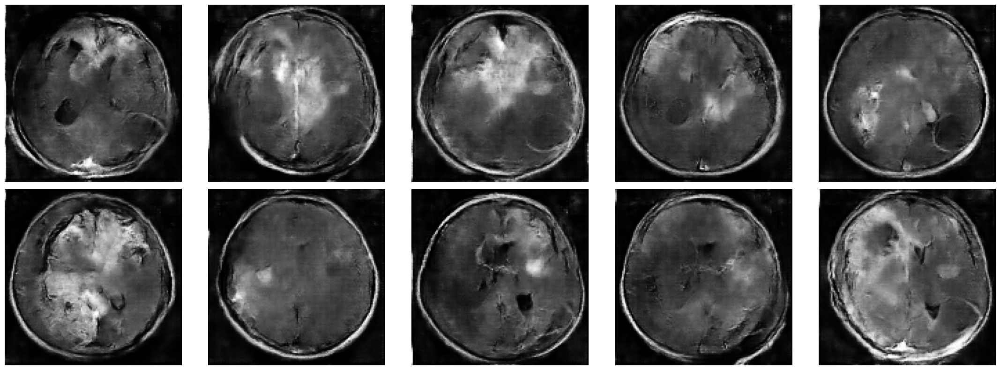

  0%|          | 0/3750 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


  0%|          | 1/3750 [00:00<16:59,  3.68it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 2/3750 [00:00<16:31,  3.78it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 3/3750 [00:00<14:59,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 4/3750 [00:01<15:29,  4.03it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 5/3750 [00:01<14:42,  4.25it/s]

1/1 [==============================] - 0s 37ms/step


  0%|          | 6/3750 [00:01<15:08,  4.12it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 7/3750 [00:01<14:14,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 8/3750 [00:01<13:34,  4.60it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 9/3750 [00:02<14:15,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 10/3750 [00:02<14:00,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 11/3750 [00:02<13:31,  4.61it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 12/3750 [00:02<13:54,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 13/3750 [00:03<14:25,  4.32it/s]

1/1 [==============================] - 0s 42ms/step


  0%|          | 14/3750 [00:03<14:15,  4.37it/s]

1/1 [==============================] - 0s 35ms/step


  0%|          | 15/3750 [00:03<13:58,  4.45it/s]

1/1 [==============================] - 0s 40ms/step


  0%|          | 16/3750 [00:03<14:29,  4.29it/s]

1/1 [==============================] - 0s 38ms/step


  0%|          | 17/3750 [00:03<14:50,  4.19it/s]

1/1 [==============================] - 0s 62ms/step


  0%|          | 18/3750 [00:04<15:45,  3.95it/s]

1/1 [==============================] - 0s 56ms/step


  1%|          | 19/3750 [00:04<16:13,  3.83it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 20/3750 [00:04<15:11,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 21/3750 [00:04<15:17,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 22/3750 [00:05<15:10,  4.10it/s]

1/1 [==============================] - 0s 49ms/step


  1%|          | 23/3750 [00:05<16:40,  3.73it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 24/3750 [00:05<16:55,  3.67it/s]

1/1 [==============================] - 0s 59ms/step


  1%|          | 25/3750 [00:06<16:33,  3.75it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 26/3750 [00:06<16:10,  3.84it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 27/3750 [00:06<16:39,  3.73it/s]

1/1 [==============================] - 0s 65ms/step


  1%|          | 28/3750 [00:06<17:07,  3.62it/s]

1/1 [==============================] - 0s 37ms/step


  1%|          | 29/3750 [00:07<17:08,  3.62it/s]

1/1 [==============================] - 0s 43ms/step


  1%|          | 30/3750 [00:07<16:56,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 31/3750 [00:07<16:00,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 32/3750 [00:07<15:39,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 33/3750 [00:08<15:00,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 34/3750 [00:08<14:59,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 35/3750 [00:08<14:29,  4.27it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 36/3750 [00:08<15:22,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 37/3750 [00:09<15:17,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 38/3750 [00:09<14:30,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 39/3750 [00:09<14:42,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 40/3750 [00:09<14:57,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 41/3750 [00:10<14:58,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 42/3750 [00:10<14:07,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 43/3750 [00:10<14:40,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 44/3750 [00:10<14:53,  4.15it/s]

1/1 [==============================] - 0s 41ms/step


  1%|          | 45/3750 [00:11<14:42,  4.20it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 46/3750 [00:11<15:07,  4.08it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 47/3750 [00:11<14:46,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 48/3750 [00:11<14:09,  4.36it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▏         | 49/3750 [00:11<14:07,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 50/3750 [00:12<14:32,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


  1%|▏         | 51/3750 [00:12<14:02,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


  1%|▏         | 52/3750 [00:12<14:25,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 53/3750 [00:12<14:45,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 54/3750 [00:13<14:19,  4.30it/s]

1/1 [==============================] - 0s 33ms/step


  1%|▏         | 55/3750 [00:13<14:12,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 56/3750 [00:13<13:51,  4.44it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 57/3750 [00:13<13:34,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 58/3750 [00:13<14:09,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 59/3750 [00:14<13:37,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 60/3750 [00:14<13:47,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 61/3750 [00:14<13:39,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 62/3750 [00:14<14:16,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 63/3750 [00:15<14:18,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 64/3750 [00:15<14:35,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 65/3750 [00:15<14:15,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 66/3750 [00:15<13:50,  4.44it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 67/3750 [00:16<14:13,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 68/3750 [00:16<13:39,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 69/3750 [00:16<13:54,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 70/3750 [00:16<13:45,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 71/3750 [00:16<14:04,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 72/3750 [00:17<14:16,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 73/3750 [00:17<14:31,  4.22it/s]

1/1 [==============================] - 0s 44ms/step


  2%|▏         | 74/3750 [00:17<14:27,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▏         | 75/3750 [00:17<15:07,  4.05it/s]

1/1 [==============================] - 0s 46ms/step


  2%|▏         | 76/3750 [00:18<15:28,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 77/3750 [00:18<14:52,  4.12it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 78/3750 [00:18<14:40,  4.17it/s]

1/1 [==============================] - 0s 60ms/step


  2%|▏         | 79/3750 [00:18<15:40,  3.90it/s]

1/1 [==============================] - 0s 57ms/step


  2%|▏         | 80/3750 [00:19<15:38,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 81/3750 [00:19<15:22,  3.98it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 82/3750 [00:19<14:54,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 83/3750 [00:19<14:18,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 84/3750 [00:20<14:03,  4.34it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▏         | 85/3750 [00:20<14:18,  4.27it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▏         | 86/3750 [00:20<14:21,  4.25it/s]

1/1 [==============================] - 0s 45ms/step


  2%|▏         | 87/3750 [00:20<15:15,  4.00it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▏         | 88/3750 [00:21<15:12,  4.01it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 89/3750 [00:21<14:46,  4.13it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▏         | 90/3750 [00:21<15:03,  4.05it/s]

1/1 [==============================] - 0s 64ms/step


  2%|▏         | 91/3750 [00:21<15:25,  3.95it/s]

1/1 [==============================] - 0s 46ms/step


  2%|▏         | 92/3750 [00:22<15:27,  3.95it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 93/3750 [00:22<15:27,  3.94it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 94/3750 [00:22<14:51,  4.10it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 95/3750 [00:22<14:40,  4.15it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 96/3750 [00:23<13:59,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 97/3750 [00:23<13:52,  4.39it/s]

1/1 [==============================] - 0s 42ms/step


  3%|▎         | 98/3750 [00:23<13:35,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 99/3750 [00:23<13:30,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 100/3750 [00:23<13:42,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 101/3750 [00:24<13:27,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 102/3750 [00:24<14:03,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 103/3750 [00:24<13:22,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 104/3750 [00:24<13:05,  4.64it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 105/3750 [00:25<12:56,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 106/3750 [00:25<12:57,  4.69it/s]

1/1 [==============================] - 0s 39ms/step


  3%|▎         | 107/3750 [00:25<12:52,  4.72it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 108/3750 [00:25<13:46,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 109/3750 [00:25<14:18,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 110/3750 [00:26<14:15,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 111/3750 [00:26<13:46,  4.40it/s]

1/1 [==============================] - 0s 43ms/step


  3%|▎         | 112/3750 [00:26<13:54,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 113/3750 [00:26<13:32,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 114/3750 [00:27<13:22,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 115/3750 [00:27<13:41,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 116/3750 [00:27<13:29,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 117/3750 [00:27<13:30,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 118/3750 [00:27<13:10,  4.59it/s]

1/1 [==============================] - 0s 48ms/step


  3%|▎         | 119/3750 [00:28<12:57,  4.67it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 120/3750 [00:28<13:01,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 121/3750 [00:28<13:35,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 122/3750 [00:28<13:30,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 123/3750 [00:29<13:24,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 124/3750 [00:29<13:06,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 125/3750 [00:29<12:51,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 126/3750 [00:29<13:09,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 127/3750 [00:29<12:34,  4.80it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 128/3750 [00:30<12:47,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 129/3750 [00:30<13:02,  4.63it/s]

1/1 [==============================] - 0s 39ms/step


  3%|▎         | 130/3750 [00:30<13:23,  4.51it/s]

1/1 [==============================] - 0s 39ms/step


  3%|▎         | 131/3750 [00:30<14:07,  4.27it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▎         | 132/3750 [00:31<13:52,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▎         | 133/3750 [00:31<13:37,  4.42it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▎         | 134/3750 [00:31<13:41,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 135/3750 [00:31<14:07,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 136/3750 [00:31<14:24,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 137/3750 [00:32<14:35,  4.13it/s]

1/1 [==============================] - 0s 38ms/step


  4%|▎         | 138/3750 [00:32<14:54,  4.04it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 139/3750 [00:32<14:09,  4.25it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▎         | 140/3750 [00:32<15:00,  4.01it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 141/3750 [00:33<14:43,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 142/3750 [00:33<14:23,  4.18it/s]

1/1 [==============================] - 0s 41ms/step


  4%|▍         | 143/3750 [00:33<15:10,  3.96it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▍         | 144/3750 [00:33<15:13,  3.95it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 145/3750 [00:34<14:36,  4.11it/s]

1/1 [==============================] - 0s 46ms/step


  4%|▍         | 146/3750 [00:34<15:24,  3.90it/s]

1/1 [==============================] - 0s 44ms/step


  4%|▍         | 147/3750 [00:34<15:20,  3.91it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▍         | 148/3750 [00:34<14:47,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 149/3750 [00:35<14:21,  4.18it/s]

1/1 [==============================] - 0s 52ms/step


  4%|▍         | 150/3750 [00:35<14:57,  4.01it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 151/3750 [00:35<14:30,  4.14it/s]

1/1 [==============================] - 0s 45ms/step


  4%|▍         | 152/3750 [00:35<14:36,  4.11it/s]

1/1 [==============================] - 0s 44ms/step


  4%|▍         | 153/3750 [00:36<14:31,  4.13it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▍         | 154/3750 [00:36<14:19,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 155/3750 [00:36<13:54,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 156/3750 [00:36<13:25,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 157/3750 [00:37<13:48,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 158/3750 [00:37<14:16,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 159/3750 [00:37<13:23,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 160/3750 [00:37<13:51,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 161/3750 [00:37<13:28,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 162/3750 [00:38<13:11,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 163/3750 [00:38<12:59,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 164/3750 [00:38<12:33,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 165/3750 [00:38<13:13,  4.52it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 166/3750 [00:39<13:30,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 167/3750 [00:39<13:24,  4.45it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 168/3750 [00:39<13:11,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 169/3750 [00:39<12:58,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 170/3750 [00:39<12:45,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 171/3750 [00:40<14:01,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 172/3750 [00:40<13:48,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 173/3750 [00:40<12:57,  4.60it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 174/3750 [00:40<12:19,  4.84it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 175/3750 [00:41<12:19,  4.83it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 176/3750 [00:41<12:06,  4.92it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▍         | 177/3750 [00:41<12:58,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 178/3750 [00:41<13:00,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 179/3750 [00:41<13:43,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 180/3750 [00:42<14:16,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 181/3750 [00:42<13:25,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 182/3750 [00:42<13:47,  4.31it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▍         | 183/3750 [00:42<13:38,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 184/3750 [00:43<12:51,  4.62it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▍         | 185/3750 [00:43<13:32,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 186/3750 [00:43<13:48,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 187/3750 [00:43<13:31,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 188/3750 [00:44<14:16,  4.16it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 189/3750 [00:44<14:18,  4.15it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 190/3750 [00:44<13:46,  4.31it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▌         | 191/3750 [00:44<14:11,  4.18it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▌         | 192/3750 [00:44<14:28,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 193/3750 [00:45<14:24,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 194/3750 [00:45<14:02,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 195/3750 [00:45<14:01,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 196/3750 [00:45<13:38,  4.34it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▌         | 197/3750 [00:46<14:24,  4.11it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 198/3750 [00:46<14:00,  4.23it/s]

1/1 [==============================] - 0s 46ms/step


  5%|▌         | 199/3750 [00:46<14:04,  4.20it/s]

1/1 [==============================] - 0s 61ms/step


  5%|▌         | 200/3750 [00:46<14:36,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 201/3750 [00:47<14:49,  3.99it/s]

1/1 [==============================] - 0s 55ms/step


  5%|▌         | 202/3750 [00:47<14:49,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 203/3750 [00:47<14:11,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 204/3750 [00:47<14:05,  4.19it/s]

1/1 [==============================] - 0s 40ms/step


  5%|▌         | 205/3750 [00:48<14:02,  4.21it/s]

1/1 [==============================] - 0s 55ms/step


  5%|▌         | 206/3750 [00:48<14:54,  3.96it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 207/3750 [00:48<14:14,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 208/3750 [00:48<14:24,  4.10it/s]

1/1 [==============================] - 0s 62ms/step


  6%|▌         | 209/3750 [00:49<14:45,  4.00it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 210/3750 [00:49<14:24,  4.09it/s]

1/1 [==============================] - 0s 46ms/step


  6%|▌         | 211/3750 [00:49<14:55,  3.95it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 212/3750 [00:49<15:14,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▌         | 213/3750 [00:50<15:15,  3.86it/s]

1/1 [==============================] - 0s 39ms/step


  6%|▌         | 214/3750 [00:50<15:44,  3.74it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 215/3750 [00:50<15:57,  3.69it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 216/3750 [00:50<15:36,  3.77it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 217/3750 [00:51<14:48,  3.98it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 218/3750 [00:51<14:40,  4.01it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 219/3750 [00:51<13:50,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 220/3750 [00:51<14:05,  4.17it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 221/3750 [00:52<13:38,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 222/3750 [00:52<13:00,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 223/3750 [00:52<12:55,  4.55it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▌         | 224/3750 [00:52<13:20,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 225/3750 [00:53<13:37,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 226/3750 [00:53<13:09,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 227/3750 [00:53<12:52,  4.56it/s]

1/1 [==============================] - 0s 53ms/step


  6%|▌         | 228/3750 [00:53<13:42,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 229/3750 [00:53<13:13,  4.44it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 230/3750 [00:54<13:16,  4.42it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 231/3750 [00:54<12:29,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 232/3750 [00:54<12:16,  4.77it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 233/3750 [00:54<12:13,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 234/3750 [00:54<12:04,  4.85it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▋         | 235/3750 [00:55<12:08,  4.82it/s]

1/1 [==============================] - 0s 41ms/step


  6%|▋         | 236/3750 [00:55<12:14,  4.79it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▋         | 237/3750 [00:55<12:13,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 238/3750 [00:55<12:41,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 239/3750 [00:56<12:52,  4.54it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▋         | 240/3750 [00:56<13:24,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 241/3750 [00:56<13:11,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 242/3750 [00:56<13:43,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 243/3750 [00:56<13:32,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 244/3750 [00:57<14:03,  4.16it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 245/3750 [00:57<13:30,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 246/3750 [00:57<12:58,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 247/3750 [00:57<13:28,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 248/3750 [00:58<13:03,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 249/3750 [00:58<12:47,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 250/3750 [00:58<13:16,  4.40it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 251/3750 [00:58<13:19,  4.38it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 252/3750 [00:58<13:06,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 253/3750 [00:59<13:35,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 254/3750 [00:59<13:49,  4.21it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 255/3750 [00:59<13:06,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 256/3750 [00:59<12:38,  4.61it/s]

1/1 [==============================] - 0s 47ms/step


  7%|▋         | 257/3750 [01:00<12:53,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 258/3750 [01:00<12:25,  4.69it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 259/3750 [01:00<12:21,  4.71it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 260/3750 [01:00<12:48,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 261/3750 [01:01<13:44,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 262/3750 [01:01<13:52,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 263/3750 [01:01<13:29,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 264/3750 [01:01<14:01,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 265/3750 [01:01<13:38,  4.26it/s]

1/1 [==============================] - 0s 49ms/step


  7%|▋         | 266/3750 [01:02<13:45,  4.22it/s]

1/1 [==============================] - 0s 48ms/step


  7%|▋         | 267/3750 [01:02<14:06,  4.11it/s]

1/1 [==============================] - 0s 53ms/step


  7%|▋         | 268/3750 [01:02<14:12,  4.08it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 269/3750 [01:02<13:53,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 270/3750 [01:03<13:59,  4.15it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 271/3750 [01:03<13:59,  4.14it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 272/3750 [01:03<14:27,  4.01it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 273/3750 [01:03<14:19,  4.05it/s]

1/1 [==============================] - 0s 48ms/step


  7%|▋         | 274/3750 [01:04<14:41,  3.94it/s]

1/1 [==============================] - 0s 51ms/step


  7%|▋         | 275/3750 [01:04<14:37,  3.96it/s]

1/1 [==============================] - 0s 58ms/step


  7%|▋         | 276/3750 [01:04<14:32,  3.98it/s]

1/1 [==============================] - 0s 44ms/step


  7%|▋         | 277/3750 [01:04<14:19,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 278/3750 [01:05<15:00,  3.85it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 279/3750 [01:05<14:57,  3.87it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 280/3750 [01:05<13:52,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 281/3750 [01:05<13:04,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 282/3750 [01:06<12:41,  4.55it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 283/3750 [01:06<13:32,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 284/3750 [01:06<13:47,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 285/3750 [01:06<13:15,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 286/3750 [01:07<13:12,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 287/3750 [01:07<12:51,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 288/3750 [01:07<12:35,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 289/3750 [01:07<12:42,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 290/3750 [01:07<12:25,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 291/3750 [01:08<12:58,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 292/3750 [01:08<12:49,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 293/3750 [01:08<12:18,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 294/3750 [01:08<12:05,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 295/3750 [01:08<12:06,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 296/3750 [01:09<12:19,  4.67it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 297/3750 [01:09<12:59,  4.43it/s]

1/1 [==============================] - 0s 41ms/step


  8%|▊         | 298/3750 [01:09<12:45,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 299/3750 [01:09<13:10,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 300/3750 [01:10<13:21,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 301/3750 [01:10<12:46,  4.50it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 302/3750 [01:10<12:59,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 303/3750 [01:10<13:25,  4.28it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 304/3750 [01:11<12:59,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 305/3750 [01:11<12:46,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 306/3750 [01:11<12:50,  4.47it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 307/3750 [01:11<12:28,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 308/3750 [01:11<12:59,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 309/3750 [01:12<13:15,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 310/3750 [01:12<13:12,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 311/3750 [01:12<12:48,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 312/3750 [01:12<12:25,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 313/3750 [01:12<11:52,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 314/3750 [01:13<12:48,  4.47it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 315/3750 [01:13<12:40,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 316/3750 [01:13<12:57,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 317/3750 [01:13<13:17,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 318/3750 [01:14<12:38,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 319/3750 [01:14<12:36,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 320/3750 [01:14<12:49,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▊         | 321/3750 [01:14<12:25,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 322/3750 [01:15<12:37,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 323/3750 [01:15<12:30,  4.57it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 324/3750 [01:15<12:13,  4.67it/s]

1/1 [==============================] - 0s 55ms/step


  9%|▊         | 325/3750 [01:15<13:12,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 326/3750 [01:15<13:40,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 327/3750 [01:16<13:25,  4.25it/s]

1/1 [==============================] - 0s 40ms/step


  9%|▊         | 328/3750 [01:16<13:18,  4.29it/s]

1/1 [==============================] - 0s 57ms/step


  9%|▉         | 329/3750 [01:16<13:57,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▉         | 330/3750 [01:16<14:24,  3.95it/s]

1/1 [==============================] - 0s 44ms/step


  9%|▉         | 331/3750 [01:17<14:08,  4.03it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 332/3750 [01:17<14:53,  3.83it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 333/3750 [01:17<14:38,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 334/3750 [01:17<14:13,  4.00it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 335/3750 [01:18<14:20,  3.97it/s]

1/1 [==============================] - 0s 64ms/step


  9%|▉         | 336/3750 [01:18<14:43,  3.87it/s]

1/1 [==============================] - 0s 60ms/step


  9%|▉         | 337/3750 [01:18<15:22,  3.70it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▉         | 338/3750 [01:19<14:42,  3.87it/s]

1/1 [==============================] - 0s 48ms/step


  9%|▉         | 339/3750 [01:19<14:18,  3.98it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 340/3750 [01:19<13:44,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 341/3750 [01:19<13:04,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 342/3750 [01:19<12:50,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 343/3750 [01:20<12:37,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 344/3750 [01:20<12:59,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 345/3750 [01:20<13:08,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 346/3750 [01:20<13:29,  4.20it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 347/3750 [01:21<13:44,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 348/3750 [01:21<14:11,  4.00it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 349/3750 [01:21<13:25,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 350/3750 [01:21<12:54,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 351/3750 [01:22<12:59,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 352/3750 [01:22<13:18,  4.26it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 353/3750 [01:22<13:07,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 354/3750 [01:22<12:47,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 355/3750 [01:22<12:13,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 356/3750 [01:23<12:34,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 357/3750 [01:23<12:29,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 358/3750 [01:23<12:39,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 359/3750 [01:23<13:10,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 360/3750 [01:24<12:51,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 361/3750 [01:24<12:23,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 362/3750 [01:24<12:06,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 363/3750 [01:24<12:23,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 364/3750 [01:24<12:02,  4.69it/s]

1/1 [==============================] - 0s 36ms/step


 10%|▉         | 365/3750 [01:25<12:43,  4.44it/s]

1/1 [==============================] - 0s 37ms/step


 10%|▉         | 366/3750 [01:25<12:58,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 367/3750 [01:25<13:18,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 368/3750 [01:25<12:46,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 369/3750 [01:26<12:22,  4.56it/s]

1/1 [==============================] - 0s 43ms/step


 10%|▉         | 370/3750 [01:26<12:13,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 371/3750 [01:26<11:55,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 372/3750 [01:26<12:22,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 373/3750 [01:26<12:47,  4.40it/s]

1/1 [==============================] - 0s 41ms/step


 10%|▉         | 374/3750 [01:27<13:19,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 375/3750 [01:27<13:08,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 376/3750 [01:27<13:05,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 377/3750 [01:27<13:15,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 378/3750 [01:28<12:42,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 379/3750 [01:28<12:24,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 380/3750 [01:28<12:44,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 381/3750 [01:28<12:20,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 382/3750 [01:28<12:18,  4.56it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 383/3750 [01:29<11:50,  4.74it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 384/3750 [01:29<11:42,  4.79it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 385/3750 [01:29<12:37,  4.44it/s]

1/1 [==============================] - 0s 42ms/step


 10%|█         | 386/3750 [01:29<12:26,  4.51it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 387/3750 [01:30<12:18,  4.56it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█         | 388/3750 [01:30<12:29,  4.49it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 389/3750 [01:30<12:01,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 390/3750 [01:30<11:50,  4.73it/s]

1/1 [==============================] - 0s 43ms/step


 10%|█         | 391/3750 [01:30<12:10,  4.60it/s]

1/1 [==============================] - 0s 37ms/step


 10%|█         | 392/3750 [01:31<13:29,  4.15it/s]

1/1 [==============================] - 0s 49ms/step


 10%|█         | 393/3750 [01:31<14:04,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 394/3750 [01:31<13:48,  4.05it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 395/3750 [01:31<13:08,  4.25it/s]

1/1 [==============================] - 0s 56ms/step


 11%|█         | 396/3750 [01:32<13:25,  4.16it/s]

1/1 [==============================] - 0s 54ms/step


 11%|█         | 397/3750 [01:32<14:27,  3.86it/s]

1/1 [==============================] - 0s 60ms/step


 11%|█         | 398/3750 [01:32<15:17,  3.65it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 399/3750 [01:33<15:23,  3.63it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█         | 400/3750 [01:33<15:17,  3.65it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 401/3750 [01:33<15:00,  3.72it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 402/3750 [01:33<14:09,  3.94it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 403/3750 [01:34<13:40,  4.08it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 404/3750 [01:34<13:03,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 405/3750 [01:34<12:31,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 406/3750 [01:34<12:09,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 407/3750 [01:34<12:26,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 408/3750 [01:35<12:47,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 409/3750 [01:35<13:11,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 410/3750 [01:35<13:19,  4.18it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█         | 411/3750 [01:35<13:18,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 412/3750 [01:36<12:44,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 413/3750 [01:36<13:02,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 414/3750 [01:36<12:24,  4.48it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 415/3750 [01:36<12:57,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 416/3750 [01:36<12:29,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 417/3750 [01:37<12:19,  4.51it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 418/3750 [01:37<12:12,  4.55it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 419/3750 [01:37<12:47,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 420/3750 [01:37<12:26,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 421/3750 [01:38<12:07,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 422/3750 [01:38<12:34,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 423/3750 [01:38<12:53,  4.30it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█▏        | 424/3750 [01:38<13:08,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 425/3750 [01:39<12:49,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 426/3750 [01:39<13:19,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 427/3750 [01:39<12:43,  4.35it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█▏        | 428/3750 [01:39<12:53,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 429/3750 [01:40<13:05,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 430/3750 [01:40<13:31,  4.09it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█▏        | 431/3750 [01:40<13:45,  4.02it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 432/3750 [01:40<12:56,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 433/3750 [01:40<12:38,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 434/3750 [01:41<12:51,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 435/3750 [01:41<12:59,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 436/3750 [01:41<12:58,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 437/3750 [01:41<13:02,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 438/3750 [01:42<13:00,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 439/3750 [01:42<12:36,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 440/3750 [01:42<12:11,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 441/3750 [01:42<12:07,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 442/3750 [01:42<12:01,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 443/3750 [01:43<12:15,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 444/3750 [01:43<11:53,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 445/3750 [01:43<11:47,  4.67it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█▏        | 446/3750 [01:43<12:16,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 447/3750 [01:44<12:13,  4.50it/s]

1/1 [==============================] - 0s 58ms/step


 12%|█▏        | 448/3750 [01:44<13:00,  4.23it/s]

1/1 [==============================] - 0s 58ms/step


 12%|█▏        | 449/3750 [01:44<13:37,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 450/3750 [01:44<13:12,  4.16it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 451/3750 [01:45<13:33,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 452/3750 [01:45<12:58,  4.24it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█▏        | 453/3750 [01:45<13:05,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 454/3750 [01:45<12:45,  4.30it/s]

1/1 [==============================] - 0s 56ms/step


 12%|█▏        | 455/3750 [01:46<13:04,  4.20it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 456/3750 [01:46<13:02,  4.21it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 457/3750 [01:46<13:05,  4.19it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 458/3750 [01:46<13:08,  4.17it/s]

1/1 [==============================] - 0s 50ms/step


 12%|█▏        | 459/3750 [01:47<13:36,  4.03it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 460/3750 [01:47<13:05,  4.19it/s]

1/1 [==============================] - 0s 58ms/step


 12%|█▏        | 461/3750 [01:47<13:49,  3.97it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█▏        | 462/3750 [01:47<13:30,  4.06it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 463/3750 [01:47<13:20,  4.11it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 464/3750 [01:48<12:59,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 465/3750 [01:48<13:15,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 466/3750 [01:48<12:53,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 467/3750 [01:48<12:22,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 468/3750 [01:49<12:14,  4.47it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 469/3750 [01:49<12:24,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 470/3750 [01:49<12:42,  4.30it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 471/3750 [01:49<12:49,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 472/3750 [01:50<12:06,  4.51it/s]

1/1 [==============================] - 0s 42ms/step


 13%|█▎        | 473/3750 [01:50<12:16,  4.45it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 474/3750 [01:50<12:55,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 475/3750 [01:50<13:00,  4.20it/s]

1/1 [==============================] - 0s 44ms/step


 13%|█▎        | 476/3750 [01:51<13:11,  4.14it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 477/3750 [01:51<12:53,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 478/3750 [01:51<12:28,  4.37it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 479/3750 [01:51<12:20,  4.42it/s]

1/1 [==============================] - 0s 42ms/step


 13%|█▎        | 480/3750 [01:51<12:51,  4.24it/s]

1/1 [==============================] - 0s 47ms/step


 13%|█▎        | 481/3750 [01:52<12:56,  4.21it/s]

1/1 [==============================] - 0s 57ms/step


 13%|█▎        | 482/3750 [01:52<13:45,  3.96it/s]

1/1 [==============================] - 0s 41ms/step


 13%|█▎        | 483/3750 [01:52<13:09,  4.14it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 484/3750 [01:52<12:43,  4.28it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 485/3750 [01:53<12:23,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 486/3750 [01:53<12:42,  4.28it/s]

1/1 [==============================] - 0s 44ms/step


 13%|█▎        | 487/3750 [01:53<13:14,  4.10it/s]

1/1 [==============================] - 0s 51ms/step


 13%|█▎        | 488/3750 [01:53<13:33,  4.01it/s]

1/1 [==============================] - 0s 59ms/step


 13%|█▎        | 489/3750 [01:54<13:27,  4.04it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 490/3750 [01:54<13:43,  3.96it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 491/3750 [01:54<13:31,  4.01it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 492/3750 [01:54<13:27,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 493/3750 [01:55<13:08,  4.13it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 494/3750 [01:55<13:14,  4.10it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 495/3750 [01:55<12:50,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 496/3750 [01:55<12:12,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 497/3750 [01:55<11:51,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 498/3750 [01:56<12:16,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 499/3750 [01:56<12:00,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 500/3750 [01:56<12:28,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 501/3750 [01:56<11:44,  4.61it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 502/3750 [01:57<12:25,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 503/3750 [01:57<12:12,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 504/3750 [01:57<12:40,  4.27it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 505/3750 [01:57<12:07,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 506/3750 [01:58<12:27,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▎        | 507/3750 [01:58<12:32,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 508/3750 [01:58<12:38,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 509/3750 [01:58<12:24,  4.36it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▎        | 510/3750 [01:58<12:35,  4.29it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▎        | 511/3750 [01:59<13:05,  4.12it/s]

1/1 [==============================] - 0s 54ms/step


 14%|█▎        | 512/3750 [01:59<14:12,  3.80it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▎        | 513/3750 [01:59<14:11,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▎        | 514/3750 [02:00<14:08,  3.81it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▎        | 515/3750 [02:00<13:30,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 516/3750 [02:00<12:52,  4.19it/s]

1/1 [==============================] - 0s 42ms/step


 14%|█▍        | 517/3750 [02:00<12:50,  4.20it/s]

1/1 [==============================] - 0s 42ms/step


 14%|█▍        | 518/3750 [02:00<12:53,  4.18it/s]

1/1 [==============================] - 0s 46ms/step


 14%|█▍        | 519/3750 [02:01<12:58,  4.15it/s]

1/1 [==============================] - 0s 42ms/step


 14%|█▍        | 520/3750 [02:01<14:09,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 521/3750 [02:01<14:18,  3.76it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 522/3750 [02:02<14:26,  3.72it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▍        | 523/3750 [02:02<14:24,  3.73it/s]

1/1 [==============================] - 0s 43ms/step


 14%|█▍        | 524/3750 [02:02<14:14,  3.78it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 525/3750 [02:02<13:13,  4.07it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 526/3750 [02:03<13:02,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 527/3750 [02:03<12:42,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 528/3750 [02:03<12:09,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 529/3750 [02:03<11:27,  4.68it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 530/3750 [02:03<11:07,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 531/3750 [02:04<11:28,  4.68it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 532/3750 [02:04<11:26,  4.69it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▍        | 533/3750 [02:04<11:23,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 534/3750 [02:04<11:11,  4.79it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 535/3750 [02:04<11:54,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 536/3750 [02:05<11:36,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 537/3750 [02:05<11:34,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 538/3750 [02:05<11:17,  4.74it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 539/3750 [02:05<11:50,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 540/3750 [02:06<11:29,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 541/3750 [02:06<11:51,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 542/3750 [02:06<11:42,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 543/3750 [02:06<11:22,  4.70it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▍        | 544/3750 [02:06<11:21,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 545/3750 [02:07<11:03,  4.83it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 546/3750 [02:07<11:22,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 547/3750 [02:07<11:58,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 548/3750 [02:07<11:43,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 549/3750 [02:07<11:40,  4.57it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▍        | 550/3750 [02:08<11:18,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 551/3750 [02:08<10:57,  4.87it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 552/3750 [02:08<10:56,  4.87it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 553/3750 [02:08<10:43,  4.97it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 554/3750 [02:09<11:31,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 555/3750 [02:09<12:21,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 556/3750 [02:09<12:01,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 557/3750 [02:09<11:44,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 558/3750 [02:09<11:25,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 559/3750 [02:10<11:25,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 560/3750 [02:10<11:17,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 561/3750 [02:10<10:52,  4.89it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 562/3750 [02:10<11:41,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 563/3750 [02:10<11:37,  4.57it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 564/3750 [02:11<12:26,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 565/3750 [02:11<12:22,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 566/3750 [02:11<12:33,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 567/3750 [02:11<11:39,  4.55it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 568/3750 [02:12<11:33,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 569/3750 [02:12<11:09,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 570/3750 [02:12<11:50,  4.48it/s]

1/1 [==============================] - 0s 46ms/step


 15%|█▌        | 571/3750 [02:12<12:24,  4.27it/s]

1/1 [==============================] - 0s 42ms/step


 15%|█▌        | 572/3750 [02:13<12:59,  4.07it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 573/3750 [02:13<13:08,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▌        | 574/3750 [02:13<13:33,  3.90it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 575/3750 [02:13<12:53,  4.10it/s]

1/1 [==============================] - 0s 42ms/step


 15%|█▌        | 576/3750 [02:14<12:34,  4.21it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▌        | 577/3750 [02:14<13:05,  4.04it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 578/3750 [02:14<13:22,  3.95it/s]

1/1 [==============================] - 0s 41ms/step


 15%|█▌        | 579/3750 [02:14<12:49,  4.12it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▌        | 580/3750 [02:15<12:32,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 581/3750 [02:15<12:23,  4.26it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 582/3750 [02:15<13:27,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 583/3750 [02:15<13:03,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 584/3750 [02:16<12:29,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 585/3750 [02:16<12:39,  4.17it/s]

1/1 [==============================] - 0s 47ms/step


 16%|█▌        | 586/3750 [02:16<13:16,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 587/3750 [02:16<13:34,  3.88it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 588/3750 [02:17<12:35,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 589/3750 [02:17<12:12,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 590/3750 [02:17<11:53,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 591/3750 [02:17<12:16,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 592/3750 [02:17<12:34,  4.19it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 593/3750 [02:18<12:30,  4.20it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 594/3750 [02:18<12:15,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 595/3750 [02:18<11:41,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 596/3750 [02:18<11:23,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 597/3750 [02:19<11:27,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 598/3750 [02:19<11:20,  4.63it/s]

1/1 [==============================] - 0s 42ms/step


 16%|█▌        | 599/3750 [02:19<11:55,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 600/3750 [02:19<11:59,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 601/3750 [02:19<11:30,  4.56it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 602/3750 [02:20<11:14,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 603/3750 [02:20<11:39,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 604/3750 [02:20<11:52,  4.41it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 605/3750 [02:20<11:46,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 606/3750 [02:21<12:15,  4.27it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 607/3750 [02:21<11:42,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 608/3750 [02:21<11:42,  4.47it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 609/3750 [02:21<12:14,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 610/3750 [02:21<12:14,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▋        | 611/3750 [02:22<11:46,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 612/3750 [02:22<11:17,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 613/3750 [02:22<11:55,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 614/3750 [02:22<12:10,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 615/3750 [02:23<11:50,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 616/3750 [02:23<12:12,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 617/3750 [02:23<11:40,  4.47it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 618/3750 [02:23<12:01,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 619/3750 [02:24<12:17,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 620/3750 [02:24<11:47,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 621/3750 [02:24<11:27,  4.55it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 622/3750 [02:24<11:46,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 623/3750 [02:24<11:39,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 624/3750 [02:25<11:31,  4.52it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 625/3750 [02:25<11:47,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 626/3750 [02:25<11:33,  4.51it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 627/3750 [02:25<11:59,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 628/3750 [02:26<12:07,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 629/3750 [02:26<12:11,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 630/3750 [02:26<12:08,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 631/3750 [02:26<12:34,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 632/3750 [02:27<12:46,  4.07it/s]

1/1 [==============================] - 0s 45ms/step


 17%|█▋        | 633/3750 [02:27<13:23,  3.88it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 634/3750 [02:27<13:03,  3.98it/s]

1/1 [==============================] - 0s 41ms/step


 17%|█▋        | 635/3750 [02:27<12:41,  4.09it/s]

1/1 [==============================] - 0s 41ms/step


 17%|█▋        | 636/3750 [02:28<13:18,  3.90it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█▋        | 637/3750 [02:28<13:04,  3.97it/s]

1/1 [==============================] - 0s 54ms/step


 17%|█▋        | 638/3750 [02:28<12:58,  4.00it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█▋        | 639/3750 [02:28<13:09,  3.94it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█▋        | 640/3750 [02:29<12:52,  4.02it/s]

1/1 [==============================] - 0s 45ms/step


 17%|█▋        | 641/3750 [02:29<13:23,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 642/3750 [02:29<12:50,  4.03it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 643/3750 [02:29<13:00,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 644/3750 [02:30<13:21,  3.88it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 645/3750 [02:30<13:04,  3.96it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 646/3750 [02:30<12:30,  4.13it/s]

1/1 [==============================] - 0s 45ms/step


 17%|█▋        | 647/3750 [02:30<12:25,  4.16it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 648/3750 [02:30<11:43,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 649/3750 [02:31<11:39,  4.43it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 650/3750 [02:31<12:01,  4.30it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 651/3750 [02:31<12:29,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 652/3750 [02:31<12:45,  4.05it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 653/3750 [02:32<12:35,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 654/3750 [02:32<12:51,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 655/3750 [02:32<12:46,  4.04it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 656/3750 [02:32<12:00,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 657/3750 [02:33<11:26,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 658/3750 [02:33<11:10,  4.61it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 659/3750 [02:33<11:03,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 660/3750 [02:33<10:56,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 661/3750 [02:33<10:41,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 662/3750 [02:34<11:04,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 663/3750 [02:34<11:08,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 664/3750 [02:34<11:18,  4.55it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 665/3750 [02:34<11:29,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 666/3750 [02:35<11:02,  4.65it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 667/3750 [02:35<10:42,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 668/3750 [02:35<10:24,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 669/3750 [02:35<10:22,  4.95it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 670/3750 [02:35<11:02,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 671/3750 [02:36<11:11,  4.59it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 672/3750 [02:36<11:20,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 673/3750 [02:36<11:13,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 674/3750 [02:36<11:18,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 675/3750 [02:37<11:38,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 676/3750 [02:37<11:48,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 677/3750 [02:37<11:26,  4.47it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 678/3750 [02:37<12:12,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 679/3750 [02:37<12:23,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 680/3750 [02:38<11:47,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 681/3750 [02:38<11:46,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 682/3750 [02:38<11:28,  4.45it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 683/3750 [02:38<11:03,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 684/3750 [02:39<10:52,  4.70it/s]

1/1 [==============================] - 0s 50ms/step


 18%|█▊        | 685/3750 [02:39<10:57,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 686/3750 [02:39<10:41,  4.77it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 687/3750 [02:39<10:37,  4.81it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 688/3750 [02:39<10:45,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 689/3750 [02:40<10:58,  4.65it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 690/3750 [02:40<11:49,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 691/3750 [02:40<11:40,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 692/3750 [02:40<11:21,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 693/3750 [02:41<11:31,  4.42it/s]

1/1 [==============================] - 0s 53ms/step


 19%|█▊        | 694/3750 [02:41<12:36,  4.04it/s]

1/1 [==============================] - 0s 53ms/step


 19%|█▊        | 695/3750 [02:41<12:37,  4.03it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 696/3750 [02:41<12:10,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 697/3750 [02:42<11:47,  4.31it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▊        | 698/3750 [02:42<12:25,  4.10it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▊        | 699/3750 [02:42<12:37,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▊        | 700/3750 [02:42<12:20,  4.12it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 701/3750 [02:42<11:59,  4.23it/s]

1/1 [==============================] - 0s 58ms/step


 19%|█▊        | 702/3750 [02:43<12:31,  4.06it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▊        | 703/3750 [02:43<12:28,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 704/3750 [02:43<12:39,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 705/3750 [02:43<12:12,  4.16it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▉        | 706/3750 [02:44<12:43,  3.98it/s]

1/1 [==============================] - 0s 56ms/step


 19%|█▉        | 707/3750 [02:44<13:30,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 708/3750 [02:44<13:19,  3.80it/s]

1/1 [==============================] - 0s 46ms/step


 19%|█▉        | 709/3750 [02:45<12:51,  3.94it/s]

1/1 [==============================] - 0s 46ms/step


 19%|█▉        | 710/3750 [02:45<13:25,  3.78it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 711/3750 [02:45<12:57,  3.91it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 712/3750 [02:45<12:24,  4.08it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 713/3750 [02:45<11:48,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 714/3750 [02:46<11:59,  4.22it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 715/3750 [02:46<11:32,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 716/3750 [02:46<12:08,  4.17it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 717/3750 [02:46<12:15,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 718/3750 [02:47<11:49,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 719/3750 [02:47<11:23,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 720/3750 [02:47<11:05,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 721/3750 [02:47<10:51,  4.65it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 722/3750 [02:48<11:11,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 723/3750 [02:48<11:02,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 724/3750 [02:48<11:28,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 725/3750 [02:48<11:58,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 726/3750 [02:48<12:04,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 727/3750 [02:49<11:33,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 728/3750 [02:49<11:09,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 729/3750 [02:49<11:23,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 730/3750 [02:49<11:37,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 731/3750 [02:50<11:15,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 732/3750 [02:50<11:11,  4.50it/s]

1/1 [==============================] - 0s 38ms/step


 20%|█▉        | 733/3750 [02:50<10:48,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 734/3750 [02:50<10:29,  4.79it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 735/3750 [02:50<10:05,  4.98it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 736/3750 [02:51<10:09,  4.95it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 737/3750 [02:51<10:38,  4.72it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 738/3750 [02:51<10:29,  4.79it/s]

1/1 [==============================] - 0s 36ms/step


 20%|█▉        | 739/3750 [02:51<11:11,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 740/3750 [02:52<11:38,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 741/3750 [02:52<11:14,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 742/3750 [02:52<11:26,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 743/3750 [02:52<11:16,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 744/3750 [02:52<11:46,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 745/3750 [02:53<11:26,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 746/3750 [02:53<11:36,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 747/3750 [02:53<11:30,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 748/3750 [02:53<11:13,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 749/3750 [02:54<11:07,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 750/3750 [02:54<11:21,  4.40it/s]

1/1 [==============================] - 0s 39ms/step


 20%|██        | 751/3750 [02:54<11:12,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 752/3750 [02:54<10:52,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 753/3750 [02:54<11:17,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 754/3750 [02:55<11:02,  4.52it/s]

1/1 [==============================] - 0s 43ms/step


 20%|██        | 755/3750 [02:55<10:58,  4.55it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 756/3750 [02:55<12:03,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 757/3750 [02:55<12:23,  4.02it/s]

1/1 [==============================] - 0s 42ms/step


 20%|██        | 758/3750 [02:56<12:17,  4.06it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 759/3750 [02:56<11:37,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 760/3750 [02:56<11:29,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 761/3750 [02:56<11:54,  4.19it/s]

1/1 [==============================] - 0s 47ms/step


 20%|██        | 762/3750 [02:57<12:39,  3.94it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 763/3750 [02:57<12:24,  4.01it/s]

1/1 [==============================] - 0s 45ms/step


 20%|██        | 764/3750 [02:57<12:19,  4.04it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 765/3750 [02:57<12:42,  3.91it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 766/3750 [02:58<12:48,  3.88it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 767/3750 [02:58<12:38,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 20%|██        | 768/3750 [02:58<12:18,  4.04it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 769/3750 [02:58<11:51,  4.19it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██        | 770/3750 [02:59<12:31,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 771/3750 [02:59<12:38,  3.93it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 772/3750 [02:59<12:17,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 773/3750 [02:59<12:22,  4.01it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 774/3750 [03:00<11:37,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 775/3750 [03:00<11:23,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 776/3750 [03:00<11:03,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 777/3750 [03:00<11:16,  4.40it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 778/3750 [03:00<10:44,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 779/3750 [03:01<10:45,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 780/3750 [03:01<11:01,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 781/3750 [03:01<10:46,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 782/3750 [03:01<10:18,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 783/3750 [03:02<10:06,  4.89it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 784/3750 [03:02<10:08,  4.87it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 785/3750 [03:02<10:11,  4.85it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 786/3750 [03:02<10:46,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 787/3750 [03:02<10:43,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 788/3750 [03:03<10:17,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 789/3750 [03:03<10:02,  4.91it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 790/3750 [03:03<10:20,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 791/3750 [03:03<10:48,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 792/3750 [03:03<10:34,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 793/3750 [03:04<10:42,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 794/3750 [03:04<10:20,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 795/3750 [03:04<10:46,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 796/3750 [03:04<10:25,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 797/3750 [03:05<10:29,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 798/3750 [03:05<10:32,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 799/3750 [03:05<10:29,  4.69it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██▏       | 800/3750 [03:05<11:01,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 801/3750 [03:05<11:21,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 802/3750 [03:06<11:31,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 803/3750 [03:06<11:14,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 804/3750 [03:06<10:53,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 805/3750 [03:06<11:19,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 806/3750 [03:07<10:45,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 807/3750 [03:07<11:09,  4.40it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 808/3750 [03:07<10:52,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 809/3750 [03:07<10:36,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 810/3750 [03:07<10:52,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 811/3750 [03:08<10:21,  4.73it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 812/3750 [03:08<10:43,  4.57it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 813/3750 [03:08<10:35,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 814/3750 [03:08<10:05,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 815/3750 [03:08<10:09,  4.81it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 816/3750 [03:09<10:13,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 817/3750 [03:09<10:07,  4.83it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 818/3750 [03:09<10:45,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 819/3750 [03:09<10:22,  4.71it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 820/3750 [03:10<10:23,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 821/3750 [03:10<10:20,  4.72it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 822/3750 [03:10<10:47,  4.52it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 823/3750 [03:10<11:33,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 824/3750 [03:10<11:16,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 825/3750 [03:11<11:40,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 826/3750 [03:11<12:05,  4.03it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 827/3750 [03:11<12:10,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 828/3750 [03:11<11:42,  4.16it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 829/3750 [03:12<11:49,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 830/3750 [03:12<12:02,  4.04it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 831/3750 [03:12<12:09,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 832/3750 [03:13<12:23,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 833/3750 [03:13<22:10,  2.19it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 834/3750 [03:14<19:46,  2.46it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 835/3750 [03:14<17:42,  2.74it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 836/3750 [03:14<15:28,  3.14it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 837/3750 [03:14<14:12,  3.42it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 838/3750 [03:15<13:21,  3.63it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 839/3750 [03:15<12:58,  3.74it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 840/3750 [03:15<12:11,  3.98it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 841/3750 [03:15<11:36,  4.17it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 842/3750 [03:16<11:32,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 843/3750 [03:16<11:19,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 844/3750 [03:16<11:05,  4.37it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 845/3750 [03:16<10:50,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 846/3750 [03:16<11:12,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 847/3750 [03:17<11:04,  4.37it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 848/3750 [03:17<11:17,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 849/3750 [03:17<11:42,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 850/3750 [03:17<12:17,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 851/3750 [03:18<11:39,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 852/3750 [03:18<11:49,  4.08it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 853/3750 [03:18<11:26,  4.22it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 854/3750 [03:18<11:00,  4.38it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 855/3750 [03:19<11:02,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 856/3750 [03:19<10:50,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 857/3750 [03:19<10:40,  4.52it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 858/3750 [03:19<10:42,  4.50it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 859/3750 [03:20<11:12,  4.30it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 860/3750 [03:20<11:21,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 861/3750 [03:20<10:59,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 862/3750 [03:20<10:54,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 863/3750 [03:20<10:56,  4.40it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 864/3750 [03:21<11:08,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 865/3750 [03:21<11:42,  4.11it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 866/3750 [03:21<11:51,  4.05it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 867/3750 [03:21<11:59,  4.01it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 868/3750 [03:22<12:06,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 869/3750 [03:22<11:47,  4.07it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 870/3750 [03:22<11:30,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 871/3750 [03:22<11:04,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 872/3750 [03:23<10:51,  4.42it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 873/3750 [03:23<10:59,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 874/3750 [03:23<10:55,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 875/3750 [03:23<10:43,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 876/3750 [03:23<10:11,  4.70it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 877/3750 [03:24<10:22,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 878/3750 [03:24<10:32,  4.54it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 879/3750 [03:24<10:33,  4.54it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 880/3750 [03:24<10:47,  4.43it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 881/3750 [03:25<11:27,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▎       | 882/3750 [03:25<11:29,  4.16it/s]

1/1 [==============================] - 0s 46ms/step


 24%|██▎       | 883/3750 [03:25<11:29,  4.16it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▎       | 884/3750 [03:25<11:24,  4.19it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▎       | 885/3750 [03:26<12:08,  3.93it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▎       | 886/3750 [03:26<12:47,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 887/3750 [03:26<12:14,  3.90it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▎       | 888/3750 [03:26<12:18,  3.88it/s]

1/1 [==============================] - 0s 61ms/step


 24%|██▎       | 889/3750 [03:27<12:49,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 890/3750 [03:27<12:17,  3.88it/s]

1/1 [==============================] - 0s 63ms/step


 24%|██▍       | 891/3750 [03:27<13:00,  3.66it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 892/3750 [03:28<12:25,  3.83it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 893/3750 [03:28<12:06,  3.94it/s]

1/1 [==============================] - 0s 72ms/step


 24%|██▍       | 894/3750 [03:28<12:58,  3.67it/s]

1/1 [==============================] - 0s 64ms/step


 24%|██▍       | 895/3750 [03:28<13:15,  3.59it/s]

1/1 [==============================] - 0s 62ms/step


 24%|██▍       | 896/3750 [03:29<13:47,  3.45it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 897/3750 [03:29<12:43,  3.74it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 898/3750 [03:29<12:24,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 899/3750 [03:29<11:57,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 900/3750 [03:30<11:50,  4.01it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 901/3750 [03:30<11:28,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 902/3750 [03:30<11:08,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 903/3750 [03:30<10:48,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 904/3750 [03:30<10:56,  4.34it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 905/3750 [03:31<10:34,  4.48it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 906/3750 [03:31<11:12,  4.23it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▍       | 907/3750 [03:31<11:06,  4.27it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 908/3750 [03:31<10:38,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 909/3750 [03:32<11:06,  4.26it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 910/3750 [03:32<10:49,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 911/3750 [03:32<11:03,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 912/3750 [03:32<11:06,  4.26it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 913/3750 [03:33<11:28,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 914/3750 [03:33<10:56,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 915/3750 [03:33<11:27,  4.12it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 916/3750 [03:33<11:41,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 917/3750 [03:34<11:27,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 918/3750 [03:34<11:23,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 919/3750 [03:34<11:31,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 920/3750 [03:34<11:21,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 921/3750 [03:35<11:14,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 922/3750 [03:35<11:49,  3.99it/s]

1/1 [==============================] - 0s 46ms/step


 25%|██▍       | 923/3750 [03:35<11:52,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 924/3750 [03:35<11:45,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 925/3750 [03:36<11:17,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 926/3750 [03:36<11:12,  4.20it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▍       | 927/3750 [03:36<11:35,  4.06it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 928/3750 [03:36<11:19,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 929/3750 [03:37<11:31,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 930/3750 [03:37<11:27,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 931/3750 [03:37<11:49,  3.97it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 932/3750 [03:37<11:13,  4.18it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▍       | 933/3750 [03:37<11:35,  4.05it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▍       | 934/3750 [03:38<11:24,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 935/3750 [03:38<11:05,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 936/3750 [03:38<10:33,  4.44it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 937/3750 [03:38<10:21,  4.53it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▌       | 938/3750 [03:39<10:38,  4.40it/s]

1/1 [==============================] - 0s 60ms/step


 25%|██▌       | 939/3750 [03:39<11:34,  4.05it/s]

1/1 [==============================] - 0s 45ms/step


 25%|██▌       | 940/3750 [03:39<11:48,  3.97it/s]

1/1 [==============================] - 0s 60ms/step


 25%|██▌       | 941/3750 [03:39<12:07,  3.86it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 942/3750 [03:40<12:26,  3.76it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 943/3750 [03:40<12:21,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 944/3750 [03:40<11:55,  3.92it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▌       | 945/3750 [03:40<11:41,  4.00it/s]

1/1 [==============================] - 0s 50ms/step


 25%|██▌       | 946/3750 [03:41<11:37,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 947/3750 [03:41<11:54,  3.93it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 948/3750 [03:41<11:37,  4.02it/s]

1/1 [==============================] - 0s 47ms/step


 25%|██▌       | 949/3750 [03:41<11:57,  3.90it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 950/3750 [03:42<12:16,  3.80it/s]

1/1 [==============================] - 0s 43ms/step


 25%|██▌       | 951/3750 [03:42<12:06,  3.85it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▌       | 952/3750 [03:42<12:24,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▌       | 953/3750 [03:43<12:33,  3.71it/s]

1/1 [==============================] - 0s 65ms/step


 25%|██▌       | 954/3750 [03:43<12:24,  3.75it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 955/3750 [03:43<12:18,  3.78it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 956/3750 [03:43<12:09,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 957/3750 [03:44<12:05,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 958/3750 [03:44<12:06,  3.84it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 959/3750 [03:44<12:06,  3.84it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 960/3750 [03:44<11:29,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 961/3750 [03:45<10:55,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 962/3750 [03:45<11:23,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 963/3750 [03:45<10:47,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 964/3750 [03:45<10:20,  4.49it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 965/3750 [03:45<10:36,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 966/3750 [03:46<11:04,  4.19it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 967/3750 [03:46<10:56,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 968/3750 [03:46<10:18,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 969/3750 [03:46<10:09,  4.56it/s]

1/1 [==============================] - 0s 54ms/step


 26%|██▌       | 970/3750 [03:47<10:35,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 971/3750 [03:47<10:03,  4.61it/s]

1/1 [==============================] - 0s 43ms/step


 26%|██▌       | 972/3750 [03:47<10:42,  4.32it/s]

1/1 [==============================] - 0s 47ms/step


 26%|██▌       | 973/3750 [03:47<10:26,  4.43it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 974/3750 [03:47<10:24,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 975/3750 [03:48<10:07,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 976/3750 [03:48<10:10,  4.55it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 977/3750 [03:48<10:27,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 978/3750 [03:48<10:12,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 979/3750 [03:49<10:30,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 980/3750 [03:49<10:34,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 981/3750 [03:49<10:48,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 982/3750 [03:49<10:49,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 983/3750 [03:50<10:24,  4.43it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 984/3750 [03:50<10:49,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 985/3750 [03:50<10:57,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 986/3750 [03:50<10:23,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 987/3750 [03:50<10:19,  4.46it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▋       | 988/3750 [03:51<10:19,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 989/3750 [03:51<10:34,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 990/3750 [03:51<10:24,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 991/3750 [03:51<10:18,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 992/3750 [03:52<10:20,  4.45it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 993/3750 [03:52<10:11,  4.51it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 994/3750 [03:52<10:45,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 995/3750 [03:52<11:10,  4.11it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 996/3750 [03:53<10:54,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 997/3750 [03:53<11:01,  4.16it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 998/3750 [03:53<11:22,  4.03it/s]

1/1 [==============================] - 0s 64ms/step


 27%|██▋       | 999/3750 [03:53<11:48,  3.88it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 1000/3750 [03:54<11:54,  3.85it/s]

1/1 [==============================] - 0s 60ms/step


 27%|██▋       | 1001/3750 [03:54<11:54,  3.85it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 1002/3750 [03:54<11:59,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 1003/3750 [03:54<12:05,  3.78it/s]

1/1 [==============================] - 0s 72ms/step


 27%|██▋       | 1004/3750 [03:55<12:10,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 1005/3750 [03:55<12:26,  3.68it/s]

1/1 [==============================] - 0s 61ms/step


 27%|██▋       | 1006/3750 [03:55<12:36,  3.63it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 1007/3750 [03:55<12:21,  3.70it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 1008/3750 [03:56<12:01,  3.80it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 1009/3750 [03:56<11:24,  4.00it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 1010/3750 [03:56<11:39,  3.92it/s]

1/1 [==============================] - 0s 58ms/step


 27%|██▋       | 1011/3750 [03:56<11:50,  3.86it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 1012/3750 [03:57<12:18,  3.71it/s]

1/1 [==============================] - 0s 49ms/step


 27%|██▋       | 1013/3750 [03:57<12:17,  3.71it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 1014/3750 [03:57<11:52,  3.84it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 1015/3750 [03:58<11:51,  3.84it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 1016/3750 [03:58<11:11,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 1017/3750 [03:58<11:08,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 1018/3750 [03:58<11:10,  4.08it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 1019/3750 [03:58<10:32,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 1020/3750 [03:59<10:25,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 1021/3750 [03:59<09:59,  4.55it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 1022/3750 [03:59<10:19,  4.41it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 1023/3750 [03:59<10:28,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 1024/3750 [04:00<10:42,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 1025/3750 [04:00<10:29,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 1026/3750 [04:00<10:11,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 1027/3750 [04:00<09:52,  4.60it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 1028/3750 [04:00<09:43,  4.66it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 1029/3750 [04:01<09:51,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 1030/3750 [04:01<09:55,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 1031/3750 [04:01<10:14,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 1032/3750 [04:01<10:03,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 1033/3750 [04:02<10:29,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1034/3750 [04:02<10:35,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 1035/3750 [04:02<10:51,  4.17it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1036/3750 [04:02<10:39,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 1037/3750 [04:03<10:54,  4.15it/s]

1/1 [==============================] - 0s 47ms/step


 28%|██▊       | 1038/3750 [04:03<10:53,  4.15it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1039/3750 [04:03<10:37,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1040/3750 [04:03<10:11,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1041/3750 [04:03<10:29,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1042/3750 [04:04<10:08,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 1043/3750 [04:04<10:34,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1044/3750 [04:04<10:47,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 1045/3750 [04:04<10:28,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 1046/3750 [04:05<10:56,  4.12it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 1047/3750 [04:05<11:18,  3.98it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1048/3750 [04:05<11:30,  3.91it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 1049/3750 [04:05<11:27,  3.93it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 1050/3750 [04:06<11:12,  4.01it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 1051/3750 [04:06<10:59,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 1052/3750 [04:06<10:34,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1053/3750 [04:06<10:14,  4.39it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 1054/3750 [04:07<10:05,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 1055/3750 [04:07<10:36,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 1056/3750 [04:07<10:16,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1057/3750 [04:07<10:48,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 1058/3750 [04:08<10:22,  4.32it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 1059/3750 [04:08<10:29,  4.27it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 1060/3750 [04:08<11:22,  3.94it/s]

1/1 [==============================] - 0s 49ms/step


 28%|██▊       | 1061/3750 [04:08<11:07,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 1062/3750 [04:09<10:48,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 1063/3750 [04:09<10:37,  4.21it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 1064/3750 [04:09<10:56,  4.09it/s]

1/1 [==============================] - 0s 39ms/step


 28%|██▊       | 1065/3750 [04:09<11:09,  4.01it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 1066/3750 [04:10<11:24,  3.92it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 1067/3750 [04:10<11:07,  4.02it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 1068/3750 [04:10<11:14,  3.98it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▊       | 1069/3750 [04:10<11:21,  3.93it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▊       | 1070/3750 [04:11<11:05,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▊       | 1071/3750 [04:11<11:12,  3.98it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▊       | 1072/3750 [04:11<10:55,  4.09it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▊       | 1073/3750 [04:11<11:23,  3.92it/s]

1/1 [==============================] - 0s 60ms/step


 29%|██▊       | 1074/3750 [04:12<11:14,  3.97it/s]

1/1 [==============================] - 0s 47ms/step


 29%|██▊       | 1075/3750 [04:12<11:55,  3.74it/s]

1/1 [==============================] - 0s 47ms/step


 29%|██▊       | 1076/3750 [04:12<12:19,  3.62it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▊       | 1077/3750 [04:12<12:35,  3.54it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▊       | 1078/3750 [04:13<12:36,  3.53it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▉       | 1079/3750 [04:13<12:12,  3.65it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▉       | 1080/3750 [04:13<11:49,  3.76it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 1081/3750 [04:13<11:37,  3.83it/s]

1/1 [==============================] - 0s 56ms/step


 29%|██▉       | 1082/3750 [04:14<11:34,  3.84it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 1083/3750 [04:14<10:32,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 1084/3750 [04:14<10:19,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1085/3750 [04:14<10:15,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 1086/3750 [04:15<10:19,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 1087/3750 [04:15<10:03,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 1088/3750 [04:15<09:49,  4.51it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 1089/3750 [04:15<10:03,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 1090/3750 [04:16<10:03,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 1091/3750 [04:16<10:10,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 1092/3750 [04:16<10:13,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 1093/3750 [04:16<10:24,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 1094/3750 [04:16<10:06,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 1095/3750 [04:17<09:49,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1096/3750 [04:17<09:33,  4.62it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 1097/3750 [04:17<09:45,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1098/3750 [04:17<09:45,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1099/3750 [04:17<09:27,  4.67it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 1100/3750 [04:18<10:06,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1101/3750 [04:18<09:48,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 1102/3750 [04:18<09:28,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 1103/3750 [04:18<09:32,  4.62it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 1104/3750 [04:19<09:55,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1105/3750 [04:19<10:13,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1106/3750 [04:19<10:01,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 1107/3750 [04:19<09:40,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1108/3750 [04:20<09:55,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1109/3750 [04:20<10:02,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 1110/3750 [04:20<10:09,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 1111/3750 [04:20<10:32,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1112/3750 [04:21<10:39,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 1113/3750 [04:21<10:38,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1114/3750 [04:21<10:38,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1115/3750 [04:21<10:07,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1116/3750 [04:21<10:12,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 1117/3750 [04:22<09:49,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1118/3750 [04:22<09:53,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1119/3750 [04:22<09:28,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1120/3750 [04:22<09:37,  4.55it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 1121/3750 [04:23<09:54,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1122/3750 [04:23<09:37,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1123/3750 [04:23<09:31,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 1124/3750 [04:23<09:52,  4.43it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 1125/3750 [04:23<10:15,  4.26it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 1126/3750 [04:24<10:18,  4.24it/s]

1/1 [==============================] - 0s 44ms/step


 30%|███       | 1127/3750 [04:24<10:10,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 1128/3750 [04:24<10:17,  4.25it/s]

1/1 [==============================] - 0s 49ms/step


 30%|███       | 1129/3750 [04:24<11:09,  3.92it/s]

1/1 [==============================] - 0s 48ms/step


 30%|███       | 1130/3750 [04:25<11:21,  3.85it/s]

1/1 [==============================] - 0s 46ms/step


 30%|███       | 1131/3750 [04:25<11:15,  3.88it/s]

1/1 [==============================] - 0s 48ms/step


 30%|███       | 1132/3750 [04:25<11:08,  3.92it/s]

1/1 [==============================] - 0s 45ms/step


 30%|███       | 1133/3750 [04:25<11:09,  3.91it/s]

1/1 [==============================] - 0s 43ms/step


 30%|███       | 1134/3750 [04:26<11:18,  3.85it/s]

1/1 [==============================] - 0s 44ms/step


 30%|███       | 1135/3750 [04:26<11:07,  3.92it/s]

1/1 [==============================] - 0s 53ms/step


 30%|███       | 1136/3750 [04:26<11:11,  3.89it/s]

1/1 [==============================] - 0s 59ms/step


 30%|███       | 1137/3750 [04:27<11:21,  3.83it/s]

1/1 [==============================] - 0s 42ms/step


 30%|███       | 1138/3750 [04:27<11:32,  3.77it/s]

1/1 [==============================] - 0s 45ms/step


 30%|███       | 1139/3750 [04:27<11:33,  3.76it/s]

1/1 [==============================] - 0s 54ms/step


 30%|███       | 1140/3750 [04:27<12:03,  3.61it/s]

1/1 [==============================] - 0s 60ms/step


 30%|███       | 1141/3750 [04:28<12:55,  3.36it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 1142/3750 [04:28<12:14,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1143/3750 [04:28<11:21,  3.82it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 1144/3750 [04:28<10:35,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 1145/3750 [04:29<10:36,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 1146/3750 [04:29<10:12,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1147/3750 [04:29<10:18,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1148/3750 [04:29<10:34,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 1149/3750 [04:30<10:13,  4.24it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 1150/3750 [04:30<10:10,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 1151/3750 [04:30<10:14,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1152/3750 [04:30<10:18,  4.20it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1153/3750 [04:30<10:02,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1154/3750 [04:31<09:56,  4.35it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 1155/3750 [04:31<10:24,  4.16it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 1156/3750 [04:31<10:32,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1157/3750 [04:32<10:49,  3.99it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1158/3750 [04:32<10:38,  4.06it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1159/3750 [04:32<10:38,  4.06it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1160/3750 [04:32<10:17,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 1161/3750 [04:32<10:08,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 1162/3750 [04:33<09:59,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 1163/3750 [04:33<10:03,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 1164/3750 [04:33<09:53,  4.36it/s]

1/1 [==============================] - 0s 47ms/step


 31%|███       | 1165/3750 [04:33<10:25,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 1166/3750 [04:34<10:32,  4.08it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1167/3750 [04:34<10:28,  4.11it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1168/3750 [04:34<10:26,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 1169/3750 [04:34<10:15,  4.20it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1170/3750 [04:35<10:06,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1171/3750 [04:35<09:55,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 1172/3750 [04:35<09:40,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 1173/3750 [04:35<09:53,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 1174/3750 [04:35<09:44,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 1175/3750 [04:36<09:44,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 1176/3750 [04:36<10:01,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 1177/3750 [04:36<09:28,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 1178/3750 [04:36<09:30,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 1179/3750 [04:37<09:51,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 1180/3750 [04:37<09:42,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 1181/3750 [04:37<09:54,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1182/3750 [04:37<09:30,  4.50it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 1183/3750 [04:37<09:24,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1184/3750 [04:38<09:24,  4.54it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 1185/3750 [04:38<09:52,  4.33it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 1186/3750 [04:38<10:37,  4.02it/s]

1/1 [==============================] - 0s 61ms/step


 32%|███▏      | 1187/3750 [04:39<11:12,  3.81it/s]

1/1 [==============================] - 0s 46ms/step


 32%|███▏      | 1188/3750 [04:39<10:59,  3.88it/s]

1/1 [==============================] - 0s 49ms/step


 32%|███▏      | 1189/3750 [04:39<11:01,  3.87it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 1190/3750 [04:39<10:45,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 1191/3750 [04:39<10:10,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1192/3750 [04:40<10:15,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1193/3750 [04:40<10:04,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1194/3750 [04:40<09:53,  4.30it/s]

1/1 [==============================] - 0s 64ms/step


 32%|███▏      | 1195/3750 [04:40<10:31,  4.05it/s]

1/1 [==============================] - 0s 53ms/step


 32%|███▏      | 1196/3750 [04:41<10:35,  4.02it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 1197/3750 [04:41<10:27,  4.07it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 1198/3750 [04:41<10:35,  4.02it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 1199/3750 [04:41<10:42,  3.97it/s]

1/1 [==============================] - 0s 47ms/step


 32%|███▏      | 1200/3750 [04:42<10:51,  3.92it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1201/3750 [04:42<10:44,  3.95it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1202/3750 [04:42<10:31,  4.04it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 1203/3750 [04:42<10:22,  4.09it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1204/3750 [04:43<10:25,  4.07it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1205/3750 [04:43<09:52,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1206/3750 [04:43<10:03,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1207/3750 [04:43<09:43,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1208/3750 [04:44<09:56,  4.26it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 1209/3750 [04:44<09:41,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1210/3750 [04:44<09:31,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1211/3750 [04:44<09:28,  4.47it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 1212/3750 [04:45<09:46,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 1213/3750 [04:45<09:30,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1214/3750 [04:45<09:29,  4.45it/s]

1/1 [==============================] - 0s 54ms/step


 32%|███▏      | 1215/3750 [04:45<09:30,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 1216/3750 [04:45<09:19,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1217/3750 [04:46<09:25,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1218/3750 [04:46<09:12,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1219/3750 [04:46<09:22,  4.50it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1220/3750 [04:46<09:37,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1221/3750 [04:47<09:58,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1222/3750 [04:47<09:30,  4.43it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 1223/3750 [04:47<09:25,  4.47it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1224/3750 [04:47<09:39,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1225/3750 [04:47<10:01,  4.20it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 1226/3750 [04:48<09:34,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1227/3750 [04:48<10:02,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1228/3750 [04:48<10:23,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1229/3750 [04:48<10:09,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1230/3750 [04:49<10:14,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 1231/3750 [04:49<10:00,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1232/3750 [04:49<09:47,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1233/3750 [04:49<09:40,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1234/3750 [04:50<09:43,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1235/3750 [04:50<09:30,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1236/3750 [04:50<09:33,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1237/3750 [04:50<09:34,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1238/3750 [04:50<09:27,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1239/3750 [04:51<09:36,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1240/3750 [04:51<09:23,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1241/3750 [04:51<09:24,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1242/3750 [04:51<09:08,  4.57it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1243/3750 [04:52<09:01,  4.63it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 1244/3750 [04:52<09:01,  4.63it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 1245/3750 [04:52<09:33,  4.37it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 1246/3750 [04:52<10:16,  4.06it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 1247/3750 [04:53<10:13,  4.08it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 1248/3750 [04:53<10:26,  3.99it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 1249/3750 [04:53<11:16,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1250/3750 [04:53<11:01,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1251/3750 [04:54<10:26,  3.99it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1252/3750 [04:54<10:13,  4.07it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 1253/3750 [04:54<10:15,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1254/3750 [04:54<10:03,  4.13it/s]

1/1 [==============================] - 0s 50ms/step


 33%|███▎      | 1255/3750 [04:55<10:52,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 1256/3750 [04:55<10:38,  3.91it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▎      | 1257/3750 [04:55<10:44,  3.87it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▎      | 1258/3750 [04:55<11:09,  3.72it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▎      | 1259/3750 [04:56<10:57,  3.79it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▎      | 1260/3750 [04:56<10:47,  3.84it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▎      | 1261/3750 [04:56<10:59,  3.77it/s]

1/1 [==============================] - 0s 60ms/step


 34%|███▎      | 1262/3750 [04:57<11:40,  3.55it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 1263/3750 [04:57<11:03,  3.75it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 1264/3750 [04:57<10:46,  3.84it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 1265/3750 [04:57<10:07,  4.09it/s]

1/1 [==============================] - 0s 46ms/step


 34%|███▍      | 1266/3750 [04:57<10:09,  4.07it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1267/3750 [04:58<10:14,  4.04it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1268/3750 [04:58<09:53,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1269/3750 [04:58<10:16,  4.02it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 1270/3750 [04:58<10:19,  4.00it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1271/3750 [04:59<10:17,  4.01it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1272/3750 [04:59<09:42,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1273/3750 [04:59<09:56,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 1274/3750 [04:59<10:21,  3.99it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1275/3750 [05:00<09:55,  4.16it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1276/3750 [05:00<09:23,  4.39it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1277/3750 [05:00<09:13,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 1278/3750 [05:00<09:30,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1279/3750 [05:01<09:09,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1280/3750 [05:01<09:23,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1281/3750 [05:01<09:08,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1282/3750 [05:01<09:33,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1283/3750 [05:01<09:16,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1284/3750 [05:02<09:28,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1285/3750 [05:02<09:11,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1286/3750 [05:02<08:43,  4.71it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 1287/3750 [05:02<08:51,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1288/3750 [05:03<08:54,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1289/3750 [05:03<08:57,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1290/3750 [05:03<08:53,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 1291/3750 [05:03<09:30,  4.31it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 1292/3750 [05:03<09:31,  4.30it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 1293/3750 [05:04<09:36,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1294/3750 [05:04<09:16,  4.42it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 1295/3750 [05:04<09:36,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 1296/3750 [05:04<09:43,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1297/3750 [05:05<09:12,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1298/3750 [05:05<09:03,  4.51it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 1299/3750 [05:05<09:12,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1300/3750 [05:05<08:59,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1301/3750 [05:05<08:48,  4.64it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▍      | 1302/3750 [05:06<09:14,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 1303/3750 [05:06<08:58,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1304/3750 [05:06<09:09,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1305/3750 [05:06<09:11,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1306/3750 [05:07<08:49,  4.61it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 1307/3750 [05:07<09:19,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1308/3750 [05:07<09:10,  4.44it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 1309/3750 [05:07<09:57,  4.09it/s]

1/1 [==============================] - 0s 45ms/step


 35%|███▍      | 1310/3750 [05:08<09:50,  4.13it/s]

1/1 [==============================] - 0s 59ms/step


 35%|███▍      | 1311/3750 [05:08<10:09,  4.00it/s]

1/1 [==============================] - 0s 57ms/step


 35%|███▍      | 1312/3750 [05:08<10:19,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 35%|███▌      | 1313/3750 [05:08<10:07,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 1314/3750 [05:09<10:09,  4.00it/s]

1/1 [==============================] - 0s 42ms/step


 35%|███▌      | 1315/3750 [05:09<10:04,  4.03it/s]

1/1 [==============================] - 0s 55ms/step


 35%|███▌      | 1316/3750 [05:09<11:06,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 1317/3750 [05:09<10:47,  3.76it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▌      | 1318/3750 [05:10<11:09,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 1319/3750 [05:10<11:00,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 1320/3750 [05:10<10:27,  3.87it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 1321/3750 [05:11<10:38,  3.80it/s]

1/1 [==============================] - 0s 43ms/step


 35%|███▌      | 1322/3750 [05:11<10:44,  3.77it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 1323/3750 [05:11<09:57,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 1324/3750 [05:11<09:29,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1325/3750 [05:11<09:01,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1326/3750 [05:12<09:13,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1327/3750 [05:12<09:09,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 1328/3750 [05:12<09:02,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 1329/3750 [05:12<08:46,  4.60it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 1330/3750 [05:12<08:29,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1331/3750 [05:13<08:27,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1332/3750 [05:13<08:52,  4.54it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 1333/3750 [05:13<08:36,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1334/3750 [05:13<08:29,  4.74it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1335/3750 [05:14<08:42,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1336/3750 [05:14<08:55,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1337/3750 [05:14<09:01,  4.45it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 1338/3750 [05:14<09:11,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1339/3750 [05:15<09:33,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1340/3750 [05:15<09:22,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1341/3750 [05:15<09:04,  4.42it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 1342/3750 [05:15<09:39,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 1343/3750 [05:15<09:26,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 1344/3750 [05:16<09:09,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1345/3750 [05:16<09:06,  4.40it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 1346/3750 [05:16<09:23,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1347/3750 [05:16<09:35,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1348/3750 [05:17<09:43,  4.11it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1349/3750 [05:17<09:49,  4.07it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1350/3750 [05:17<09:26,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1351/3750 [05:17<09:09,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1352/3750 [05:17<08:43,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1353/3750 [05:18<09:11,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 1354/3750 [05:18<09:39,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1355/3750 [05:18<09:42,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1356/3750 [05:19<09:33,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 1357/3750 [05:19<09:22,  4.25it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 1358/3750 [05:19<09:37,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1359/3750 [05:19<09:27,  4.21it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▋      | 1360/3750 [05:19<09:25,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 1361/3750 [05:20<09:13,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 1362/3750 [05:20<08:46,  4.53it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▋      | 1363/3750 [05:20<09:16,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 1364/3750 [05:20<08:54,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 1365/3750 [05:21<09:11,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 1366/3750 [05:21<09:13,  4.31it/s]

1/1 [==============================] - 0s 47ms/step


 36%|███▋      | 1367/3750 [05:21<09:44,  4.08it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 1368/3750 [05:21<09:20,  4.25it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 1369/3750 [05:22<09:52,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 1370/3750 [05:22<09:48,  4.05it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 1371/3750 [05:22<09:54,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 1372/3750 [05:22<09:54,  4.00it/s]

1/1 [==============================] - 0s 59ms/step


 37%|███▋      | 1373/3750 [05:23<10:20,  3.83it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 1374/3750 [05:23<10:31,  3.77it/s]

1/1 [==============================] - 0s 57ms/step


 37%|███▋      | 1375/3750 [05:23<11:02,  3.59it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 1376/3750 [05:23<10:39,  3.71it/s]

1/1 [==============================] - 0s 47ms/step


 37%|███▋      | 1377/3750 [05:24<10:39,  3.71it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 1378/3750 [05:24<10:48,  3.66it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 1379/3750 [05:24<10:58,  3.60it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1380/3750 [05:25<10:55,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1381/3750 [05:25<10:31,  3.75it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 1382/3750 [05:25<10:41,  3.69it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1383/3750 [05:25<10:14,  3.85it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1384/3750 [05:26<09:51,  4.00it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 1385/3750 [05:26<09:26,  4.17it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1386/3750 [05:26<09:07,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1387/3750 [05:26<09:00,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1388/3750 [05:26<09:04,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1389/3750 [05:27<08:41,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1390/3750 [05:27<08:51,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 1391/3750 [05:27<09:03,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1392/3750 [05:27<08:56,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1393/3750 [05:28<08:35,  4.58it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1394/3750 [05:28<08:24,  4.67it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1395/3750 [05:28<08:42,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1396/3750 [05:28<08:23,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1397/3750 [05:28<08:10,  4.80it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 1398/3750 [05:29<08:07,  4.82it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1399/3750 [05:29<08:23,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1400/3750 [05:29<08:17,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1401/3750 [05:29<08:14,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1402/3750 [05:29<08:05,  4.84it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 1403/3750 [05:30<08:03,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1404/3750 [05:30<08:11,  4.77it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1405/3750 [05:30<08:33,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1406/3750 [05:30<08:30,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1407/3750 [05:31<08:44,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1408/3750 [05:31<09:04,  4.30it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1409/3750 [05:31<08:56,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1410/3750 [05:31<09:07,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1411/3750 [05:31<09:13,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1412/3750 [05:32<09:07,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1413/3750 [05:32<08:39,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1414/3750 [05:32<08:53,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1415/3750 [05:32<08:22,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1416/3750 [05:33<08:11,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1417/3750 [05:33<08:48,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 1418/3750 [05:33<08:35,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1419/3750 [05:33<08:32,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1420/3750 [05:33<09:01,  4.30it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 1421/3750 [05:34<08:58,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1422/3750 [05:34<08:54,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1423/3750 [05:34<08:42,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1424/3750 [05:34<08:27,  4.58it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1425/3750 [05:35<08:30,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1426/3750 [05:35<09:13,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1427/3750 [05:35<08:58,  4.31it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 1428/3750 [05:35<09:04,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1429/3750 [05:36<09:03,  4.27it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 1430/3750 [05:36<09:19,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1431/3750 [05:36<08:54,  4.34it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1432/3750 [05:36<08:47,  4.40it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 1433/3750 [05:36<09:10,  4.21it/s]

1/1 [==============================] - 0s 56ms/step


 38%|███▊      | 1434/3750 [05:37<09:18,  4.14it/s]

1/1 [==============================] - 0s 60ms/step


 38%|███▊      | 1435/3750 [05:37<09:35,  4.02it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 1436/3750 [05:37<09:25,  4.09it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1437/3750 [05:37<09:10,  4.20it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 1438/3750 [05:38<09:16,  4.15it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 1439/3750 [05:38<09:38,  3.99it/s]

1/1 [==============================] - 0s 56ms/step


 38%|███▊      | 1440/3750 [05:38<09:41,  3.97it/s]

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 1441/3750 [05:39<10:00,  3.84it/s]

1/1 [==============================] - 0s 60ms/step


 38%|███▊      | 1442/3750 [05:39<10:36,  3.63it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1443/3750 [05:39<10:21,  3.71it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▊      | 1444/3750 [05:39<10:29,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1445/3750 [05:40<09:55,  3.87it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 1446/3750 [05:40<09:33,  4.01it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 1447/3750 [05:40<09:05,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1448/3750 [05:40<08:57,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1449/3750 [05:41<09:07,  4.20it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1450/3750 [05:41<08:39,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 1451/3750 [05:41<08:45,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1452/3750 [05:41<08:30,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1453/3750 [05:41<08:19,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1454/3750 [05:42<08:32,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 1455/3750 [05:42<08:13,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1456/3750 [05:42<08:07,  4.71it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 1457/3750 [05:42<08:03,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1458/3750 [05:42<08:04,  4.73it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1459/3750 [05:43<07:59,  4.77it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1460/3750 [05:43<08:03,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1461/3750 [05:43<08:30,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1462/3750 [05:43<08:29,  4.49it/s]

1/1 [==============================] - 0s 51ms/step


 39%|███▉      | 1463/3750 [05:44<09:06,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1464/3750 [05:44<08:50,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 1465/3750 [05:44<08:56,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1466/3750 [05:44<08:34,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1467/3750 [05:44<08:42,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1468/3750 [05:45<08:26,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1469/3750 [05:45<08:21,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1470/3750 [05:45<08:44,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1471/3750 [05:45<09:06,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1472/3750 [05:46<08:59,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1473/3750 [05:46<08:36,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1474/3750 [05:46<08:23,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1475/3750 [05:46<08:04,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1476/3750 [05:47<08:29,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1477/3750 [05:47<08:43,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1478/3750 [05:47<08:23,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1479/3750 [05:47<08:45,  4.32it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1480/3750 [05:47<08:43,  4.34it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 1481/3750 [05:48<09:25,  4.01it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1482/3750 [05:48<09:21,  4.04it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1483/3750 [05:48<08:54,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 1484/3750 [05:48<08:48,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1485/3750 [05:49<08:27,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1486/3750 [05:49<08:46,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1487/3750 [05:49<08:40,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1488/3750 [05:49<08:21,  4.51it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 1489/3750 [05:50<08:24,  4.49it/s]

1/1 [==============================] - 0s 38ms/step


 40%|███▉      | 1490/3750 [05:50<08:35,  4.38it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 1491/3750 [05:50<08:53,  4.24it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 1492/3750 [05:50<09:13,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 1493/3750 [05:51<09:21,  4.02it/s]

1/1 [==============================] - 0s 55ms/step


 40%|███▉      | 1494/3750 [05:51<09:17,  4.05it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1495/3750 [05:51<08:54,  4.22it/s]

1/1 [==============================] - 0s 42ms/step


 40%|███▉      | 1496/3750 [05:51<08:56,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1497/3750 [05:51<08:43,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1498/3750 [05:52<08:42,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1499/3750 [05:52<08:40,  4.32it/s]

1/1 [==============================] - 0s 44ms/step


 40%|████      | 1500/3750 [05:52<09:20,  4.02it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 1501/3750 [05:52<09:10,  4.08it/s]

1/1 [==============================] - 0s 65ms/step


 40%|████      | 1502/3750 [05:53<09:51,  3.80it/s]

1/1 [==============================] - 0s 48ms/step


 40%|████      | 1503/3750 [05:53<09:56,  3.77it/s]

1/1 [==============================] - 0s 52ms/step


 40%|████      | 1504/3750 [05:53<09:46,  3.83it/s]

1/1 [==============================] - 0s 38ms/step


 40%|████      | 1505/3750 [05:53<09:28,  3.95it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 1506/3750 [05:54<09:23,  3.98it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 1507/3750 [05:54<09:12,  4.06it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 1508/3750 [05:54<09:17,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 1509/3750 [05:54<09:18,  4.01it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1510/3750 [05:55<09:09,  4.08it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1511/3750 [05:55<08:43,  4.27it/s]

1/1 [==============================] - 0s 51ms/step


 40%|████      | 1512/3750 [05:55<08:39,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1513/3750 [05:55<08:14,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1514/3750 [05:56<07:50,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1515/3750 [05:56<07:42,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1516/3750 [05:56<07:43,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1517/3750 [05:56<08:11,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1518/3750 [05:56<08:34,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1519/3750 [05:57<08:14,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1520/3750 [05:57<08:00,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1521/3750 [05:57<07:40,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1522/3750 [05:57<07:32,  4.92it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1523/3750 [05:57<07:42,  4.82it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1524/3750 [05:58<08:09,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1525/3750 [05:58<08:09,  4.54it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 1526/3750 [05:58<08:15,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1527/3750 [05:58<08:13,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1528/3750 [05:59<08:26,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1529/3750 [05:59<08:09,  4.54it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 1530/3750 [05:59<08:00,  4.62it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 1531/3750 [05:59<07:56,  4.66it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 1532/3750 [05:59<08:09,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1533/3750 [06:00<08:29,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 1534/3750 [06:00<08:23,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1535/3750 [06:00<08:09,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 1536/3750 [06:00<08:08,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1537/3750 [06:01<07:57,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1538/3750 [06:01<07:51,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1539/3750 [06:01<07:43,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1540/3750 [06:01<07:58,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1541/3750 [06:01<07:43,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1542/3750 [06:02<07:41,  4.79it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 1543/3750 [06:02<07:51,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1544/3750 [06:02<07:48,  4.71it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1545/3750 [06:02<07:50,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1546/3750 [06:02<07:50,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 1547/3750 [06:03<07:41,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 1548/3750 [06:03<07:27,  4.92it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 1549/3750 [06:03<07:35,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 1550/3750 [06:03<07:37,  4.81it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 1551/3750 [06:04<07:51,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 1552/3750 [06:04<08:00,  4.57it/s]

1/1 [==============================] - 0s 49ms/step


 41%|████▏     | 1553/3750 [06:04<08:15,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 1554/3750 [06:04<08:33,  4.28it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████▏     | 1555/3750 [06:05<09:03,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████▏     | 1556/3750 [06:05<09:24,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 1557/3750 [06:05<09:00,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 1558/3750 [06:05<08:50,  4.13it/s]

1/1 [==============================] - 0s 46ms/step


 42%|████▏     | 1559/3750 [06:05<08:52,  4.11it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 1560/3750 [06:06<08:52,  4.11it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 1561/3750 [06:06<08:49,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1562/3750 [06:06<08:33,  4.26it/s]

1/1 [==============================] - 0s 63ms/step


 42%|████▏     | 1563/3750 [06:06<09:00,  4.05it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 1564/3750 [06:07<08:40,  4.20it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 1565/3750 [06:07<09:04,  4.01it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 1566/3750 [06:07<09:15,  3.93it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 1567/3750 [06:07<08:49,  4.12it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 1568/3750 [06:08<08:34,  4.24it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 1569/3750 [06:08<08:39,  4.20it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 1570/3750 [06:08<08:34,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1571/3750 [06:08<08:12,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1572/3750 [06:09<08:16,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1573/3750 [06:09<08:25,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1574/3750 [06:09<08:07,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1575/3750 [06:09<07:45,  4.67it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 1576/3750 [06:09<08:13,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1577/3750 [06:10<08:18,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1578/3750 [06:10<08:24,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1579/3750 [06:10<08:02,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1580/3750 [06:10<08:03,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1581/3750 [06:11<08:12,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1582/3750 [06:11<08:29,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1583/3750 [06:11<08:13,  4.39it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 1584/3750 [06:11<07:50,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1585/3750 [06:11<07:27,  4.84it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1586/3750 [06:12<07:12,  5.01it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1587/3750 [06:12<07:28,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1588/3750 [06:12<07:47,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1589/3750 [06:12<07:19,  4.92it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1590/3750 [06:12<07:17,  4.93it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1591/3750 [06:13<07:10,  5.01it/s]

1/1 [==============================] - 0s 47ms/step


 42%|████▏     | 1592/3750 [06:13<07:38,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1593/3750 [06:13<07:15,  4.95it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1594/3750 [06:13<07:13,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1595/3750 [06:13<06:59,  5.14it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1596/3750 [06:14<07:01,  5.11it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1597/3750 [06:14<07:18,  4.91it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1598/3750 [06:14<07:01,  5.11it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1599/3750 [06:14<07:02,  5.09it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1600/3750 [06:14<07:04,  5.06it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1601/3750 [06:15<06:49,  5.25it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1602/3750 [06:15<07:02,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1603/3750 [06:15<06:44,  5.31it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1604/3750 [06:15<06:52,  5.21it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1605/3750 [06:15<06:57,  5.14it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 1606/3750 [06:16<07:09,  5.00it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1607/3750 [06:16<07:06,  5.03it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1608/3750 [06:16<07:11,  4.97it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1609/3750 [06:16<07:11,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1610/3750 [06:16<07:18,  4.88it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 1611/3750 [06:17<07:14,  4.92it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 1612/3750 [06:17<07:09,  4.98it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1613/3750 [06:17<07:15,  4.91it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1614/3750 [06:17<07:37,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1615/3750 [06:18<07:55,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1616/3750 [06:18<08:01,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1617/3750 [06:18<07:57,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1618/3750 [06:18<07:41,  4.62it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 1619/3750 [06:18<07:42,  4.61it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 1620/3750 [06:19<07:46,  4.57it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 1621/3750 [06:19<07:51,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1622/3750 [06:19<08:11,  4.33it/s]

1/1 [==============================] - 0s 52ms/step


 43%|████▎     | 1623/3750 [06:19<08:21,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1624/3750 [06:20<08:46,  4.04it/s]

1/1 [==============================] - 0s 56ms/step


 43%|████▎     | 1625/3750 [06:20<08:45,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 1626/3750 [06:20<08:45,  4.04it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 1627/3750 [06:20<08:22,  4.22it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 1628/3750 [06:21<08:45,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1629/3750 [06:21<08:20,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 1630/3750 [06:21<08:12,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1631/3750 [06:21<08:06,  4.35it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▎     | 1632/3750 [06:22<08:22,  4.21it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▎     | 1633/3750 [06:22<08:35,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▎     | 1634/3750 [06:22<08:18,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 1635/3750 [06:22<08:14,  4.28it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▎     | 1636/3750 [06:22<08:17,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 1637/3750 [06:23<08:00,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 1638/3750 [06:23<08:07,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 1639/3750 [06:23<07:48,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 1640/3750 [06:23<07:41,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1641/3750 [06:24<07:26,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1642/3750 [06:24<07:53,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1643/3750 [06:24<08:07,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1644/3750 [06:24<07:46,  4.51it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▍     | 1645/3750 [06:24<07:58,  4.40it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 1646/3750 [06:25<07:41,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1647/3750 [06:25<07:37,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1648/3750 [06:25<07:45,  4.51it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1649/3750 [06:25<07:51,  4.46it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 1650/3750 [06:26<08:25,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 1651/3750 [06:26<08:27,  4.14it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1652/3750 [06:26<08:27,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1653/3750 [06:26<08:06,  4.31it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▍     | 1654/3750 [06:27<08:08,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 1655/3750 [06:27<07:46,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1656/3750 [06:27<07:32,  4.63it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 1657/3750 [06:27<07:57,  4.38it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▍     | 1658/3750 [06:27<08:15,  4.22it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▍     | 1659/3750 [06:28<08:24,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 1660/3750 [06:28<08:17,  4.20it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 1661/3750 [06:28<08:03,  4.32it/s]

1/1 [==============================] - 0s 62ms/step


 44%|████▍     | 1662/3750 [06:28<08:20,  4.17it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 1663/3750 [06:29<08:33,  4.06it/s]

1/1 [==============================] - 0s 62ms/step


 44%|████▍     | 1664/3750 [06:29<09:04,  3.83it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1665/3750 [06:29<08:37,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 1666/3750 [06:29<08:42,  3.99it/s]

1/1 [==============================] - 0s 58ms/step


 44%|████▍     | 1667/3750 [06:30<08:39,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 1668/3750 [06:30<08:46,  3.96it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▍     | 1669/3750 [06:30<08:43,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 1670/3750 [06:30<08:46,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 1671/3750 [06:31<08:23,  4.13it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████▍     | 1672/3750 [06:31<08:23,  4.13it/s]

1/1 [==============================] - 0s 52ms/step


 45%|████▍     | 1673/3750 [06:31<08:22,  4.13it/s]

1/1 [==============================] - 0s 58ms/step


 45%|████▍     | 1674/3750 [06:31<08:44,  3.96it/s]

1/1 [==============================] - 0s 48ms/step


 45%|████▍     | 1675/3750 [06:32<08:28,  4.08it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1676/3750 [06:32<08:26,  4.09it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 1677/3750 [06:32<08:24,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1678/3750 [06:32<08:17,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 1679/3750 [06:33<08:36,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 1680/3750 [06:33<08:39,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 1681/3750 [06:33<08:51,  3.89it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 1682/3750 [06:33<08:52,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 1683/3750 [06:34<08:42,  3.96it/s]

1/1 [==============================] - 0s 56ms/step


 45%|████▍     | 1684/3750 [06:34<09:02,  3.81it/s]

1/1 [==============================] - 0s 56ms/step


 45%|████▍     | 1685/3750 [06:34<09:23,  3.66it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 1686/3750 [06:35<09:15,  3.72it/s]

1/1 [==============================] - 0s 55ms/step


 45%|████▍     | 1687/3750 [06:35<08:55,  3.85it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 1688/3750 [06:35<08:28,  4.05it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▌     | 1689/3750 [06:35<08:15,  4.16it/s]

1/1 [==============================] - 0s 62ms/step


 45%|████▌     | 1690/3750 [06:35<08:34,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 1691/3750 [06:36<08:28,  4.05it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████▌     | 1692/3750 [06:36<09:06,  3.77it/s]

1/1 [==============================] - 0s 56ms/step


 45%|████▌     | 1693/3750 [06:36<09:02,  3.79it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▌     | 1694/3750 [06:37<08:42,  3.93it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1695/3750 [06:37<08:35,  3.98it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1696/3750 [06:37<08:12,  4.17it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 1697/3750 [06:37<08:00,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 1698/3750 [06:37<07:42,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1699/3750 [06:38<07:50,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 1700/3750 [06:38<07:40,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 1701/3750 [06:38<07:34,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 1702/3750 [06:38<07:48,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1703/3750 [06:39<07:51,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1704/3750 [06:39<07:40,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1705/3750 [06:39<08:03,  4.23it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▌     | 1706/3750 [06:39<07:48,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1707/3750 [06:39<07:59,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1708/3750 [06:40<08:03,  4.23it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1709/3750 [06:40<07:44,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1710/3750 [06:40<07:26,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1711/3750 [06:40<07:38,  4.45it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▌     | 1712/3750 [06:41<07:55,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1713/3750 [06:41<07:36,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1714/3750 [06:41<07:42,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1715/3750 [06:41<07:28,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1716/3750 [06:41<07:36,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1717/3750 [06:42<07:22,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1718/3750 [06:42<07:20,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1719/3750 [06:42<07:30,  4.51it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▌     | 1720/3750 [06:42<07:30,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1721/3750 [06:43<07:35,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1722/3750 [06:43<07:29,  4.51it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 1723/3750 [06:43<07:51,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1724/3750 [06:43<07:58,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1725/3750 [06:44<08:07,  4.15it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1726/3750 [06:44<08:09,  4.14it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1727/3750 [06:44<07:46,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1728/3750 [06:44<07:59,  4.22it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 1729/3750 [06:44<07:39,  4.40it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1730/3750 [06:45<07:22,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1731/3750 [06:45<07:31,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1732/3750 [06:45<08:02,  4.18it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 1733/3750 [06:45<07:49,  4.29it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1734/3750 [06:46<07:57,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1735/3750 [06:46<07:43,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 1736/3750 [06:46<07:25,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1737/3750 [06:46<07:02,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 1738/3750 [06:46<07:06,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1739/3750 [06:47<07:06,  4.71it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▋     | 1740/3750 [06:47<07:10,  4.67it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▋     | 1741/3750 [06:47<07:19,  4.57it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 1742/3750 [06:47<07:19,  4.56it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 1743/3750 [06:48<07:52,  4.25it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 1744/3750 [06:48<07:30,  4.45it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 1745/3750 [06:48<07:51,  4.26it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 1746/3750 [06:48<07:54,  4.23it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 1747/3750 [06:49<08:09,  4.10it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 1748/3750 [06:49<08:03,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 1749/3750 [06:49<08:18,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 1750/3750 [06:49<08:10,  4.07it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 1751/3750 [06:50<07:56,  4.20it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 1752/3750 [06:50<08:07,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 1753/3750 [06:50<07:58,  4.17it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 1754/3750 [06:50<07:51,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1755/3750 [06:50<07:39,  4.34it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 1756/3750 [06:51<08:05,  4.11it/s]

1/1 [==============================] - 0s 49ms/step


 47%|████▋     | 1757/3750 [06:51<08:26,  3.94it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1758/3750 [06:51<07:57,  4.17it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1759/3750 [06:51<07:30,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1760/3750 [06:52<07:35,  4.37it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1761/3750 [06:52<07:22,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1762/3750 [06:52<07:08,  4.63it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 1763/3750 [06:52<06:56,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1764/3750 [06:52<07:13,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1765/3750 [06:53<07:04,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1766/3750 [06:53<06:38,  4.97it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1767/3750 [06:53<06:34,  5.02it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1768/3750 [06:53<06:45,  4.89it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1769/3750 [06:53<06:30,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1770/3750 [06:54<06:30,  5.07it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 1771/3750 [06:54<06:24,  5.15it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1772/3750 [06:54<06:25,  5.14it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1773/3750 [06:54<06:13,  5.29it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 1774/3750 [06:54<06:35,  5.00it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1775/3750 [06:55<07:01,  4.68it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 1776/3750 [06:55<06:55,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1777/3750 [06:55<06:48,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1778/3750 [06:55<06:42,  4.90it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1779/3750 [06:55<06:29,  5.06it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1780/3750 [06:56<06:24,  5.13it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1781/3750 [06:56<06:22,  5.15it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1782/3750 [06:56<06:23,  5.13it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1783/3750 [06:56<06:26,  5.09it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1784/3750 [06:56<06:23,  5.13it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1785/3750 [06:57<06:11,  5.29it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1786/3750 [06:57<06:21,  5.15it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1787/3750 [06:57<06:25,  5.09it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1788/3750 [06:57<06:42,  4.88it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1789/3750 [06:57<06:37,  4.93it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1790/3750 [06:58<06:33,  4.98it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1791/3750 [06:58<07:02,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1792/3750 [06:58<06:53,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1793/3750 [06:58<07:17,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1794/3750 [06:59<07:29,  4.35it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 1795/3750 [06:59<07:31,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1796/3750 [06:59<07:39,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1797/3750 [06:59<07:21,  4.42it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1798/3750 [06:59<07:28,  4.36it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 1799/3750 [07:00<07:45,  4.19it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 1800/3750 [07:00<07:42,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 1801/3750 [07:00<07:24,  4.38it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 1802/3750 [07:00<07:44,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1803/3750 [07:01<07:23,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1804/3750 [07:01<07:20,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1805/3750 [07:01<07:29,  4.33it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 1806/3750 [07:01<07:50,  4.13it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 1807/3750 [07:02<08:09,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 1808/3750 [07:02<07:54,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 1809/3750 [07:02<07:47,  4.15it/s]

1/1 [==============================] - 0s 62ms/step


 48%|████▊     | 1810/3750 [07:02<08:00,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 1811/3750 [07:03<07:48,  4.14it/s]

1/1 [==============================] - 0s 54ms/step


 48%|████▊     | 1812/3750 [07:03<08:08,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 1813/3750 [07:03<08:20,  3.87it/s]

1/1 [==============================] - 0s 54ms/step


 48%|████▊     | 1814/3750 [07:03<08:17,  3.89it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1815/3750 [07:04<08:02,  4.01it/s]

1/1 [==============================] - 0s 57ms/step


 48%|████▊     | 1816/3750 [07:04<08:39,  3.73it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1817/3750 [07:04<08:00,  4.02it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 1818/3750 [07:04<08:11,  3.93it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▊     | 1819/3750 [07:05<08:19,  3.87it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 1820/3750 [07:05<07:59,  4.03it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▊     | 1821/3750 [07:05<08:12,  3.92it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▊     | 1822/3750 [07:05<08:12,  3.91it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 1823/3750 [07:06<08:07,  3.95it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 1824/3750 [07:06<07:27,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 1825/3750 [07:06<07:09,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 1826/3750 [07:06<06:49,  4.69it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 1827/3750 [07:06<06:36,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 1828/3750 [07:07<06:30,  4.92it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 1829/3750 [07:07<06:30,  4.92it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1830/3750 [07:07<06:24,  4.99it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1831/3750 [07:07<06:15,  5.11it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 1832/3750 [07:07<06:07,  5.22it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1833/3750 [07:08<06:18,  5.06it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1834/3750 [07:08<06:28,  4.93it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1835/3750 [07:08<06:11,  5.16it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1836/3750 [07:08<06:04,  5.25it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1837/3750 [07:08<05:54,  5.39it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1838/3750 [07:09<05:50,  5.46it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1839/3750 [07:09<05:43,  5.57it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 1840/3750 [07:09<06:06,  5.21it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1841/3750 [07:09<06:15,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1842/3750 [07:09<06:45,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1843/3750 [07:10<06:58,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1844/3750 [07:10<07:05,  4.48it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 1845/3750 [07:10<07:06,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1846/3750 [07:10<06:53,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1847/3750 [07:11<06:55,  4.58it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 1848/3750 [07:11<07:06,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1849/3750 [07:11<06:50,  4.63it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 1850/3750 [07:11<07:05,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1851/3750 [07:11<06:55,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 1852/3750 [07:12<06:54,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1853/3750 [07:12<06:51,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1854/3750 [07:12<06:41,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1855/3750 [07:12<06:42,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1856/3750 [07:12<06:34,  4.80it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 1857/3750 [07:13<06:38,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 1858/3750 [07:13<06:41,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 1859/3750 [07:13<06:57,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 1860/3750 [07:13<07:02,  4.47it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 1861/3750 [07:14<06:45,  4.66it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 1862/3750 [07:14<06:56,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 1863/3750 [07:14<06:44,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 1864/3750 [07:14<06:48,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 1865/3750 [07:14<07:06,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 1866/3750 [07:15<06:56,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 1867/3750 [07:15<06:59,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 1868/3750 [07:15<06:42,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 1869/3750 [07:15<06:33,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 1870/3750 [07:15<06:29,  4.82it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 1871/3750 [07:16<06:25,  4.88it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 1872/3750 [07:16<06:33,  4.77it/s]

1/1 [==============================] - 0s 41ms/step


 50%|████▉     | 1873/3750 [07:16<07:07,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 1874/3750 [07:16<06:50,  4.57it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 1875/3750 [07:17<07:12,  4.34it/s]

1/1 [==============================] - 0s 50ms/step


 50%|█████     | 1876/3750 [07:17<07:16,  4.29it/s]

1/1 [==============================] - 0s 56ms/step


 50%|█████     | 1877/3750 [07:17<07:29,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 1878/3750 [07:17<07:43,  4.04it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 1879/3750 [07:18<07:48,  4.00it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1880/3750 [07:18<07:31,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 1881/3750 [07:18<07:10,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 1882/3750 [07:18<07:27,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1883/3750 [07:19<07:36,  4.09it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 1884/3750 [07:19<07:24,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 1885/3750 [07:19<07:42,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 1886/3750 [07:19<07:41,  4.04it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 1887/3750 [07:20<07:27,  4.16it/s]

1/1 [==============================] - 0s 52ms/step


 50%|█████     | 1888/3750 [07:20<07:45,  4.00it/s]

1/1 [==============================] - 0s 38ms/step


 50%|█████     | 1889/3750 [07:20<07:54,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 1890/3750 [07:20<08:04,  3.84it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1891/3750 [07:21<07:36,  4.07it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 1892/3750 [07:21<07:35,  4.08it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 1893/3750 [07:21<07:41,  4.02it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1894/3750 [07:21<07:33,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1895/3750 [07:22<07:09,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1896/3750 [07:22<07:06,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1897/3750 [07:22<06:56,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1898/3750 [07:22<07:15,  4.25it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1899/3750 [07:22<06:52,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 1900/3750 [07:23<06:34,  4.69it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1901/3750 [07:23<06:26,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1902/3750 [07:23<06:42,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1903/3750 [07:23<06:38,  4.64it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1904/3750 [07:24<06:58,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1905/3750 [07:24<07:09,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1906/3750 [07:24<06:54,  4.45it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 1907/3750 [07:24<07:10,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1908/3750 [07:24<07:21,  4.17it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1909/3750 [07:25<07:10,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1910/3750 [07:25<07:17,  4.21it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1911/3750 [07:25<07:03,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1912/3750 [07:25<06:51,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1913/3750 [07:26<07:05,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1914/3750 [07:26<06:50,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1915/3750 [07:26<07:12,  4.25it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 1916/3750 [07:26<07:15,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1917/3750 [07:27<06:53,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1918/3750 [07:27<06:46,  4.51it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1919/3750 [07:27<06:55,  4.40it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1920/3750 [07:27<06:24,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1921/3750 [07:27<06:13,  4.90it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 1922/3750 [07:28<06:08,  4.96it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 1923/3750 [07:28<06:04,  5.01it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 1924/3750 [07:28<06:02,  5.04it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1925/3750 [07:28<05:49,  5.22it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 1926/3750 [07:28<05:45,  5.28it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 1927/3750 [07:28<05:37,  5.40it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 1928/3750 [07:29<05:28,  5.55it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 1929/3750 [07:29<05:38,  5.38it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 1930/3750 [07:29<05:50,  5.19it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1931/3750 [07:29<05:54,  5.13it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1932/3750 [07:29<06:19,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1933/3750 [07:30<06:15,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1934/3750 [07:30<06:11,  4.89it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1935/3750 [07:30<06:34,  4.61it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1936/3750 [07:30<06:20,  4.76it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 1937/3750 [07:31<06:32,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1938/3750 [07:31<06:27,  4.68it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1939/3750 [07:31<06:34,  4.59it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 1940/3750 [07:32<11:58,  2.52it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 1941/3750 [07:32<10:29,  2.87it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 1942/3750 [07:32<09:26,  3.19it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 1943/3750 [07:32<08:45,  3.44it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 1944/3750 [07:33<08:18,  3.63it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 1945/3750 [07:33<08:06,  3.71it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 1946/3750 [07:33<08:10,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 1947/3750 [07:34<07:53,  3.81it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1948/3750 [07:34<07:27,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1949/3750 [07:34<07:44,  3.88it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 1950/3750 [07:34<07:47,  3.85it/s]

1/1 [==============================] - 0s 51ms/step


 52%|█████▏    | 1951/3750 [07:35<07:40,  3.91it/s]

1/1 [==============================] - 0s 49ms/step


 52%|█████▏    | 1952/3750 [07:35<07:56,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 1953/3750 [07:35<07:40,  3.90it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 1954/3750 [07:35<07:25,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 1955/3750 [07:36<07:29,  3.99it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 1956/3750 [07:36<07:40,  3.90it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 1957/3750 [07:36<07:28,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1958/3750 [07:36<07:08,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 1959/3750 [07:36<06:52,  4.34it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 1960/3750 [07:37<06:58,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1961/3750 [07:37<07:01,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1962/3750 [07:37<06:52,  4.33it/s]

1/1 [==============================] - 0s 55ms/step


 52%|█████▏    | 1963/3750 [07:37<07:19,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 1964/3750 [07:38<07:35,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 1965/3750 [07:38<07:13,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 1966/3750 [07:38<07:16,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1967/3750 [07:38<06:53,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1968/3750 [07:39<06:36,  4.49it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 1969/3750 [07:39<06:58,  4.26it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 1970/3750 [07:39<07:09,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1971/3750 [07:39<07:03,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1972/3750 [07:40<07:07,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1973/3750 [07:40<06:58,  4.24it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 1974/3750 [07:40<07:02,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1975/3750 [07:40<06:53,  4.29it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1976/3750 [07:40<06:40,  4.43it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 1977/3750 [07:41<06:47,  4.35it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 1978/3750 [07:41<07:07,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1979/3750 [07:41<06:51,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1980/3750 [07:41<06:39,  4.43it/s]

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 1981/3750 [07:42<06:40,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1982/3750 [07:42<06:34,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1983/3750 [07:42<06:52,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1984/3750 [07:42<07:07,  4.13it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 1985/3750 [07:43<07:02,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1986/3750 [07:43<07:06,  4.13it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 1987/3750 [07:43<07:03,  4.16it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1988/3750 [07:43<06:51,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1989/3750 [07:44<07:02,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1990/3750 [07:44<07:01,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 1991/3750 [07:44<07:12,  4.07it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1992/3750 [07:44<07:09,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1993/3750 [07:44<06:47,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1994/3750 [07:45<06:39,  4.40it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 1995/3750 [07:45<06:54,  4.23it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 1996/3750 [07:45<06:51,  4.26it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 1997/3750 [07:45<06:56,  4.20it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 1998/3750 [07:46<07:09,  4.08it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 1999/3750 [07:46<07:24,  3.93it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 2000/3750 [07:46<07:23,  3.95it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 2001/3750 [07:46<07:25,  3.92it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 2002/3750 [07:47<07:43,  3.77it/s]

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 2003/3750 [07:47<07:55,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 2004/3750 [07:47<07:30,  3.87it/s]

1/1 [==============================] - 0s 66ms/step


 53%|█████▎    | 2005/3750 [07:48<08:00,  3.63it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 2006/3750 [07:48<07:54,  3.67it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▎    | 2007/3750 [07:48<07:52,  3.69it/s]

1/1 [==============================] - 0s 58ms/step


 54%|█████▎    | 2008/3750 [07:48<07:43,  3.76it/s]

1/1 [==============================] - 0s 57ms/step


 54%|█████▎    | 2009/3750 [07:49<07:44,  3.75it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▎    | 2010/3750 [07:49<07:55,  3.66it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▎    | 2011/3750 [07:49<07:41,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 2012/3750 [07:49<07:12,  4.02it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▎    | 2013/3750 [07:50<07:17,  3.97it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 2014/3750 [07:50<07:02,  4.11it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 2015/3750 [07:50<07:04,  4.08it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 2016/3750 [07:50<07:24,  3.90it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 2017/3750 [07:51<07:00,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 2018/3750 [07:51<06:37,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 2019/3750 [07:51<07:01,  4.11it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 2020/3750 [07:51<06:38,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 2021/3750 [07:52<06:37,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 2022/3750 [07:52<06:39,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 2023/3750 [07:52<06:39,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 2024/3750 [07:52<06:29,  4.43it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 2025/3750 [07:52<06:27,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 2026/3750 [07:53<06:36,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 2027/3750 [07:53<06:41,  4.29it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 2028/3750 [07:53<06:39,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 2029/3750 [07:53<06:36,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 2030/3750 [07:54<06:36,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 2031/3750 [07:54<06:23,  4.48it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 2032/3750 [07:54<06:08,  4.66it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 2033/3750 [07:54<06:12,  4.61it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 2034/3750 [07:54<06:08,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 2035/3750 [07:55<06:30,  4.39it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 2036/3750 [07:55<06:17,  4.54it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 2037/3750 [07:55<06:18,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 2038/3750 [07:55<06:21,  4.49it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 2039/3750 [07:56<06:31,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 2040/3750 [07:56<06:14,  4.57it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 2041/3750 [07:56<06:07,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 2042/3750 [07:56<06:01,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 2043/3750 [07:56<05:57,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 2044/3750 [07:57<05:55,  4.79it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 2045/3750 [07:57<05:55,  4.80it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 2046/3750 [07:57<06:15,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 2047/3750 [07:57<06:03,  4.69it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 2048/3750 [07:58<06:22,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 2049/3750 [07:58<06:19,  4.48it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 2050/3750 [07:58<06:08,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 2051/3750 [07:58<06:12,  4.56it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 2052/3750 [07:58<06:09,  4.60it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 2053/3750 [07:59<06:32,  4.32it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 2054/3750 [07:59<06:35,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 2055/3750 [07:59<06:42,  4.22it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 2056/3750 [07:59<06:53,  4.10it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 2057/3750 [08:00<07:03,  4.00it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 2058/3750 [08:00<06:57,  4.05it/s]

1/1 [==============================] - 0s 63ms/step


 55%|█████▍    | 2059/3750 [08:00<07:06,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 2060/3750 [08:00<07:05,  3.97it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▍    | 2061/3750 [08:01<07:17,  3.86it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 2062/3750 [08:01<07:29,  3.76it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▌    | 2063/3750 [08:01<07:39,  3.67it/s]

1/1 [==============================] - 0s 59ms/step


 55%|█████▌    | 2064/3750 [08:02<07:45,  3.62it/s]

1/1 [==============================] - 0s 64ms/step


 55%|█████▌    | 2065/3750 [08:02<07:30,  3.74it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 2066/3750 [08:02<07:41,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 2067/3750 [08:02<07:40,  3.66it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▌    | 2068/3750 [08:03<07:57,  3.52it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 2069/3750 [08:03<07:39,  3.66it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 2070/3750 [08:03<07:16,  3.84it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▌    | 2071/3750 [08:03<07:31,  3.72it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 2072/3750 [08:04<07:13,  3.87it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 2073/3750 [08:04<07:18,  3.83it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 2074/3750 [08:04<07:03,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 2075/3750 [08:04<06:50,  4.08it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 2076/3750 [08:05<06:53,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 2077/3750 [08:05<06:35,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 2078/3750 [08:05<06:41,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 2079/3750 [08:05<06:47,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 2080/3750 [08:06<06:32,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 2081/3750 [08:06<06:16,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 2082/3750 [08:06<06:27,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 2083/3750 [08:06<06:24,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 2084/3750 [08:06<06:31,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 2085/3750 [08:07<06:39,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 2086/3750 [08:07<06:26,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 2087/3750 [08:07<06:31,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 2088/3750 [08:07<06:33,  4.22it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 2089/3750 [08:08<06:37,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 2090/3750 [08:08<06:36,  4.19it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 2091/3750 [08:08<07:04,  3.91it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 2092/3750 [08:08<06:36,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 2093/3750 [08:09<06:21,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 2094/3750 [08:09<06:10,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 2095/3750 [08:09<06:06,  4.51it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 2096/3750 [08:09<06:05,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 2097/3750 [08:09<06:11,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 2098/3750 [08:10<06:03,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 2099/3750 [08:10<06:14,  4.40it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 2100/3750 [08:10<06:10,  4.45it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 2101/3750 [08:10<06:25,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 2102/3750 [08:11<06:35,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 2103/3750 [08:11<06:20,  4.33it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 2104/3750 [08:11<06:29,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 2105/3750 [08:11<06:31,  4.20it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 2106/3750 [08:12<06:12,  4.41it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 2107/3750 [08:12<06:23,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 2108/3750 [08:12<06:10,  4.43it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 2109/3750 [08:12<06:12,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 2110/3750 [08:12<05:56,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 2111/3750 [08:13<06:11,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 2112/3750 [08:13<06:00,  4.54it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 2113/3750 [08:13<06:20,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 2114/3750 [08:13<06:16,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▋    | 2115/3750 [08:14<06:11,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 2116/3750 [08:14<06:30,  4.19it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 2117/3750 [08:14<06:23,  4.25it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▋    | 2118/3750 [08:14<06:47,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 2119/3750 [08:15<06:40,  4.07it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 2120/3750 [08:15<06:47,  4.00it/s]

1/1 [==============================] - 0s 62ms/step


 57%|█████▋    | 2121/3750 [08:15<06:56,  3.91it/s]

1/1 [==============================] - 0s 61ms/step


 57%|█████▋    | 2122/3750 [08:15<07:03,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 2123/3750 [08:16<06:48,  3.98it/s]

1/1 [==============================] - 0s 55ms/step


 57%|█████▋    | 2124/3750 [08:16<07:02,  3.84it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 2125/3750 [08:16<06:54,  3.92it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2126/3750 [08:16<07:01,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 2127/3750 [08:17<06:57,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 2128/3750 [08:17<07:02,  3.84it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 2129/3750 [08:17<06:59,  3.87it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 2130/3750 [08:17<06:36,  4.09it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 2131/3750 [08:18<06:35,  4.09it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 2132/3750 [08:18<06:36,  4.08it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 2133/3750 [08:18<06:49,  3.95it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2134/3750 [08:18<06:25,  4.19it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 2135/3750 [08:19<06:19,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2136/3750 [08:19<06:37,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 2137/3750 [08:19<06:38,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 2138/3750 [08:19<06:22,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 2139/3750 [08:20<06:28,  4.15it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2140/3750 [08:20<06:28,  4.15it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2141/3750 [08:20<06:16,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2142/3750 [08:20<06:23,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 2143/3750 [08:21<06:18,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 2144/3750 [08:21<06:11,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 2145/3750 [08:21<06:08,  4.35it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 2146/3750 [08:21<05:57,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2147/3750 [08:21<05:50,  4.57it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 2148/3750 [08:22<05:42,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2149/3750 [08:22<05:54,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 2150/3750 [08:22<06:02,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 2151/3750 [08:22<05:55,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2152/3750 [08:23<06:02,  4.41it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 2153/3750 [08:23<06:13,  4.28it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 2154/3750 [08:23<06:03,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 2155/3750 [08:23<06:09,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 2156/3750 [08:23<06:07,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 2157/3750 [08:24<06:22,  4.17it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2158/3750 [08:24<06:04,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2159/3750 [08:24<05:59,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 2160/3750 [08:24<05:59,  4.43it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 2161/3750 [08:25<06:13,  4.25it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 2162/3750 [08:25<06:08,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 2163/3750 [08:25<05:51,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 2164/3750 [08:25<05:48,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2165/3750 [08:26<05:49,  4.54it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 2166/3750 [08:26<05:51,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 2167/3750 [08:26<05:50,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2168/3750 [08:26<05:41,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 2169/3750 [08:26<05:45,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2170/3750 [08:27<05:32,  4.76it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 2171/3750 [08:27<05:54,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 2172/3750 [08:27<06:14,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 2173/3750 [08:27<06:03,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2174/3750 [08:28<06:09,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 2175/3750 [08:28<05:54,  4.44it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 2176/3750 [08:28<05:41,  4.61it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 2177/3750 [08:28<05:48,  4.52it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 2178/3750 [08:28<06:09,  4.26it/s]

1/1 [==============================] - 0s 55ms/step


 58%|█████▊    | 2179/3750 [08:29<06:23,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 2180/3750 [08:29<06:27,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 2181/3750 [08:29<06:29,  4.03it/s]

1/1 [==============================] - 0s 53ms/step


 58%|█████▊    | 2182/3750 [08:29<06:27,  4.04it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2183/3750 [08:30<06:20,  4.12it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 2184/3750 [08:30<06:46,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 2185/3750 [08:30<06:31,  4.00it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 2186/3750 [08:30<06:23,  4.07it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 2187/3750 [08:31<06:10,  4.22it/s]

1/1 [==============================] - 0s 59ms/step


 58%|█████▊    | 2188/3750 [08:31<06:18,  4.13it/s]

1/1 [==============================] - 0s 61ms/step


 58%|█████▊    | 2189/3750 [08:31<06:42,  3.88it/s]

1/1 [==============================] - 0s 57ms/step


 58%|█████▊    | 2190/3750 [08:31<06:42,  3.87it/s]

1/1 [==============================] - 0s 49ms/step


 58%|█████▊    | 2191/3750 [08:32<06:56,  3.74it/s]

1/1 [==============================] - 0s 46ms/step


 58%|█████▊    | 2192/3750 [08:32<06:57,  3.73it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 2193/3750 [08:32<07:00,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 2194/3750 [08:33<06:32,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 2195/3750 [08:33<06:13,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 2196/3750 [08:33<05:55,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▊    | 2197/3750 [08:33<05:42,  4.54it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▊    | 2198/3750 [08:33<05:56,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 2199/3750 [08:34<05:48,  4.44it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▊    | 2200/3750 [08:34<06:03,  4.26it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▊    | 2201/3750 [08:34<05:49,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 2202/3750 [08:34<05:46,  4.47it/s]

1/1 [==============================] - 0s 48ms/step


 59%|█████▊    | 2203/3750 [08:35<06:02,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 2204/3750 [08:35<06:11,  4.16it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 2205/3750 [08:35<06:23,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 2206/3750 [08:35<06:25,  4.00it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 2207/3750 [08:36<06:13,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 2208/3750 [08:36<06:10,  4.16it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 2209/3750 [08:36<05:49,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2210/3750 [08:36<05:39,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 2211/3750 [08:36<05:30,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2212/3750 [08:37<05:35,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 2213/3750 [08:37<05:47,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 2214/3750 [08:37<05:59,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 2215/3750 [08:37<05:56,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 2216/3750 [08:38<05:52,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 2217/3750 [08:38<05:42,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 2218/3750 [08:38<05:36,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2219/3750 [08:38<05:30,  4.63it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 2220/3750 [08:38<05:22,  4.74it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 2221/3750 [08:39<05:27,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 2222/3750 [08:39<05:15,  4.85it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 2223/3750 [08:39<05:28,  4.65it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 2224/3750 [08:39<05:20,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 2225/3750 [08:39<05:21,  4.75it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 2226/3750 [08:40<05:39,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2227/3750 [08:40<05:36,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 2228/3750 [08:40<05:35,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2229/3750 [08:40<05:44,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 2230/3750 [08:41<05:52,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 2231/3750 [08:41<06:00,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 2232/3750 [08:41<05:46,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 2233/3750 [08:41<05:47,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 2234/3750 [08:42<05:42,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 2235/3750 [08:42<05:38,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 2236/3750 [08:42<05:46,  4.37it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 2237/3750 [08:42<05:54,  4.27it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 2238/3750 [08:42<05:53,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 2239/3750 [08:43<06:12,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 2240/3750 [08:43<06:22,  3.95it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 2241/3750 [08:43<06:31,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 2242/3750 [08:44<06:26,  3.90it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 2243/3750 [08:44<06:35,  3.81it/s]

1/1 [==============================] - 0s 46ms/step


 60%|█████▉    | 2244/3750 [08:44<06:26,  3.89it/s]

1/1 [==============================] - 0s 50ms/step


 60%|█████▉    | 2245/3750 [08:44<06:44,  3.72it/s]

1/1 [==============================] - 0s 48ms/step


 60%|█████▉    | 2246/3750 [08:45<07:09,  3.50it/s]

1/1 [==============================] - 0s 50ms/step


 60%|█████▉    | 2247/3750 [08:45<07:12,  3.48it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 2248/3750 [08:45<06:42,  3.73it/s]

1/1 [==============================] - 0s 45ms/step


 60%|█████▉    | 2249/3750 [08:45<06:36,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 2250/3750 [08:46<06:39,  3.75it/s]

1/1 [==============================] - 0s 41ms/step


 60%|██████    | 2251/3750 [08:46<06:29,  3.84it/s]

1/1 [==============================] - 0s 37ms/step


 60%|██████    | 2252/3750 [08:46<06:48,  3.67it/s]

1/1 [==============================] - 0s 41ms/step


 60%|██████    | 2253/3750 [08:47<06:41,  3.73it/s]

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 2254/3750 [08:47<07:05,  3.52it/s]

1/1 [==============================] - 0s 48ms/step


 60%|██████    | 2255/3750 [08:47<07:07,  3.50it/s]

1/1 [==============================] - 0s 37ms/step


 60%|██████    | 2256/3750 [08:47<06:55,  3.59it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 2257/3750 [08:48<06:56,  3.59it/s]

1/1 [==============================] - 0s 44ms/step


 60%|██████    | 2258/3750 [08:48<06:54,  3.60it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 2259/3750 [08:48<06:35,  3.77it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 2260/3750 [08:48<06:32,  3.80it/s]

1/1 [==============================] - 0s 40ms/step


 60%|██████    | 2261/3750 [08:49<06:24,  3.87it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 2262/3750 [08:49<06:07,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 2263/3750 [08:49<05:46,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 2264/3750 [08:49<05:39,  4.37it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 2265/3750 [08:50<06:01,  4.11it/s]

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 2266/3750 [08:50<05:56,  4.16it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 2267/3750 [08:50<06:03,  4.08it/s]

1/1 [==============================] - 0s 40ms/step


 60%|██████    | 2268/3750 [08:50<06:20,  3.90it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 2269/3750 [08:51<06:33,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2270/3750 [08:51<06:32,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 2271/3750 [08:51<06:18,  3.91it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2272/3750 [08:51<06:05,  4.04it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2273/3750 [08:52<05:53,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2274/3750 [08:52<05:59,  4.11it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 2275/3750 [08:52<05:50,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2276/3750 [08:52<05:33,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2277/3750 [08:52<05:16,  4.66it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 2278/3750 [08:53<05:21,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2279/3750 [08:53<05:19,  4.61it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2280/3750 [08:53<05:11,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2281/3750 [08:53<05:06,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2282/3750 [08:54<05:03,  4.83it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2283/3750 [08:54<04:50,  5.04it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2284/3750 [08:54<05:14,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2285/3750 [08:54<05:15,  4.65it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2286/3750 [08:54<05:15,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2287/3750 [08:55<05:17,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2288/3750 [08:55<05:23,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2289/3750 [08:55<05:13,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2290/3750 [08:55<05:27,  4.45it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 2291/3750 [08:55<05:19,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2292/3750 [08:56<05:11,  4.68it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2293/3750 [08:56<05:15,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2294/3750 [08:56<05:15,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2295/3750 [08:56<05:28,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2296/3750 [08:57<05:19,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 2297/3750 [08:57<05:19,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 2298/3750 [08:57<05:25,  4.46it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████▏   | 2299/3750 [08:57<05:51,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 2300/3750 [08:58<05:44,  4.21it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████▏   | 2301/3750 [08:58<05:56,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████▏   | 2302/3750 [08:58<05:43,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 2303/3750 [08:58<05:52,  4.10it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████▏   | 2304/3750 [08:59<06:02,  3.99it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████▏   | 2305/3750 [08:59<06:07,  3.93it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 2306/3750 [08:59<06:07,  3.93it/s]

1/1 [==============================] - 0s 59ms/step


 62%|██████▏   | 2307/3750 [08:59<06:29,  3.71it/s]

1/1 [==============================] - 0s 54ms/step


 62%|██████▏   | 2308/3750 [09:00<06:42,  3.58it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 2309/3750 [09:00<06:35,  3.64it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 2310/3750 [09:00<06:11,  3.88it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 2311/3750 [09:00<06:00,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 2312/3750 [09:01<05:50,  4.10it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2313/3750 [09:01<05:42,  4.19it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 2314/3750 [09:01<05:42,  4.19it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 2315/3750 [09:01<06:04,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 2316/3750 [09:02<06:03,  3.94it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 2317/3750 [09:02<05:40,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2318/3750 [09:02<05:41,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2319/3750 [09:02<05:27,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2320/3750 [09:02<05:14,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2321/3750 [09:03<05:09,  4.62it/s]

1/1 [==============================] - 0s 46ms/step


 62%|██████▏   | 2322/3750 [09:03<05:13,  4.55it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2323/3750 [09:03<05:05,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2324/3750 [09:03<05:02,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2325/3750 [09:04<05:14,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2326/3750 [09:04<05:00,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2327/3750 [09:04<04:54,  4.83it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2328/3750 [09:04<04:48,  4.93it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2329/3750 [09:04<04:49,  4.91it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2330/3750 [09:05<04:51,  4.87it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2331/3750 [09:05<04:58,  4.76it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 2332/3750 [09:05<05:19,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2333/3750 [09:05<05:37,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2334/3750 [09:06<05:31,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2335/3750 [09:06<05:24,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2336/3750 [09:06<05:20,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2337/3750 [09:06<05:19,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2338/3750 [09:06<05:10,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2339/3750 [09:07<04:59,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2340/3750 [09:07<05:14,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2341/3750 [09:07<05:26,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2342/3750 [09:07<05:34,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 2343/3750 [09:08<05:22,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2344/3750 [09:08<05:11,  4.51it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 2345/3750 [09:08<05:04,  4.61it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2346/3750 [09:08<05:23,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2347/3750 [09:08<05:10,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2348/3750 [09:09<05:31,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2349/3750 [09:09<05:41,  4.10it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2350/3750 [09:09<05:51,  3.98it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2351/3750 [09:09<05:53,  3.96it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2352/3750 [09:10<05:34,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2353/3750 [09:10<05:41,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2354/3750 [09:10<05:30,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2355/3750 [09:10<05:25,  4.29it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2356/3750 [09:11<05:13,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2357/3750 [09:11<05:07,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 2358/3750 [09:11<05:11,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2359/3750 [09:11<05:22,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2360/3750 [09:12<05:22,  4.31it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 2361/3750 [09:12<05:20,  4.33it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 2362/3750 [09:12<05:27,  4.24it/s]

1/1 [==============================] - 0s 44ms/step


 63%|██████▎   | 2363/3750 [09:12<05:23,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2364/3750 [09:12<05:18,  4.35it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2365/3750 [09:13<05:38,  4.09it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2366/3750 [09:13<05:57,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 2367/3750 [09:13<05:38,  4.08it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2368/3750 [09:13<05:33,  4.15it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 2369/3750 [09:14<05:37,  4.10it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2370/3750 [09:14<05:27,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2371/3750 [09:14<05:21,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2372/3750 [09:14<05:19,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2373/3750 [09:15<05:24,  4.24it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 2374/3750 [09:15<05:20,  4.29it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 2375/3750 [09:15<05:19,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 2376/3750 [09:15<05:24,  4.23it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 2377/3750 [09:16<05:33,  4.11it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2378/3750 [09:16<05:48,  3.94it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2379/3750 [09:16<05:42,  4.01it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2380/3750 [09:16<05:21,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2381/3750 [09:17<05:06,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 2382/3750 [09:17<04:50,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 2383/3750 [09:17<04:48,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 2384/3750 [09:17<04:46,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 2385/3750 [09:17<04:46,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 2386/3750 [09:18<04:46,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 2387/3750 [09:18<04:56,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▎   | 2388/3750 [09:18<04:47,  4.73it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 2389/3750 [09:18<04:42,  4.82it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 2390/3750 [09:18<04:53,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2391/3750 [09:19<04:56,  4.58it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 2392/3750 [09:19<04:55,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2393/3750 [09:19<05:08,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 2394/3750 [09:19<04:59,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2395/3750 [09:20<05:04,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2396/3750 [09:20<05:08,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2397/3750 [09:20<04:53,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 2398/3750 [09:20<05:08,  4.39it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▍   | 2399/3750 [09:20<05:26,  4.14it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2400/3750 [09:21<05:40,  3.97it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2401/3750 [09:21<05:31,  4.07it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2402/3750 [09:21<05:29,  4.09it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 2403/3750 [09:21<05:21,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2404/3750 [09:22<05:24,  4.15it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2405/3750 [09:22<05:26,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2406/3750 [09:22<05:15,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2407/3750 [09:22<05:04,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2408/3750 [09:23<05:08,  4.35it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▍   | 2409/3750 [09:23<05:08,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2410/3750 [09:23<05:13,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2411/3750 [09:23<05:13,  4.27it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2412/3750 [09:24<05:02,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2413/3750 [09:24<05:04,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2414/3750 [09:24<05:04,  4.39it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████▍   | 2415/3750 [09:24<04:58,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2416/3750 [09:24<04:49,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2417/3750 [09:25<04:59,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 2418/3750 [09:25<05:07,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2419/3750 [09:25<05:06,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2420/3750 [09:25<04:55,  4.50it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▍   | 2421/3750 [09:26<05:03,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 2422/3750 [09:26<04:56,  4.47it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 2423/3750 [09:26<04:49,  4.58it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 2424/3750 [09:26<04:53,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 2425/3750 [09:26<04:51,  4.54it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▍   | 2426/3750 [09:27<04:55,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2427/3750 [09:27<05:00,  4.40it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▍   | 2428/3750 [09:27<05:02,  4.36it/s]

1/1 [==============================] - 0s 52ms/step


 65%|██████▍   | 2429/3750 [09:27<05:09,  4.27it/s]

1/1 [==============================] - 0s 70ms/step


 65%|██████▍   | 2430/3750 [09:28<05:23,  4.08it/s]

1/1 [==============================] - 0s 58ms/step


 65%|██████▍   | 2431/3750 [09:28<05:32,  3.96it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▍   | 2432/3750 [09:28<05:46,  3.80it/s]

1/1 [==============================] - 0s 57ms/step


 65%|██████▍   | 2433/3750 [09:28<05:52,  3.74it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 2434/3750 [09:29<05:39,  3.88it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 2435/3750 [09:29<05:25,  4.04it/s]

1/1 [==============================] - 0s 57ms/step


 65%|██████▍   | 2436/3750 [09:29<05:23,  4.06it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▍   | 2437/3750 [09:29<05:38,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▌   | 2438/3750 [09:30<05:38,  3.88it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▌   | 2439/3750 [09:30<05:40,  3.85it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▌   | 2440/3750 [09:30<05:49,  3.75it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▌   | 2441/3750 [09:31<05:55,  3.69it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 2442/3750 [09:31<05:33,  3.93it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2443/3750 [09:31<05:20,  4.08it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2444/3750 [09:31<05:08,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2445/3750 [09:31<05:07,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2446/3750 [09:32<05:11,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2447/3750 [09:32<05:06,  4.26it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▌   | 2448/3750 [09:32<05:02,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 2449/3750 [09:32<05:06,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 2450/3750 [09:33<05:09,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2451/3750 [09:33<05:12,  4.15it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2452/3750 [09:33<04:59,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 2453/3750 [09:33<05:02,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2454/3750 [09:34<04:54,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2455/3750 [09:34<04:49,  4.47it/s]

1/1 [==============================] - 0s 50ms/step


 65%|██████▌   | 2456/3750 [09:34<04:57,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 2457/3750 [09:34<04:48,  4.48it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 2458/3750 [09:34<04:55,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2459/3750 [09:35<05:14,  4.10it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2460/3750 [09:35<04:57,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 2461/3750 [09:35<04:59,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2462/3750 [09:35<04:48,  4.47it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 2463/3750 [09:36<04:42,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2464/3750 [09:36<04:35,  4.67it/s]

1/1 [==============================] - 0s 53ms/step


 66%|██████▌   | 2465/3750 [09:36<04:38,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2466/3750 [09:36<04:24,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2467/3750 [09:36<04:22,  4.88it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2468/3750 [09:37<04:25,  4.83it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2469/3750 [09:37<04:23,  4.87it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 2470/3750 [09:37<04:27,  4.78it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 2471/3750 [09:37<04:15,  5.01it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 2472/3750 [09:37<04:07,  5.17it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 2473/3750 [09:38<04:17,  4.96it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 2474/3750 [09:38<04:19,  4.92it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 2475/3750 [09:38<04:05,  5.20it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2476/3750 [09:38<04:03,  5.24it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 2477/3750 [09:38<04:09,  5.09it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████▌   | 2478/3750 [09:39<04:17,  4.94it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 2479/3750 [09:39<04:18,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2480/3750 [09:39<04:15,  4.97it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 2481/3750 [09:39<04:07,  5.13it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2482/3750 [09:39<04:11,  5.04it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2483/3750 [09:40<04:12,  5.01it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2484/3750 [09:40<04:17,  4.92it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 2485/3750 [09:40<04:05,  5.15it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 2486/3750 [09:40<04:20,  4.86it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 2487/3750 [09:40<04:11,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 2488/3750 [09:41<04:15,  4.94it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▋   | 2489/3750 [09:41<04:17,  4.90it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▋   | 2490/3750 [09:41<04:22,  4.80it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 2491/3750 [09:41<04:42,  4.46it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▋   | 2492/3750 [09:41<04:42,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 2493/3750 [09:42<04:51,  4.32it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 2494/3750 [09:42<04:51,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 2495/3750 [09:42<04:48,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2496/3750 [09:42<04:50,  4.32it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 2497/3750 [09:43<05:02,  4.14it/s]

1/1 [==============================] - 0s 62ms/step


 67%|██████▋   | 2498/3750 [09:43<05:08,  4.06it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 2499/3750 [09:43<05:20,  3.90it/s]

1/1 [==============================] - 0s 57ms/step


 67%|██████▋   | 2500/3750 [09:43<05:19,  3.91it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 2501/3750 [09:44<05:17,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2502/3750 [09:44<05:13,  3.98it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 2503/3750 [09:44<05:22,  3.87it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 2504/3750 [09:45<05:24,  3.85it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 2505/3750 [09:45<05:15,  3.94it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 2506/3750 [09:45<05:20,  3.88it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2507/3750 [09:45<04:57,  4.17it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2508/3750 [09:45<04:50,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2509/3750 [09:46<04:44,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2510/3750 [09:46<04:32,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2511/3750 [09:46<04:26,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2512/3750 [09:46<04:25,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2513/3750 [09:47<04:30,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2514/3750 [09:47<04:19,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2515/3750 [09:47<04:15,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2516/3750 [09:47<04:06,  5.01it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2517/3750 [09:47<04:23,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2518/3750 [09:48<04:18,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2519/3750 [09:48<04:11,  4.89it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2520/3750 [09:48<04:18,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2521/3750 [09:48<04:23,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2522/3750 [09:48<04:27,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2523/3750 [09:49<04:34,  4.47it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 2524/3750 [09:49<04:33,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2525/3750 [09:49<04:39,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2526/3750 [09:49<04:41,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2527/3750 [09:50<04:37,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2528/3750 [09:50<04:39,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2529/3750 [09:50<04:27,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2530/3750 [09:50<04:29,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2531/3750 [09:50<04:33,  4.45it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2532/3750 [09:51<04:37,  4.38it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2533/3750 [09:51<04:31,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2534/3750 [09:51<04:22,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2535/3750 [09:51<04:19,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2536/3750 [09:52<04:32,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2537/3750 [09:52<04:36,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2538/3750 [09:52<04:43,  4.28it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 2539/3750 [09:52<04:42,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2540/3750 [09:52<04:35,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2541/3750 [09:53<04:29,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2542/3750 [09:53<04:21,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2543/3750 [09:53<04:12,  4.79it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 2544/3750 [09:53<04:05,  4.91it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2545/3750 [09:53<04:05,  4.92it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2546/3750 [09:54<04:02,  4.96it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2547/3750 [09:54<04:17,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2548/3750 [09:54<04:19,  4.63it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 2549/3750 [09:54<04:32,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2550/3750 [09:55<04:39,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2551/3750 [09:55<04:28,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2552/3750 [09:55<04:21,  4.58it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2553/3750 [09:55<04:26,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2554/3750 [09:55<04:19,  4.61it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2555/3750 [09:56<04:16,  4.66it/s]

1/1 [==============================] - 0s 51ms/step


 68%|██████▊   | 2556/3750 [09:56<04:31,  4.40it/s]

1/1 [==============================] - 0s 44ms/step


 68%|██████▊   | 2557/3750 [09:56<04:29,  4.43it/s]

1/1 [==============================] - 0s 57ms/step


 68%|██████▊   | 2558/3750 [09:56<04:37,  4.29it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2559/3750 [09:57<04:35,  4.32it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 2560/3750 [09:57<04:30,  4.40it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 2561/3750 [09:57<04:28,  4.42it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 2562/3750 [09:57<04:27,  4.44it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 2563/3750 [09:58<04:54,  4.03it/s]

1/1 [==============================] - 0s 53ms/step


 68%|██████▊   | 2564/3750 [09:58<04:55,  4.02it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 2565/3750 [09:58<05:05,  3.88it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 2566/3750 [09:58<05:07,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 2567/3750 [09:59<05:07,  3.85it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2568/3750 [09:59<05:00,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▊   | 2569/3750 [09:59<05:06,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 2570/3750 [09:59<04:59,  3.94it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▊   | 2571/3750 [10:00<05:01,  3.91it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 2572/3750 [10:00<05:00,  3.92it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 2573/3750 [10:00<04:56,  3.97it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 2574/3750 [10:00<04:31,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 2575/3750 [10:01<04:28,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 2576/3750 [10:01<04:24,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 2577/3750 [10:01<04:09,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 2578/3750 [10:01<04:06,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2579/3750 [10:01<04:06,  4.74it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 2580/3750 [10:02<04:20,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2581/3750 [10:02<04:22,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2582/3750 [10:02<04:21,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2583/3750 [10:02<04:19,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2584/3750 [10:03<04:25,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2585/3750 [10:03<04:34,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2586/3750 [10:03<04:23,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2587/3750 [10:03<04:14,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2588/3750 [10:03<04:19,  4.48it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▉   | 2589/3750 [10:04<04:32,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 2590/3750 [10:04<04:25,  4.38it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2591/3750 [10:04<04:15,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2592/3750 [10:04<04:09,  4.64it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2593/3750 [10:05<04:00,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2594/3750 [10:05<04:21,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2595/3750 [10:05<04:17,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2596/3750 [10:05<04:23,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 2597/3750 [10:05<04:16,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2598/3750 [10:06<04:03,  4.72it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▉   | 2599/3750 [10:06<04:04,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2600/3750 [10:06<04:00,  4.79it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2601/3750 [10:06<03:59,  4.79it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2602/3750 [10:06<03:58,  4.81it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2603/3750 [10:07<04:16,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2604/3750 [10:07<04:13,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2605/3750 [10:07<04:10,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2606/3750 [10:07<04:06,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2607/3750 [10:08<04:15,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2608/3750 [10:08<04:07,  4.61it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 2609/3750 [10:08<04:02,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2610/3750 [10:08<04:08,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 2611/3750 [10:08<04:04,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2612/3750 [10:09<04:07,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 2613/3750 [10:09<04:00,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2614/3750 [10:09<04:13,  4.48it/s]

1/1 [==============================] - 0s 38ms/step


 70%|██████▉   | 2615/3750 [10:09<04:15,  4.44it/s]

1/1 [==============================] - 0s 45ms/step


 70%|██████▉   | 2616/3750 [10:10<04:37,  4.09it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 2617/3750 [10:10<04:31,  4.18it/s]

1/1 [==============================] - 0s 53ms/step


 70%|██████▉   | 2618/3750 [10:10<04:45,  3.96it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 2619/3750 [10:10<04:34,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 2620/3750 [10:11<04:29,  4.19it/s]

1/1 [==============================] - 0s 39ms/step


 70%|██████▉   | 2621/3750 [10:11<04:30,  4.17it/s]

1/1 [==============================] - 0s 45ms/step


 70%|██████▉   | 2622/3750 [10:11<04:36,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 70%|██████▉   | 2623/3750 [10:11<04:33,  4.11it/s]

1/1 [==============================] - 0s 40ms/step


 70%|██████▉   | 2624/3750 [10:12<04:42,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 2625/3750 [10:12<04:42,  3.99it/s]

1/1 [==============================] - 0s 60ms/step


 70%|███████   | 2626/3750 [10:12<04:56,  3.79it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 2627/3750 [10:12<04:42,  3.97it/s]

1/1 [==============================] - 0s 56ms/step


 70%|███████   | 2628/3750 [10:13<04:56,  3.78it/s]

1/1 [==============================] - 0s 41ms/step


 70%|███████   | 2629/3750 [10:13<04:56,  3.78it/s]

1/1 [==============================] - 0s 56ms/step


 70%|███████   | 2630/3750 [10:13<04:57,  3.76it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 2631/3750 [10:13<04:39,  4.00it/s]

1/1 [==============================] - 0s 45ms/step


 70%|███████   | 2632/3750 [10:14<04:33,  4.08it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2633/3750 [10:14<04:20,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2634/3750 [10:14<04:13,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2635/3750 [10:14<04:09,  4.47it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 2636/3750 [10:15<04:06,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2637/3750 [10:15<04:12,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2638/3750 [10:15<04:16,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 2639/3750 [10:15<04:12,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2640/3750 [10:15<04:08,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 2641/3750 [10:16<04:15,  4.34it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 2642/3750 [10:16<04:05,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2643/3750 [10:16<04:14,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2644/3750 [10:16<04:11,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2645/3750 [10:17<04:02,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2646/3750 [10:17<04:08,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2647/3750 [10:17<04:10,  4.40it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2648/3750 [10:17<04:18,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2649/3750 [10:18<04:20,  4.23it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2650/3750 [10:18<04:08,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 2651/3750 [10:18<04:04,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2652/3750 [10:18<03:51,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2653/3750 [10:18<03:54,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2654/3750 [10:19<03:57,  4.61it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2655/3750 [10:19<04:12,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 2656/3750 [10:19<04:05,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 2657/3750 [10:19<04:20,  4.20it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2658/3750 [10:20<04:12,  4.32it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 2659/3750 [10:20<04:08,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2660/3750 [10:20<04:09,  4.37it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████   | 2661/3750 [10:20<04:05,  4.44it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2662/3750 [10:20<04:11,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2663/3750 [10:21<04:04,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2664/3750 [10:21<04:06,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2665/3750 [10:21<03:57,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2666/3750 [10:21<03:52,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2667/3750 [10:21<03:55,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2668/3750 [10:22<03:51,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2669/3750 [10:22<03:45,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2670/3750 [10:22<03:50,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2671/3750 [10:22<03:47,  4.74it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████▏  | 2672/3750 [10:23<03:59,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 2673/3750 [10:23<03:54,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 2674/3750 [10:23<03:47,  4.73it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 2675/3750 [10:23<03:52,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 2676/3750 [10:23<04:02,  4.43it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 2677/3750 [10:24<04:03,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 2678/3750 [10:24<04:01,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 2679/3750 [10:24<03:56,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 2680/3750 [10:24<04:19,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████▏  | 2681/3750 [10:25<04:20,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 2682/3750 [10:25<04:11,  4.25it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 2683/3750 [10:25<04:03,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 2684/3750 [10:25<04:15,  4.18it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 2685/3750 [10:26<04:23,  4.04it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2686/3750 [10:26<04:16,  4.15it/s]

1/1 [==============================] - 0s 58ms/step


 72%|███████▏  | 2687/3750 [10:26<04:21,  4.07it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2688/3750 [10:26<04:09,  4.26it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 2689/3750 [10:27<04:25,  4.00it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 2690/3750 [10:27<04:19,  4.08it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 2691/3750 [10:27<04:27,  3.97it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 2692/3750 [10:27<04:21,  4.05it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2693/3750 [10:28<04:24,  4.00it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 2694/3750 [10:28<04:27,  3.95it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 2695/3750 [10:28<04:31,  3.88it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2696/3750 [10:28<04:26,  3.95it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2697/3750 [10:29<04:13,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 2698/3750 [10:29<04:14,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2699/3750 [10:29<04:15,  4.12it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 2700/3750 [10:29<04:16,  4.10it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2701/3750 [10:30<04:06,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2702/3750 [10:30<04:00,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2703/3750 [10:30<03:48,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2704/3750 [10:30<03:57,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2705/3750 [10:30<03:53,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2706/3750 [10:31<03:47,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2707/3750 [10:31<03:56,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2708/3750 [10:31<03:42,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2709/3750 [10:31<03:41,  4.70it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 2710/3750 [10:31<03:51,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2711/3750 [10:32<03:44,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2712/3750 [10:32<03:50,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2713/3750 [10:32<03:48,  4.53it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 2714/3750 [10:32<03:45,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2715/3750 [10:33<03:38,  4.73it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 2716/3750 [10:33<03:36,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2717/3750 [10:33<03:38,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2718/3750 [10:33<03:35,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2719/3750 [10:33<03:27,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2720/3750 [10:34<03:32,  4.84it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2721/3750 [10:34<03:42,  4.62it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2722/3750 [10:34<03:35,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2723/3750 [10:34<03:36,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2724/3750 [10:34<03:36,  4.74it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2725/3750 [10:35<03:33,  4.80it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2726/3750 [10:35<03:41,  4.63it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 2727/3750 [10:35<03:44,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2728/3750 [10:35<03:47,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2729/3750 [10:36<03:43,  4.58it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2730/3750 [10:36<03:39,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 2731/3750 [10:36<03:36,  4.72it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 2732/3750 [10:36<03:34,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2733/3750 [10:36<03:35,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2734/3750 [10:37<03:37,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2735/3750 [10:37<03:44,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2736/3750 [10:37<03:37,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2737/3750 [10:37<03:38,  4.64it/s]

1/1 [==============================] - 0s 53ms/step


 73%|███████▎  | 2738/3750 [10:37<03:44,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2739/3750 [10:38<03:40,  4.58it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 2740/3750 [10:38<03:40,  4.58it/s]

1/1 [==============================] - 0s 49ms/step


 73%|███████▎  | 2741/3750 [10:38<03:44,  4.50it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 2742/3750 [10:38<03:55,  4.29it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 2743/3750 [10:39<03:53,  4.31it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 2744/3750 [10:39<03:54,  4.29it/s]

1/1 [==============================] - 0s 64ms/step


 73%|███████▎  | 2745/3750 [10:39<04:14,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 2746/3750 [10:39<04:18,  3.88it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 2747/3750 [10:40<04:20,  3.84it/s]

1/1 [==============================] - 0s 63ms/step


 73%|███████▎  | 2748/3750 [10:40<04:26,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 2749/3750 [10:40<04:23,  3.80it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 2750/3750 [10:40<04:12,  3.96it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2751/3750 [10:41<04:16,  3.89it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2752/3750 [10:41<04:06,  4.05it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 2753/3750 [10:41<04:14,  3.91it/s]

1/1 [==============================] - 0s 66ms/step


 73%|███████▎  | 2754/3750 [10:41<04:19,  3.83it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████▎  | 2755/3750 [10:42<04:27,  3.72it/s]

1/1 [==============================] - 0s 59ms/step


 73%|███████▎  | 2756/3750 [10:42<04:43,  3.51it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 2757/3750 [10:42<04:35,  3.61it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 2758/3750 [10:43<04:15,  3.89it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▎  | 2759/3750 [10:43<04:06,  4.02it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 2760/3750 [10:43<04:03,  4.06it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 2761/3750 [10:43<04:11,  3.94it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 2762/3750 [10:44<04:02,  4.07it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 2763/3750 [10:44<03:53,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 2764/3750 [10:44<03:47,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 2765/3750 [10:44<03:42,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2766/3750 [10:44<03:30,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2767/3750 [10:45<03:26,  4.75it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2768/3750 [10:45<03:28,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 2769/3750 [10:45<03:35,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2770/3750 [10:45<03:30,  4.65it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 2771/3750 [10:45<03:36,  4.52it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 2772/3750 [10:46<03:47,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2773/3750 [10:46<03:55,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 2774/3750 [10:46<03:46,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2775/3750 [10:46<03:38,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 2776/3750 [10:47<03:47,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2777/3750 [10:47<03:34,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 2778/3750 [10:47<03:34,  4.53it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 2779/3750 [10:47<03:43,  4.34it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 2780/3750 [10:48<03:33,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2781/3750 [10:48<03:23,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2782/3750 [10:48<03:32,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2783/3750 [10:48<03:41,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2784/3750 [10:48<03:43,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2785/3750 [10:49<03:31,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2786/3750 [10:49<03:22,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2787/3750 [10:49<03:15,  4.94it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2788/3750 [10:49<03:16,  4.89it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2789/3750 [10:49<03:19,  4.81it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 2790/3750 [10:50<03:21,  4.76it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 2791/3750 [10:50<03:16,  4.88it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2792/3750 [10:50<03:20,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2793/3750 [10:50<03:17,  4.84it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2794/3750 [10:50<03:17,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2795/3750 [10:51<03:20,  4.77it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 2796/3750 [10:51<03:25,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 2797/3750 [10:51<03:21,  4.72it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 2798/3750 [10:51<03:32,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 2799/3750 [10:52<03:31,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2800/3750 [10:52<03:31,  4.50it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 2801/3750 [10:52<03:35,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2802/3750 [10:52<03:30,  4.50it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 2803/3750 [10:53<03:39,  4.32it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 2804/3750 [10:53<03:38,  4.32it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 2805/3750 [10:53<03:38,  4.32it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 2806/3750 [10:53<03:45,  4.20it/s]

1/1 [==============================] - 0s 62ms/step


 75%|███████▍  | 2807/3750 [10:53<03:50,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 2808/3750 [10:54<03:48,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 2809/3750 [10:54<03:51,  4.07it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 2810/3750 [10:54<03:55,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 2811/3750 [10:54<03:50,  4.07it/s]

1/1 [==============================] - 0s 55ms/step


 75%|███████▍  | 2812/3750 [10:55<03:50,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 2813/3750 [10:55<03:57,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 2814/3750 [10:55<03:50,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 2815/3750 [10:55<03:47,  4.10it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▌  | 2816/3750 [10:56<03:46,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 2817/3750 [10:56<03:38,  4.26it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 2818/3750 [10:56<03:46,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 2819/3750 [10:56<03:51,  4.02it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▌  | 2820/3750 [10:57<03:51,  4.01it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2821/3750 [10:57<03:36,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2822/3750 [10:57<03:35,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2823/3750 [10:57<03:24,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2824/3750 [10:58<03:21,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 2825/3750 [10:58<03:16,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2826/3750 [10:58<03:20,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 2827/3750 [10:58<03:26,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2828/3750 [10:58<03:19,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2829/3750 [10:59<03:15,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2830/3750 [10:59<03:08,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2831/3750 [10:59<03:19,  4.60it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▌  | 2832/3750 [10:59<03:19,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2833/3750 [10:59<03:14,  4.72it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2834/3750 [11:00<03:23,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2835/3750 [11:00<03:17,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2836/3750 [11:00<03:20,  4.57it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 2837/3750 [11:00<03:22,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2838/3750 [11:01<03:28,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 2839/3750 [11:01<03:35,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2840/3750 [11:01<03:32,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2841/3750 [11:01<03:34,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2842/3750 [11:02<03:25,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2843/3750 [11:02<03:17,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2844/3750 [11:02<03:11,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2845/3750 [11:02<03:17,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2846/3750 [11:02<03:26,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2847/3750 [11:03<03:19,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2848/3750 [11:03<03:13,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2849/3750 [11:03<03:04,  4.88it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2850/3750 [11:03<03:10,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2851/3750 [11:03<03:07,  4.79it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2852/3750 [11:04<03:10,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2853/3750 [11:04<03:08,  4.75it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 2854/3750 [11:04<03:10,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2855/3750 [11:04<03:19,  4.48it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▌  | 2856/3750 [11:05<03:29,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2857/3750 [11:05<03:36,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2858/3750 [11:05<03:28,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2859/3750 [11:05<03:28,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 2860/3750 [11:05<03:26,  4.32it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▋  | 2861/3750 [11:06<03:32,  4.19it/s]

1/1 [==============================] - 0s 57ms/step


 76%|███████▋  | 2862/3750 [11:06<03:34,  4.13it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▋  | 2863/3750 [11:06<03:28,  4.25it/s]

1/1 [==============================] - 0s 51ms/step


 76%|███████▋  | 2864/3750 [11:06<03:39,  4.03it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▋  | 2865/3750 [11:07<03:39,  4.04it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▋  | 2866/3750 [11:07<03:36,  4.08it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▋  | 2867/3750 [11:07<03:29,  4.21it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▋  | 2868/3750 [11:07<03:34,  4.12it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 2869/3750 [11:08<03:45,  3.91it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 2870/3750 [11:08<03:47,  3.87it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 2871/3750 [11:08<03:40,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 2872/3750 [11:09<03:43,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 2873/3750 [11:09<03:36,  4.06it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 2874/3750 [11:09<03:43,  3.92it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 2875/3750 [11:09<03:41,  3.95it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 2876/3750 [11:10<03:43,  3.91it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 2877/3750 [11:10<03:46,  3.85it/s]

1/1 [==============================] - 0s 60ms/step


 77%|███████▋  | 2878/3750 [11:10<03:58,  3.66it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 2879/3750 [11:10<04:00,  3.62it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 2880/3750 [11:11<03:49,  3.78it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 2881/3750 [11:11<03:49,  3.78it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 2882/3750 [11:11<03:55,  3.69it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 2883/3750 [11:11<04:04,  3.55it/s]

1/1 [==============================] - 0s 50ms/step


 77%|███████▋  | 2884/3750 [11:12<03:53,  3.70it/s]

1/1 [==============================] - 0s 56ms/step


 77%|███████▋  | 2885/3750 [11:12<03:48,  3.78it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 2886/3750 [11:12<03:47,  3.80it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2887/3750 [11:12<03:46,  3.81it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 2888/3750 [11:13<03:42,  3.88it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2889/3750 [11:13<03:34,  4.02it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2890/3750 [11:13<03:29,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 2891/3750 [11:13<03:34,  4.00it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2892/3750 [11:14<03:31,  4.06it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2893/3750 [11:14<03:28,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2894/3750 [11:14<03:25,  4.17it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 2895/3750 [11:14<03:21,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2896/3750 [11:15<03:20,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2897/3750 [11:15<03:19,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2898/3750 [11:15<03:12,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2899/3750 [11:15<03:14,  4.37it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 2900/3750 [11:15<03:08,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2901/3750 [11:16<03:09,  4.48it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 2902/3750 [11:16<03:11,  4.43it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 2903/3750 [11:16<03:18,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2904/3750 [11:16<03:19,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2905/3750 [11:17<03:15,  4.33it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 2906/3750 [11:17<03:23,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 2907/3750 [11:17<03:15,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2908/3750 [11:17<03:12,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 2909/3750 [11:18<03:15,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2910/3750 [11:18<03:07,  4.49it/s]

1/1 [==============================] - 0s 51ms/step


 78%|███████▊  | 2911/3750 [11:18<03:07,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2912/3750 [11:18<03:10,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2913/3750 [11:19<03:18,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 2914/3750 [11:19<03:11,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2915/3750 [11:19<03:06,  4.47it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 2916/3750 [11:19<03:01,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 2917/3750 [11:19<03:01,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2918/3750 [11:20<02:56,  4.72it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 2919/3750 [11:20<03:03,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2920/3750 [11:20<02:57,  4.68it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 2921/3750 [11:20<02:59,  4.62it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 2922/3750 [11:20<03:03,  4.50it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 2923/3750 [11:21<03:02,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2924/3750 [11:21<02:56,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2925/3750 [11:21<02:53,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2926/3750 [11:21<02:52,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2927/3750 [11:22<03:04,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2928/3750 [11:22<02:58,  4.61it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 2929/3750 [11:22<03:05,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2930/3750 [11:22<03:09,  4.32it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 2931/3750 [11:23<03:26,  3.96it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2932/3750 [11:23<03:14,  4.21it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 2933/3750 [11:23<03:09,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2934/3750 [11:23<03:12,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2935/3750 [11:23<03:14,  4.19it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████▊  | 2936/3750 [11:24<03:09,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2937/3750 [11:24<03:10,  4.28it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 2938/3750 [11:24<03:06,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2939/3750 [11:24<03:07,  4.33it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████▊  | 2940/3750 [11:25<03:12,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2941/3750 [11:25<03:14,  4.15it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2942/3750 [11:25<03:16,  4.11it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2943/3750 [11:25<03:10,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 2944/3750 [11:26<03:06,  4.32it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▊  | 2945/3750 [11:26<03:04,  4.37it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▊  | 2946/3750 [11:26<03:06,  4.30it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▊  | 2947/3750 [11:26<03:20,  4.01it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▊  | 2948/3750 [11:27<03:24,  3.92it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▊  | 2949/3750 [11:27<03:17,  4.06it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▊  | 2950/3750 [11:27<03:21,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▊  | 2951/3750 [11:27<03:24,  3.91it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 2952/3750 [11:28<03:23,  3.92it/s]

1/1 [==============================] - 0s 55ms/step


 79%|███████▊  | 2953/3750 [11:28<03:33,  3.73it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2954/3750 [11:28<03:27,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 2955/3750 [11:28<03:17,  4.02it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 2956/3750 [11:29<03:16,  4.05it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2957/3750 [11:29<03:17,  4.02it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2958/3750 [11:29<03:15,  4.05it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2959/3750 [11:29<03:10,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 2960/3750 [11:30<03:03,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 2961/3750 [11:30<02:56,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 2962/3750 [11:30<02:56,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 2963/3750 [11:30<02:53,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 2964/3750 [11:30<02:58,  4.40it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 2965/3750 [11:31<03:01,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2966/3750 [11:31<02:54,  4.50it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 2967/3750 [11:31<03:01,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2968/3750 [11:31<02:56,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2969/3750 [11:32<02:48,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2970/3750 [11:32<02:56,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2971/3750 [11:32<03:05,  4.21it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 2972/3750 [11:32<02:59,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2973/3750 [11:32<02:57,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2974/3750 [11:33<02:51,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2975/3750 [11:33<03:00,  4.30it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 2976/3750 [11:33<03:00,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2977/3750 [11:33<02:58,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2978/3750 [11:34<02:51,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2979/3750 [11:34<02:49,  4.55it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 2980/3750 [11:34<02:51,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2981/3750 [11:34<02:53,  4.44it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 2982/3750 [11:35<02:59,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2983/3750 [11:35<03:03,  4.19it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2984/3750 [11:35<03:01,  4.22it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 2985/3750 [11:35<02:59,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 2986/3750 [11:35<02:55,  4.36it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 2987/3750 [11:36<02:47,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 2988/3750 [11:36<02:52,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 2989/3750 [11:36<02:55,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 2990/3750 [11:36<02:47,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2991/3750 [11:37<02:52,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2992/3750 [11:37<02:54,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 2993/3750 [11:37<02:56,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 2994/3750 [11:37<02:59,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 2995/3750 [11:37<02:51,  4.39it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 2996/3750 [11:38<02:50,  4.42it/s]

1/1 [==============================] - 0s 43ms/step


 80%|███████▉  | 2997/3750 [11:38<02:53,  4.34it/s]

1/1 [==============================] - 0s 40ms/step


 80%|███████▉  | 2998/3750 [11:38<03:05,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 2999/3750 [11:38<03:07,  4.01it/s]

1/1 [==============================] - 0s 43ms/step


 80%|████████  | 3000/3750 [11:39<03:10,  3.93it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 3001/3750 [11:39<03:01,  4.12it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 3002/3750 [11:39<03:04,  4.06it/s]

1/1 [==============================] - 0s 46ms/step


 80%|████████  | 3003/3750 [11:39<03:02,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 3004/3750 [11:40<03:05,  4.02it/s]

1/1 [==============================] - 0s 42ms/step


 80%|████████  | 3005/3750 [11:40<03:09,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 3006/3750 [11:40<03:04,  4.03it/s]

1/1 [==============================] - 0s 42ms/step


 80%|████████  | 3007/3750 [11:41<03:16,  3.78it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 3008/3750 [11:41<03:11,  3.88it/s]

1/1 [==============================] - 0s 61ms/step


 80%|████████  | 3009/3750 [11:41<03:19,  3.71it/s]

1/1 [==============================] - 0s 39ms/step


 80%|████████  | 3010/3750 [11:41<03:18,  3.72it/s]

1/1 [==============================] - 0s 43ms/step


 80%|████████  | 3011/3750 [11:42<03:20,  3.68it/s]

1/1 [==============================] - 0s 49ms/step


 80%|████████  | 3012/3750 [11:42<03:17,  3.74it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 3013/3750 [11:42<03:03,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 80%|████████  | 3014/3750 [11:42<03:03,  4.00it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 3015/3750 [11:43<02:51,  4.28it/s]

1/1 [==============================] - 0s 41ms/step


 80%|████████  | 3016/3750 [11:43<02:51,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 3017/3750 [11:43<02:52,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 3018/3750 [11:43<02:53,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 3019/3750 [11:43<02:54,  4.19it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 3020/3750 [11:44<02:54,  4.17it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 3021/3750 [11:44<02:48,  4.33it/s]

1/1 [==============================] - 0s 48ms/step


 81%|████████  | 3022/3750 [11:44<02:59,  4.07it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 3023/3750 [11:44<02:56,  4.12it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 3024/3750 [11:45<02:53,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 3025/3750 [11:45<02:55,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 3026/3750 [11:45<02:49,  4.28it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 3027/3750 [11:45<02:45,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 3028/3750 [11:46<02:47,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 3029/3750 [11:46<02:39,  4.53it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 3030/3750 [11:46<02:38,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 3031/3750 [11:46<02:34,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 3032/3750 [11:46<02:40,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 3033/3750 [11:47<02:41,  4.44it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 3034/3750 [11:47<02:38,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 3035/3750 [11:47<02:32,  4.69it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 3036/3750 [11:47<02:31,  4.70it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 3037/3750 [11:48<02:32,  4.68it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 3038/3750 [11:48<02:34,  4.62it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 3039/3750 [11:48<02:36,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 3040/3750 [11:48<02:32,  4.65it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 3041/3750 [11:48<02:36,  4.53it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 3042/3750 [11:49<02:42,  4.37it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 3043/3750 [11:49<02:40,  4.41it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 3044/3750 [11:49<02:39,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 3045/3750 [11:49<02:36,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 3046/3750 [11:50<02:40,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 3047/3750 [11:50<02:34,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 3048/3750 [11:50<02:40,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 3049/3750 [11:50<02:45,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 3050/3750 [11:50<02:39,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 3051/3750 [11:51<02:39,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 3052/3750 [11:51<02:46,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 3053/3750 [11:52<04:41,  2.47it/s]

1/1 [==============================] - 0s 61ms/step


 81%|████████▏ | 3054/3750 [11:52<04:28,  2.60it/s]

1/1 [==============================] - 0s 54ms/step


 81%|████████▏ | 3055/3750 [11:52<04:00,  2.89it/s]

1/1 [==============================] - 0s 50ms/step


 81%|████████▏ | 3056/3750 [11:53<03:43,  3.11it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 3057/3750 [11:53<03:28,  3.33it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 3058/3750 [11:53<03:17,  3.50it/s]

1/1 [==============================] - 0s 52ms/step


 82%|████████▏ | 3059/3750 [11:53<03:19,  3.46it/s]

1/1 [==============================] - 0s 66ms/step


 82%|████████▏ | 3060/3750 [11:54<03:25,  3.36it/s]

1/1 [==============================] - 0s 68ms/step


 82%|████████▏ | 3061/3750 [11:54<03:31,  3.25it/s]

1/1 [==============================] - 0s 53ms/step


 82%|████████▏ | 3062/3750 [11:54<03:24,  3.36it/s]

1/1 [==============================] - 0s 67ms/step


 82%|████████▏ | 3063/3750 [11:55<03:27,  3.32it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 3064/3750 [11:55<03:08,  3.65it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 3065/3750 [11:55<03:00,  3.79it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 3066/3750 [11:55<03:05,  3.69it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 3067/3750 [11:56<02:59,  3.80it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 3068/3750 [11:56<02:50,  4.00it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 3069/3750 [11:56<02:53,  3.93it/s]

1/1 [==============================] - 0s 72ms/step


 82%|████████▏ | 3070/3750 [11:56<03:04,  3.69it/s]

1/1 [==============================] - 0s 50ms/step


 82%|████████▏ | 3071/3750 [11:57<03:08,  3.59it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 3072/3750 [11:57<02:59,  3.78it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 3073/3750 [11:57<02:50,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 3074/3750 [11:57<02:47,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 3075/3750 [11:58<02:38,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 3076/3750 [11:58<02:32,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 3077/3750 [11:58<02:39,  4.23it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 3078/3750 [11:58<02:54,  3.85it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 3079/3750 [11:59<02:50,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 3080/3750 [11:59<02:52,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 3081/3750 [11:59<02:47,  3.99it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 3082/3750 [11:59<02:48,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 3083/3750 [12:00<02:43,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 3084/3750 [12:00<02:42,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 3085/3750 [12:00<02:38,  4.20it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 3086/3750 [12:00<02:32,  4.35it/s]

1/1 [==============================] - 0s 42ms/step


 82%|████████▏ | 3087/3750 [12:01<02:39,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 3088/3750 [12:01<02:43,  4.05it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 3089/3750 [12:01<02:34,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 3090/3750 [12:01<02:32,  4.34it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 3091/3750 [12:02<02:35,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 3092/3750 [12:02<02:38,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 3093/3750 [12:02<02:39,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 3094/3750 [12:02<02:37,  4.17it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 3095/3750 [12:02<02:37,  4.16it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 3096/3750 [12:03<02:39,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 3097/3750 [12:03<02:40,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 3098/3750 [12:03<02:39,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 3099/3750 [12:03<02:40,  4.07it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 3100/3750 [12:04<02:46,  3.91it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 3101/3750 [12:04<02:41,  4.02it/s]

1/1 [==============================] - 0s 55ms/step


 83%|████████▎ | 3102/3750 [12:04<02:36,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 3103/3750 [12:04<02:40,  4.04it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 3104/3750 [12:05<02:37,  4.11it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 3105/3750 [12:05<02:43,  3.94it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 3106/3750 [12:05<02:41,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 3107/3750 [12:05<02:43,  3.94it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 3108/3750 [12:06<02:38,  4.04it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 3109/3750 [12:06<02:42,  3.94it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 3110/3750 [12:06<02:44,  3.89it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 3111/3750 [12:07<02:41,  3.96it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 3112/3750 [12:07<02:44,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 3113/3750 [12:07<02:39,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 3114/3750 [12:07<02:36,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 3115/3750 [12:07<02:32,  4.17it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 3116/3750 [12:08<02:41,  3.93it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 3117/3750 [12:08<02:41,  3.91it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████▎ | 3118/3750 [12:08<02:40,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 3119/3750 [12:09<02:36,  4.02it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 3120/3750 [12:09<02:40,  3.94it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 3121/3750 [12:09<02:35,  4.05it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 3122/3750 [12:09<02:35,  4.03it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 3123/3750 [12:09<02:34,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 3124/3750 [12:10<02:33,  4.07it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 3125/3750 [12:10<02:33,  4.07it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 3126/3750 [12:10<02:42,  3.84it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 3127/3750 [12:11<02:41,  3.85it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 3128/3750 [12:11<02:40,  3.89it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 3129/3750 [12:11<02:39,  3.90it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 3130/3750 [12:11<02:42,  3.81it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 3131/3750 [12:12<02:38,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 3132/3750 [12:12<02:35,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 3133/3750 [12:12<02:36,  3.93it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 3134/3750 [12:12<02:28,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 3135/3750 [12:13<02:27,  4.17it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 3136/3750 [12:13<02:21,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 3137/3750 [12:13<02:19,  4.39it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▎ | 3138/3750 [12:13<02:30,  4.07it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▎ | 3139/3750 [12:13<02:34,  3.95it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 3140/3750 [12:14<02:29,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 3141/3750 [12:14<02:28,  4.11it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▍ | 3142/3750 [12:14<02:33,  3.96it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 3143/3750 [12:14<02:32,  3.99it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 3144/3750 [12:15<02:25,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 3145/3750 [12:15<02:25,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 3146/3750 [12:15<02:22,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 3147/3750 [12:15<02:27,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 3148/3750 [12:16<02:32,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 3149/3750 [12:16<02:26,  4.10it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 3150/3750 [12:16<02:35,  3.86it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 3151/3750 [12:16<02:34,  3.87it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 3152/3750 [12:17<02:36,  3.83it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 3153/3750 [12:17<02:26,  4.07it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▍ | 3154/3750 [12:17<02:32,  3.91it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 3155/3750 [12:17<02:31,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 3156/3750 [12:18<02:22,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 3157/3750 [12:18<02:21,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 3158/3750 [12:18<02:18,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 3159/3750 [12:18<02:21,  4.17it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 3160/3750 [12:19<02:20,  4.21it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 3161/3750 [12:19<02:18,  4.26it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 3162/3750 [12:19<02:25,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 3163/3750 [12:19<02:29,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 3164/3750 [12:20<02:23,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 3165/3750 [12:20<02:25,  4.02it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 3166/3750 [12:20<02:24,  4.04it/s]

1/1 [==============================] - 0s 51ms/step


 84%|████████▍ | 3167/3750 [12:20<02:28,  3.93it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 3168/3750 [12:21<02:27,  3.96it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▍ | 3169/3750 [12:21<02:29,  3.90it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 3170/3750 [12:21<02:26,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 3171/3750 [12:21<02:19,  4.16it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▍ | 3172/3750 [12:22<02:22,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 3173/3750 [12:22<02:18,  4.18it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 3174/3750 [12:22<02:18,  4.16it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▍ | 3175/3750 [12:22<02:13,  4.32it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▍ | 3176/3750 [12:23<02:15,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 3177/3750 [12:23<02:17,  4.17it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▍ | 3178/3750 [12:23<02:14,  4.24it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 3179/3750 [12:23<02:10,  4.37it/s]

1/1 [==============================] - 0s 63ms/step


 85%|████████▍ | 3180/3750 [12:24<02:15,  4.22it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▍ | 3181/3750 [12:24<02:17,  4.13it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▍ | 3182/3750 [12:24<02:16,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 3183/3750 [12:24<02:17,  4.12it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▍ | 3184/3750 [12:25<02:21,  4.00it/s]

1/1 [==============================] - 0s 52ms/step


 85%|████████▍ | 3185/3750 [12:25<02:27,  3.84it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▍ | 3186/3750 [12:25<02:32,  3.71it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████▍ | 3187/3750 [12:25<02:36,  3.60it/s]

1/1 [==============================] - 0s 58ms/step


 85%|████████▌ | 3188/3750 [12:26<02:45,  3.41it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 3189/3750 [12:26<02:38,  3.54it/s]

1/1 [==============================] - 0s 51ms/step


 85%|████████▌ | 3190/3750 [12:26<02:31,  3.69it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 3191/3750 [12:26<02:22,  3.93it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▌ | 3192/3750 [12:27<02:16,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 3193/3750 [12:27<02:16,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 3194/3750 [12:27<02:13,  4.17it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▌ | 3195/3750 [12:27<02:24,  3.83it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 3196/3750 [12:28<02:22,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 3197/3750 [12:28<02:13,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 3198/3750 [12:28<02:09,  4.25it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 3199/3750 [12:28<02:13,  4.12it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 3200/3750 [12:29<02:08,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 3201/3750 [12:29<02:09,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 3202/3750 [12:29<02:09,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 3203/3750 [12:29<02:09,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 3204/3750 [12:30<02:09,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 3205/3750 [12:30<02:09,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 3206/3750 [12:30<02:03,  4.39it/s]

1/1 [==============================] - 0s 51ms/step


 86%|████████▌ | 3207/3750 [12:30<02:04,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3208/3750 [12:30<02:02,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 3209/3750 [12:31<02:01,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 3210/3750 [12:31<01:58,  4.57it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 3211/3750 [12:31<01:58,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3212/3750 [12:31<01:53,  4.74it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 3213/3750 [12:32<02:05,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 3214/3750 [12:32<02:07,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 3215/3750 [12:32<02:05,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3216/3750 [12:32<02:07,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3217/3750 [12:33<02:08,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 3218/3750 [12:33<02:03,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3219/3750 [12:33<02:02,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 3220/3750 [12:33<02:06,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3221/3750 [12:33<02:04,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 3222/3750 [12:34<02:13,  3.96it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3223/3750 [12:34<02:07,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 3224/3750 [12:34<02:02,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 3225/3750 [12:34<02:00,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 3226/3750 [12:35<02:03,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3227/3750 [12:35<02:00,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 3228/3750 [12:35<02:06,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3229/3750 [12:35<01:58,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 3230/3750 [12:36<01:59,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 3231/3750 [12:36<02:03,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 3232/3750 [12:36<01:57,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 3233/3750 [12:36<01:56,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 3234/3750 [12:37<02:03,  4.18it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▋ | 3235/3750 [12:37<02:03,  4.16it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▋ | 3236/3750 [12:37<02:12,  3.89it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 3237/3750 [12:37<02:07,  4.03it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▋ | 3238/3750 [12:38<02:10,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▋ | 3239/3750 [12:38<02:08,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 3240/3750 [12:38<02:08,  3.96it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▋ | 3241/3750 [12:38<02:04,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 3242/3750 [12:39<02:09,  3.93it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▋ | 3243/3750 [12:39<02:09,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 3244/3750 [12:39<02:12,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 3245/3750 [12:39<02:13,  3.77it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 3246/3750 [12:40<02:08,  3.93it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 3247/3750 [12:40<02:09,  3.89it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 3248/3750 [12:40<02:10,  3.85it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 3249/3750 [12:40<02:15,  3.71it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 3250/3750 [12:41<02:17,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 3251/3750 [12:41<02:08,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 3252/3750 [12:41<02:04,  4.00it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 3253/3750 [12:41<01:58,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3254/3750 [12:42<01:53,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 3255/3750 [12:42<01:50,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 3256/3750 [12:42<01:47,  4.58it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3257/3750 [12:42<01:49,  4.51it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 3258/3750 [12:42<01:55,  4.28it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3259/3750 [12:43<01:57,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3260/3750 [12:43<01:52,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 3261/3750 [12:43<01:52,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3262/3750 [12:43<01:50,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 3263/3750 [12:44<01:55,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3264/3750 [12:44<01:55,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 3265/3750 [12:44<01:48,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 3266/3750 [12:44<01:49,  4.42it/s]

1/1 [==============================] - 0s 53ms/step


 87%|████████▋ | 3267/3750 [12:45<01:56,  4.15it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3268/3750 [12:45<01:55,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3269/3750 [12:45<01:56,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 3270/3750 [12:45<01:56,  4.11it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 3271/3750 [12:46<01:53,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3272/3750 [12:46<01:48,  4.40it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 3273/3750 [12:46<01:51,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3274/3750 [12:46<01:49,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3275/3750 [12:46<01:46,  4.47it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 3276/3750 [12:47<01:48,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 3277/3750 [12:47<01:46,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 3278/3750 [12:47<01:44,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 3279/3750 [12:47<01:47,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3280/3750 [12:48<01:46,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3281/3750 [12:48<01:45,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 3282/3750 [12:48<01:46,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 3283/3750 [12:48<01:42,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 3284/3750 [12:48<01:42,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 3285/3750 [12:49<01:42,  4.56it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 3286/3750 [12:49<01:41,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 3287/3750 [12:49<01:40,  4.59it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 3288/3750 [12:49<01:39,  4.62it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 3289/3750 [12:50<01:39,  4.62it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 3290/3750 [12:50<01:43,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 3291/3750 [12:50<01:44,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 3292/3750 [12:50<01:48,  4.22it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 3293/3750 [12:51<01:53,  4.04it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 3294/3750 [12:51<01:51,  4.07it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 3295/3750 [12:51<01:55,  3.94it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 3296/3750 [12:51<01:50,  4.12it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 3297/3750 [12:51<01:50,  4.11it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 3298/3750 [12:52<01:45,  4.27it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 3299/3750 [12:52<01:45,  4.27it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 3300/3750 [12:52<01:45,  4.27it/s]

1/1 [==============================] - 0s 60ms/step


 88%|████████▊ | 3301/3750 [12:52<01:48,  4.15it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 3302/3750 [12:53<01:57,  3.83it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 3303/3750 [12:53<01:58,  3.77it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 3304/3750 [12:53<01:51,  3.98it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 3305/3750 [12:54<01:55,  3.85it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 3306/3750 [12:54<01:52,  3.96it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 3307/3750 [12:54<01:55,  3.84it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 3308/3750 [12:54<01:57,  3.76it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 3309/3750 [12:55<01:51,  3.94it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 3310/3750 [12:55<01:50,  3.98it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 3311/3750 [12:55<01:57,  3.73it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 3312/3750 [12:55<01:50,  3.98it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 3313/3750 [12:56<01:46,  4.11it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 3314/3750 [12:56<01:47,  4.05it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 3315/3750 [12:56<01:40,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 3316/3750 [12:56<01:38,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 3317/3750 [12:56<01:40,  4.31it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 3318/3750 [12:57<01:39,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 3319/3750 [12:57<01:34,  4.54it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▊ | 3320/3750 [12:57<01:40,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 3321/3750 [12:57<01:37,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 3322/3750 [12:58<01:31,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 3323/3750 [12:58<01:30,  4.71it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 3324/3750 [12:58<01:33,  4.56it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 3325/3750 [12:58<01:32,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 3326/3750 [12:58<01:36,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 3327/3750 [12:59<01:33,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 3328/3750 [12:59<01:32,  4.57it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 3329/3750 [12:59<01:36,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3330/3750 [12:59<01:36,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 3331/3750 [13:00<01:31,  4.58it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 3332/3750 [13:00<01:35,  4.39it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 3333/3750 [13:00<01:38,  4.22it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 3334/3750 [13:00<01:42,  4.07it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3335/3750 [13:00<01:36,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 3336/3750 [13:01<01:40,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 3337/3750 [13:01<01:35,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 3338/3750 [13:01<01:38,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 3339/3750 [13:01<01:39,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 3340/3750 [13:02<01:39,  4.12it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 3341/3750 [13:02<01:42,  3.98it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 3342/3750 [13:02<01:38,  4.14it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 3343/3750 [13:02<01:42,  3.97it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 3344/3750 [13:03<01:39,  4.08it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 3345/3750 [13:03<01:40,  4.01it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3346/3750 [13:03<01:40,  4.01it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3347/3750 [13:03<01:43,  3.90it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 3348/3750 [13:04<01:36,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 3349/3750 [13:04<01:31,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3350/3750 [13:04<01:30,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 3351/3750 [13:04<01:30,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 3352/3750 [13:05<01:28,  4.52it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 3353/3750 [13:05<01:27,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3354/3750 [13:05<01:28,  4.47it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 3355/3750 [13:05<01:28,  4.45it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 3356/3750 [13:05<01:31,  4.31it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 3357/3750 [13:06<01:35,  4.12it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 3358/3750 [13:06<01:36,  4.07it/s]

1/1 [==============================] - 0s 62ms/step


 90%|████████▉ | 3359/3750 [13:06<01:37,  4.00it/s]

1/1 [==============================] - 0s 48ms/step


 90%|████████▉ | 3360/3750 [13:07<01:41,  3.85it/s]

1/1 [==============================] - 0s 64ms/step


 90%|████████▉ | 3361/3750 [13:07<01:42,  3.79it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 3362/3750 [13:07<01:40,  3.86it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 3363/3750 [13:07<01:35,  4.05it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 3364/3750 [13:08<01:37,  3.95it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 3365/3750 [13:08<01:39,  3.85it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 3366/3750 [13:08<01:41,  3.80it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 3367/3750 [13:08<01:39,  3.85it/s]

1/1 [==============================] - 0s 71ms/step


 90%|████████▉ | 3368/3750 [13:09<01:40,  3.81it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 3369/3750 [13:09<01:42,  3.73it/s]

1/1 [==============================] - 0s 47ms/step


 90%|████████▉ | 3370/3750 [13:09<01:39,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 3371/3750 [13:09<01:36,  3.93it/s]

1/1 [==============================] - 0s 59ms/step


 90%|████████▉ | 3372/3750 [13:10<01:39,  3.80it/s]

1/1 [==============================] - 0s 55ms/step


 90%|████████▉ | 3373/3750 [13:10<01:40,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 3374/3750 [13:10<01:35,  3.95it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3375/3750 [13:10<01:30,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 3376/3750 [13:11<01:25,  4.37it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 3377/3750 [13:11<01:29,  4.15it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3378/3750 [13:11<01:29,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 3379/3750 [13:11<01:27,  4.26it/s]

1/1 [==============================] - 0s 46ms/step


 90%|█████████ | 3380/3750 [13:12<01:33,  3.97it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 3381/3750 [13:12<01:27,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 3382/3750 [13:12<01:23,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3383/3750 [13:12<01:24,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 3384/3750 [13:12<01:23,  4.38it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 3385/3750 [13:13<01:24,  4.33it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 3386/3750 [13:13<01:22,  4.44it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 3387/3750 [13:13<01:22,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3388/3750 [13:13<01:20,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 3389/3750 [13:14<01:25,  4.21it/s]

1/1 [==============================] - 0s 46ms/step


 90%|█████████ | 3390/3750 [13:14<01:27,  4.11it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3391/3750 [13:14<01:25,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 3392/3750 [13:14<01:24,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 3393/3750 [13:15<01:21,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 3394/3750 [13:15<01:20,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 3395/3750 [13:15<01:23,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 3396/3750 [13:15<01:20,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3397/3750 [13:15<01:19,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3398/3750 [13:16<01:21,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3399/3750 [13:16<01:18,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3400/3750 [13:16<01:16,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3401/3750 [13:16<01:20,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 3402/3750 [13:17<01:21,  4.27it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 3403/3750 [13:17<01:19,  4.37it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 3404/3750 [13:17<01:24,  4.07it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3405/3750 [13:17<01:25,  4.05it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3406/3750 [13:18<01:20,  4.27it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 3407/3750 [13:18<01:20,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3408/3750 [13:18<01:18,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3409/3750 [13:18<01:15,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3410/3750 [13:19<01:21,  4.20it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 3411/3750 [13:19<01:25,  3.98it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 3412/3750 [13:19<01:23,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 3413/3750 [13:19<01:21,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3414/3750 [13:20<01:21,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 3415/3750 [13:20<01:20,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3416/3750 [13:20<01:17,  4.31it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 3417/3750 [13:20<01:21,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3418/3750 [13:20<01:22,  4.05it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3419/3750 [13:21<01:19,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3420/3750 [13:21<01:19,  4.13it/s]

1/1 [==============================] - 0s 59ms/step


 91%|█████████ | 3421/3750 [13:21<01:23,  3.95it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████▏| 3422/3750 [13:21<01:23,  3.91it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████▏| 3423/3750 [13:22<01:26,  3.78it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████▏| 3424/3750 [13:22<01:25,  3.80it/s]

1/1 [==============================] - 0s 63ms/step


 91%|█████████▏| 3425/3750 [13:22<01:29,  3.62it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 3426/3750 [13:23<01:28,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 3427/3750 [13:23<01:25,  3.78it/s]

1/1 [==============================] - 0s 63ms/step


 91%|█████████▏| 3428/3750 [13:23<01:26,  3.72it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 3429/3750 [13:23<01:23,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 3430/3750 [13:24<01:19,  4.00it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████▏| 3431/3750 [13:24<01:18,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3432/3750 [13:24<01:18,  4.05it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 3433/3750 [13:24<01:17,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 3434/3750 [13:25<01:17,  4.06it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 3435/3750 [13:25<01:19,  3.96it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 3436/3750 [13:25<01:20,  3.92it/s]

1/1 [==============================] - 0s 52ms/step


 92%|█████████▏| 3437/3750 [13:25<01:21,  3.84it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3438/3750 [13:26<01:24,  3.71it/s]

1/1 [==============================] - 0s 61ms/step


 92%|█████████▏| 3439/3750 [13:26<01:23,  3.71it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 3440/3750 [13:26<01:21,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 3441/3750 [13:26<01:16,  4.03it/s]

1/1 [==============================] - 0s 58ms/step


 92%|█████████▏| 3442/3750 [13:27<01:21,  3.80it/s]

1/1 [==============================] - 0s 60ms/step


 92%|█████████▏| 3443/3750 [13:27<01:23,  3.68it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 3444/3750 [13:27<01:19,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 3445/3750 [13:27<01:16,  3.99it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3446/3750 [13:28<01:16,  3.96it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3447/3750 [13:28<01:14,  4.07it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 3448/3750 [13:28<01:12,  4.17it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 3449/3750 [13:28<01:14,  4.05it/s]

1/1 [==============================] - 0s 54ms/step


 92%|█████████▏| 3450/3750 [13:29<01:14,  4.02it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 3451/3750 [13:29<01:14,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3452/3750 [13:29<01:13,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 3453/3750 [13:29<01:12,  4.12it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 3454/3750 [13:30<01:14,  3.97it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3455/3750 [13:30<01:11,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 3456/3750 [13:30<01:08,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3457/3750 [13:30<01:05,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3458/3750 [13:31<01:06,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3459/3750 [13:31<01:06,  4.38it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 3460/3750 [13:31<01:04,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3461/3750 [13:31<01:02,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3462/3750 [13:31<01:01,  4.69it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3463/3750 [13:32<01:00,  4.72it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3464/3750 [13:32<01:04,  4.46it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 3465/3750 [13:32<01:05,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3466/3750 [13:32<01:05,  4.37it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3467/3750 [13:33<01:05,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3468/3750 [13:33<01:04,  4.36it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 3469/3750 [13:33<01:03,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3470/3750 [13:33<01:03,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3471/3750 [13:33<01:02,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3472/3750 [13:34<01:03,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 3473/3750 [13:34<01:00,  4.56it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3474/3750 [13:34<00:59,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3475/3750 [13:34<01:02,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3476/3750 [13:35<01:02,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3477/3750 [13:35<01:03,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3478/3750 [13:35<01:00,  4.53it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 3479/3750 [13:35<01:02,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 3480/3750 [13:35<01:02,  4.34it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 3481/3750 [13:36<01:07,  3.98it/s]

1/1 [==============================] - 0s 56ms/step


 93%|█████████▎| 3482/3750 [13:36<01:08,  3.89it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 3483/3750 [13:36<01:09,  3.85it/s]

1/1 [==============================] - 0s 61ms/step


 93%|█████████▎| 3484/3750 [13:37<01:11,  3.70it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 3485/3750 [13:37<01:10,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 3486/3750 [13:37<01:11,  3.72it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 3487/3750 [13:37<01:07,  3.89it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 3488/3750 [13:38<01:06,  3.96it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 3489/3750 [13:38<01:04,  4.02it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 3490/3750 [13:38<01:09,  3.75it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 3491/3750 [13:38<01:07,  3.85it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 3492/3750 [13:39<01:08,  3.76it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3493/3750 [13:39<01:05,  3.91it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 3494/3750 [13:39<01:03,  4.04it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 3495/3750 [13:39<01:05,  3.91it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 3496/3750 [13:40<01:05,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3497/3750 [13:40<01:02,  4.03it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3498/3750 [13:40<01:02,  4.06it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3499/3750 [13:40<01:02,  4.00it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3500/3750 [13:41<01:01,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3501/3750 [13:41<00:59,  4.16it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3502/3750 [13:41<01:00,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3503/3750 [13:41<00:56,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3504/3750 [13:42<00:55,  4.44it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3505/3750 [13:42<00:57,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3506/3750 [13:42<00:56,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 3507/3750 [13:42<00:54,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 3508/3750 [13:42<00:55,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 3509/3750 [13:43<00:54,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 3510/3750 [13:43<00:52,  4.57it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 3511/3750 [13:43<00:52,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 3512/3750 [13:43<00:51,  4.65it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 3513/3750 [13:44<00:51,  4.64it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 3514/3750 [13:44<00:51,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 3515/3750 [13:44<00:49,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3516/3750 [13:44<00:48,  4.86it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3517/3750 [13:44<00:48,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3518/3750 [13:45<00:50,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3519/3750 [13:45<00:51,  4.51it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 3520/3750 [13:45<00:50,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3521/3750 [13:45<00:49,  4.66it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 3522/3750 [13:45<00:49,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 3523/3750 [13:46<00:51,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3524/3750 [13:46<00:52,  4.33it/s]

1/1 [==============================] - 0s 58ms/step


 94%|█████████▍| 3525/3750 [13:46<00:52,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3526/3750 [13:46<00:50,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 3527/3750 [13:47<00:48,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3528/3750 [13:47<00:50,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3529/3750 [13:47<00:49,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3530/3750 [13:47<00:50,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3531/3750 [13:48<00:49,  4.46it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 3532/3750 [13:48<00:47,  4.56it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 3533/3750 [13:48<00:49,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3534/3750 [13:48<00:50,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3535/3750 [13:48<00:49,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3536/3750 [13:49<00:50,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3537/3750 [13:49<00:51,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 3538/3750 [13:49<00:49,  4.29it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 3539/3750 [13:49<00:50,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3540/3750 [13:50<00:47,  4.43it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 3541/3750 [13:50<00:50,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 3542/3750 [13:50<00:49,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 3543/3750 [13:50<00:49,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 3544/3750 [13:51<00:51,  3.99it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 3545/3750 [13:51<00:50,  4.05it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 3546/3750 [13:51<00:49,  4.13it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 3547/3750 [13:51<00:48,  4.18it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 3548/3750 [13:52<00:50,  4.02it/s]

1/1 [==============================] - 0s 66ms/step


 95%|█████████▍| 3549/3750 [13:52<00:50,  3.96it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 3550/3750 [13:52<00:49,  4.03it/s]

1/1 [==============================] - 0s 56ms/step


 95%|█████████▍| 3551/3750 [13:52<00:51,  3.86it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 3552/3750 [13:53<00:51,  3.87it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 3553/3750 [13:53<00:50,  3.90it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 3554/3750 [13:53<00:48,  4.05it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 3555/3750 [13:53<00:46,  4.20it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3556/3750 [13:54<00:48,  4.02it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 3557/3750 [13:54<00:47,  4.08it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 3558/3750 [13:54<00:48,  3.99it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 3559/3750 [13:54<00:47,  4.03it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 3560/3750 [13:55<00:44,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3561/3750 [13:55<00:41,  4.52it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 3562/3750 [13:55<00:43,  4.37it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 3563/3750 [13:55<00:44,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3564/3750 [13:56<00:45,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3565/3750 [13:56<00:43,  4.24it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3566/3750 [13:56<00:43,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 3567/3750 [13:56<00:42,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3568/3750 [13:56<00:40,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 3569/3750 [13:57<00:39,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3570/3750 [13:57<00:40,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3571/3750 [13:57<00:39,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3572/3750 [13:57<00:38,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3573/3750 [13:58<00:39,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 3574/3750 [13:58<00:40,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3575/3750 [13:58<00:40,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3576/3750 [13:58<00:38,  4.52it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 3577/3750 [13:58<00:37,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3578/3750 [13:59<00:39,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 3579/3750 [13:59<00:39,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 3580/3750 [13:59<00:41,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 3581/3750 [13:59<00:40,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3582/3750 [14:00<00:39,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3583/3750 [14:00<00:38,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3584/3750 [14:00<00:36,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3585/3750 [14:00<00:36,  4.50it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 3586/3750 [14:00<00:36,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3587/3750 [14:01<00:37,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3588/3750 [14:01<00:37,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 3589/3750 [14:01<00:38,  4.16it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3590/3750 [14:01<00:37,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3591/3750 [14:02<00:35,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3592/3750 [14:02<00:34,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3593/3750 [14:02<00:33,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3594/3750 [14:02<00:33,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3595/3750 [14:03<00:34,  4.47it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 3596/3750 [14:03<00:34,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3597/3750 [14:03<00:35,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3598/3750 [14:03<00:36,  4.20it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 3599/3750 [14:03<00:34,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3600/3750 [14:04<00:34,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3601/3750 [14:04<00:32,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3602/3750 [14:04<00:31,  4.71it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 3603/3750 [14:04<00:31,  4.64it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3604/3750 [14:05<00:32,  4.46it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 3605/3750 [14:05<00:34,  4.25it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 3606/3750 [14:05<00:34,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3607/3750 [14:05<00:35,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 3608/3750 [14:06<00:34,  4.11it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 3609/3750 [14:06<00:35,  4.01it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 3610/3750 [14:06<00:35,  3.92it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▋| 3611/3750 [14:06<00:36,  3.83it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▋| 3612/3750 [14:07<00:36,  3.75it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▋| 3613/3750 [14:07<00:35,  3.82it/s]

1/1 [==============================] - 0s 64ms/step


 96%|█████████▋| 3614/3750 [14:07<00:36,  3.76it/s]

1/1 [==============================] - 0s 58ms/step


 96%|█████████▋| 3615/3750 [14:07<00:35,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 3616/3750 [14:08<00:34,  3.91it/s]

1/1 [==============================] - 0s 64ms/step


 96%|█████████▋| 3617/3750 [14:08<00:35,  3.75it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▋| 3618/3750 [14:08<00:34,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 3619/3750 [14:08<00:35,  3.73it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 3620/3750 [14:09<00:35,  3.69it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 3621/3750 [14:09<00:33,  3.85it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 3622/3750 [14:09<00:34,  3.71it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 3623/3750 [14:10<00:33,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 3624/3750 [14:10<00:31,  3.97it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 3625/3750 [14:10<00:32,  3.86it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3626/3750 [14:10<00:31,  3.95it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3627/3750 [14:10<00:29,  4.15it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 3628/3750 [14:11<00:30,  4.03it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3629/3750 [14:11<00:28,  4.30it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 3630/3750 [14:11<00:27,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3631/3750 [14:11<00:25,  4.60it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 3632/3750 [14:12<00:27,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 3633/3750 [14:12<00:26,  4.37it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 3634/3750 [14:12<00:27,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3635/3750 [14:12<00:27,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 3636/3750 [14:13<00:27,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 3637/3750 [14:13<00:26,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3638/3750 [14:13<00:25,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3639/3750 [14:13<00:24,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3640/3750 [14:13<00:23,  4.70it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3641/3750 [14:14<00:23,  4.62it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 3642/3750 [14:14<00:24,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 3643/3750 [14:14<00:24,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3644/3750 [14:14<00:23,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3645/3750 [14:15<00:23,  4.48it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 3646/3750 [14:15<00:22,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3647/3750 [14:15<00:22,  4.60it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 3648/3750 [14:15<00:23,  4.40it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 3649/3750 [14:15<00:22,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3650/3750 [14:16<00:21,  4.72it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 3651/3750 [14:16<00:21,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3652/3750 [14:16<00:22,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3653/3750 [14:16<00:22,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3654/3750 [14:17<00:22,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3655/3750 [14:17<00:21,  4.34it/s]

1/1 [==============================] - 0s 55ms/step


 97%|█████████▋| 3656/3750 [14:17<00:21,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3657/3750 [14:17<00:20,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3658/3750 [14:18<00:21,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3659/3750 [14:18<00:21,  4.30it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 3660/3750 [14:18<00:20,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3661/3750 [14:18<00:20,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3662/3750 [14:18<00:21,  4.18it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3663/3750 [14:19<00:20,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 3664/3750 [14:19<00:19,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3665/3750 [14:19<00:19,  4.40it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 3666/3750 [14:19<00:19,  4.23it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 3667/3750 [14:20<00:19,  4.33it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 3668/3750 [14:20<00:20,  4.00it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 3669/3750 [14:20<00:19,  4.05it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 3670/3750 [14:20<00:20,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 3671/3750 [14:21<00:19,  4.07it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 3672/3750 [14:21<00:20,  3.80it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 3673/3750 [14:21<00:20,  3.75it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 3674/3750 [14:22<00:20,  3.64it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 3675/3750 [14:22<00:19,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 3676/3750 [14:22<00:18,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 3677/3750 [14:22<00:18,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 3678/3750 [14:22<00:17,  4.08it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 3679/3750 [14:23<00:18,  3.87it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 3680/3750 [14:23<00:17,  3.96it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 3681/3750 [14:23<00:17,  3.88it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 3682/3750 [14:24<00:17,  3.80it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 3683/3750 [14:24<00:17,  3.90it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 3684/3750 [14:24<00:17,  3.80it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 3685/3750 [14:24<00:16,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 3686/3750 [14:24<00:15,  4.22it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 3687/3750 [14:25<00:14,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3688/3750 [14:25<00:14,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3689/3750 [14:25<00:13,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3690/3750 [14:25<00:12,  4.62it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 3691/3750 [14:26<00:13,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3692/3750 [14:26<00:13,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3693/3750 [14:26<00:13,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 3694/3750 [14:26<00:12,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 3695/3750 [14:26<00:11,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 3696/3750 [14:27<00:11,  4.72it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 3697/3750 [14:27<00:11,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 3698/3750 [14:27<00:11,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 3699/3750 [14:27<00:11,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 3700/3750 [14:28<00:11,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 3701/3750 [14:28<00:11,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 3702/3750 [14:28<00:10,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 3703/3750 [14:28<00:10,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3704/3750 [14:28<00:09,  4.77it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 3705/3750 [14:29<00:09,  4.57it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 3706/3750 [14:29<00:09,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 3707/3750 [14:29<00:09,  4.30it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 3708/3750 [14:29<00:09,  4.45it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 3709/3750 [14:30<00:08,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3710/3750 [14:30<00:09,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 3711/3750 [14:30<00:08,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3712/3750 [14:30<00:08,  4.61it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 3713/3750 [14:30<00:08,  4.47it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 3714/3750 [14:31<00:07,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3715/3750 [14:31<00:07,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3716/3750 [14:31<00:07,  4.43it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 3717/3750 [14:31<00:07,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 3718/3750 [14:32<00:07,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3719/3750 [14:32<00:07,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3720/3750 [14:32<00:06,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 3721/3750 [14:32<00:06,  4.22it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 3722/3750 [14:33<00:06,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 3723/3750 [14:33<00:06,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 3724/3750 [14:33<00:06,  4.18it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 3725/3750 [14:33<00:05,  4.20it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 3726/3750 [14:33<00:05,  4.35it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 3727/3750 [14:34<00:05,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3728/3750 [14:34<00:04,  4.45it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 3729/3750 [14:34<00:05,  4.18it/s]

1/1 [==============================] - 0s 69ms/step


 99%|█████████▉| 3730/3750 [14:35<00:05,  3.82it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 3731/3750 [14:35<00:04,  3.96it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 3732/3750 [14:35<00:04,  3.84it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 3733/3750 [14:35<00:04,  3.67it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 3734/3750 [14:36<00:04,  3.63it/s]

1/1 [==============================] - 0s 59ms/step


100%|█████████▉| 3735/3750 [14:36<00:04,  3.50it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 3736/3750 [14:36<00:03,  3.67it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 3737/3750 [14:36<00:03,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 3738/3750 [14:37<00:03,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 3739/3750 [14:37<00:02,  4.02it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 3740/3750 [14:37<00:02,  3.95it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 3741/3750 [14:37<00:02,  3.97it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 3742/3750 [14:38<00:02,  3.89it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 3743/3750 [14:38<00:01,  4.01it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 3744/3750 [14:38<00:01,  3.91it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 3745/3750 [14:38<00:01,  3.98it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 3746/3750 [14:39<00:00,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 3747/3750 [14:39<00:00,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 3748/3750 [14:39<00:00,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 3749/3750 [14:39<00:00,  4.49it/s]

1/1 [==============================] - 0s 35ms/step


100%|██████████| 3750/3750 [14:39<00:00,  4.26it/s]

EPOCH: 3 Generator Loss: 11.0898 Discriminator Loss: 0.0315
1/1 [==============================] - 0s 29ms/step


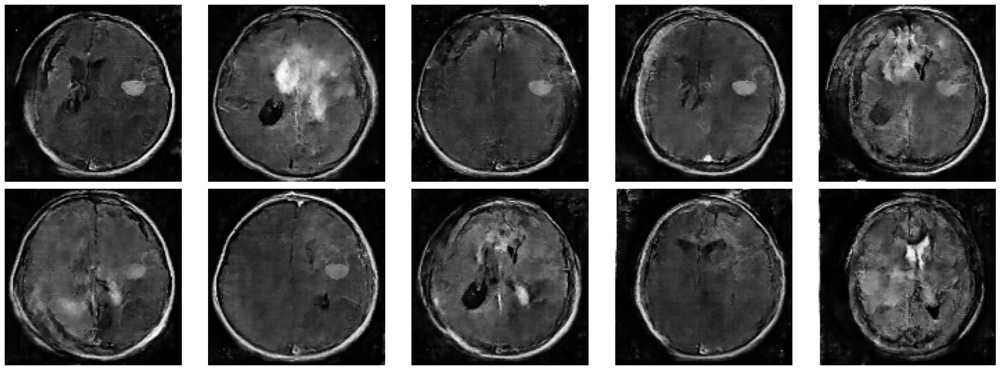

  0%|          | 0/3750 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 1/3750 [00:00<14:19,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 2/3750 [00:00<14:05,  4.43it/s]

1/1 [==============================] - 0s 47ms/step


  0%|          | 3/3750 [00:00<14:17,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 4/3750 [00:00<14:39,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 5/3750 [00:01<14:23,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 6/3750 [00:01<13:53,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 7/3750 [00:01<13:43,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 8/3750 [00:01<13:29,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 9/3750 [00:02<14:16,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 10/3750 [00:02<14:19,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 11/3750 [00:02<13:51,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 12/3750 [00:02<14:12,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 13/3750 [00:02<14:25,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 14/3750 [00:03<14:19,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 15/3750 [00:03<14:11,  4.39it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 16/3750 [00:03<13:19,  4.67it/s]

1/1 [==============================] - 0s 35ms/step


  0%|          | 17/3750 [00:03<13:20,  4.66it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 18/3750 [00:04<13:10,  4.72it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 19/3750 [00:04<13:42,  4.54it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 20/3750 [00:04<13:25,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 21/3750 [00:04<13:19,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 22/3750 [00:04<14:18,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 23/3750 [00:05<13:54,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 24/3750 [00:05<13:25,  4.63it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 25/3750 [00:05<13:25,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 26/3750 [00:05<13:04,  4.75it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 27/3750 [00:05<13:08,  4.72it/s]

1/1 [==============================] - 0s 39ms/step


  1%|          | 28/3750 [00:06<13:30,  4.59it/s]

1/1 [==============================] - 0s 40ms/step


  1%|          | 29/3750 [00:06<14:58,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 30/3750 [00:06<14:53,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 31/3750 [00:07<15:29,  4.00it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 32/3750 [00:07<14:46,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 33/3750 [00:07<14:21,  4.31it/s]

1/1 [==============================] - 0s 52ms/step


  1%|          | 34/3750 [00:07<14:59,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 35/3750 [00:07<14:57,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 36/3750 [00:08<15:04,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 37/3750 [00:08<15:19,  4.04it/s]

1/1 [==============================] - 0s 41ms/step


  1%|          | 38/3750 [00:08<15:15,  4.05it/s]

1/1 [==============================] - 0s 53ms/step


  1%|          | 39/3750 [00:08<16:21,  3.78it/s]

1/1 [==============================] - 0s 42ms/step


  1%|          | 40/3750 [00:09<16:31,  3.74it/s]

1/1 [==============================] - 0s 42ms/step


  1%|          | 41/3750 [00:09<16:39,  3.71it/s]

1/1 [==============================] - 0s 54ms/step


  1%|          | 42/3750 [00:09<16:42,  3.70it/s]

1/1 [==============================] - 0s 60ms/step


  1%|          | 43/3750 [00:10<17:13,  3.59it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 44/3750 [00:10<16:54,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 45/3750 [00:10<16:23,  3.77it/s]

1/1 [==============================] - 0s 40ms/step


  1%|          | 46/3750 [00:10<16:03,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▏         | 47/3750 [00:11<16:28,  3.75it/s]

1/1 [==============================] - 0s 47ms/step


  1%|▏         | 48/3750 [00:11<17:08,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 49/3750 [00:11<16:52,  3.66it/s]

1/1 [==============================] - 0s 37ms/step


  1%|▏         | 50/3750 [00:11<16:03,  3.84it/s]

1/1 [==============================] - 0s 44ms/step


  1%|▏         | 51/3750 [00:12<15:52,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


  1%|▏         | 52/3750 [00:12<15:52,  3.88it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 53/3750 [00:12<14:34,  4.23it/s]

1/1 [==============================] - 0s 37ms/step


  1%|▏         | 54/3750 [00:12<14:47,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


  1%|▏         | 55/3750 [00:13<14:57,  4.12it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 56/3750 [00:13<14:19,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 57/3750 [00:13<14:28,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 58/3750 [00:13<14:51,  4.14it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 59/3750 [00:14<13:54,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 60/3750 [00:14<14:19,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 61/3750 [00:14<14:32,  4.23it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 62/3750 [00:14<14:09,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 63/3750 [00:14<13:40,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 64/3750 [00:15<14:02,  4.38it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 65/3750 [00:15<14:30,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 66/3750 [00:15<13:47,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 67/3750 [00:15<13:38,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 68/3750 [00:16<13:25,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 69/3750 [00:16<12:55,  4.74it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 70/3750 [00:16<13:34,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 71/3750 [00:16<13:27,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 72/3750 [00:16<13:52,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 73/3750 [00:17<14:19,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 74/3750 [00:17<14:17,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 75/3750 [00:17<14:14,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 76/3750 [00:17<14:18,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 77/3750 [00:18<14:02,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 78/3750 [00:18<13:32,  4.52it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 79/3750 [00:18<14:11,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 80/3750 [00:18<13:36,  4.50it/s]

1/1 [==============================] - 0s 37ms/step


  2%|▏         | 81/3750 [00:19<14:39,  4.17it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 82/3750 [00:19<13:58,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 83/3750 [00:19<13:47,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 84/3750 [00:19<13:02,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 85/3750 [00:19<13:43,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 86/3750 [00:20<13:15,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 87/3750 [00:20<12:32,  4.87it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 88/3750 [00:20<12:43,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 89/3750 [00:20<12:21,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 90/3750 [00:20<12:13,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 91/3750 [00:21<12:33,  4.85it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 92/3750 [00:21<13:07,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 93/3750 [00:21<13:16,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 94/3750 [00:21<13:40,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 95/3750 [00:22<13:48,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 96/3750 [00:22<13:48,  4.41it/s]

1/1 [==============================] - 0s 57ms/step


  3%|▎         | 97/3750 [00:22<14:46,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 98/3750 [00:22<14:23,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 99/3750 [00:23<14:35,  4.17it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 100/3750 [00:23<13:45,  4.42it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 101/3750 [00:23<13:29,  4.51it/s]

1/1 [==============================] - 0s 57ms/step


  3%|▎         | 102/3750 [00:23<14:17,  4.25it/s]

1/1 [==============================] - 0s 53ms/step


  3%|▎         | 103/3750 [00:23<15:02,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 104/3750 [00:24<14:48,  4.10it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 105/3750 [00:24<14:30,  4.19it/s]

1/1 [==============================] - 0s 44ms/step


  3%|▎         | 106/3750 [00:24<14:40,  4.14it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 107/3750 [00:24<14:22,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 108/3750 [00:25<13:50,  4.39it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 109/3750 [00:25<14:25,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 110/3750 [00:25<15:04,  4.03it/s]

1/1 [==============================] - 0s 53ms/step


  3%|▎         | 111/3750 [00:25<15:34,  3.89it/s]

1/1 [==============================] - 0s 47ms/step


  3%|▎         | 112/3750 [00:26<15:19,  3.96it/s]

1/1 [==============================] - 0s 41ms/step


  3%|▎         | 113/3750 [00:26<15:28,  3.92it/s]

1/1 [==============================] - 0s 50ms/step


  3%|▎         | 114/3750 [00:26<16:14,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 115/3750 [00:26<14:58,  4.05it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 116/3750 [00:27<14:04,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 117/3750 [00:27<14:15,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 118/3750 [00:27<13:40,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 119/3750 [00:27<13:15,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 120/3750 [00:28<13:27,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 121/3750 [00:28<13:21,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 122/3750 [00:28<13:00,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 123/3750 [00:28<12:48,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 124/3750 [00:28<13:02,  4.64it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 125/3750 [00:29<13:27,  4.49it/s]

1/1 [==============================] - 0s 60ms/step


  3%|▎         | 126/3750 [00:29<14:27,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 127/3750 [00:29<14:08,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 128/3750 [00:29<13:53,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 129/3750 [00:30<13:37,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 130/3750 [00:30<14:10,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 131/3750 [00:30<13:37,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 132/3750 [00:30<13:40,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 133/3750 [00:30<13:22,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 134/3750 [00:31<13:36,  4.43it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▎         | 135/3750 [00:31<13:18,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 136/3750 [00:31<13:03,  4.61it/s]

1/1 [==============================] - 0s 38ms/step


  4%|▎         | 137/3750 [00:31<13:18,  4.52it/s]

1/1 [==============================] - 0s 49ms/step


  4%|▎         | 138/3750 [00:32<13:54,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 139/3750 [00:32<13:29,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 140/3750 [00:32<13:26,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 141/3750 [00:32<13:01,  4.62it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 142/3750 [00:32<12:43,  4.72it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▍         | 143/3750 [00:33<13:15,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 144/3750 [00:33<12:41,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 145/3750 [00:33<12:58,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 146/3750 [00:33<12:21,  4.86it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 147/3750 [00:33<13:03,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 148/3750 [00:34<13:21,  4.50it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 149/3750 [00:34<13:39,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 150/3750 [00:34<13:11,  4.55it/s]

1/1 [==============================] - 0s 38ms/step


  4%|▍         | 151/3750 [00:34<13:04,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 152/3750 [00:35<12:49,  4.68it/s]

1/1 [==============================] - 0s 42ms/step


  4%|▍         | 153/3750 [00:35<13:42,  4.37it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 154/3750 [00:35<13:47,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 155/3750 [00:35<13:49,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 156/3750 [00:36<14:09,  4.23it/s]

1/1 [==============================] - 0s 41ms/step


  4%|▍         | 157/3750 [00:36<14:44,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 158/3750 [00:36<14:35,  4.10it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 159/3750 [00:36<14:14,  4.20it/s]

1/1 [==============================] - 0s 58ms/step


  4%|▍         | 160/3750 [00:37<15:03,  3.97it/s]

1/1 [==============================] - 0s 41ms/step


  4%|▍         | 161/3750 [00:37<14:34,  4.10it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 162/3750 [00:37<14:17,  4.18it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 163/3750 [00:37<14:13,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 164/3750 [00:38<14:32,  4.11it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 165/3750 [00:38<14:05,  4.24it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▍         | 166/3750 [00:38<14:42,  4.06it/s]

1/1 [==============================] - 0s 69ms/step


  4%|▍         | 167/3750 [00:38<14:48,  4.03it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 168/3750 [00:38<14:02,  4.25it/s]

1/1 [==============================] - 0s 38ms/step


  5%|▍         | 169/3750 [00:39<14:36,  4.09it/s]

1/1 [==============================] - 0s 38ms/step


  5%|▍         | 170/3750 [00:39<14:34,  4.09it/s]

1/1 [==============================] - 0s 40ms/step


  5%|▍         | 171/3750 [00:39<14:17,  4.18it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▍         | 172/3750 [00:39<13:58,  4.27it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▍         | 173/3750 [00:40<13:51,  4.30it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▍         | 174/3750 [00:40<14:22,  4.15it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▍         | 175/3750 [00:40<15:10,  3.93it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▍         | 176/3750 [00:40<15:24,  3.86it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▍         | 177/3750 [00:41<15:25,  3.86it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 178/3750 [00:41<15:28,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 179/3750 [00:41<14:38,  4.07it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 180/3750 [00:41<13:39,  4.36it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 181/3750 [00:42<14:16,  4.17it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 182/3750 [00:42<13:49,  4.30it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▍         | 183/3750 [00:42<13:37,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 184/3750 [00:42<13:30,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 185/3750 [00:43<13:43,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 186/3750 [00:43<13:40,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 187/3750 [00:43<13:52,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 188/3750 [00:43<13:37,  4.36it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 189/3750 [00:43<13:20,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 190/3750 [00:44<13:03,  4.54it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 191/3750 [00:44<13:19,  4.45it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 192/3750 [00:44<13:19,  4.45it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 193/3750 [00:44<13:36,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 194/3750 [00:45<13:15,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 195/3750 [00:45<13:06,  4.52it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 196/3750 [00:45<13:05,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 197/3750 [00:45<13:28,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 198/3750 [00:45<13:19,  4.44it/s]

1/1 [==============================] - 0s 40ms/step


  5%|▌         | 199/3750 [00:46<13:53,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 200/3750 [00:46<13:53,  4.26it/s]

1/1 [==============================] - 0s 43ms/step


  5%|▌         | 201/3750 [00:46<13:29,  4.38it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 202/3750 [00:46<14:08,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 203/3750 [00:47<14:26,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 204/3750 [00:47<14:27,  4.09it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 205/3750 [00:47<13:43,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 206/3750 [00:47<13:48,  4.28it/s]

1/1 [==============================] - 0s 42ms/step


  6%|▌         | 207/3750 [00:48<13:20,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 208/3750 [00:48<13:35,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 209/3750 [00:48<13:12,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 210/3750 [00:48<12:58,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 211/3750 [00:49<13:39,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 212/3750 [00:49<13:24,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 213/3750 [00:49<12:48,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 214/3750 [00:49<12:31,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 215/3750 [00:49<12:56,  4.55it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▌         | 216/3750 [00:50<12:40,  4.64it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 217/3750 [00:50<12:29,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 218/3750 [00:50<12:34,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 219/3750 [00:50<12:31,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 220/3750 [00:50<12:42,  4.63it/s]

1/1 [==============================] - 0s 47ms/step


  6%|▌         | 221/3750 [00:51<12:49,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 222/3750 [00:51<12:55,  4.55it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▌         | 223/3750 [00:51<13:10,  4.46it/s]

1/1 [==============================] - 0s 57ms/step


  6%|▌         | 224/3750 [00:51<13:36,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 225/3750 [00:52<13:18,  4.41it/s]

1/1 [==============================] - 0s 48ms/step


  6%|▌         | 226/3750 [00:52<14:05,  4.17it/s]

1/1 [==============================] - 0s 58ms/step


  6%|▌         | 227/3750 [00:52<15:22,  3.82it/s]

1/1 [==============================] - 0s 42ms/step


  6%|▌         | 228/3750 [00:52<15:04,  3.90it/s]

1/1 [==============================] - 0s 62ms/step


  6%|▌         | 229/3750 [00:53<15:34,  3.77it/s]

1/1 [==============================] - 0s 64ms/step


  6%|▌         | 230/3750 [00:53<16:17,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 231/3750 [00:53<15:11,  3.86it/s]

1/1 [==============================] - 0s 52ms/step


  6%|▌         | 232/3750 [00:53<15:24,  3.80it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▌         | 233/3750 [00:54<16:03,  3.65it/s]

1/1 [==============================] - 0s 53ms/step


  6%|▌         | 234/3750 [00:54<16:15,  3.60it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▋         | 235/3750 [00:54<15:48,  3.71it/s]

1/1 [==============================] - 0s 44ms/step


  6%|▋         | 236/3750 [00:55<15:51,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 237/3750 [00:55<15:19,  3.82it/s]

1/1 [==============================] - 0s 45ms/step


  6%|▋         | 238/3750 [00:55<15:33,  3.76it/s]

1/1 [==============================] - 0s 63ms/step


  6%|▋         | 239/3750 [00:55<15:29,  3.78it/s]

1/1 [==============================] - 0s 54ms/step


  6%|▋         | 240/3750 [00:56<16:04,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 241/3750 [00:56<15:07,  3.87it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 242/3750 [00:56<14:53,  3.93it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 243/3750 [00:56<14:32,  4.02it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 244/3750 [00:57<13:43,  4.26it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 245/3750 [00:57<13:03,  4.47it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 246/3750 [00:57<13:24,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 247/3750 [00:57<13:39,  4.28it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 248/3750 [00:57<12:50,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 249/3750 [00:58<13:05,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 250/3750 [00:58<12:41,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 251/3750 [00:58<12:03,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 252/3750 [00:58<12:06,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 253/3750 [00:58<12:04,  4.82it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 254/3750 [00:59<12:32,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 255/3750 [00:59<12:20,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 256/3750 [00:59<12:04,  4.82it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 257/3750 [01:00<22:31,  2.58it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 258/3750 [01:00<19:45,  2.94it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 259/3750 [01:00<18:04,  3.22it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 260/3750 [01:01<16:21,  3.56it/s]

1/1 [==============================] - 0s 52ms/step


  7%|▋         | 261/3750 [01:01<15:58,  3.64it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 262/3750 [01:01<15:40,  3.71it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 263/3750 [01:01<14:45,  3.94it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 264/3750 [01:02<15:09,  3.83it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 265/3750 [01:02<15:19,  3.79it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 266/3750 [01:02<15:11,  3.82it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 267/3750 [01:02<14:46,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 268/3750 [01:03<13:52,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 269/3750 [01:03<14:14,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 270/3750 [01:03<13:50,  4.19it/s]

1/1 [==============================] - 0s 56ms/step


  7%|▋         | 271/3750 [01:03<14:32,  3.99it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 272/3750 [01:04<15:09,  3.82it/s]

1/1 [==============================] - 0s 49ms/step


  7%|▋         | 273/3750 [01:04<15:40,  3.70it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 274/3750 [01:04<15:55,  3.64it/s]

1/1 [==============================] - 0s 51ms/step


  7%|▋         | 275/3750 [01:05<15:59,  3.62it/s]

1/1 [==============================] - 0s 42ms/step


  7%|▋         | 276/3750 [01:05<15:17,  3.79it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 277/3750 [01:05<14:24,  4.02it/s]

1/1 [==============================] - 0s 62ms/step


  7%|▋         | 278/3750 [01:05<15:37,  3.70it/s]

1/1 [==============================] - 0s 76ms/step


  7%|▋         | 279/3750 [01:06<15:53,  3.64it/s]

1/1 [==============================] - 0s 60ms/step


  7%|▋         | 280/3750 [01:06<16:28,  3.51it/s]

1/1 [==============================] - 0s 42ms/step


  7%|▋         | 281/3750 [01:06<15:35,  3.71it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 282/3750 [01:06<15:00,  3.85it/s]

1/1 [==============================] - 0s 49ms/step


  8%|▊         | 283/3750 [01:07<14:51,  3.89it/s]

1/1 [==============================] - 0s 49ms/step


  8%|▊         | 284/3750 [01:07<15:24,  3.75it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 285/3750 [01:07<15:22,  3.76it/s]

1/1 [==============================] - 0s 46ms/step


  8%|▊         | 286/3750 [01:07<15:07,  3.82it/s]

1/1 [==============================] - 0s 49ms/step


  8%|▊         | 287/3750 [01:08<15:44,  3.67it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 288/3750 [01:08<15:33,  3.71it/s]

1/1 [==============================] - 0s 54ms/step


  8%|▊         | 289/3750 [01:08<15:58,  3.61it/s]

1/1 [==============================] - 0s 52ms/step


  8%|▊         | 290/3750 [01:09<15:46,  3.66it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 291/3750 [01:09<14:59,  3.84it/s]

1/1 [==============================] - 0s 48ms/step


  8%|▊         | 292/3750 [01:09<15:59,  3.60it/s]

1/1 [==============================] - 0s 49ms/step


  8%|▊         | 293/3750 [01:09<15:41,  3.67it/s]

1/1 [==============================] - 0s 46ms/step


  8%|▊         | 294/3750 [01:10<15:27,  3.73it/s]

1/1 [==============================] - 0s 54ms/step


  8%|▊         | 295/3750 [01:10<15:10,  3.79it/s]

1/1 [==============================] - 0s 41ms/step


  8%|▊         | 296/3750 [01:10<15:21,  3.75it/s]

1/1 [==============================] - 0s 48ms/step


  8%|▊         | 297/3750 [01:10<15:45,  3.65it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 298/3750 [01:11<15:37,  3.68it/s]

1/1 [==============================] - 0s 41ms/step


  8%|▊         | 299/3750 [01:11<15:33,  3.70it/s]

1/1 [==============================] - 0s 46ms/step


  8%|▊         | 300/3750 [01:11<16:08,  3.56it/s]

1/1 [==============================] - 0s 44ms/step


  8%|▊         | 301/3750 [01:11<15:21,  3.74it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 302/3750 [01:12<15:01,  3.83it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 303/3750 [01:12<14:29,  3.97it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 304/3750 [01:12<14:07,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 305/3750 [01:12<13:50,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 306/3750 [01:13<13:23,  4.29it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 307/3750 [01:13<14:04,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 308/3750 [01:13<13:39,  4.20it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 309/3750 [01:13<13:49,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 310/3750 [01:14<14:02,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 311/3750 [01:14<13:51,  4.14it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 312/3750 [01:14<13:26,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 313/3750 [01:14<13:04,  4.38it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 314/3750 [01:15<13:07,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 315/3750 [01:15<12:59,  4.41it/s]

1/1 [==============================] - 0s 48ms/step


  8%|▊         | 316/3750 [01:15<13:09,  4.35it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 317/3750 [01:15<13:40,  4.18it/s]

1/1 [==============================] - 0s 41ms/step


  8%|▊         | 318/3750 [01:16<14:19,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 319/3750 [01:16<14:20,  3.99it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 320/3750 [01:16<14:11,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▊         | 321/3750 [01:16<13:39,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▊         | 322/3750 [01:16<13:26,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 323/3750 [01:17<13:09,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 324/3750 [01:17<13:36,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▊         | 325/3750 [01:17<13:42,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 326/3750 [01:17<13:45,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 327/3750 [01:18<14:04,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▊         | 328/3750 [01:18<13:34,  4.20it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 329/3750 [01:18<13:10,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 330/3750 [01:18<12:52,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 331/3750 [01:19<13:17,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 332/3750 [01:19<13:00,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 333/3750 [01:19<13:16,  4.29it/s]

1/1 [==============================] - 0s 40ms/step


  9%|▉         | 334/3750 [01:19<13:04,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 335/3750 [01:19<12:46,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 336/3750 [01:20<13:04,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 337/3750 [01:20<12:58,  4.38it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▉         | 338/3750 [01:20<14:03,  4.05it/s]

1/1 [==============================] - 0s 48ms/step


  9%|▉         | 339/3750 [01:20<13:34,  4.19it/s]

1/1 [==============================] - 0s 64ms/step


  9%|▉         | 340/3750 [01:21<14:24,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▉         | 341/3750 [01:21<14:40,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 342/3750 [01:21<14:33,  3.90it/s]

1/1 [==============================] - 0s 40ms/step


  9%|▉         | 343/3750 [01:22<15:07,  3.76it/s]

1/1 [==============================] - 0s 49ms/step


  9%|▉         | 344/3750 [01:22<14:47,  3.84it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▉         | 345/3750 [01:22<15:00,  3.78it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▉         | 346/3750 [01:22<15:15,  3.72it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 347/3750 [01:23<15:08,  3.74it/s]

1/1 [==============================] - 0s 54ms/step


  9%|▉         | 348/3750 [01:23<15:28,  3.66it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▉         | 349/3750 [01:23<15:12,  3.73it/s]

1/1 [==============================] - 0s 47ms/step


  9%|▉         | 350/3750 [01:23<15:06,  3.75it/s]

1/1 [==============================] - 0s 62ms/step


  9%|▉         | 351/3750 [01:24<14:47,  3.83it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▉         | 352/3750 [01:24<15:10,  3.73it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▉         | 353/3750 [01:24<15:23,  3.68it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 354/3750 [01:25<15:39,  3.61it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 355/3750 [01:25<14:50,  3.81it/s]

1/1 [==============================] - 0s 47ms/step


  9%|▉         | 356/3750 [01:25<14:48,  3.82it/s]

1/1 [==============================] - 0s 36ms/step


 10%|▉         | 357/3750 [01:25<15:17,  3.70it/s]

1/1 [==============================] - 0s 42ms/step


 10%|▉         | 358/3750 [01:26<14:47,  3.82it/s]

1/1 [==============================] - 0s 49ms/step


 10%|▉         | 359/3750 [01:26<14:45,  3.83it/s]

1/1 [==============================] - 0s 53ms/step


 10%|▉         | 360/3750 [01:26<14:58,  3.77it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 361/3750 [01:26<14:08,  3.99it/s]

1/1 [==============================] - 0s 47ms/step


 10%|▉         | 362/3750 [01:27<14:23,  3.92it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 363/3750 [01:27<14:00,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 364/3750 [01:27<14:12,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 365/3750 [01:27<13:30,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 366/3750 [01:28<13:48,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 367/3750 [01:28<14:12,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 368/3750 [01:28<13:39,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 369/3750 [01:28<13:23,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 370/3750 [01:28<12:53,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 371/3750 [01:29<12:50,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 372/3750 [01:29<13:27,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 373/3750 [01:29<13:11,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 374/3750 [01:29<13:12,  4.26it/s]

1/1 [==============================] - 0s 51ms/step


 10%|█         | 375/3750 [01:30<13:11,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 376/3750 [01:30<12:49,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 377/3750 [01:30<12:35,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 378/3750 [01:30<12:53,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 379/3750 [01:30<12:30,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 380/3750 [01:31<12:30,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 381/3750 [01:31<12:40,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 382/3750 [01:31<12:11,  4.60it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 383/3750 [01:31<13:01,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 384/3750 [01:32<13:07,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 385/3750 [01:32<13:25,  4.18it/s]

1/1 [==============================] - 0s 48ms/step


 10%|█         | 386/3750 [01:32<13:37,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 387/3750 [01:32<13:05,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 388/3750 [01:33<13:31,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 389/3750 [01:33<13:42,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 390/3750 [01:33<14:03,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 391/3750 [01:33<13:26,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 392/3750 [01:34<13:30,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 393/3750 [01:34<13:20,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 394/3750 [01:34<13:06,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 395/3750 [01:34<13:20,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 396/3750 [01:35<13:39,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 397/3750 [01:35<13:14,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 398/3750 [01:35<13:24,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 399/3750 [01:35<13:21,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 400/3750 [01:35<12:54,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 401/3750 [01:36<12:31,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 402/3750 [01:36<13:00,  4.29it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 403/3750 [01:36<12:56,  4.31it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 404/3750 [01:36<13:40,  4.08it/s]

1/1 [==============================] - 0s 62ms/step


 11%|█         | 405/3750 [01:37<13:52,  4.02it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█         | 406/3750 [01:37<14:25,  3.86it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█         | 407/3750 [01:37<14:41,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 408/3750 [01:38<14:43,  3.78it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 409/3750 [01:38<14:30,  3.84it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 410/3750 [01:38<15:02,  3.70it/s]

1/1 [==============================] - 0s 52ms/step


 11%|█         | 411/3750 [01:38<14:51,  3.74it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█         | 412/3750 [01:39<14:29,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 413/3750 [01:39<14:43,  3.78it/s]

1/1 [==============================] - 0s 51ms/step


 11%|█         | 414/3750 [01:39<14:34,  3.81it/s]

1/1 [==============================] - 0s 52ms/step


 11%|█         | 415/3750 [01:39<15:01,  3.70it/s]

1/1 [==============================] - 0s 46ms/step


 11%|█         | 416/3750 [01:40<14:42,  3.78it/s]

1/1 [==============================] - 0s 52ms/step


 11%|█         | 417/3750 [01:40<15:23,  3.61it/s]

1/1 [==============================] - 0s 48ms/step


 11%|█         | 418/3750 [01:40<15:30,  3.58it/s]

1/1 [==============================] - 0s 46ms/step


 11%|█         | 419/3750 [01:41<15:24,  3.60it/s]

1/1 [==============================] - 0s 50ms/step


 11%|█         | 420/3750 [01:41<15:40,  3.54it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█         | 421/3750 [01:41<15:04,  3.68it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█▏        | 422/3750 [01:41<14:28,  3.83it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█▏        | 423/3750 [01:42<13:52,  4.00it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█▏        | 424/3750 [01:42<14:05,  3.93it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 425/3750 [01:42<13:28,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 426/3750 [01:42<13:44,  4.03it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 427/3750 [01:42<13:15,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 428/3750 [01:43<13:11,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 429/3750 [01:43<12:43,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█▏        | 430/3750 [01:43<13:01,  4.25it/s]

1/1 [==============================] - 0s 48ms/step


 11%|█▏        | 431/3750 [01:43<13:05,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 432/3750 [01:44<12:26,  4.44it/s]

1/1 [==============================] - 0s 46ms/step


 12%|█▏        | 433/3750 [01:44<12:55,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 434/3750 [01:44<12:57,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 435/3750 [01:44<13:16,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 436/3750 [01:45<13:03,  4.23it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 437/3750 [01:45<12:40,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 438/3750 [01:45<12:51,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 439/3750 [01:45<13:12,  4.18it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 440/3750 [01:46<12:54,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 441/3750 [01:46<13:02,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 442/3750 [01:46<13:20,  4.13it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█▏        | 443/3750 [01:46<13:49,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 444/3750 [01:47<13:57,  3.95it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 445/3750 [01:47<12:58,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 446/3750 [01:47<12:21,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 447/3750 [01:47<11:58,  4.60it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 448/3750 [01:47<11:54,  4.62it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 449/3750 [01:48<11:41,  4.71it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 450/3750 [01:48<11:42,  4.70it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 451/3750 [01:48<11:43,  4.69it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 452/3750 [01:48<11:54,  4.62it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 453/3750 [01:48<11:52,  4.63it/s]

1/1 [==============================] - 0s 49ms/step


 12%|█▏        | 454/3750 [01:49<12:51,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 455/3750 [01:49<12:49,  4.28it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 456/3750 [01:49<12:13,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 457/3750 [01:49<12:43,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 458/3750 [01:50<13:03,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 459/3750 [01:50<13:00,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 460/3750 [01:50<13:12,  4.15it/s]

1/1 [==============================] - 0s 45ms/step


 12%|█▏        | 461/3750 [01:50<13:35,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 462/3750 [01:51<13:16,  4.13it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 463/3750 [01:51<13:53,  3.94it/s]

1/1 [==============================] - 0s 48ms/step


 12%|█▏        | 464/3750 [01:51<15:20,  3.57it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 465/3750 [01:52<15:24,  3.55it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 466/3750 [01:52<15:09,  3.61it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█▏        | 467/3750 [01:52<15:04,  3.63it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 468/3750 [01:52<14:59,  3.65it/s]

1/1 [==============================] - 0s 40ms/step


 13%|█▎        | 469/3750 [01:53<14:34,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 470/3750 [01:53<14:09,  3.86it/s]

1/1 [==============================] - 0s 59ms/step


 13%|█▎        | 471/3750 [01:53<15:03,  3.63it/s]

1/1 [==============================] - 0s 49ms/step


 13%|█▎        | 472/3750 [01:53<15:02,  3.63it/s]

1/1 [==============================] - 0s 47ms/step


 13%|█▎        | 473/3750 [01:54<14:41,  3.72it/s]

1/1 [==============================] - 0s 48ms/step


 13%|█▎        | 474/3750 [01:54<15:12,  3.59it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 475/3750 [01:54<14:35,  3.74it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 476/3750 [01:54<14:53,  3.66it/s]

1/1 [==============================] - 0s 44ms/step


 13%|█▎        | 477/3750 [01:55<14:27,  3.77it/s]

1/1 [==============================] - 0s 41ms/step


 13%|█▎        | 478/3750 [01:55<13:50,  3.94it/s]

1/1 [==============================] - 0s 49ms/step


 13%|█▎        | 479/3750 [01:55<13:46,  3.96it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 480/3750 [01:55<13:47,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 481/3750 [01:56<13:06,  4.16it/s]

1/1 [==============================] - 0s 40ms/step


 13%|█▎        | 482/3750 [01:56<13:23,  4.07it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 483/3750 [01:56<12:43,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 484/3750 [01:56<12:54,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 485/3750 [01:57<12:39,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 486/3750 [01:57<12:14,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 487/3750 [01:57<11:51,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 488/3750 [01:57<12:11,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 489/3750 [01:58<13:04,  4.16it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 490/3750 [01:58<12:42,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 491/3750 [01:58<13:03,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 492/3750 [01:58<13:05,  4.15it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 493/3750 [01:58<13:10,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 494/3750 [01:59<12:41,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 495/3750 [01:59<12:47,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 496/3750 [01:59<12:38,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 497/3750 [01:59<12:34,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 498/3750 [02:00<12:19,  4.40it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 499/3750 [02:00<12:52,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 500/3750 [02:00<12:29,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 501/3750 [02:00<12:52,  4.21it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 502/3750 [02:01<13:04,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 503/3750 [02:01<12:29,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 504/3750 [02:01<13:00,  4.16it/s]

1/1 [==============================] - 0s 40ms/step


 13%|█▎        | 505/3750 [02:01<13:24,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 506/3750 [02:02<13:36,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▎        | 507/3750 [02:02<13:50,  3.91it/s]

1/1 [==============================] - 0s 46ms/step


 14%|█▎        | 508/3750 [02:02<14:12,  3.80it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 509/3750 [02:02<13:21,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 510/3750 [02:03<13:05,  4.12it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 511/3750 [02:03<12:37,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 512/3750 [02:03<12:42,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 513/3750 [02:03<12:56,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 514/3750 [02:03<12:18,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 515/3750 [02:04<12:49,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 516/3750 [02:04<13:08,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 517/3750 [02:04<12:22,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 518/3750 [02:04<12:06,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 519/3750 [02:05<12:30,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 520/3750 [02:05<12:01,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 521/3750 [02:05<11:52,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 522/3750 [02:05<12:12,  4.41it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 523/3750 [02:06<13:07,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 524/3750 [02:06<13:20,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 525/3750 [02:06<13:22,  4.02it/s]

1/1 [==============================] - 0s 65ms/step


 14%|█▍        | 526/3750 [02:06<13:24,  4.01it/s]

1/1 [==============================] - 0s 72ms/step


 14%|█▍        | 527/3750 [02:07<14:15,  3.77it/s]

1/1 [==============================] - 0s 64ms/step


 14%|█▍        | 528/3750 [02:07<14:05,  3.81it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 529/3750 [02:07<13:35,  3.95it/s]

1/1 [==============================] - 0s 46ms/step


 14%|█▍        | 530/3750 [02:07<13:28,  3.98it/s]

1/1 [==============================] - 0s 42ms/step


 14%|█▍        | 531/3750 [02:08<13:36,  3.94it/s]

1/1 [==============================] - 0s 60ms/step


 14%|█▍        | 532/3750 [02:08<13:39,  3.93it/s]

1/1 [==============================] - 0s 54ms/step


 14%|█▍        | 533/3750 [02:08<13:50,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 534/3750 [02:08<14:17,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 535/3750 [02:09<14:26,  3.71it/s]

1/1 [==============================] - 0s 51ms/step


 14%|█▍        | 536/3750 [02:09<14:34,  3.68it/s]

1/1 [==============================] - 0s 48ms/step


 14%|█▍        | 537/3750 [02:09<14:15,  3.76it/s]

1/1 [==============================] - 0s 55ms/step


 14%|█▍        | 538/3750 [02:10<14:11,  3.77it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 539/3750 [02:10<13:16,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 540/3750 [02:10<12:28,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 541/3750 [02:10<12:24,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 542/3750 [02:10<11:47,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 543/3750 [02:11<12:10,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 544/3750 [02:11<11:36,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 545/3750 [02:11<12:07,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 546/3750 [02:11<11:35,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 547/3750 [02:11<12:03,  4.43it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 548/3750 [02:12<12:12,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 549/3750 [02:12<11:48,  4.51it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 550/3750 [02:12<11:41,  4.56it/s]

1/1 [==============================] - 0s 50ms/step


 15%|█▍        | 551/3750 [02:12<12:23,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 552/3750 [02:13<11:54,  4.48it/s]

1/1 [==============================] - 0s 44ms/step


 15%|█▍        | 553/3750 [02:13<11:53,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 554/3750 [02:13<11:23,  4.67it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 555/3750 [02:13<11:29,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 556/3750 [02:14<12:05,  4.40it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 557/3750 [02:14<11:58,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 558/3750 [02:14<11:27,  4.65it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 559/3750 [02:14<11:27,  4.64it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 560/3750 [02:14<11:35,  4.59it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 561/3750 [02:15<11:45,  4.52it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▍        | 562/3750 [02:15<11:35,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 563/3750 [02:15<11:23,  4.66it/s]

1/1 [==============================] - 0s 44ms/step


 15%|█▌        | 564/3750 [02:15<12:11,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 565/3750 [02:16<12:27,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 566/3750 [02:16<12:01,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 567/3750 [02:16<12:33,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 568/3750 [02:16<12:33,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 569/3750 [02:16<11:43,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 570/3750 [02:17<12:14,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 571/3750 [02:17<12:25,  4.27it/s]

1/1 [==============================] - 0s 47ms/step


 15%|█▌        | 572/3750 [02:17<12:20,  4.29it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 573/3750 [02:17<12:03,  4.39it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 574/3750 [02:18<11:50,  4.47it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 575/3750 [02:18<12:06,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 576/3750 [02:18<12:03,  4.38it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 577/3750 [02:18<11:39,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 578/3750 [02:18<12:19,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 579/3750 [02:19<12:10,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 580/3750 [02:19<12:08,  4.35it/s]

1/1 [==============================] - 0s 44ms/step


 15%|█▌        | 581/3750 [02:19<12:03,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 582/3750 [02:19<11:31,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 583/3750 [02:20<11:40,  4.52it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 584/3750 [02:20<11:49,  4.46it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▌        | 585/3750 [02:20<12:28,  4.23it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 586/3750 [02:20<13:08,  4.01it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 587/3750 [02:21<13:32,  3.89it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▌        | 588/3750 [02:21<14:08,  3.73it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 589/3750 [02:21<14:32,  3.62it/s]

1/1 [==============================] - 0s 46ms/step


 16%|█▌        | 590/3750 [02:22<14:48,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 591/3750 [02:22<14:00,  3.76it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 592/3750 [02:22<13:22,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 593/3750 [02:22<13:00,  4.04it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 594/3750 [02:22<13:11,  3.99it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 595/3750 [02:23<13:19,  3.95it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 596/3750 [02:23<14:28,  3.63it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▌        | 597/3750 [02:23<14:01,  3.75it/s]

1/1 [==============================] - 0s 48ms/step


 16%|█▌        | 598/3750 [02:24<13:32,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 599/3750 [02:24<12:48,  4.10it/s]

1/1 [==============================] - 0s 64ms/step


 16%|█▌        | 600/3750 [02:24<12:54,  4.07it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 601/3750 [02:24<13:41,  3.83it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 602/3750 [02:25<13:26,  3.90it/s]

1/1 [==============================] - 0s 42ms/step


 16%|█▌        | 603/3750 [02:25<13:22,  3.92it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 604/3750 [02:25<12:33,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 605/3750 [02:25<13:14,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 606/3750 [02:26<13:19,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 607/3750 [02:26<13:36,  3.85it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 608/3750 [02:26<12:38,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 609/3750 [02:26<13:12,  3.96it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 610/3750 [02:27<13:13,  3.96it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 611/3750 [02:27<12:33,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 612/3750 [02:27<12:01,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 613/3750 [02:27<11:47,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 614/3750 [02:27<11:52,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 615/3750 [02:28<11:48,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 616/3750 [02:28<11:42,  4.46it/s]

1/1 [==============================] - 0s 42ms/step


 16%|█▋        | 617/3750 [02:28<12:11,  4.28it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 618/3750 [02:28<11:53,  4.39it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 619/3750 [02:29<12:20,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 620/3750 [02:29<12:33,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 621/3750 [02:29<12:38,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 622/3750 [02:29<12:19,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 623/3750 [02:30<12:10,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 624/3750 [02:30<11:43,  4.45it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 625/3750 [02:30<11:42,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 626/3750 [02:30<11:22,  4.58it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 627/3750 [02:30<11:10,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 628/3750 [02:31<11:35,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 629/3750 [02:31<11:26,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 630/3750 [02:31<11:39,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 631/3750 [02:31<11:26,  4.55it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 632/3750 [02:31<11:29,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 633/3750 [02:32<11:57,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 634/3750 [02:32<11:40,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 635/3750 [02:32<11:20,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 636/3750 [02:32<11:49,  4.39it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 637/3750 [02:33<11:43,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 638/3750 [02:33<12:02,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 639/3750 [02:33<11:34,  4.48it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 640/3750 [02:33<11:44,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 641/3750 [02:34<11:34,  4.47it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 642/3750 [02:34<11:17,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 643/3750 [02:34<11:35,  4.47it/s]

1/1 [==============================] - 0s 47ms/step


 17%|█▋        | 644/3750 [02:34<11:58,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 645/3750 [02:34<12:07,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 646/3750 [02:35<12:29,  4.14it/s]

1/1 [==============================] - 0s 63ms/step


 17%|█▋        | 647/3750 [02:35<12:53,  4.01it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 648/3750 [02:35<13:11,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 649/3750 [02:36<13:23,  3.86it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 650/3750 [02:36<13:22,  3.86it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 651/3750 [02:36<13:13,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 652/3750 [02:36<12:41,  4.07it/s]

1/1 [==============================] - 0s 42ms/step


 17%|█▋        | 653/3750 [02:36<12:38,  4.08it/s]

1/1 [==============================] - 0s 42ms/step


 17%|█▋        | 654/3750 [02:37<12:25,  4.15it/s]

1/1 [==============================] - 0s 45ms/step


 17%|█▋        | 655/3750 [02:37<12:28,  4.14it/s]

1/1 [==============================] - 0s 46ms/step


 17%|█▋        | 656/3750 [02:37<13:12,  3.91it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 657/3750 [02:38<13:15,  3.89it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 658/3750 [02:38<13:01,  3.96it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 659/3750 [02:38<13:09,  3.92it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 660/3750 [02:38<13:26,  3.83it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 661/3750 [02:39<13:36,  3.78it/s]

1/1 [==============================] - 0s 47ms/step


 18%|█▊        | 662/3750 [02:39<13:07,  3.92it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 663/3750 [02:39<13:07,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 664/3750 [02:39<13:26,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 665/3750 [02:40<13:00,  3.95it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 666/3750 [02:40<12:39,  4.06it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 667/3750 [02:40<11:45,  4.37it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 668/3750 [02:40<12:32,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 669/3750 [02:40<12:19,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 670/3750 [02:41<11:47,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 671/3750 [02:41<11:18,  4.54it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 672/3750 [02:41<11:14,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 673/3750 [02:41<11:09,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 674/3750 [02:42<11:08,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 675/3750 [02:42<10:55,  4.69it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 676/3750 [02:42<10:53,  4.70it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 677/3750 [02:42<11:02,  4.64it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 678/3750 [02:42<11:33,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 679/3750 [02:43<11:01,  4.64it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 680/3750 [02:43<10:43,  4.77it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 681/3750 [02:43<10:59,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 682/3750 [02:43<11:08,  4.59it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 683/3750 [02:44<11:30,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 684/3750 [02:44<11:33,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 685/3750 [02:44<10:55,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 686/3750 [02:44<11:29,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 687/3750 [02:44<11:39,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 688/3750 [02:45<11:48,  4.32it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 689/3750 [02:45<11:35,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 690/3750 [02:45<11:18,  4.51it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 691/3750 [02:45<11:31,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 692/3750 [02:46<11:13,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 693/3750 [02:46<11:42,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 694/3750 [02:46<11:48,  4.31it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▊        | 695/3750 [02:46<12:27,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 696/3750 [02:47<12:28,  4.08it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 697/3750 [02:47<12:42,  4.01it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 698/3750 [02:47<12:31,  4.06it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 699/3750 [02:47<11:51,  4.29it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▊        | 700/3750 [02:48<12:25,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 701/3750 [02:48<12:10,  4.17it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 702/3750 [02:48<12:20,  4.12it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 703/3750 [02:48<12:34,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 704/3750 [02:48<12:01,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 705/3750 [02:49<11:43,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 706/3750 [02:49<11:26,  4.44it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▉        | 707/3750 [02:49<11:31,  4.40it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 708/3750 [02:49<11:32,  4.39it/s]

1/1 [==============================] - 0s 46ms/step


 19%|█▉        | 709/3750 [02:50<11:46,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 710/3750 [02:50<11:58,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 711/3750 [02:50<12:07,  4.18it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 712/3750 [02:50<12:28,  4.06it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 713/3750 [02:51<12:46,  3.96it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 714/3750 [02:51<12:12,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 715/3750 [02:51<11:54,  4.24it/s]

1/1 [==============================] - 0s 47ms/step


 19%|█▉        | 716/3750 [02:51<12:03,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 717/3750 [02:52<11:50,  4.27it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 718/3750 [02:52<12:31,  4.04it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 719/3750 [02:52<12:27,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 720/3750 [02:52<11:55,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 721/3750 [02:52<11:50,  4.26it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 722/3750 [02:53<12:26,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 723/3750 [02:53<12:05,  4.17it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▉        | 724/3750 [02:53<12:18,  4.10it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▉        | 725/3750 [02:54<12:49,  3.93it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 726/3750 [02:54<12:48,  3.94it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 727/3750 [02:54<11:58,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 728/3750 [02:54<11:44,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 729/3750 [02:54<12:08,  4.15it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 730/3750 [02:55<11:53,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 731/3750 [02:55<12:13,  4.12it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█▉        | 732/3750 [02:55<11:55,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 733/3750 [02:55<11:55,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 20%|█▉        | 734/3750 [02:56<12:22,  4.06it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 735/3750 [02:56<11:48,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 736/3750 [02:56<11:37,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 737/3750 [02:56<11:28,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 738/3750 [02:57<11:33,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 739/3750 [02:57<11:13,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 740/3750 [02:57<11:15,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 741/3750 [02:57<11:04,  4.53it/s]

1/1 [==============================] - 0s 38ms/step


 20%|█▉        | 742/3750 [02:57<10:50,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 743/3750 [02:58<10:40,  4.69it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 744/3750 [02:58<11:13,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 745/3750 [02:58<10:53,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 746/3750 [02:58<11:04,  4.52it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█▉        | 747/3750 [02:59<11:39,  4.29it/s]

1/1 [==============================] - 0s 36ms/step


 20%|█▉        | 748/3750 [02:59<11:17,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 749/3750 [02:59<12:00,  4.16it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 750/3750 [02:59<11:25,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 751/3750 [02:59<11:26,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 752/3750 [03:00<11:24,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 753/3750 [03:00<11:02,  4.52it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 754/3750 [03:00<11:30,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 755/3750 [03:00<11:14,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 756/3750 [03:01<11:38,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 757/3750 [03:01<11:26,  4.36it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 758/3750 [03:01<11:44,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 759/3750 [03:01<11:08,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 760/3750 [03:02<11:31,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 761/3750 [03:02<11:44,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 762/3750 [03:02<11:08,  4.47it/s]

1/1 [==============================] - 0s 38ms/step


 20%|██        | 763/3750 [03:02<11:39,  4.27it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 764/3750 [03:02<10:48,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 765/3750 [03:03<11:11,  4.45it/s]

1/1 [==============================] - 0s 43ms/step


 20%|██        | 766/3750 [03:03<11:04,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 767/3750 [03:03<11:40,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 768/3750 [03:03<11:41,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 769/3750 [03:04<11:18,  4.39it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 770/3750 [03:04<11:32,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 771/3750 [03:04<11:05,  4.47it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 772/3750 [03:04<11:07,  4.46it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 773/3750 [03:04<11:11,  4.44it/s]

1/1 [==============================] - 0s 53ms/step


 21%|██        | 774/3750 [03:05<11:56,  4.15it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 775/3750 [03:05<11:54,  4.17it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 776/3750 [03:05<12:23,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 777/3750 [03:06<12:34,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 778/3750 [03:06<12:58,  3.82it/s]

1/1 [==============================] - 0s 47ms/step


 21%|██        | 779/3750 [03:06<12:52,  3.84it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██        | 780/3750 [03:06<12:39,  3.91it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 781/3750 [03:07<11:53,  4.16it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██        | 782/3750 [03:07<11:47,  4.19it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 783/3750 [03:07<12:10,  4.06it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██        | 784/3750 [03:07<12:29,  3.96it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██        | 785/3750 [03:08<12:29,  3.96it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██        | 786/3750 [03:08<12:01,  4.11it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██        | 787/3750 [03:08<12:21,  4.00it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 788/3750 [03:08<12:03,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 789/3750 [03:08<11:28,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 790/3750 [03:09<11:07,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 791/3750 [03:09<10:54,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 792/3750 [03:09<11:06,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 793/3750 [03:09<11:38,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 794/3750 [03:10<11:25,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 795/3750 [03:10<11:05,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 796/3750 [03:10<10:47,  4.56it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 797/3750 [03:10<10:35,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 798/3750 [03:10<10:57,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 799/3750 [03:11<11:25,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 800/3750 [03:11<11:26,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 801/3750 [03:11<11:21,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 802/3750 [03:11<11:15,  4.36it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██▏       | 803/3750 [03:12<11:51,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 804/3750 [03:12<11:26,  4.29it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 805/3750 [03:12<11:34,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 806/3750 [03:12<11:48,  4.16it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 807/3750 [03:13<11:31,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 808/3750 [03:13<11:23,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 809/3750 [03:13<11:41,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 810/3750 [03:13<11:47,  4.15it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 811/3750 [03:14<11:25,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 812/3750 [03:14<11:13,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 813/3750 [03:14<11:07,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 814/3750 [03:14<11:28,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 815/3750 [03:14<10:49,  4.52it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 816/3750 [03:15<10:40,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 817/3750 [03:15<10:53,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 818/3750 [03:15<11:02,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 819/3750 [03:15<11:20,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 820/3750 [03:16<10:43,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 821/3750 [03:16<11:13,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 822/3750 [03:16<10:50,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 823/3750 [03:16<11:03,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 824/3750 [03:16<10:40,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 825/3750 [03:17<11:00,  4.43it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 826/3750 [03:17<10:54,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 827/3750 [03:17<10:35,  4.60it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 828/3750 [03:17<10:29,  4.64it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 829/3750 [03:18<10:21,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 830/3750 [03:18<10:29,  4.64it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 831/3750 [03:18<11:08,  4.37it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 832/3750 [03:18<11:35,  4.19it/s]

1/1 [==============================] - 0s 54ms/step


 22%|██▏       | 833/3750 [03:19<11:51,  4.10it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 834/3750 [03:19<12:20,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 835/3750 [03:19<12:00,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 836/3750 [03:19<11:23,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 837/3750 [03:19<10:54,  4.45it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 838/3750 [03:20<11:21,  4.27it/s]

1/1 [==============================] - 0s 58ms/step


 22%|██▏       | 839/3750 [03:20<12:05,  4.01it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 840/3750 [03:20<12:42,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 841/3750 [03:21<12:28,  3.88it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 842/3750 [03:21<12:10,  3.98it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██▏       | 843/3750 [03:21<12:40,  3.82it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 844/3750 [03:21<12:44,  3.80it/s]

1/1 [==============================] - 0s 56ms/step


 23%|██▎       | 845/3750 [03:22<12:31,  3.87it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 846/3750 [03:22<12:25,  3.89it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██▎       | 847/3750 [03:22<12:10,  3.97it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██▎       | 848/3750 [03:22<12:20,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 849/3750 [03:23<12:23,  3.90it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 850/3750 [03:23<12:07,  3.98it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 851/3750 [03:23<12:15,  3.94it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██▎       | 852/3750 [03:23<12:26,  3.88it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 853/3750 [03:24<12:09,  3.97it/s]

1/1 [==============================] - 0s 49ms/step


 23%|██▎       | 854/3750 [03:24<11:57,  4.03it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 855/3750 [03:24<11:52,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 856/3750 [03:24<12:11,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 857/3750 [03:25<12:28,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 858/3750 [03:25<11:44,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 859/3750 [03:25<11:19,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 860/3750 [03:25<10:47,  4.46it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 861/3750 [03:25<10:59,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 862/3750 [03:26<10:53,  4.42it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 863/3750 [03:26<11:11,  4.30it/s]

1/1 [==============================] - 0s 53ms/step


 23%|██▎       | 864/3750 [03:26<11:38,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 865/3750 [03:26<12:01,  4.00it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 866/3750 [03:27<12:02,  3.99it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 867/3750 [03:27<11:49,  4.06it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██▎       | 868/3750 [03:27<11:47,  4.07it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 869/3750 [03:27<11:33,  4.15it/s]

1/1 [==============================] - 0s 55ms/step


 23%|██▎       | 870/3750 [03:28<12:18,  3.90it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 871/3750 [03:28<12:25,  3.86it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 872/3750 [03:28<12:17,  3.90it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 873/3750 [03:28<11:42,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 874/3750 [03:29<11:39,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 875/3750 [03:29<11:14,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 876/3750 [03:29<10:46,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 877/3750 [03:29<10:31,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 878/3750 [03:30<10:36,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 879/3750 [03:30<10:27,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 880/3750 [03:30<09:59,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 881/3750 [03:30<10:30,  4.55it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 882/3750 [03:30<10:13,  4.67it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▎       | 883/3750 [03:31<10:37,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 884/3750 [03:31<10:36,  4.50it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 885/3750 [03:31<10:33,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 886/3750 [03:31<10:48,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 887/3750 [03:32<11:24,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 888/3750 [03:32<10:50,  4.40it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 889/3750 [03:32<10:37,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 890/3750 [03:32<10:19,  4.62it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 891/3750 [03:32<10:29,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 892/3750 [03:33<10:17,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 893/3750 [03:33<10:35,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 894/3750 [03:33<10:31,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 895/3750 [03:33<10:45,  4.42it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 896/3750 [03:34<11:28,  4.14it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 897/3750 [03:34<11:49,  4.02it/s]

1/1 [==============================] - 0s 56ms/step


 24%|██▍       | 898/3750 [03:34<11:52,  4.00it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 899/3750 [03:34<11:15,  4.22it/s]

1/1 [==============================] - 0s 45ms/step


 24%|██▍       | 900/3750 [03:35<11:48,  4.02it/s]

1/1 [==============================] - 0s 57ms/step


 24%|██▍       | 901/3750 [03:35<12:27,  3.81it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 902/3750 [03:35<12:26,  3.81it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▍       | 903/3750 [03:35<12:05,  3.93it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 904/3750 [03:36<12:01,  3.94it/s]

1/1 [==============================] - 0s 67ms/step


 24%|██▍       | 905/3750 [03:36<13:01,  3.64it/s]

1/1 [==============================] - 0s 64ms/step


 24%|██▍       | 906/3750 [03:36<13:00,  3.65it/s]

1/1 [==============================] - 0s 50ms/step


 24%|██▍       | 907/3750 [03:36<12:59,  3.65it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 908/3750 [03:37<12:27,  3.80it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 909/3750 [03:37<12:27,  3.80it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 910/3750 [03:37<12:00,  3.94it/s]

1/1 [==============================] - 0s 45ms/step


 24%|██▍       | 911/3750 [03:37<12:05,  3.91it/s]

1/1 [==============================] - 0s 49ms/step


 24%|██▍       | 912/3750 [03:38<12:27,  3.80it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 913/3750 [03:38<11:53,  3.97it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 914/3750 [03:38<11:27,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 915/3750 [03:38<10:36,  4.45it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 916/3750 [03:39<11:01,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 917/3750 [03:39<10:38,  4.44it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 918/3750 [03:39<10:51,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 919/3750 [03:39<11:00,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 920/3750 [03:40<11:18,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 921/3750 [03:40<11:14,  4.20it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 922/3750 [03:40<11:20,  4.15it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 923/3750 [03:40<11:01,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 924/3750 [03:40<10:36,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 925/3750 [03:41<10:14,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 926/3750 [03:41<10:35,  4.44it/s]

1/1 [==============================] - 0s 46ms/step


 25%|██▍       | 927/3750 [03:41<10:24,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 928/3750 [03:41<10:03,  4.68it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 929/3750 [03:42<10:38,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 930/3750 [03:42<10:21,  4.54it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 931/3750 [03:42<10:52,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 932/3750 [03:42<10:37,  4.42it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 933/3750 [03:43<10:54,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 934/3750 [03:43<10:35,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 935/3750 [03:43<10:55,  4.29it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 936/3750 [03:43<11:20,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 937/3750 [03:43<11:27,  4.09it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 938/3750 [03:44<11:10,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 939/3750 [03:44<10:49,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 940/3750 [03:44<11:03,  4.23it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 941/3750 [03:44<11:21,  4.12it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 942/3750 [03:45<11:15,  4.15it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 943/3750 [03:45<10:46,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 944/3750 [03:45<10:23,  4.50it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 945/3750 [03:45<10:23,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 946/3750 [03:46<10:36,  4.41it/s]

1/1 [==============================] - 0s 45ms/step


 25%|██▌       | 947/3750 [03:46<11:10,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 948/3750 [03:46<10:40,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 949/3750 [03:46<11:14,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 950/3750 [03:47<11:15,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 951/3750 [03:47<11:10,  4.18it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 952/3750 [03:47<10:47,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 953/3750 [03:47<10:30,  4.44it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▌       | 954/3750 [03:47<10:54,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 955/3750 [03:48<10:48,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 956/3750 [03:48<11:12,  4.15it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 957/3750 [03:48<11:18,  4.11it/s]

1/1 [==============================] - 0s 43ms/step


 26%|██▌       | 958/3750 [03:48<11:51,  3.92it/s]

1/1 [==============================] - 0s 45ms/step


 26%|██▌       | 959/3750 [03:49<11:30,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 960/3750 [03:49<11:03,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 961/3750 [03:49<11:30,  4.04it/s]

1/1 [==============================] - 0s 44ms/step


 26%|██▌       | 962/3750 [03:49<11:32,  4.03it/s]

1/1 [==============================] - 0s 43ms/step


 26%|██▌       | 963/3750 [03:50<11:48,  3.93it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 964/3750 [03:50<12:32,  3.70it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 965/3750 [03:50<12:10,  3.81it/s]

1/1 [==============================] - 0s 46ms/step


 26%|██▌       | 966/3750 [03:50<11:59,  3.87it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 967/3750 [03:51<11:33,  4.01it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 968/3750 [03:51<11:17,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 969/3750 [03:51<11:44,  3.94it/s]

1/1 [==============================] - 0s 43ms/step


 26%|██▌       | 970/3750 [03:51<11:41,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 971/3750 [03:52<11:07,  4.16it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 972/3750 [03:52<11:00,  4.20it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 973/3750 [03:52<11:27,  4.04it/s]

1/1 [==============================] - 0s 43ms/step


 26%|██▌       | 974/3750 [03:52<11:33,  4.00it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 975/3750 [03:53<11:14,  4.12it/s]

1/1 [==============================] - 0s 48ms/step


 26%|██▌       | 976/3750 [03:53<11:07,  4.15it/s]

1/1 [==============================] - 0s 43ms/step


 26%|██▌       | 977/3750 [03:53<11:21,  4.07it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 978/3750 [03:53<10:55,  4.23it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 979/3750 [03:54<10:59,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 980/3750 [03:54<10:30,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 981/3750 [03:54<10:11,  4.53it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 982/3750 [03:54<09:53,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 983/3750 [03:54<10:24,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 984/3750 [03:55<10:39,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 985/3750 [03:55<10:13,  4.51it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 986/3750 [03:55<10:11,  4.52it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▋       | 987/3750 [03:55<10:01,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 988/3750 [03:56<10:00,  4.60it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▋       | 989/3750 [03:56<09:48,  4.69it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▋       | 990/3750 [03:56<10:15,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 991/3750 [03:56<09:49,  4.68it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 992/3750 [03:56<09:55,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 993/3750 [03:57<10:18,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 994/3750 [03:57<10:20,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 995/3750 [03:57<10:34,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 996/3750 [03:57<10:26,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 997/3750 [03:58<10:44,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 998/3750 [03:58<10:33,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 999/3750 [03:58<10:19,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 1000/3750 [03:58<10:49,  4.23it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 1001/3750 [03:59<10:48,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 1002/3750 [03:59<10:59,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 1003/3750 [03:59<11:05,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 1004/3750 [03:59<11:23,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 1005/3750 [04:00<10:48,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 1006/3750 [04:00<10:28,  4.37it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 1007/3750 [04:00<10:19,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 1008/3750 [04:00<09:59,  4.57it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 1009/3750 [04:00<10:25,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 1010/3750 [04:01<10:35,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 1011/3750 [04:01<10:52,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 1012/3750 [04:01<10:26,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 1013/3750 [04:01<10:21,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 1014/3750 [04:02<10:27,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 1015/3750 [04:02<10:41,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 1016/3750 [04:02<10:33,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 1017/3750 [04:02<10:05,  4.51it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 1018/3750 [04:02<09:59,  4.55it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 1019/3750 [04:03<09:59,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 1020/3750 [04:03<09:58,  4.56it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 1021/3750 [04:03<10:07,  4.49it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 1022/3750 [04:03<10:48,  4.21it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 1023/3750 [04:04<11:11,  4.06it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 1024/3750 [04:04<11:01,  4.12it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 1025/3750 [04:04<10:31,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 1026/3750 [04:04<10:21,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 1027/3750 [04:05<10:31,  4.32it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 1028/3750 [04:05<10:50,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 1029/3750 [04:05<10:54,  4.15it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 1030/3750 [04:05<10:57,  4.14it/s]

1/1 [==============================] - 0s 52ms/step


 27%|██▋       | 1031/3750 [04:06<12:06,  3.74it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 1032/3750 [04:06<12:06,  3.74it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 1033/3750 [04:06<12:03,  3.75it/s]

1/1 [==============================] - 0s 48ms/step


 28%|██▊       | 1034/3750 [04:06<11:59,  3.77it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1035/3750 [04:07<12:03,  3.75it/s]

1/1 [==============================] - 0s 48ms/step


 28%|██▊       | 1036/3750 [04:07<11:58,  3.78it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1037/3750 [04:07<11:24,  3.96it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1038/3750 [04:07<10:33,  4.28it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 1039/3750 [04:08<10:39,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1040/3750 [04:08<10:43,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1041/3750 [04:08<10:44,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1042/3750 [04:08<10:47,  4.18it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1043/3750 [04:09<10:35,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1044/3750 [04:09<10:16,  4.39it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 1045/3750 [04:09<10:21,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 1046/3750 [04:09<10:43,  4.20it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 1047/3750 [04:10<10:47,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 1048/3750 [04:10<10:10,  4.42it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 1049/3750 [04:10<10:30,  4.29it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 1050/3750 [04:10<10:40,  4.21it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 1051/3750 [04:10<10:06,  4.45it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 1052/3750 [04:11<10:04,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1053/3750 [04:11<10:16,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 1054/3750 [04:11<10:18,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1055/3750 [04:11<10:10,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1056/3750 [04:12<09:50,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1057/3750 [04:12<09:44,  4.61it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1058/3750 [04:12<10:18,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1059/3750 [04:12<10:14,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1060/3750 [04:12<09:58,  4.50it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 1061/3750 [04:13<09:53,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 1062/3750 [04:13<09:20,  4.79it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1063/3750 [04:13<09:07,  4.91it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1064/3750 [04:13<09:17,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1065/3750 [04:13<09:42,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1066/3750 [04:14<09:15,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 1067/3750 [04:14<09:12,  4.86it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 1068/3750 [04:14<09:13,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 1069/3750 [04:14<09:19,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 1070/3750 [04:14<09:38,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 1071/3750 [04:15<09:16,  4.82it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▊       | 1072/3750 [04:15<09:13,  4.84it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 1073/3750 [04:15<09:48,  4.55it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▊       | 1074/3750 [04:15<10:10,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 1075/3750 [04:16<10:00,  4.45it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▊       | 1076/3750 [04:16<09:35,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 1077/3750 [04:16<09:30,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 1078/3750 [04:16<09:06,  4.89it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 1079/3750 [04:16<09:06,  4.89it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 1080/3750 [04:17<09:01,  4.93it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 1081/3750 [04:17<09:09,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 1082/3750 [04:17<09:09,  4.85it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 1083/3750 [04:17<09:07,  4.87it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 1084/3750 [04:17<09:03,  4.90it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 1085/3750 [04:18<10:04,  4.41it/s]

1/1 [==============================] - 0s 63ms/step


 29%|██▉       | 1086/3750 [04:18<10:42,  4.14it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▉       | 1087/3750 [04:18<10:53,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 1088/3750 [04:18<10:53,  4.07it/s]

1/1 [==============================] - 0s 53ms/step


 29%|██▉       | 1089/3750 [04:19<10:58,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 1090/3750 [04:19<10:42,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 1091/3750 [04:19<10:50,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 1092/3750 [04:19<10:28,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 1093/3750 [04:20<10:02,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 1094/3750 [04:20<09:41,  4.57it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 1095/3750 [04:20<10:01,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 1096/3750 [04:20<10:09,  4.35it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 1097/3750 [04:21<10:07,  4.36it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 1098/3750 [04:21<10:21,  4.26it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 1099/3750 [04:21<10:37,  4.16it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 1100/3750 [04:21<10:56,  4.04it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 1101/3750 [04:22<11:15,  3.92it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 1102/3750 [04:22<10:58,  4.02it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 1103/3750 [04:22<10:29,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 1104/3750 [04:22<10:39,  4.14it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 1105/3750 [04:23<10:50,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 1106/3750 [04:23<10:55,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 1107/3750 [04:23<11:06,  3.97it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 1108/3750 [04:23<11:13,  3.92it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1109/3750 [04:24<11:14,  3.92it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 1110/3750 [04:24<10:50,  4.06it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 1111/3750 [04:24<10:25,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1112/3750 [04:24<10:39,  4.13it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 1113/3750 [04:24<10:21,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1114/3750 [04:25<10:22,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 1115/3750 [04:25<10:29,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1116/3750 [04:25<09:49,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1117/3750 [04:25<09:56,  4.41it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 1118/3750 [04:26<09:44,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 1119/3750 [04:26<09:52,  4.44it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 1120/3750 [04:26<09:53,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1121/3750 [04:26<09:28,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 1122/3750 [04:26<09:48,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1123/3750 [04:27<09:53,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1124/3750 [04:27<10:00,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1125/3750 [04:27<09:40,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1126/3750 [04:27<09:16,  4.72it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 1127/3750 [04:28<09:16,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1128/3750 [04:28<09:25,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1129/3750 [04:28<09:33,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1130/3750 [04:28<09:19,  4.69it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 1131/3750 [04:28<09:47,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1132/3750 [04:29<10:12,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1133/3750 [04:29<09:38,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1134/3750 [04:29<09:55,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1135/3750 [04:29<09:45,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 1136/3750 [04:30<10:05,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 1137/3750 [04:30<10:03,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1138/3750 [04:30<09:52,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1139/3750 [04:30<10:09,  4.28it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 1140/3750 [04:31<10:01,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1141/3750 [04:31<09:38,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1142/3750 [04:31<09:20,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1143/3750 [04:31<09:31,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 1144/3750 [04:31<09:27,  4.59it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 1145/3750 [04:32<10:00,  4.34it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 1146/3750 [04:32<09:59,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 1147/3750 [04:32<10:18,  4.21it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 1148/3750 [04:32<10:59,  3.94it/s]

1/1 [==============================] - 0s 61ms/step


 31%|███       | 1149/3750 [04:33<11:06,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 1150/3750 [04:33<10:51,  3.99it/s]

1/1 [==============================] - 0s 57ms/step


 31%|███       | 1151/3750 [04:33<10:41,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 1152/3750 [04:33<10:06,  4.29it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 1153/3750 [04:34<10:15,  4.22it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 1154/3750 [04:34<10:17,  4.20it/s]

1/1 [==============================] - 0s 65ms/step


 31%|███       | 1155/3750 [04:34<10:42,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 1156/3750 [04:34<10:49,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 1157/3750 [04:35<10:42,  4.04it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 1158/3750 [04:35<11:00,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 1159/3750 [04:35<10:38,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 1160/3750 [04:35<10:46,  4.01it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 1161/3750 [04:36<10:33,  4.09it/s]

1/1 [==============================] - 0s 51ms/step


 31%|███       | 1162/3750 [04:36<11:03,  3.90it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 1163/3750 [04:36<11:00,  3.92it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1164/3750 [04:36<10:32,  4.09it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 1165/3750 [04:37<10:20,  4.16it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1166/3750 [04:37<10:09,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1167/3750 [04:37<09:41,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1168/3750 [04:37<10:00,  4.30it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 1169/3750 [04:37<09:56,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1170/3750 [04:38<09:33,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1171/3750 [04:38<09:17,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 1172/3750 [04:38<08:56,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 1173/3750 [04:38<09:23,  4.58it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 1174/3750 [04:39<09:02,  4.74it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 1175/3750 [04:39<08:58,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 1176/3750 [04:39<09:03,  4.74it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███▏      | 1177/3750 [04:39<09:20,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 1178/3750 [04:39<09:24,  4.56it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 1179/3750 [04:40<09:01,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 1180/3750 [04:40<09:15,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 1181/3750 [04:40<09:45,  4.39it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1182/3750 [04:40<09:35,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1183/3750 [04:40<09:18,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1184/3750 [04:41<09:45,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1185/3750 [04:41<09:23,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1186/3750 [04:41<09:10,  4.66it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 1187/3750 [04:41<09:35,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1188/3750 [04:42<09:09,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1189/3750 [04:42<09:05,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1190/3750 [04:42<09:08,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1191/3750 [04:42<09:29,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1192/3750 [04:42<09:52,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1193/3750 [04:43<09:49,  4.34it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 1194/3750 [04:43<10:21,  4.11it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 1195/3750 [04:43<10:08,  4.20it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1196/3750 [04:43<09:35,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 1197/3750 [04:44<09:26,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1198/3750 [04:44<09:36,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1199/3750 [04:44<10:00,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1200/3750 [04:44<09:44,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1201/3750 [04:45<10:03,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1202/3750 [04:45<09:52,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1203/3750 [04:45<09:58,  4.25it/s]

1/1 [==============================] - 0s 45ms/step


 32%|███▏      | 1204/3750 [04:45<09:45,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1205/3750 [04:45<09:27,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1206/3750 [04:46<09:55,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1207/3750 [04:46<09:44,  4.35it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 1208/3750 [04:46<10:22,  4.08it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 1209/3750 [04:47<10:55,  3.88it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 1210/3750 [04:47<10:48,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 1211/3750 [04:47<10:41,  3.96it/s]

1/1 [==============================] - 0s 54ms/step


 32%|███▏      | 1212/3750 [04:47<10:31,  4.02it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 1213/3750 [04:48<10:19,  4.09it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 1214/3750 [04:48<10:05,  4.18it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 1215/3750 [04:48<10:08,  4.17it/s]

1/1 [==============================] - 0s 57ms/step


 32%|███▏      | 1216/3750 [04:48<10:12,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1217/3750 [04:48<10:22,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 1218/3750 [04:49<10:27,  4.04it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 1219/3750 [04:49<10:09,  4.15it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 1220/3750 [04:49<10:04,  4.19it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 1221/3750 [04:49<10:06,  4.17it/s]

1/1 [==============================] - 0s 62ms/step


 33%|███▎      | 1222/3750 [04:50<11:00,  3.83it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 1223/3750 [04:50<11:15,  3.74it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 1224/3750 [04:50<11:14,  3.74it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███▎      | 1225/3750 [04:51<10:51,  3.88it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1226/3750 [04:51<10:18,  4.08it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1227/3750 [04:51<10:28,  4.01it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1228/3750 [04:51<10:20,  4.07it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1229/3750 [04:51<10:04,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 1230/3750 [04:52<09:38,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1231/3750 [04:52<09:08,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1232/3750 [04:52<09:28,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1233/3750 [04:52<09:50,  4.26it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1234/3750 [04:53<09:23,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1235/3750 [04:53<09:53,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1236/3750 [04:53<09:45,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1237/3750 [04:53<09:52,  4.24it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1238/3750 [04:53<09:29,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1239/3750 [04:54<09:42,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1240/3750 [04:54<09:11,  4.55it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1241/3750 [04:54<08:51,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1242/3750 [04:54<08:55,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1243/3750 [04:55<09:21,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1244/3750 [04:55<09:32,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1245/3750 [04:55<09:38,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1246/3750 [04:55<09:33,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1247/3750 [04:56<09:26,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1248/3750 [04:56<09:24,  4.44it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 1249/3750 [04:56<09:50,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1250/3750 [04:56<09:43,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1251/3750 [04:56<09:37,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1252/3750 [04:57<09:36,  4.33it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 1253/3750 [04:57<09:50,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1254/3750 [04:57<09:55,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1255/3750 [04:57<09:48,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1256/3750 [04:58<09:57,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 1257/3750 [04:58<09:37,  4.32it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 1258/3750 [04:58<09:04,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 1259/3750 [04:58<09:02,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 1260/3750 [04:58<08:58,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 1261/3750 [04:59<09:14,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 1262/3750 [04:59<09:38,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1263/3750 [04:59<09:43,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 1264/3750 [04:59<09:21,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 1265/3750 [05:00<09:22,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1266/3750 [05:00<09:38,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1267/3750 [05:00<09:29,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1268/3750 [05:00<08:59,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1269/3750 [05:01<09:04,  4.56it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 1270/3750 [05:01<09:42,  4.26it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 1271/3750 [05:01<10:20,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 1272/3750 [05:01<09:54,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 1273/3750 [05:02<10:12,  4.04it/s]

1/1 [==============================] - 0s 60ms/step


 34%|███▍      | 1274/3750 [05:02<10:21,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 1275/3750 [05:02<10:06,  4.08it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 1276/3750 [05:02<10:05,  4.08it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▍      | 1277/3750 [05:03<10:00,  4.12it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1278/3750 [05:03<09:44,  4.23it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 1279/3750 [05:03<09:56,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 1280/3750 [05:03<10:19,  3.99it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1281/3750 [05:04<10:22,  3.97it/s]

1/1 [==============================] - 0s 60ms/step


 34%|███▍      | 1282/3750 [05:04<10:53,  3.77it/s]

1/1 [==============================] - 0s 52ms/step


 34%|███▍      | 1283/3750 [05:04<11:03,  3.72it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 1284/3750 [05:04<10:27,  3.93it/s]

1/1 [==============================] - 0s 52ms/step


 34%|███▍      | 1285/3750 [05:05<10:44,  3.82it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 1286/3750 [05:05<10:27,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 1287/3750 [05:05<10:27,  3.92it/s]

1/1 [==============================] - 0s 48ms/step


 34%|███▍      | 1288/3750 [05:05<10:35,  3.87it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1289/3750 [05:06<10:17,  3.98it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1290/3750 [05:06<09:48,  4.18it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1291/3750 [05:06<09:11,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1292/3750 [05:06<08:54,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1293/3750 [05:06<08:48,  4.65it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 1294/3750 [05:07<08:47,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1295/3750 [05:07<08:39,  4.72it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 1296/3750 [05:07<09:13,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1297/3750 [05:07<09:11,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 1298/3750 [05:08<09:15,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1299/3750 [05:08<09:29,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1300/3750 [05:08<09:25,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 1301/3750 [05:08<09:37,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 1302/3750 [05:08<09:16,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 1303/3750 [05:09<09:25,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1304/3750 [05:09<09:35,  4.25it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 1305/3750 [05:09<09:19,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1306/3750 [05:09<09:34,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 1307/3750 [05:10<09:44,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1308/3750 [05:10<09:28,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 1309/3750 [05:10<09:28,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1310/3750 [05:10<09:35,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 1311/3750 [05:11<09:29,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1312/3750 [05:11<09:01,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1313/3750 [05:11<08:45,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1314/3750 [05:11<08:39,  4.69it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 1315/3750 [05:11<08:46,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1316/3750 [05:12<08:30,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1317/3750 [05:12<08:32,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1318/3750 [05:12<08:22,  4.84it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 1319/3750 [05:12<08:40,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1320/3750 [05:12<08:12,  4.93it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 1321/3750 [05:13<08:01,  5.04it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1322/3750 [05:13<08:01,  5.04it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1323/3750 [05:13<08:30,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1324/3750 [05:13<08:30,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1325/3750 [05:13<08:21,  4.84it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1326/3750 [05:14<08:32,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1327/3750 [05:14<08:20,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1328/3750 [05:14<08:30,  4.75it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1329/3750 [05:14<08:46,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 1330/3750 [05:15<08:52,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1331/3750 [05:15<09:10,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1332/3750 [05:15<08:53,  4.53it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 1333/3750 [05:15<08:48,  4.57it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1334/3750 [05:15<09:13,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1335/3750 [05:16<09:03,  4.44it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 1336/3750 [05:16<09:15,  4.35it/s]

1/1 [==============================] - 0s 43ms/step


 36%|███▌      | 1337/3750 [05:16<09:13,  4.36it/s]

1/1 [==============================] - 0s 53ms/step


 36%|███▌      | 1338/3750 [05:16<09:33,  4.20it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▌      | 1339/3750 [05:17<09:53,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 1340/3750 [05:17<09:43,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1341/3750 [05:17<09:19,  4.30it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███▌      | 1342/3750 [05:17<09:28,  4.23it/s]

1/1 [==============================] - 0s 53ms/step


 36%|███▌      | 1343/3750 [05:18<09:53,  4.06it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1344/3750 [05:18<09:37,  4.17it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▌      | 1345/3750 [05:18<09:25,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1346/3750 [05:18<09:31,  4.21it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 1347/3750 [05:19<09:42,  4.13it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▌      | 1348/3750 [05:19<10:05,  3.97it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 1349/3750 [05:19<10:48,  3.70it/s]

1/1 [==============================] - 0s 51ms/step


 36%|███▌      | 1350/3750 [05:19<10:47,  3.71it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 1351/3750 [05:20<10:53,  3.67it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1352/3750 [05:20<10:36,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1353/3750 [05:20<10:09,  3.93it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1354/3750 [05:20<09:53,  4.04it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 1355/3750 [05:21<09:16,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 1356/3750 [05:21<09:21,  4.27it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1357/3750 [05:21<09:26,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1358/3750 [05:21<08:50,  4.51it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 1359/3750 [05:22<08:44,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 1360/3750 [05:22<08:22,  4.75it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▋      | 1361/3750 [05:22<08:48,  4.52it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 1362/3750 [05:22<09:24,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 1363/3750 [05:23<16:14,  2.45it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 1364/3750 [05:23<14:44,  2.70it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 1365/3750 [05:24<13:21,  2.97it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▋      | 1366/3750 [05:24<11:51,  3.35it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▋      | 1367/3750 [05:24<10:58,  3.62it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 1368/3750 [05:24<10:14,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1369/3750 [05:24<09:40,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 1370/3750 [05:25<09:39,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 1371/3750 [05:25<09:22,  4.23it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 1372/3750 [05:25<09:47,  4.05it/s]

1/1 [==============================] - 0s 50ms/step


 37%|███▋      | 1373/3750 [05:25<09:28,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 1374/3750 [05:26<09:16,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 1375/3750 [05:26<09:00,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1376/3750 [05:26<09:23,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1377/3750 [05:26<09:10,  4.31it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 1378/3750 [05:27<09:33,  4.13it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1379/3750 [05:27<09:18,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1380/3750 [05:27<09:28,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1381/3750 [05:27<09:14,  4.28it/s]

1/1 [==============================] - 0s 49ms/step


 37%|███▋      | 1382/3750 [05:28<09:34,  4.12it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 1383/3750 [05:28<09:35,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 1384/3750 [05:28<09:34,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 1385/3750 [05:28<09:26,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 1386/3750 [05:28<09:19,  4.23it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 1387/3750 [05:29<09:04,  4.34it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 1388/3750 [05:29<08:47,  4.48it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 1389/3750 [05:29<08:46,  4.48it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 1390/3750 [05:29<09:06,  4.32it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 1391/3750 [05:30<09:27,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 1392/3750 [05:30<09:19,  4.21it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 1393/3750 [05:30<09:11,  4.28it/s]

1/1 [==============================] - 0s 54ms/step


 37%|███▋      | 1394/3750 [05:30<09:24,  4.17it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 1395/3750 [05:31<09:47,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 1396/3750 [05:31<09:32,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1397/3750 [05:31<09:59,  3.92it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 1398/3750 [05:31<09:39,  4.06it/s]

1/1 [==============================] - 0s 43ms/step


 37%|███▋      | 1399/3750 [05:32<09:48,  3.99it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 1400/3750 [05:32<09:46,  4.00it/s]

1/1 [==============================] - 0s 43ms/step


 37%|███▋      | 1401/3750 [05:32<10:17,  3.81it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 1402/3750 [05:32<10:04,  3.88it/s]

1/1 [==============================] - 0s 75ms/step


 37%|███▋      | 1403/3750 [05:33<10:30,  3.72it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 1404/3750 [05:33<10:39,  3.67it/s]

1/1 [==============================] - 0s 51ms/step


 37%|███▋      | 1405/3750 [05:33<10:28,  3.73it/s]

1/1 [==============================] - 0s 66ms/step


 37%|███▋      | 1406/3750 [05:34<10:43,  3.64it/s]

1/1 [==============================] - 0s 52ms/step


 38%|███▊      | 1407/3750 [05:34<10:36,  3.68it/s]

1/1 [==============================] - 0s 62ms/step


 38%|███▊      | 1408/3750 [05:34<10:33,  3.70it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1409/3750 [05:34<10:20,  3.77it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1410/3750 [05:34<09:34,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1411/3750 [05:35<09:31,  4.09it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 1412/3750 [05:35<09:14,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1413/3750 [05:35<09:21,  4.16it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1414/3750 [05:35<09:17,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1415/3750 [05:36<09:34,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 1416/3750 [05:36<09:52,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1417/3750 [05:36<09:52,  3.94it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1418/3750 [05:36<09:30,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1419/3750 [05:37<08:59,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1420/3750 [05:37<08:50,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1421/3750 [05:37<09:08,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1422/3750 [05:37<09:23,  4.13it/s]

1/1 [==============================] - 0s 49ms/step


 38%|███▊      | 1423/3750 [05:38<09:26,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1424/3750 [05:38<09:49,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 1425/3750 [05:38<10:08,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1426/3750 [05:38<09:35,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 1427/3750 [05:39<09:07,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1428/3750 [05:39<09:19,  4.15it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 1429/3750 [05:39<09:23,  4.12it/s]

1/1 [==============================] - 0s 53ms/step


 38%|███▊      | 1430/3750 [05:39<09:14,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1431/3750 [05:40<09:03,  4.27it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 1432/3750 [05:40<08:56,  4.32it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 1433/3750 [05:40<09:01,  4.28it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 1434/3750 [05:40<09:43,  3.97it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 1435/3750 [05:41<09:27,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1436/3750 [05:41<09:11,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1437/3750 [05:41<09:01,  4.27it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 1438/3750 [05:41<08:39,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1439/3750 [05:41<08:55,  4.31it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 1440/3750 [05:42<09:25,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1441/3750 [05:42<09:06,  4.22it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 1442/3750 [05:42<09:15,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1443/3750 [05:42<08:56,  4.30it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▊      | 1444/3750 [05:43<09:44,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 1445/3750 [05:43<09:21,  4.10it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▊      | 1446/3750 [05:43<09:13,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▊      | 1447/3750 [05:43<09:00,  4.26it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▊      | 1448/3750 [05:44<08:54,  4.31it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▊      | 1449/3750 [05:44<09:07,  4.21it/s]

1/1 [==============================] - 0s 54ms/step


 39%|███▊      | 1450/3750 [05:44<09:54,  3.87it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███▊      | 1451/3750 [05:44<10:40,  3.59it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███▊      | 1452/3750 [05:45<10:39,  3.59it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███▊      | 1453/3750 [05:45<10:38,  3.60it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▉      | 1454/3750 [05:45<10:38,  3.60it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 1455/3750 [05:46<10:26,  3.66it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███▉      | 1456/3750 [05:46<10:05,  3.79it/s]

1/1 [==============================] - 0s 63ms/step


 39%|███▉      | 1457/3750 [05:46<10:25,  3.67it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 1458/3750 [05:46<10:12,  3.74it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1459/3750 [05:47<10:00,  3.81it/s]

1/1 [==============================] - 0s 54ms/step


 39%|███▉      | 1460/3750 [05:47<10:40,  3.58it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 1461/3750 [05:47<10:16,  3.71it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 1462/3750 [05:47<09:55,  3.84it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 1463/3750 [05:48<09:33,  3.99it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▉      | 1464/3750 [05:48<09:49,  3.88it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1465/3750 [05:48<09:45,  3.90it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 1466/3750 [05:48<09:51,  3.86it/s]

1/1 [==============================] - 0s 49ms/step


 39%|███▉      | 1467/3750 [05:49<10:18,  3.69it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███▉      | 1468/3750 [05:49<10:26,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 1469/3750 [05:49<10:49,  3.51it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 1470/3750 [05:50<10:50,  3.51it/s]

1/1 [==============================] - 0s 49ms/step


 39%|███▉      | 1471/3750 [05:50<10:43,  3.54it/s]

1/1 [==============================] - 0s 57ms/step


 39%|███▉      | 1472/3750 [05:50<10:41,  3.55it/s]

1/1 [==============================] - 0s 49ms/step


 39%|███▉      | 1473/3750 [05:50<10:55,  3.47it/s]

1/1 [==============================] - 0s 58ms/step


 39%|███▉      | 1474/3750 [05:51<10:58,  3.46it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1475/3750 [05:51<10:38,  3.57it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1476/3750 [05:51<10:03,  3.77it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 1477/3750 [05:52<10:07,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 1478/3750 [05:52<09:58,  3.80it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 1479/3750 [05:52<09:29,  3.98it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1480/3750 [05:52<09:04,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 1481/3750 [05:52<08:58,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1482/3750 [05:53<09:12,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 1483/3750 [05:53<09:18,  4.06it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1484/3750 [05:53<09:19,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 1485/3750 [05:53<09:23,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1486/3750 [05:54<09:00,  4.19it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███▉      | 1487/3750 [05:54<09:11,  4.10it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1488/3750 [05:54<09:09,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 1489/3750 [05:54<09:30,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 1490/3750 [05:55<09:38,  3.91it/s]

1/1 [==============================] - 0s 50ms/step


 40%|███▉      | 1491/3750 [05:55<09:54,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 1492/3750 [05:55<09:41,  3.88it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 1493/3750 [05:56<09:41,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 1494/3750 [05:56<09:09,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 1495/3750 [05:56<09:22,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 1496/3750 [05:56<09:33,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 1497/3750 [05:56<09:24,  3.99it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1498/3750 [05:57<09:03,  4.14it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1499/3750 [05:57<08:41,  4.32it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 1500/3750 [05:57<08:45,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 1501/3750 [05:57<08:47,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 1502/3750 [05:58<08:33,  4.37it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 1503/3750 [05:58<08:49,  4.24it/s]

1/1 [==============================] - 0s 48ms/step


 40%|████      | 1504/3750 [05:58<08:59,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 1505/3750 [05:58<08:44,  4.28it/s]

1/1 [==============================] - 0s 46ms/step


 40%|████      | 1506/3750 [05:59<09:14,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 1507/3750 [05:59<09:14,  4.04it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 1508/3750 [05:59<09:06,  4.10it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 1509/3750 [05:59<08:45,  4.27it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 1510/3750 [06:00<09:04,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 1511/3750 [06:00<08:42,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 1512/3750 [06:00<08:21,  4.46it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 1513/3750 [06:00<09:02,  4.13it/s]

1/1 [==============================] - 0s 40ms/step


 40%|████      | 1514/3750 [06:01<09:08,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 1515/3750 [06:01<09:26,  3.94it/s]

1/1 [==============================] - 0s 62ms/step


 40%|████      | 1516/3750 [06:01<09:27,  3.94it/s]

1/1 [==============================] - 0s 46ms/step


 40%|████      | 1517/3750 [06:01<09:14,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 1518/3750 [06:02<09:35,  3.88it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 1519/3750 [06:02<09:48,  3.79it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 1520/3750 [06:02<09:32,  3.89it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 1521/3750 [06:02<09:14,  4.02it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████      | 1522/3750 [06:03<09:22,  3.96it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 1523/3750 [06:03<09:20,  3.98it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████      | 1524/3750 [06:03<09:46,  3.80it/s]

1/1 [==============================] - 0s 52ms/step


 41%|████      | 1525/3750 [06:03<10:00,  3.70it/s]

1/1 [==============================] - 0s 62ms/step


 41%|████      | 1526/3750 [06:04<10:34,  3.50it/s]

1/1 [==============================] - 0s 63ms/step


 41%|████      | 1527/3750 [06:04<10:29,  3.53it/s]

1/1 [==============================] - 0s 49ms/step


 41%|████      | 1528/3750 [06:04<09:57,  3.72it/s]

1/1 [==============================] - 0s 50ms/step


 41%|████      | 1529/3750 [06:05<09:55,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 1530/3750 [06:05<09:34,  3.86it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 1531/3750 [06:05<09:08,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 1532/3750 [06:05<09:04,  4.07it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1533/3750 [06:05<08:38,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 1534/3750 [06:06<08:22,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1535/3750 [06:06<08:19,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 1536/3750 [06:06<08:38,  4.27it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 1537/3750 [06:06<09:00,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 1538/3750 [06:07<09:12,  4.00it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 1539/3750 [06:07<09:13,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 1540/3750 [06:07<09:18,  3.96it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 1541/3750 [06:07<09:15,  3.98it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 1542/3750 [06:08<09:08,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 1543/3750 [06:08<09:30,  3.87it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 1544/3750 [06:08<08:58,  4.09it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1545/3750 [06:08<08:38,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 1546/3750 [06:09<08:18,  4.42it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████▏     | 1547/3750 [06:09<08:23,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 1548/3750 [06:09<08:16,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████▏     | 1549/3750 [06:09<08:16,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 1550/3750 [06:09<08:29,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████▏     | 1551/3750 [06:10<08:32,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 1552/3750 [06:10<08:28,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 1553/3750 [06:10<08:35,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 1554/3750 [06:10<08:43,  4.20it/s]

1/1 [==============================] - 0s 51ms/step


 41%|████▏     | 1555/3750 [06:11<08:28,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 1556/3750 [06:11<08:04,  4.53it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 1557/3750 [06:11<08:29,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 1558/3750 [06:11<08:22,  4.36it/s]

1/1 [==============================] - 0s 54ms/step


 42%|████▏     | 1559/3750 [06:12<08:57,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 1560/3750 [06:12<08:40,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1561/3750 [06:12<08:27,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1562/3750 [06:12<08:03,  4.53it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 1563/3750 [06:12<07:53,  4.61it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1564/3750 [06:13<08:17,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 1565/3750 [06:13<08:05,  4.50it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 1566/3750 [06:13<08:22,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1567/3750 [06:13<08:27,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 1568/3750 [06:14<08:37,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1569/3750 [06:14<08:32,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1570/3750 [06:14<08:41,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1571/3750 [06:14<08:31,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1572/3750 [06:15<08:40,  4.19it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 1573/3750 [06:15<08:48,  4.12it/s]

1/1 [==============================] - 0s 55ms/step


 42%|████▏     | 1574/3750 [06:15<09:10,  3.95it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 1575/3750 [06:15<09:13,  3.93it/s]

1/1 [==============================] - 0s 47ms/step


 42%|████▏     | 1576/3750 [06:16<09:46,  3.71it/s]

1/1 [==============================] - 0s 64ms/step


 42%|████▏     | 1577/3750 [06:16<10:22,  3.49it/s]

1/1 [==============================] - 0s 52ms/step


 42%|████▏     | 1578/3750 [06:16<10:18,  3.51it/s]

1/1 [==============================] - 0s 47ms/step


 42%|████▏     | 1579/3750 [06:17<09:48,  3.69it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 1580/3750 [06:17<09:55,  3.64it/s]

1/1 [==============================] - 0s 63ms/step


 42%|████▏     | 1581/3750 [06:17<10:01,  3.61it/s]

1/1 [==============================] - 0s 64ms/step


 42%|████▏     | 1582/3750 [06:17<10:24,  3.47it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 1583/3750 [06:18<10:43,  3.37it/s]

1/1 [==============================] - 0s 62ms/step


 42%|████▏     | 1584/3750 [06:18<11:01,  3.28it/s]

1/1 [==============================] - 0s 49ms/step


 42%|████▏     | 1585/3750 [06:18<10:55,  3.30it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 1586/3750 [06:19<10:34,  3.41it/s]

1/1 [==============================] - 0s 53ms/step


 42%|████▏     | 1587/3750 [06:19<10:03,  3.59it/s]

1/1 [==============================] - 0s 48ms/step


 42%|████▏     | 1588/3750 [06:19<09:50,  3.66it/s]

1/1 [==============================] - 0s 53ms/step


 42%|████▏     | 1589/3750 [06:19<09:51,  3.65it/s]

1/1 [==============================] - 0s 71ms/step


 42%|████▏     | 1590/3750 [06:20<09:51,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 1591/3750 [06:20<09:22,  3.84it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1592/3750 [06:20<08:57,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 1593/3750 [06:20<08:30,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1594/3750 [06:21<08:50,  4.07it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1595/3750 [06:21<08:17,  4.33it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 1596/3750 [06:21<08:07,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1597/3750 [06:21<08:27,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1598/3750 [06:21<08:09,  4.40it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 1599/3750 [06:22<08:34,  4.18it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████▎     | 1600/3750 [06:22<09:02,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1601/3750 [06:22<08:48,  4.07it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 1602/3750 [06:22<08:25,  4.25it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1603/3750 [06:23<08:35,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 1604/3750 [06:23<08:41,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 1605/3750 [06:23<08:19,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 1606/3750 [06:23<08:29,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1607/3750 [06:24<08:13,  4.35it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 1608/3750 [06:24<08:05,  4.42it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 1609/3750 [06:24<07:53,  4.53it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1610/3750 [06:24<07:46,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1611/3750 [06:25<08:03,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1612/3750 [06:25<08:05,  4.41it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 1613/3750 [06:25<08:36,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 1614/3750 [06:25<08:11,  4.34it/s]

1/1 [==============================] - 0s 47ms/step


 43%|████▎     | 1615/3750 [06:25<08:31,  4.17it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 1616/3750 [06:26<08:15,  4.31it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 1617/3750 [06:26<08:02,  4.42it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 1618/3750 [06:26<08:15,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1619/3750 [06:26<08:02,  4.41it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 1620/3750 [06:27<08:28,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1621/3750 [06:27<08:45,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 1622/3750 [06:27<08:22,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 1623/3750 [06:27<08:11,  4.33it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1624/3750 [06:28<08:27,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1625/3750 [06:28<07:59,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1626/3750 [06:28<08:03,  4.40it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 1627/3750 [06:28<08:13,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1628/3750 [06:28<07:47,  4.54it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 1629/3750 [06:29<07:53,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1630/3750 [06:29<07:54,  4.47it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 1631/3750 [06:29<07:46,  4.54it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▎     | 1632/3750 [06:29<08:05,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 1633/3750 [06:30<07:56,  4.44it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████▎     | 1634/3750 [06:30<08:27,  4.17it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████▎     | 1635/3750 [06:30<08:35,  4.11it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▎     | 1636/3750 [06:30<08:26,  4.17it/s]

1/1 [==============================] - 0s 63ms/step


 44%|████▎     | 1637/3750 [06:31<08:55,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▎     | 1638/3750 [06:31<09:26,  3.73it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▎     | 1639/3750 [06:31<09:32,  3.68it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▎     | 1640/3750 [06:31<08:58,  3.92it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████▍     | 1641/3750 [06:32<08:53,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 1642/3750 [06:32<08:42,  4.03it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 1643/3750 [06:32<08:53,  3.95it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 1644/3750 [06:32<08:38,  4.06it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▍     | 1645/3750 [06:33<08:55,  3.93it/s]

1/1 [==============================] - 0s 69ms/step


 44%|████▍     | 1646/3750 [06:33<08:55,  3.93it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 1647/3750 [06:33<08:44,  4.01it/s]

1/1 [==============================] - 0s 57ms/step


 44%|████▍     | 1648/3750 [06:33<09:15,  3.78it/s]

1/1 [==============================] - 0s 61ms/step


 44%|████▍     | 1649/3750 [06:34<09:41,  3.61it/s]

1/1 [==============================] - 0s 48ms/step


 44%|████▍     | 1650/3750 [06:34<09:18,  3.76it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 1651/3750 [06:34<09:32,  3.66it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 1652/3750 [06:35<09:05,  3.84it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 1653/3750 [06:35<08:45,  3.99it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1654/3750 [06:35<08:16,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 1655/3750 [06:35<07:50,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1656/3750 [06:35<08:01,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1657/3750 [06:36<08:13,  4.24it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 1658/3750 [06:36<08:19,  4.19it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████▍     | 1659/3750 [06:36<08:34,  4.06it/s]

1/1 [==============================] - 0s 51ms/step


 44%|████▍     | 1660/3750 [06:36<08:32,  4.08it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1661/3750 [06:37<08:00,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1662/3750 [06:37<08:00,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1663/3750 [06:37<08:04,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 1664/3750 [06:37<08:17,  4.19it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 1665/3750 [06:38<08:29,  4.09it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1666/3750 [06:38<08:21,  4.16it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 1667/3750 [06:38<08:28,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1668/3750 [06:38<08:36,  4.03it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1669/3750 [06:39<08:01,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 1670/3750 [06:39<08:22,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 1671/3750 [06:39<08:17,  4.18it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 1672/3750 [06:39<07:56,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1673/3750 [06:39<08:05,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1674/3750 [06:40<08:10,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 1675/3750 [06:40<08:17,  4.17it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 1676/3750 [06:40<07:50,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1677/3750 [06:40<08:10,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1678/3750 [06:41<08:07,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 1679/3750 [06:41<08:08,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1680/3750 [06:41<08:01,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 1681/3750 [06:41<08:42,  3.96it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 1682/3750 [06:42<08:16,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 1683/3750 [06:42<08:01,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 1684/3750 [06:42<08:13,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 1685/3750 [06:42<08:23,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1686/3750 [06:43<08:16,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 1687/3750 [06:43<07:58,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1688/3750 [06:43<08:04,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1689/3750 [06:43<07:58,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1690/3750 [06:44<08:07,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1691/3750 [06:44<08:12,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 1692/3750 [06:44<08:20,  4.11it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 1693/3750 [06:44<08:26,  4.06it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▌     | 1694/3750 [06:44<08:08,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 1695/3750 [06:45<08:05,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 1696/3750 [06:45<07:51,  4.35it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▌     | 1697/3750 [06:45<08:05,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 1698/3750 [06:45<08:10,  4.19it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▌     | 1699/3750 [06:46<08:14,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 1700/3750 [06:46<08:25,  4.06it/s]

1/1 [==============================] - 0s 64ms/step


 45%|████▌     | 1701/3750 [06:46<08:40,  3.94it/s]

1/1 [==============================] - 0s 63ms/step


 45%|████▌     | 1702/3750 [06:46<09:02,  3.78it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████▌     | 1703/3750 [06:47<08:52,  3.84it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 1704/3750 [06:47<08:33,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 1705/3750 [06:47<08:09,  4.18it/s]

1/1 [==============================] - 0s 57ms/step


 45%|████▌     | 1706/3750 [06:47<08:27,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 1707/3750 [06:48<08:17,  4.11it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 1708/3750 [06:48<08:12,  4.14it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 1709/3750 [06:48<08:15,  4.12it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▌     | 1710/3750 [06:48<08:24,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 1711/3750 [06:49<08:31,  3.99it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 1712/3750 [06:49<08:05,  4.19it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 1713/3750 [06:49<08:10,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1714/3750 [06:49<08:22,  4.05it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▌     | 1715/3750 [06:50<08:34,  3.96it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1716/3750 [06:50<08:18,  4.08it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1717/3750 [06:50<08:02,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1718/3750 [06:50<07:59,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 1719/3750 [06:51<08:06,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1720/3750 [06:51<07:52,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1721/3750 [06:51<07:49,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1722/3750 [06:51<08:01,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1723/3750 [06:52<08:11,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1724/3750 [06:52<07:56,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1725/3750 [06:52<07:39,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1726/3750 [06:52<07:22,  4.58it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▌     | 1727/3750 [06:52<07:29,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1728/3750 [06:53<07:36,  4.43it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 1729/3750 [06:53<08:00,  4.21it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▌     | 1730/3750 [06:53<08:15,  4.08it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1731/3750 [06:53<08:02,  4.19it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 1732/3750 [06:54<08:08,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1733/3750 [06:54<07:55,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1734/3750 [06:54<07:29,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 1735/3750 [06:54<07:20,  4.58it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 1736/3750 [06:54<07:14,  4.63it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 1737/3750 [06:55<07:08,  4.69it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▋     | 1738/3750 [06:55<07:28,  4.48it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 1739/3750 [06:55<07:31,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 1740/3750 [06:55<07:22,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 1741/3750 [06:56<07:11,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 1742/3750 [06:56<07:26,  4.50it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▋     | 1743/3750 [06:56<07:51,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1744/3750 [06:56<07:38,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1745/3750 [06:57<07:50,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1746/3750 [06:57<07:45,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1747/3750 [06:57<07:34,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1748/3750 [06:57<07:42,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1749/3750 [06:57<07:19,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1750/3750 [06:58<07:28,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1751/3750 [06:58<07:39,  4.35it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 1752/3750 [06:58<07:45,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1753/3750 [06:58<07:25,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1754/3750 [06:59<07:13,  4.60it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 1755/3750 [06:59<07:38,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1756/3750 [06:59<07:35,  4.38it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 1757/3750 [06:59<07:53,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 1758/3750 [06:59<07:43,  4.30it/s]

1/1 [==============================] - 0s 48ms/step


 47%|████▋     | 1759/3750 [07:00<07:42,  4.30it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 1760/3750 [07:00<07:42,  4.30it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 1761/3750 [07:00<07:59,  4.14it/s]

1/1 [==============================] - 0s 57ms/step


 47%|████▋     | 1762/3750 [07:00<08:21,  3.97it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 1763/3750 [07:01<08:02,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 1764/3750 [07:01<08:05,  4.09it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 1765/3750 [07:01<08:21,  3.96it/s]

1/1 [==============================] - 0s 56ms/step


 47%|████▋     | 1766/3750 [07:01<08:20,  3.97it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1767/3750 [07:02<07:56,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 1768/3750 [07:02<08:09,  4.05it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 1769/3750 [07:02<08:31,  3.87it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1770/3750 [07:02<08:26,  3.91it/s]

1/1 [==============================] - 0s 57ms/step


 47%|████▋     | 1771/3750 [07:03<08:27,  3.90it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 1772/3750 [07:03<08:36,  3.83it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 1773/3750 [07:03<08:34,  3.84it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 1774/3750 [07:04<08:37,  3.82it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1775/3750 [07:04<08:29,  3.87it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 1776/3750 [07:04<08:25,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 1777/3750 [07:04<07:57,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1778/3750 [07:05<08:04,  4.07it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 1779/3750 [07:05<08:17,  3.96it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 1780/3750 [07:05<08:13,  3.99it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 1781/3750 [07:05<08:08,  4.03it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 1782/3750 [07:05<07:59,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1783/3750 [07:06<07:44,  4.23it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 1784/3750 [07:06<07:46,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1785/3750 [07:06<07:55,  4.13it/s]

1/1 [==============================] - 0s 59ms/step


 48%|████▊     | 1786/3750 [07:06<07:56,  4.12it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1787/3750 [07:07<07:24,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1788/3750 [07:07<07:22,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1789/3750 [07:07<07:23,  4.42it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 1790/3750 [07:07<07:16,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1791/3750 [07:08<07:31,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1792/3750 [07:08<07:41,  4.25it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 1793/3750 [07:08<07:56,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1794/3750 [07:08<07:29,  4.35it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 1795/3750 [07:09<07:40,  4.24it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 1796/3750 [07:09<07:54,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1797/3750 [07:09<07:35,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 1798/3750 [07:09<07:47,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1799/3750 [07:09<07:43,  4.21it/s]

1/1 [==============================] - 0s 49ms/step


 48%|████▊     | 1800/3750 [07:10<08:04,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1801/3750 [07:10<08:12,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1802/3750 [07:10<08:05,  4.01it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1803/3750 [07:10<07:39,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1804/3750 [07:11<07:52,  4.12it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1805/3750 [07:11<07:54,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 1806/3750 [07:11<07:52,  4.11it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1807/3750 [07:11<07:32,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1808/3750 [07:12<07:43,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1809/3750 [07:12<07:33,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 1810/3750 [07:12<07:45,  4.17it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1811/3750 [07:12<07:47,  4.15it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1812/3750 [07:13<07:31,  4.30it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 1813/3750 [07:13<07:51,  4.11it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1814/3750 [07:13<07:27,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1815/3750 [07:13<07:29,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1816/3750 [07:14<07:19,  4.40it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 1817/3750 [07:14<07:33,  4.27it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 1818/3750 [07:14<08:05,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▊     | 1819/3750 [07:14<07:53,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 1820/3750 [07:15<07:51,  4.10it/s]

1/1 [==============================] - 0s 53ms/step


 49%|████▊     | 1821/3750 [07:15<08:04,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 1822/3750 [07:15<08:06,  3.96it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 1823/3750 [07:15<07:50,  4.09it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████▊     | 1824/3750 [07:16<08:05,  3.97it/s]

1/1 [==============================] - 0s 61ms/step


 49%|████▊     | 1825/3750 [07:16<07:59,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 1826/3750 [07:16<07:42,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 1827/3750 [07:16<07:59,  4.01it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▊     | 1828/3750 [07:17<08:03,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 1829/3750 [07:17<07:52,  4.07it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 1830/3750 [07:17<08:13,  3.89it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 1831/3750 [07:17<08:13,  3.89it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 1832/3750 [07:18<08:25,  3.80it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 1833/3750 [07:18<08:14,  3.88it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 1834/3750 [07:18<08:05,  3.95it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1835/3750 [07:18<07:47,  4.10it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1836/3750 [07:19<07:45,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 1837/3750 [07:19<07:33,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 1838/3750 [07:19<07:21,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1839/3750 [07:19<07:14,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1840/3750 [07:19<07:23,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1841/3750 [07:20<07:07,  4.46it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 1842/3750 [07:20<06:58,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 1843/3750 [07:20<07:10,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 1844/3750 [07:20<06:53,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1845/3750 [07:21<07:02,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1846/3750 [07:21<07:16,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 1847/3750 [07:21<07:02,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1848/3750 [07:21<07:19,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1849/3750 [07:21<07:23,  4.29it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 1850/3750 [07:22<07:18,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1851/3750 [07:22<07:04,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1852/3750 [07:22<06:53,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 1853/3750 [07:22<07:00,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1854/3750 [07:23<07:11,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1855/3750 [07:23<07:04,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1856/3750 [07:23<07:05,  4.46it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 1857/3750 [07:23<07:01,  4.49it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 1858/3750 [07:23<07:00,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 1859/3750 [07:24<06:54,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1860/3750 [07:24<06:47,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1861/3750 [07:24<06:32,  4.82it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 1862/3750 [07:24<06:50,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1863/3750 [07:25<07:10,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 1864/3750 [07:25<06:58,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 1865/3750 [07:25<07:15,  4.33it/s]

1/1 [==============================] - 0s 57ms/step


 50%|████▉     | 1866/3750 [07:25<07:09,  4.39it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 1867/3750 [07:25<06:52,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1868/3750 [07:26<06:42,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 1869/3750 [07:26<06:42,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1870/3750 [07:26<06:22,  4.92it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1871/3750 [07:26<06:15,  5.01it/s]

1/1 [==============================] - 0s 42ms/step


 50%|████▉     | 1872/3750 [07:26<07:01,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1873/3750 [07:27<06:44,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1874/3750 [07:27<06:39,  4.70it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1875/3750 [07:27<06:31,  4.79it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 1876/3750 [07:27<06:57,  4.48it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 1877/3750 [07:28<06:45,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1878/3750 [07:28<06:38,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1879/3750 [07:28<06:54,  4.52it/s]

1/1 [==============================] - 0s 43ms/step


 50%|█████     | 1880/3750 [07:28<07:10,  4.34it/s]

1/1 [==============================] - 0s 45ms/step


 50%|█████     | 1881/3750 [07:29<07:51,  3.96it/s]

1/1 [==============================] - 0s 49ms/step


 50%|█████     | 1882/3750 [07:29<08:11,  3.80it/s]

1/1 [==============================] - 0s 63ms/step


 50%|█████     | 1883/3750 [07:29<08:38,  3.60it/s]

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 1884/3750 [07:29<08:23,  3.71it/s]

1/1 [==============================] - 0s 43ms/step


 50%|█████     | 1885/3750 [07:30<08:07,  3.82it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 1886/3750 [07:30<08:12,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 1887/3750 [07:30<07:56,  3.91it/s]

1/1 [==============================] - 0s 55ms/step


 50%|█████     | 1888/3750 [07:30<08:18,  3.74it/s]

1/1 [==============================] - 0s 42ms/step


 50%|█████     | 1889/3750 [07:31<08:16,  3.75it/s]

1/1 [==============================] - 0s 41ms/step


 50%|█████     | 1890/3750 [07:31<08:31,  3.64it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 1891/3750 [07:31<08:09,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 1892/3750 [07:31<07:49,  3.96it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 1893/3750 [07:32<08:00,  3.87it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 1894/3750 [07:32<07:50,  3.95it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 1895/3750 [07:32<07:43,  4.00it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 1896/3750 [07:32<07:54,  3.91it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████     | 1897/3750 [07:33<07:58,  3.87it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 1898/3750 [07:33<08:03,  3.83it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 1899/3750 [07:33<08:09,  3.78it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1900/3750 [07:34<07:40,  4.02it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1901/3750 [07:34<07:28,  4.12it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1902/3750 [07:34<07:27,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1903/3750 [07:34<07:35,  4.05it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1904/3750 [07:34<07:12,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1905/3750 [07:35<07:20,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 1906/3750 [07:35<07:17,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 1907/3750 [07:35<07:12,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1908/3750 [07:35<07:22,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1909/3750 [07:36<07:21,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1910/3750 [07:36<07:04,  4.34it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 1911/3750 [07:36<06:46,  4.53it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 1912/3750 [07:36<07:02,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1913/3750 [07:37<06:59,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1914/3750 [07:37<06:49,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1915/3750 [07:37<06:34,  4.65it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1916/3750 [07:37<06:29,  4.71it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 1917/3750 [07:37<07:00,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1918/3750 [07:38<06:51,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1919/3750 [07:38<07:01,  4.34it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 1920/3750 [07:38<07:21,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 1921/3750 [07:38<07:03,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 1922/3750 [07:39<07:16,  4.19it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 1923/3750 [07:39<07:01,  4.33it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████▏    | 1924/3750 [07:39<06:57,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 1925/3750 [07:39<07:16,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 1926/3750 [07:40<07:33,  4.02it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████▏    | 1927/3750 [07:40<07:21,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 1928/3750 [07:40<07:16,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 1929/3750 [07:40<07:20,  4.13it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 1930/3750 [07:41<07:31,  4.03it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1931/3750 [07:41<07:07,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1932/3750 [07:41<07:09,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1933/3750 [07:41<07:09,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1934/3750 [07:41<06:59,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 1935/3750 [07:42<06:51,  4.41it/s]

1/1 [==============================] - 0s 51ms/step


 52%|█████▏    | 1936/3750 [07:42<07:21,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 1937/3750 [07:42<07:18,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1938/3750 [07:42<07:31,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1939/3750 [07:43<07:22,  4.09it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1940/3750 [07:43<07:05,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1941/3750 [07:43<06:48,  4.43it/s]

1/1 [==============================] - 0s 49ms/step


 52%|█████▏    | 1942/3750 [07:43<07:00,  4.30it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 1943/3750 [07:44<07:05,  4.25it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 1944/3750 [07:44<07:06,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 1945/3750 [07:44<07:00,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1946/3750 [07:44<07:16,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1947/3750 [07:45<07:20,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1948/3750 [07:45<07:26,  4.03it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 1949/3750 [07:45<07:27,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1950/3750 [07:45<07:15,  4.13it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 1951/3750 [07:46<07:18,  4.11it/s]

1/1 [==============================] - 0s 56ms/step


 52%|█████▏    | 1952/3750 [07:46<07:46,  3.86it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 1953/3750 [07:46<07:43,  3.88it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 1954/3750 [07:46<07:31,  3.98it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 1955/3750 [07:47<07:17,  4.10it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1956/3750 [07:47<06:58,  4.29it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 1957/3750 [07:47<06:55,  4.32it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 1958/3750 [07:47<07:12,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 1959/3750 [07:48<07:31,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1960/3750 [07:48<07:19,  4.07it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 1961/3750 [07:48<07:38,  3.90it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 1962/3750 [07:48<07:49,  3.80it/s]

1/1 [==============================] - 0s 52ms/step


 52%|█████▏    | 1963/3750 [07:49<07:50,  3.80it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1964/3750 [07:49<07:19,  4.07it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1965/3750 [07:49<07:12,  4.12it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1966/3750 [07:49<07:07,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1967/3750 [07:50<07:06,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1968/3750 [07:50<06:48,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1969/3750 [07:50<06:29,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1970/3750 [07:50<06:29,  4.57it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1971/3750 [07:50<06:52,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1972/3750 [07:51<07:04,  4.19it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1973/3750 [07:51<06:45,  4.38it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 1974/3750 [07:51<06:36,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1975/3750 [07:51<06:59,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1976/3750 [07:52<07:09,  4.13it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1977/3750 [07:52<06:54,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 1978/3750 [07:52<07:03,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1979/3750 [07:52<06:44,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1980/3750 [07:52<06:44,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1981/3750 [07:53<06:38,  4.44it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 1982/3750 [07:53<06:59,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1983/3750 [07:53<06:44,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1984/3750 [07:53<07:03,  4.17it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1985/3750 [07:54<06:47,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1986/3750 [07:54<06:40,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1987/3750 [07:54<06:30,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1988/3750 [07:54<06:23,  4.60it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1989/3750 [07:55<06:44,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1990/3750 [07:55<06:51,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1991/3750 [07:55<06:48,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1992/3750 [07:55<06:33,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1993/3750 [07:55<06:24,  4.57it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1994/3750 [07:56<06:18,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1995/3750 [07:56<06:51,  4.26it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1996/3750 [07:56<06:38,  4.41it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 1997/3750 [07:56<06:26,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1998/3750 [07:57<06:46,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1999/3750 [07:57<06:30,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 2000/3750 [07:57<06:14,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 2001/3750 [07:57<06:11,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 2002/3750 [07:57<06:13,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 2003/3750 [07:58<06:12,  4.69it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 2004/3750 [07:58<06:39,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 2005/3750 [07:58<06:37,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 2006/3750 [07:58<06:28,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 2007/3750 [07:59<06:43,  4.32it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▎    | 2008/3750 [07:59<06:53,  4.21it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▎    | 2009/3750 [07:59<06:55,  4.19it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▎    | 2010/3750 [07:59<06:53,  4.21it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▎    | 2011/3750 [08:00<07:16,  3.98it/s]

1/1 [==============================] - 0s 66ms/step


 54%|█████▎    | 2012/3750 [08:00<07:31,  3.85it/s]

1/1 [==============================] - 0s 61ms/step


 54%|█████▎    | 2013/3750 [08:00<07:36,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 2014/3750 [08:00<07:14,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▎    | 2015/3750 [08:01<07:05,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 2016/3750 [08:01<07:14,  3.99it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 2017/3750 [08:01<07:10,  4.02it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████▍    | 2018/3750 [08:01<07:20,  3.93it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 2019/3750 [08:02<07:38,  3.78it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 2020/3750 [08:02<07:46,  3.70it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 2021/3750 [08:02<07:52,  3.66it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 2022/3750 [08:02<07:43,  3.72it/s]

1/1 [==============================] - 0s 59ms/step


 54%|█████▍    | 2023/3750 [08:03<07:59,  3.60it/s]

1/1 [==============================] - 0s 57ms/step


 54%|█████▍    | 2024/3750 [08:03<07:39,  3.75it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 2025/3750 [08:03<07:17,  3.95it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 2026/3750 [08:03<07:06,  4.04it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 2027/3750 [08:04<07:27,  3.85it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 2028/3750 [08:04<07:32,  3.81it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 2029/3750 [08:04<07:17,  3.93it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 2030/3750 [08:04<07:11,  3.99it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 2031/3750 [08:05<06:52,  4.16it/s]

1/1 [==============================] - 0s 59ms/step


 54%|█████▍    | 2032/3750 [08:05<07:02,  4.06it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 2033/3750 [08:05<07:10,  3.99it/s]

1/1 [==============================] - 0s 58ms/step


 54%|█████▍    | 2034/3750 [08:06<07:38,  3.74it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 2035/3750 [08:06<07:12,  3.96it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 2036/3750 [08:06<07:26,  3.84it/s]

1/1 [==============================] - 0s 64ms/step


 54%|█████▍    | 2037/3750 [08:06<07:44,  3.68it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 2038/3750 [08:07<07:51,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 2039/3750 [08:07<07:42,  3.70it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 2040/3750 [08:07<07:23,  3.86it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 2041/3750 [08:07<07:06,  4.01it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 2042/3750 [08:08<07:49,  3.64it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 2043/3750 [08:08<08:09,  3.49it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 2044/3750 [08:08<08:01,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 2045/3750 [08:08<07:34,  3.75it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 2046/3750 [08:09<07:05,  4.00it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 2047/3750 [08:09<06:39,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 2048/3750 [08:09<06:36,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 2049/3750 [08:09<06:29,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 2050/3750 [08:10<06:09,  4.61it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 2051/3750 [08:10<06:31,  4.35it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 2052/3750 [08:10<06:42,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 2053/3750 [08:10<06:35,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 2054/3750 [08:11<06:42,  4.21it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 2055/3750 [08:11<06:47,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 2056/3750 [08:11<06:19,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 2057/3750 [08:11<06:31,  4.32it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 2058/3750 [08:11<06:18,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 2059/3750 [08:12<06:09,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 2060/3750 [08:12<05:56,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 2061/3750 [08:12<05:56,  4.73it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▍    | 2062/3750 [08:12<06:31,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 2063/3750 [08:12<06:10,  4.56it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 2064/3750 [08:13<06:07,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 2065/3750 [08:13<06:19,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 2066/3750 [08:13<06:24,  4.38it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 2067/3750 [08:13<07:08,  3.93it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 2068/3750 [08:14<07:03,  3.97it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 2069/3750 [08:14<06:51,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 2070/3750 [08:14<06:53,  4.06it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 2071/3750 [08:14<07:03,  3.97it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 2072/3750 [08:15<06:57,  4.02it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 2073/3750 [08:15<06:51,  4.07it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 2074/3750 [08:15<07:10,  3.90it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 2075/3750 [08:15<06:47,  4.11it/s]

1/1 [==============================] - 0s 55ms/step


 55%|█████▌    | 2076/3750 [08:16<07:05,  3.94it/s]

1/1 [==============================] - 0s 59ms/step


 55%|█████▌    | 2077/3750 [08:16<07:24,  3.76it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 2078/3750 [08:16<07:22,  3.78it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 2079/3750 [08:17<07:17,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 2080/3750 [08:17<06:57,  4.00it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 2081/3750 [08:17<07:02,  3.95it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 2082/3750 [08:17<07:03,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 2083/3750 [08:17<06:42,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 2084/3750 [08:18<06:42,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 2085/3750 [08:18<06:29,  4.28it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 2086/3750 [08:18<06:20,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 2087/3750 [08:18<06:10,  4.49it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 2088/3750 [08:19<06:28,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 2089/3750 [08:19<06:25,  4.31it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 2090/3750 [08:19<06:05,  4.55it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 2091/3750 [08:19<06:20,  4.36it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 2092/3750 [08:20<06:38,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 2093/3750 [08:20<06:29,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 2094/3750 [08:20<06:15,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 2095/3750 [08:20<06:20,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 2096/3750 [08:20<06:09,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 2097/3750 [08:21<06:17,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 2098/3750 [08:21<06:05,  4.52it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 2099/3750 [08:21<06:22,  4.31it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 2100/3750 [08:21<06:12,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 2101/3750 [08:22<06:21,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 2102/3750 [08:22<06:25,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 2103/3750 [08:22<06:10,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 2104/3750 [08:22<06:07,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 2105/3750 [08:22<06:06,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 2106/3750 [08:23<06:12,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 2107/3750 [08:23<06:26,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 2108/3750 [08:23<06:24,  4.27it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 2109/3750 [08:23<06:12,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 2110/3750 [08:24<06:01,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 2111/3750 [08:24<06:02,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 2112/3750 [08:24<06:03,  4.51it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 2113/3750 [08:24<05:59,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 2114/3750 [08:25<06:08,  4.43it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▋    | 2115/3750 [08:25<06:24,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 2116/3750 [08:25<06:11,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 2117/3750 [08:25<06:08,  4.43it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 2118/3750 [08:25<06:05,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2119/3750 [08:26<06:06,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2120/3750 [08:26<06:10,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2121/3750 [08:26<06:01,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2122/3750 [08:26<06:18,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 2123/3750 [08:27<06:26,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2124/3750 [08:27<06:22,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2125/3750 [08:27<06:04,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 2126/3750 [08:27<06:22,  4.25it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 2127/3750 [08:28<06:27,  4.19it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 2128/3750 [08:28<06:23,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 2129/3750 [08:28<06:17,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 2130/3750 [08:28<06:34,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2131/3750 [08:29<06:25,  4.20it/s]

1/1 [==============================] - 0s 59ms/step


 57%|█████▋    | 2132/3750 [08:29<06:41,  4.03it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 2133/3750 [08:29<06:36,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 2134/3750 [08:29<06:24,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 2135/3750 [08:29<06:28,  4.16it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 2136/3750 [08:30<06:43,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 2137/3750 [08:30<06:36,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 2138/3750 [08:30<06:14,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 2139/3750 [08:30<06:22,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 2140/3750 [08:31<06:10,  4.35it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 2141/3750 [08:31<06:14,  4.30it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 2142/3750 [08:31<06:44,  3.98it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 2143/3750 [08:31<06:37,  4.04it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 2144/3750 [08:32<06:53,  3.89it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 2145/3750 [08:32<06:23,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2146/3750 [08:32<06:16,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2147/3750 [08:32<05:56,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2148/3750 [08:33<05:51,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2149/3750 [08:33<05:55,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2150/3750 [08:33<05:45,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2151/3750 [08:33<05:38,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 2152/3750 [08:33<05:53,  4.51it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 2153/3750 [08:34<06:01,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 2154/3750 [08:34<06:03,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2155/3750 [08:34<06:04,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 2156/3750 [08:34<06:14,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 2157/3750 [08:35<05:57,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 2158/3750 [08:35<06:04,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 2159/3750 [08:35<06:01,  4.40it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 2160/3750 [08:35<05:54,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 2161/3750 [08:35<06:03,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2162/3750 [08:36<05:52,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2163/3750 [08:36<06:01,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2164/3750 [08:36<05:42,  4.63it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 2165/3750 [08:36<05:43,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 2166/3750 [08:37<05:34,  4.73it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 2167/3750 [08:37<05:39,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 2168/3750 [08:37<05:34,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2169/3750 [08:37<05:27,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2170/3750 [08:37<05:19,  4.94it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 2171/3750 [08:38<05:14,  5.02it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 2172/3750 [08:38<05:36,  4.69it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 2173/3750 [08:38<05:28,  4.80it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 2174/3750 [08:38<05:49,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 2175/3750 [08:38<05:53,  4.46it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 2176/3750 [08:39<05:51,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 2177/3750 [08:39<05:58,  4.39it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 2178/3750 [08:39<05:58,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 2179/3750 [08:39<05:51,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 2180/3750 [08:40<05:50,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 2181/3750 [08:40<05:43,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2182/3750 [08:40<05:46,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 2183/3750 [08:40<05:58,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2184/3750 [08:40<05:38,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 2185/3750 [08:41<05:43,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 2186/3750 [08:41<05:50,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 2187/3750 [08:41<05:43,  4.55it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 2188/3750 [08:41<05:36,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 2189/3750 [08:42<05:46,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 2190/3750 [08:42<06:01,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 2191/3750 [08:42<05:52,  4.42it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 2192/3750 [08:42<06:14,  4.16it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 2193/3750 [08:43<06:23,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▊    | 2194/3750 [08:43<06:14,  4.16it/s]

1/1 [==============================] - 0s 54ms/step


 59%|█████▊    | 2195/3750 [08:43<06:37,  3.92it/s]

1/1 [==============================] - 0s 47ms/step


 59%|█████▊    | 2196/3750 [08:43<06:40,  3.88it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▊    | 2197/3750 [08:44<06:36,  3.92it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▊    | 2198/3750 [08:44<06:28,  4.00it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 2199/3750 [08:44<06:12,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 2200/3750 [08:44<06:15,  4.13it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 2201/3750 [08:45<06:03,  4.26it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 2202/3750 [08:45<06:02,  4.27it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▊    | 2203/3750 [08:45<06:30,  3.97it/s]

1/1 [==============================] - 0s 56ms/step


 59%|█████▉    | 2204/3750 [08:45<06:44,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 2205/3750 [08:46<06:32,  3.93it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 2206/3750 [08:46<06:34,  3.91it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 2207/3750 [08:46<06:35,  3.90it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2208/3750 [08:46<06:15,  4.11it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2209/3750 [08:47<06:14,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 2210/3750 [08:47<06:08,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2211/3750 [08:47<05:50,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 2212/3750 [08:47<05:37,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2213/3750 [08:47<05:39,  4.52it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 2214/3750 [08:48<06:01,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2215/3750 [08:48<06:03,  4.23it/s]

1/1 [==============================] - 0s 50ms/step


 59%|█████▉    | 2216/3750 [08:48<06:20,  4.03it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2217/3750 [08:48<06:02,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2218/3750 [08:49<05:50,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 2219/3750 [08:49<05:43,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2220/3750 [08:49<05:51,  4.36it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 2221/3750 [08:49<06:05,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 2222/3750 [08:50<06:05,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2223/3750 [08:50<05:54,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 2224/3750 [08:50<05:45,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 2225/3750 [08:50<05:35,  4.55it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 2226/3750 [08:50<05:46,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 2227/3750 [08:51<05:31,  4.60it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 2228/3750 [08:51<05:39,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 2229/3750 [08:51<05:30,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 2230/3750 [08:51<05:31,  4.58it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 2231/3750 [08:52<05:37,  4.50it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 2232/3750 [08:52<05:33,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 2233/3750 [08:52<05:18,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 2234/3750 [08:52<05:06,  4.94it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 2235/3750 [08:52<04:58,  5.08it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 2236/3750 [08:52<05:02,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 2237/3750 [08:53<05:03,  4.99it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 2238/3750 [08:53<05:10,  4.88it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 2239/3750 [08:53<05:09,  4.88it/s]

1/1 [==============================] - 0s 55ms/step


 60%|█████▉    | 2240/3750 [08:53<05:24,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 2241/3750 [08:54<05:20,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 2242/3750 [08:54<05:34,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 2243/3750 [08:54<05:24,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 2244/3750 [08:54<05:40,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 2245/3750 [08:54<05:21,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 2246/3750 [08:55<05:37,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 2247/3750 [08:55<05:34,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 2248/3750 [08:55<05:43,  4.37it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 2249/3750 [08:55<05:31,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2250/3750 [08:56<05:21,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2251/3750 [08:56<05:22,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2252/3750 [08:56<05:33,  4.49it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 2253/3750 [08:56<05:39,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 2254/3750 [08:56<05:34,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 2255/3750 [08:57<05:25,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2256/3750 [08:57<05:16,  4.72it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 2257/3750 [08:57<05:07,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 2258/3750 [08:57<05:06,  4.87it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 2259/3750 [08:58<05:25,  4.59it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 2260/3750 [08:58<05:50,  4.26it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 2261/3750 [08:58<05:47,  4.29it/s]

1/1 [==============================] - 0s 45ms/step


 60%|██████    | 2262/3750 [08:58<05:54,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 2263/3750 [08:59<05:56,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 2264/3750 [08:59<06:03,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 2265/3750 [08:59<05:46,  4.28it/s]

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 2266/3750 [08:59<06:04,  4.07it/s]

1/1 [==============================] - 0s 44ms/step


 60%|██████    | 2267/3750 [09:00<06:11,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 2268/3750 [09:00<06:34,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 2269/3750 [09:00<06:12,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 2270/3750 [09:00<06:01,  4.10it/s]

1/1 [==============================] - 0s 58ms/step


 61%|██████    | 2271/3750 [09:01<06:10,  4.00it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 2272/3750 [09:01<05:59,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2273/3750 [09:01<05:35,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 2274/3750 [09:01<05:47,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2275/3750 [09:01<05:35,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2276/3750 [09:02<05:29,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2277/3750 [09:02<05:34,  4.40it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2278/3750 [09:02<05:20,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2279/3750 [09:02<05:22,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2280/3750 [09:03<05:34,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2281/3750 [09:03<05:27,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2282/3750 [09:03<05:37,  4.35it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 2283/3750 [09:03<05:43,  4.28it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 2284/3750 [09:03<05:44,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 2285/3750 [09:04<05:33,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2286/3750 [09:04<05:22,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2287/3750 [09:04<05:29,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2288/3750 [09:04<05:21,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2289/3750 [09:05<05:09,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2290/3750 [09:05<04:57,  4.90it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2291/3750 [09:05<04:56,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2292/3750 [09:05<05:14,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2293/3750 [09:05<05:14,  4.64it/s]

1/1 [==============================] - 0s 61ms/step


 61%|██████    | 2294/3750 [09:06<05:24,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2295/3750 [09:06<05:19,  4.56it/s]

1/1 [==============================] - 0s 44ms/step


 61%|██████    | 2296/3750 [09:06<05:34,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 2297/3750 [09:06<05:29,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 2298/3750 [09:06<05:24,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 2299/3750 [09:07<05:32,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 2300/3750 [09:07<05:28,  4.41it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 2301/3750 [09:07<05:23,  4.47it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 2302/3750 [09:07<05:36,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 2303/3750 [09:08<05:32,  4.35it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 2304/3750 [09:08<05:24,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 2305/3750 [09:08<05:30,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 2306/3750 [09:08<05:27,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2307/3750 [09:09<05:33,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2308/3750 [09:09<05:39,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2309/3750 [09:09<05:23,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2310/3750 [09:09<05:23,  4.45it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 2311/3750 [09:09<05:25,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2312/3750 [09:10<05:13,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2313/3750 [09:10<05:20,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2314/3750 [09:10<05:28,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2315/3750 [09:10<05:21,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2316/3750 [09:11<05:18,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 2317/3750 [09:11<05:14,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2318/3750 [09:11<05:32,  4.31it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2319/3750 [09:11<05:27,  4.37it/s]

1/1 [==============================] - 0s 57ms/step


 62%|██████▏   | 2320/3750 [09:12<05:29,  4.34it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 2321/3750 [09:12<05:24,  4.41it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 2322/3750 [09:12<05:51,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 2323/3750 [09:12<05:38,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 2324/3750 [09:12<05:44,  4.13it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 2325/3750 [09:13<05:42,  4.16it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 2326/3750 [09:13<05:42,  4.16it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 2327/3750 [09:13<05:45,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 2328/3750 [09:13<05:51,  4.05it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 2329/3750 [09:14<06:04,  3.90it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 2330/3750 [09:14<05:53,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 2331/3750 [09:14<05:46,  4.10it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 2332/3750 [09:14<05:44,  4.11it/s]

1/1 [==============================] - 0s 54ms/step


 62%|██████▏   | 2333/3750 [09:15<05:58,  3.96it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 2334/3750 [09:15<05:48,  4.06it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2335/3750 [09:15<05:29,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2336/3750 [09:15<05:26,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 2337/3750 [09:16<05:30,  4.28it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 2338/3750 [09:16<05:45,  4.09it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2339/3750 [09:16<05:41,  4.14it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2340/3750 [09:16<05:24,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2341/3750 [09:17<05:30,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2342/3750 [09:17<05:11,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2343/3750 [09:17<05:01,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2344/3750 [09:17<05:09,  4.54it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2345/3750 [09:17<05:13,  4.48it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 2346/3750 [09:18<05:31,  4.23it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 2347/3750 [09:18<05:23,  4.34it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2348/3750 [09:18<05:21,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2349/3750 [09:18<05:34,  4.19it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2350/3750 [09:19<05:19,  4.38it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 2351/3750 [09:19<05:11,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2352/3750 [09:19<05:21,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2353/3750 [09:19<05:09,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2354/3750 [09:19<04:59,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2355/3750 [09:20<04:51,  4.79it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2356/3750 [09:20<04:48,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2357/3750 [09:20<04:53,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2358/3750 [09:20<04:52,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2359/3750 [09:21<04:56,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2360/3750 [09:21<04:41,  4.93it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2361/3750 [09:21<04:40,  4.95it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 2362/3750 [09:21<05:00,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2363/3750 [09:21<04:55,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2364/3750 [09:22<05:10,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2365/3750 [09:22<05:18,  4.35it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2366/3750 [09:22<04:59,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2367/3750 [09:22<04:53,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2368/3750 [09:22<04:41,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2369/3750 [09:23<04:39,  4.93it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2370/3750 [09:23<04:39,  4.93it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2371/3750 [09:23<04:48,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2372/3750 [09:23<04:45,  4.83it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2373/3750 [09:23<04:41,  4.90it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2374/3750 [09:24<04:48,  4.77it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2375/3750 [09:24<04:44,  4.83it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2376/3750 [09:24<04:39,  4.92it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2377/3750 [09:24<04:51,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2378/3750 [09:24<04:45,  4.81it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2379/3750 [09:25<04:57,  4.61it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2380/3750 [09:25<04:54,  4.66it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 2381/3750 [09:25<04:56,  4.62it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 2382/3750 [09:25<04:53,  4.67it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▎   | 2383/3750 [09:26<05:08,  4.44it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 2384/3750 [09:26<05:04,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 2385/3750 [09:26<05:09,  4.41it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▎   | 2386/3750 [09:26<05:34,  4.07it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▎   | 2387/3750 [09:27<05:32,  4.10it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▎   | 2388/3750 [09:27<05:36,  4.05it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████▎   | 2389/3750 [09:27<05:37,  4.03it/s]

1/1 [==============================] - 0s 59ms/step


 64%|██████▎   | 2390/3750 [09:27<05:39,  4.01it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2391/3750 [09:28<05:40,  3.99it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████▍   | 2392/3750 [09:28<05:39,  4.00it/s]

1/1 [==============================] - 0s 54ms/step


 64%|██████▍   | 2393/3750 [09:28<05:37,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2394/3750 [09:28<05:27,  4.14it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████▍   | 2395/3750 [09:29<05:27,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 2396/3750 [09:29<05:37,  4.01it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 2397/3750 [09:29<05:42,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 2398/3750 [09:29<05:34,  4.04it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 2399/3750 [09:30<05:29,  4.10it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2400/3750 [09:30<05:24,  4.16it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2401/3750 [09:30<05:13,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2402/3750 [09:30<04:59,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2403/3750 [09:30<05:16,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 2404/3750 [09:31<04:57,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2405/3750 [09:31<04:41,  4.77it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2406/3750 [09:31<04:33,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2407/3750 [09:31<04:38,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2408/3750 [09:31<04:36,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2409/3750 [09:32<04:46,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2410/3750 [09:32<04:37,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2411/3750 [09:32<04:28,  4.99it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2412/3750 [09:32<04:19,  5.16it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2413/3750 [09:32<04:20,  5.14it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2414/3750 [09:33<04:18,  5.17it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2415/3750 [09:33<04:28,  4.97it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2416/3750 [09:33<04:22,  5.09it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2417/3750 [09:33<04:25,  5.03it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2418/3750 [09:33<04:26,  5.00it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2419/3750 [09:34<04:21,  5.10it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 2420/3750 [09:34<04:14,  5.23it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2421/3750 [09:34<04:17,  5.17it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2422/3750 [09:34<04:45,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 2423/3750 [09:35<04:54,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2424/3750 [09:35<04:59,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2425/3750 [09:35<04:48,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2426/3750 [09:35<04:51,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2427/3750 [09:35<04:44,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 2428/3750 [09:36<04:55,  4.47it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 2429/3750 [09:36<04:53,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2430/3750 [09:36<04:44,  4.64it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2431/3750 [09:36<04:37,  4.75it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2432/3750 [09:36<04:54,  4.47it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2433/3750 [09:37<04:48,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 2434/3750 [09:37<05:01,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2435/3750 [09:37<05:07,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 2436/3750 [09:37<05:04,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2437/3750 [09:38<05:03,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 2438/3750 [09:38<05:16,  4.15it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2439/3750 [09:38<05:15,  4.16it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2440/3750 [09:38<05:08,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2441/3750 [09:39<04:54,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2442/3750 [09:39<05:00,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2443/3750 [09:39<04:49,  4.52it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 2444/3750 [09:39<04:48,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2445/3750 [09:39<04:48,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2446/3750 [09:40<04:58,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 2447/3750 [09:40<05:16,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2448/3750 [09:40<05:12,  4.17it/s]

1/1 [==============================] - 0s 57ms/step


 65%|██████▌   | 2449/3750 [09:41<05:38,  3.84it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 2450/3750 [09:41<05:14,  4.13it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 2451/3750 [09:41<05:01,  4.31it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▌   | 2452/3750 [09:41<05:17,  4.08it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▌   | 2453/3750 [09:41<05:07,  4.21it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▌   | 2454/3750 [09:42<04:55,  4.39it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 2455/3750 [09:42<04:52,  4.43it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▌   | 2456/3750 [09:42<05:03,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 2457/3750 [09:42<05:14,  4.11it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 2458/3750 [09:43<05:19,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 2459/3750 [09:43<05:28,  3.93it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 2460/3750 [09:43<05:31,  3.89it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 2461/3750 [09:43<05:45,  3.73it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2462/3750 [09:44<05:22,  3.99it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 2463/3750 [09:44<05:17,  4.05it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 2464/3750 [09:44<05:05,  4.20it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 2465/3750 [09:44<04:44,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 2466/3750 [09:44<04:34,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 2467/3750 [09:45<04:35,  4.65it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 2468/3750 [09:46<08:16,  2.58it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 2469/3750 [09:46<07:08,  2.99it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 2470/3750 [09:46<06:32,  3.26it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 2471/3750 [09:46<05:53,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 2472/3750 [09:46<05:29,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 2473/3750 [09:47<05:13,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 2474/3750 [09:47<04:56,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 2475/3750 [09:47<05:08,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 2476/3750 [09:47<04:55,  4.32it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 2477/3750 [09:48<05:03,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 2478/3750 [09:48<04:55,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 2479/3750 [09:48<04:51,  4.36it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 2480/3750 [09:48<05:02,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 2481/3750 [09:48<04:51,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 2482/3750 [09:49<04:40,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 2483/3750 [09:49<04:51,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 2484/3750 [09:49<05:04,  4.16it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▋   | 2485/3750 [09:49<05:06,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 2486/3750 [09:50<05:06,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 2487/3750 [09:50<05:02,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 2488/3750 [09:50<05:00,  4.20it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▋   | 2489/3750 [09:50<04:50,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 2490/3750 [09:51<04:36,  4.56it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 2491/3750 [09:51<04:50,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 2492/3750 [09:51<04:45,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 2493/3750 [09:51<04:40,  4.48it/s]

1/1 [==============================] - 0s 45ms/step


 67%|██████▋   | 2494/3750 [09:51<04:50,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2495/3750 [09:52<04:43,  4.43it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 2496/3750 [09:52<04:36,  4.54it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2497/3750 [09:52<04:48,  4.34it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 2498/3750 [09:52<04:58,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2499/3750 [09:53<04:48,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 2500/3750 [09:53<05:00,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2501/3750 [09:53<04:49,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2502/3750 [09:53<04:40,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2503/3750 [09:54<04:57,  4.19it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 2504/3750 [09:54<05:08,  4.04it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 2505/3750 [09:54<05:02,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 2506/3750 [09:54<04:55,  4.21it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 2507/3750 [09:55<05:00,  4.13it/s]

1/1 [==============================] - 0s 65ms/step


 67%|██████▋   | 2508/3750 [09:55<05:12,  3.98it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 2509/3750 [09:55<05:08,  4.03it/s]

1/1 [==============================] - 0s 49ms/step


 67%|██████▋   | 2510/3750 [09:55<05:25,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 2511/3750 [09:56<05:09,  4.00it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 2512/3750 [09:56<05:14,  3.94it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 2513/3750 [09:56<05:12,  3.95it/s]

1/1 [==============================] - 0s 47ms/step


 67%|██████▋   | 2514/3750 [09:56<05:14,  3.93it/s]

1/1 [==============================] - 0s 45ms/step


 67%|██████▋   | 2515/3750 [09:57<05:27,  3.77it/s]

1/1 [==============================] - 0s 47ms/step


 67%|██████▋   | 2516/3750 [09:57<05:17,  3.89it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 2517/3750 [09:57<05:09,  3.98it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 2518/3750 [09:57<05:16,  3.89it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 2519/3750 [09:58<05:08,  3.99it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 2520/3750 [09:58<04:59,  4.11it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 2521/3750 [09:58<05:19,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 2522/3750 [09:58<05:19,  3.84it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2523/3750 [09:59<05:02,  4.05it/s]

1/1 [==============================] - 0s 53ms/step


 67%|██████▋   | 2524/3750 [09:59<05:04,  4.03it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 2525/3750 [09:59<04:44,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2526/3750 [09:59<04:52,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2527/3750 [10:00<04:45,  4.29it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 2528/3750 [10:00<04:43,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2529/3750 [10:00<04:42,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2530/3750 [10:00<04:44,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2531/3750 [10:00<04:38,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2532/3750 [10:01<04:57,  4.09it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 2533/3750 [10:01<04:52,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2534/3750 [10:01<05:08,  3.94it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 2535/3750 [10:01<05:08,  3.94it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 2536/3750 [10:02<04:54,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2537/3750 [10:02<04:40,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2538/3750 [10:02<04:43,  4.28it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2539/3750 [10:02<04:39,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2540/3750 [10:03<04:30,  4.47it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 2541/3750 [10:03<04:27,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2542/3750 [10:03<04:25,  4.55it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2543/3750 [10:03<04:17,  4.70it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2544/3750 [10:03<04:07,  4.88it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2545/3750 [10:04<04:13,  4.75it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2546/3750 [10:04<04:11,  4.78it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 2547/3750 [10:04<04:22,  4.59it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 2548/3750 [10:04<04:23,  4.56it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2549/3750 [10:04<04:10,  4.80it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2550/3750 [10:05<04:15,  4.70it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2551/3750 [10:05<04:15,  4.68it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 2552/3750 [10:05<04:31,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 2553/3750 [10:05<04:35,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2554/3750 [10:06<04:33,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2555/3750 [10:06<04:21,  4.56it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 2556/3750 [10:06<04:19,  4.61it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 2557/3750 [10:06<04:30,  4.42it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2558/3750 [10:06<04:23,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2559/3750 [10:07<04:35,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2560/3750 [10:07<04:25,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2561/3750 [10:07<04:36,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2562/3750 [10:07<04:28,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2563/3750 [10:08<04:35,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 2564/3750 [10:08<04:26,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 2565/3750 [10:08<04:33,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2566/3750 [10:08<04:47,  4.11it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2567/3750 [10:09<04:36,  4.27it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 2568/3750 [10:09<04:48,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 2569/3750 [10:09<04:37,  4.25it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▊   | 2570/3750 [10:09<04:36,  4.28it/s]

1/1 [==============================] - 0s 47ms/step


 69%|██████▊   | 2571/3750 [10:10<04:39,  4.22it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▊   | 2572/3750 [10:10<04:50,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▊   | 2573/3750 [10:10<04:50,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▊   | 2574/3750 [10:10<04:47,  4.10it/s]

1/1 [==============================] - 0s 51ms/step


 69%|██████▊   | 2575/3750 [10:11<05:01,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▊   | 2576/3750 [10:11<05:00,  3.90it/s]

1/1 [==============================] - 0s 52ms/step


 69%|██████▊   | 2577/3750 [10:11<05:17,  3.69it/s]

1/1 [==============================] - 0s 53ms/step


 69%|██████▊   | 2578/3750 [10:11<05:19,  3.67it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 2579/3750 [10:12<05:12,  3.75it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▉   | 2580/3750 [10:12<05:09,  3.79it/s]

1/1 [==============================] - 0s 71ms/step


 69%|██████▉   | 2581/3750 [10:12<05:38,  3.46it/s]

1/1 [==============================] - 0s 51ms/step


 69%|██████▉   | 2582/3750 [10:13<05:18,  3.67it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▉   | 2583/3750 [10:13<05:07,  3.80it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 2584/3750 [10:13<05:11,  3.74it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2585/3750 [10:13<04:52,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 2586/3750 [10:13<04:38,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2587/3750 [10:14<04:42,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2588/3750 [10:14<04:27,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2589/3750 [10:14<04:22,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2590/3750 [10:14<04:26,  4.35it/s]

1/1 [==============================] - 0s 49ms/step


 69%|██████▉   | 2591/3750 [10:15<04:39,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 2592/3750 [10:15<04:43,  4.08it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2593/3750 [10:15<04:36,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2594/3750 [10:15<04:33,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 2595/3750 [10:16<04:39,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 2596/3750 [10:16<04:24,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 2597/3750 [10:16<04:20,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 2598/3750 [10:16<04:12,  4.57it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2599/3750 [10:16<04:13,  4.55it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 2600/3750 [10:17<04:23,  4.36it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 2601/3750 [10:17<04:39,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2602/3750 [10:17<04:35,  4.17it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2603/3750 [10:17<04:25,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2604/3750 [10:18<04:15,  4.49it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2605/3750 [10:18<04:18,  4.42it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2606/3750 [10:18<04:21,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 2607/3750 [10:18<04:16,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 2608/3750 [10:19<04:09,  4.57it/s]

1/1 [==============================] - 0s 56ms/step


 70%|██████▉   | 2609/3750 [10:19<04:18,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 2610/3750 [10:19<04:20,  4.38it/s]

1/1 [==============================] - 0s 47ms/step


 70%|██████▉   | 2611/3750 [10:19<04:23,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 2612/3750 [10:19<04:18,  4.41it/s]

1/1 [==============================] - 0s 66ms/step


 70%|██████▉   | 2613/3750 [10:20<04:37,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 2614/3750 [10:20<04:27,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 2615/3750 [10:20<04:25,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 2616/3750 [10:20<04:19,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 2617/3750 [10:21<04:27,  4.24it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 2618/3750 [10:21<04:20,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 2619/3750 [10:21<04:23,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 2620/3750 [10:21<04:30,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 2621/3750 [10:22<04:27,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 2622/3750 [10:22<04:16,  4.40it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 2623/3750 [10:22<04:10,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 2624/3750 [10:22<04:17,  4.38it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 2625/3750 [10:23<04:30,  4.16it/s]

1/1 [==============================] - 0s 70ms/step


 70%|███████   | 2626/3750 [10:23<04:50,  3.87it/s]

1/1 [==============================] - 0s 53ms/step


 70%|███████   | 2627/3750 [10:23<05:19,  3.52it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 2628/3750 [10:23<05:24,  3.46it/s]

1/1 [==============================] - 0s 44ms/step


 70%|███████   | 2629/3750 [10:24<05:07,  3.64it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 2630/3750 [10:24<05:05,  3.66it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 2631/3750 [10:24<04:48,  3.87it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 2632/3750 [10:24<04:40,  3.99it/s]

1/1 [==============================] - 0s 43ms/step


 70%|███████   | 2633/3750 [10:25<04:47,  3.88it/s]

1/1 [==============================] - 0s 48ms/step


 70%|███████   | 2634/3750 [10:25<04:53,  3.80it/s]

1/1 [==============================] - 0s 60ms/step


 70%|███████   | 2635/3750 [10:25<05:05,  3.65it/s]

1/1 [==============================] - 0s 44ms/step


 70%|███████   | 2636/3750 [10:26<05:02,  3.68it/s]

1/1 [==============================] - 0s 46ms/step


 70%|███████   | 2637/3750 [10:26<04:57,  3.74it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 2638/3750 [10:26<04:55,  3.76it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 2639/3750 [10:26<04:55,  3.76it/s]

1/1 [==============================] - 0s 42ms/step


 70%|███████   | 2640/3750 [10:27<04:55,  3.76it/s]

1/1 [==============================] - 0s 48ms/step


 70%|███████   | 2641/3750 [10:27<04:50,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 2642/3750 [10:27<04:47,  3.86it/s]

1/1 [==============================] - 0s 45ms/step


 70%|███████   | 2643/3750 [10:27<04:47,  3.85it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████   | 2644/3750 [10:28<04:41,  3.92it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 2645/3750 [10:28<04:33,  4.04it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 2646/3750 [10:28<04:55,  3.74it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████   | 2647/3750 [10:28<05:03,  3.63it/s]

1/1 [==============================] - 0s 61ms/step


 71%|███████   | 2648/3750 [10:29<05:04,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 2649/3750 [10:29<04:57,  3.70it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2650/3750 [10:29<04:43,  3.88it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2651/3750 [10:29<04:36,  3.98it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2652/3750 [10:30<04:22,  4.19it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 2653/3750 [10:30<04:18,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2654/3750 [10:30<04:15,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2655/3750 [10:30<04:22,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 2656/3750 [10:31<04:23,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 2657/3750 [10:31<04:15,  4.28it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 2658/3750 [10:31<04:17,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2659/3750 [10:31<04:10,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2660/3750 [10:32<04:20,  4.19it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2661/3750 [10:32<04:10,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2662/3750 [10:32<04:11,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2663/3750 [10:32<04:18,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2664/3750 [10:32<04:15,  4.26it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 2665/3750 [10:33<04:04,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2666/3750 [10:33<03:59,  4.52it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 2667/3750 [10:33<03:54,  4.61it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 2668/3750 [10:33<04:10,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2669/3750 [10:34<03:58,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2670/3750 [10:34<04:11,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 2671/3750 [10:34<04:12,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 2672/3750 [10:34<04:03,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 2673/3750 [10:34<04:02,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 2674/3750 [10:35<03:59,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 2675/3750 [10:35<03:59,  4.49it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 2676/3750 [10:35<03:54,  4.57it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████▏  | 2677/3750 [10:35<04:10,  4.28it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████▏  | 2678/3750 [10:36<04:05,  4.37it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 2679/3750 [10:36<04:16,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 2680/3750 [10:36<04:07,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 2681/3750 [10:36<04:18,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2682/3750 [10:37<04:26,  4.00it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2683/3750 [10:37<04:26,  4.01it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 2684/3750 [10:37<04:23,  4.04it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2685/3750 [10:37<04:11,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2686/3750 [10:38<03:57,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 2687/3750 [10:38<03:58,  4.46it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 2688/3750 [10:38<03:57,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2689/3750 [10:38<04:05,  4.33it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 2690/3750 [10:38<04:09,  4.24it/s]

1/1 [==============================] - 0s 66ms/step


 72%|███████▏  | 2691/3750 [10:39<04:30,  3.91it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 2692/3750 [10:39<04:17,  4.11it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2693/3750 [10:39<04:12,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 2694/3750 [10:39<04:00,  4.39it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 2695/3750 [10:40<04:06,  4.27it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 2696/3750 [10:40<04:10,  4.21it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 2697/3750 [10:40<04:03,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 2698/3750 [10:40<04:01,  4.35it/s]

1/1 [==============================] - 0s 63ms/step


 72%|███████▏  | 2699/3750 [10:41<04:23,  3.98it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 2700/3750 [10:41<04:25,  3.96it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 2701/3750 [10:41<04:30,  3.88it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 2702/3750 [10:41<04:41,  3.72it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 2703/3750 [10:42<04:31,  3.85it/s]

1/1 [==============================] - 0s 67ms/step


 72%|███████▏  | 2704/3750 [10:42<04:37,  3.77it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 2705/3750 [10:42<04:38,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 2706/3750 [10:42<04:26,  3.92it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2707/3750 [10:43<04:22,  3.98it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 2708/3750 [10:43<04:08,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2709/3750 [10:43<04:03,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2710/3750 [10:43<04:04,  4.25it/s]

1/1 [==============================] - 0s 61ms/step


 72%|███████▏  | 2711/3750 [10:44<04:03,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2712/3750 [10:44<04:04,  4.24it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 2713/3750 [10:44<04:09,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 2714/3750 [10:44<04:03,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2715/3750 [10:45<04:08,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2716/3750 [10:45<03:58,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2717/3750 [10:45<04:04,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2718/3750 [10:45<04:14,  4.06it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2719/3750 [10:46<04:03,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2720/3750 [10:46<04:04,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2721/3750 [10:46<04:03,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 2722/3750 [10:46<04:06,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2723/3750 [10:46<03:58,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2724/3750 [10:47<03:51,  4.44it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 2725/3750 [10:47<03:41,  4.62it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 2726/3750 [10:47<03:39,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2727/3750 [10:47<03:53,  4.37it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2728/3750 [10:48<03:49,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2729/3750 [10:48<03:49,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2730/3750 [10:48<03:49,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2731/3750 [10:48<03:56,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2732/3750 [10:48<03:55,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2733/3750 [10:49<03:48,  4.46it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 2734/3750 [10:49<03:57,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2735/3750 [10:49<04:01,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2736/3750 [10:49<04:05,  4.13it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2737/3750 [10:50<04:06,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2738/3750 [10:50<04:07,  4.09it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2739/3750 [10:50<03:56,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2740/3750 [10:50<03:47,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 2741/3750 [10:51<03:40,  4.57it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 2742/3750 [10:51<03:48,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2743/3750 [10:51<03:42,  4.53it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2744/3750 [10:51<03:36,  4.64it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2745/3750 [10:51<03:48,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2746/3750 [10:52<03:51,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 2747/3750 [10:52<03:53,  4.30it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2748/3750 [10:52<03:46,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2749/3750 [10:52<03:49,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2750/3750 [10:53<03:40,  4.54it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 2751/3750 [10:53<03:45,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2752/3750 [10:53<03:54,  4.26it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 2753/3750 [10:53<04:05,  4.06it/s]

1/1 [==============================] - 0s 63ms/step


 73%|███████▎  | 2754/3750 [10:54<04:12,  3.94it/s]

1/1 [==============================] - 0s 68ms/step


 73%|███████▎  | 2755/3750 [10:54<04:27,  3.71it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 2756/3750 [10:54<04:19,  3.83it/s]

1/1 [==============================] - 0s 72ms/step


 74%|███████▎  | 2757/3750 [10:54<04:34,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 2758/3750 [10:55<04:31,  3.65it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▎  | 2759/3750 [10:55<04:35,  3.59it/s]

1/1 [==============================] - 0s 62ms/step


 74%|███████▎  | 2760/3750 [10:55<04:30,  3.67it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▎  | 2761/3750 [10:56<04:15,  3.86it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▎  | 2762/3750 [10:56<04:15,  3.86it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▎  | 2763/3750 [10:56<04:27,  3.69it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▎  | 2764/3750 [10:56<04:19,  3.80it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▎  | 2765/3750 [10:57<04:19,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 2766/3750 [10:57<04:11,  3.92it/s]

1/1 [==============================] - 0s 50ms/step


 74%|███████▍  | 2767/3750 [10:57<04:20,  3.77it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2768/3750 [10:57<04:01,  4.07it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2769/3750 [10:58<03:57,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2770/3750 [10:58<03:48,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2771/3750 [10:58<03:36,  4.52it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 2772/3750 [10:58<03:43,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2773/3750 [10:58<03:35,  4.52it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 2774/3750 [10:59<03:34,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2775/3750 [10:59<03:44,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2776/3750 [10:59<03:37,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2777/3750 [10:59<03:34,  4.55it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2778/3750 [10:59<03:26,  4.70it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 2779/3750 [11:00<03:33,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 2780/3750 [11:00<03:39,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2781/3750 [11:00<03:45,  4.29it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2782/3750 [11:00<03:34,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2783/3750 [11:01<03:37,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2784/3750 [11:01<03:32,  4.54it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2785/3750 [11:01<03:36,  4.45it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 2786/3750 [11:01<03:48,  4.23it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2787/3750 [11:02<03:33,  4.50it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 2788/3750 [11:02<03:41,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2789/3750 [11:02<03:41,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 2790/3750 [11:02<03:47,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 2791/3750 [11:02<03:39,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2792/3750 [11:03<03:34,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2793/3750 [11:03<03:32,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2794/3750 [11:03<03:25,  4.65it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2795/3750 [11:03<03:33,  4.48it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 2796/3750 [11:04<03:24,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2797/3750 [11:04<03:27,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2798/3750 [11:04<03:28,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2799/3750 [11:04<03:37,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2800/3750 [11:04<03:30,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2801/3750 [11:05<03:39,  4.32it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▍  | 2802/3750 [11:05<03:47,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 2803/3750 [11:05<03:42,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2804/3750 [11:05<03:34,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2805/3750 [11:06<03:22,  4.67it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2806/3750 [11:06<03:30,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 2807/3750 [11:06<03:36,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2808/3750 [11:06<03:32,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2809/3750 [11:06<03:28,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2810/3750 [11:07<03:35,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2811/3750 [11:07<03:34,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2812/3750 [11:07<03:27,  4.51it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▌  | 2813/3750 [11:07<03:32,  4.41it/s]

1/1 [==============================] - 0s 56ms/step


 75%|███████▌  | 2814/3750 [11:08<03:45,  4.16it/s]

1/1 [==============================] - 0s 64ms/step


 75%|███████▌  | 2815/3750 [11:08<03:52,  4.02it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▌  | 2816/3750 [11:08<04:05,  3.80it/s]

1/1 [==============================] - 0s 59ms/step


 75%|███████▌  | 2817/3750 [11:09<04:17,  3.62it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 2818/3750 [11:09<04:15,  3.64it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▌  | 2819/3750 [11:09<04:24,  3.52it/s]

1/1 [==============================] - 0s 59ms/step


 75%|███████▌  | 2820/3750 [11:09<04:22,  3.55it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 2821/3750 [11:10<04:16,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 2822/3750 [11:10<04:00,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 2823/3750 [11:10<03:51,  4.00it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▌  | 2824/3750 [11:10<04:03,  3.80it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▌  | 2825/3750 [11:11<04:17,  3.59it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▌  | 2826/3750 [11:11<04:10,  3.68it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▌  | 2827/3750 [11:11<04:20,  3.54it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▌  | 2828/3750 [11:12<04:10,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 2829/3750 [11:12<04:00,  3.84it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 2830/3750 [11:12<03:44,  4.10it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 2831/3750 [11:12<03:36,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 2832/3750 [11:12<03:32,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2833/3750 [11:13<03:20,  4.57it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2834/3750 [11:13<03:21,  4.55it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2835/3750 [11:13<03:23,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2836/3750 [11:13<03:23,  4.49it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 2837/3750 [11:13<03:18,  4.60it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 2838/3750 [11:14<03:15,  4.66it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 2839/3750 [11:14<03:13,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2840/3750 [11:14<03:29,  4.35it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 2841/3750 [11:14<03:35,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2842/3750 [11:15<03:39,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2843/3750 [11:15<03:29,  4.33it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2844/3750 [11:15<03:31,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2845/3750 [11:15<03:24,  4.43it/s]

1/1 [==============================] - 0s 58ms/step


 76%|███████▌  | 2846/3750 [11:16<03:27,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2847/3750 [11:16<03:19,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2848/3750 [11:16<03:15,  4.62it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2849/3750 [11:16<03:12,  4.69it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2850/3750 [11:16<03:12,  4.67it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2851/3750 [11:17<03:12,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2852/3750 [11:17<03:09,  4.74it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2853/3750 [11:17<03:14,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2854/3750 [11:17<03:13,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2855/3750 [11:17<03:13,  4.64it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2856/3750 [11:18<03:19,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2857/3750 [11:18<03:23,  4.38it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 2858/3750 [11:18<03:19,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 2859/3750 [11:18<03:23,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 2860/3750 [11:19<03:23,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 2861/3750 [11:19<03:21,  4.42it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▋  | 2862/3750 [11:19<03:20,  4.43it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▋  | 2863/3750 [11:19<03:19,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 2864/3750 [11:20<03:16,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 2865/3750 [11:20<03:16,  4.51it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 2866/3750 [11:20<03:23,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 2867/3750 [11:20<03:30,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 2868/3750 [11:20<03:23,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2869/3750 [11:21<03:30,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 2870/3750 [11:21<03:34,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 2871/3750 [11:21<03:24,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2872/3750 [11:21<03:25,  4.28it/s]

1/1 [==============================] - 0s 47ms/step


 77%|███████▋  | 2873/3750 [11:22<03:31,  4.15it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 2874/3750 [11:22<03:42,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 2875/3750 [11:22<03:34,  4.07it/s]

1/1 [==============================] - 0s 62ms/step


 77%|███████▋  | 2876/3750 [11:22<03:38,  4.01it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 2877/3750 [11:23<03:35,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 2878/3750 [11:23<03:34,  4.07it/s]

1/1 [==============================] - 0s 59ms/step


 77%|███████▋  | 2879/3750 [11:23<03:34,  4.05it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2880/3750 [11:23<03:39,  3.97it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 2881/3750 [11:24<03:43,  3.88it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 2882/3750 [11:24<03:34,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 2883/3750 [11:24<03:29,  4.15it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 2884/3750 [11:24<03:39,  3.94it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 2885/3750 [11:25<03:32,  4.07it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 2886/3750 [11:25<03:29,  4.13it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 2887/3750 [11:25<03:31,  4.08it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 2888/3750 [11:25<03:27,  4.16it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 2889/3750 [11:26<03:26,  4.16it/s]

1/1 [==============================] - 0s 48ms/step


 77%|███████▋  | 2890/3750 [11:26<03:33,  4.03it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2891/3750 [11:26<03:22,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2892/3750 [11:26<03:12,  4.46it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2893/3750 [11:27<03:14,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2894/3750 [11:27<03:19,  4.29it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 2895/3750 [11:27<03:35,  3.98it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2896/3750 [11:27<03:27,  4.12it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2897/3750 [11:28<03:24,  4.17it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2898/3750 [11:28<03:18,  4.30it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 2899/3750 [11:28<03:14,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2900/3750 [11:28<03:22,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2901/3750 [11:28<03:13,  4.39it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 2902/3750 [11:29<03:09,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2903/3750 [11:29<03:13,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2904/3750 [11:29<03:13,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 2905/3750 [11:29<03:15,  4.31it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2906/3750 [11:30<03:17,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2907/3750 [11:30<03:19,  4.23it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 2908/3750 [11:30<03:17,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2909/3750 [11:30<03:18,  4.23it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2910/3750 [11:31<03:11,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 2911/3750 [11:31<03:10,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2912/3750 [11:31<03:00,  4.64it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 2913/3750 [11:31<03:02,  4.59it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 2914/3750 [11:31<02:59,  4.65it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2915/3750 [11:32<02:57,  4.71it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2916/3750 [11:32<02:55,  4.75it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 2917/3750 [11:32<02:57,  4.70it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2918/3750 [11:32<03:02,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2919/3750 [11:32<02:58,  4.65it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 2920/3750 [11:33<03:00,  4.59it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2921/3750 [11:33<03:00,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2922/3750 [11:33<03:06,  4.44it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2923/3750 [11:33<03:00,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2924/3750 [11:34<03:10,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2925/3750 [11:34<03:00,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2926/3750 [11:34<03:06,  4.41it/s]

1/1 [==============================] - 0s 45ms/step


 78%|███████▊  | 2927/3750 [11:34<03:03,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2928/3750 [11:34<02:58,  4.61it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 2929/3750 [11:35<02:59,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2930/3750 [11:35<02:58,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2931/3750 [11:35<03:01,  4.51it/s]

1/1 [==============================] - 0s 56ms/step


 78%|███████▊  | 2932/3750 [11:35<03:15,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2933/3750 [11:36<03:10,  4.30it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 2934/3750 [11:36<03:08,  4.33it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 2935/3750 [11:36<03:09,  4.29it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 2936/3750 [11:36<03:23,  4.00it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 2937/3750 [11:37<03:34,  3.79it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 2938/3750 [11:37<03:28,  3.89it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 2939/3750 [11:37<03:24,  3.97it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2940/3750 [11:37<03:17,  4.10it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 2941/3750 [11:38<03:21,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 2942/3750 [11:38<03:21,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 2943/3750 [11:38<03:22,  3.99it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▊  | 2944/3750 [11:38<03:17,  4.07it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▊  | 2945/3750 [11:39<03:16,  4.09it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▊  | 2946/3750 [11:39<03:23,  3.95it/s]

1/1 [==============================] - 0s 50ms/step


 79%|███████▊  | 2947/3750 [11:39<03:29,  3.84it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 2948/3750 [11:39<03:20,  4.00it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▊  | 2949/3750 [11:40<03:17,  4.06it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▊  | 2950/3750 [11:40<03:14,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▊  | 2951/3750 [11:40<03:20,  3.99it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 2952/3750 [11:40<03:07,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 2953/3750 [11:41<02:57,  4.48it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2954/3750 [11:41<02:57,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 2955/3750 [11:41<03:01,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 2956/3750 [11:41<03:00,  4.40it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 2957/3750 [11:41<02:57,  4.46it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 2958/3750 [11:42<03:01,  4.36it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2959/3750 [11:42<02:53,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2960/3750 [11:42<02:59,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 2961/3750 [11:42<02:56,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 2962/3750 [11:43<03:03,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2963/3750 [11:43<03:03,  4.30it/s]

1/1 [==============================] - 0s 61ms/step


 79%|███████▉  | 2964/3750 [11:43<03:07,  4.20it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 2965/3750 [11:43<03:00,  4.35it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2966/3750 [11:43<03:00,  4.34it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 2967/3750 [11:44<03:04,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2968/3750 [11:44<02:53,  4.50it/s]

1/1 [==============================] - 0s 63ms/step


 79%|███████▉  | 2969/3750 [11:44<03:06,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 2970/3750 [11:44<03:03,  4.26it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2971/3750 [11:45<02:55,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 2972/3750 [11:45<02:56,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2973/3750 [11:45<02:57,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2974/3750 [11:45<02:50,  4.55it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2975/3750 [11:46<02:47,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2976/3750 [11:46<02:48,  4.58it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 2977/3750 [11:46<02:58,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2978/3750 [11:46<03:00,  4.27it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 2979/3750 [11:46<03:03,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2980/3750 [11:47<03:03,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2981/3750 [11:47<02:55,  4.37it/s]

1/1 [==============================] - 0s 46ms/step


 80%|███████▉  | 2982/3750 [11:47<02:59,  4.28it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 2983/3750 [11:47<02:56,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2984/3750 [11:48<02:58,  4.28it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 2985/3750 [11:48<02:52,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 2986/3750 [11:48<02:48,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2987/3750 [11:48<02:48,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2988/3750 [11:48<02:48,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 2989/3750 [11:49<02:50,  4.46it/s]

1/1 [==============================] - 0s 41ms/step


 80%|███████▉  | 2990/3750 [11:49<02:47,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 2991/3750 [11:49<02:53,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 2992/3750 [11:49<02:57,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 2993/3750 [11:50<03:04,  4.10it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2994/3750 [11:50<02:59,  4.22it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 2995/3750 [11:50<02:57,  4.26it/s]

1/1 [==============================] - 0s 63ms/step


 80%|███████▉  | 2996/3750 [11:50<03:01,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 2997/3750 [11:51<03:01,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 2998/3750 [11:51<03:06,  4.04it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 2999/3750 [11:51<03:01,  4.14it/s]

1/1 [==============================] - 0s 63ms/step


 80%|████████  | 3000/3750 [11:51<03:11,  3.92it/s]

1/1 [==============================] - 0s 57ms/step


 80%|████████  | 3001/3750 [11:52<03:11,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 3002/3750 [11:52<03:10,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 3003/3750 [11:52<03:08,  3.97it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 3004/3750 [11:52<03:00,  4.13it/s]

1/1 [==============================] - 0s 56ms/step


 80%|████████  | 3005/3750 [11:53<03:06,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 3006/3750 [11:53<03:06,  4.00it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 3007/3750 [11:53<03:00,  4.11it/s]

1/1 [==============================] - 0s 38ms/step


 80%|████████  | 3008/3750 [11:53<03:04,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 3009/3750 [11:54<03:01,  4.08it/s]

1/1 [==============================] - 0s 42ms/step


 80%|████████  | 3010/3750 [11:54<03:00,  4.10it/s]

1/1 [==============================] - 0s 55ms/step


 80%|████████  | 3011/3750 [11:54<03:04,  4.00it/s]

1/1 [==============================] - 0s 64ms/step


 80%|████████  | 3012/3750 [11:54<03:04,  4.00it/s]

1/1 [==============================] - 0s 42ms/step


 80%|████████  | 3013/3750 [11:55<03:11,  3.85it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 3014/3750 [11:55<03:00,  4.08it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 3015/3750 [11:55<03:02,  4.02it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 3016/3750 [11:55<02:59,  4.08it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 3017/3750 [11:56<02:56,  4.16it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 3018/3750 [11:56<02:48,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 3019/3750 [11:56<02:48,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 3020/3750 [11:56<02:43,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 3021/3750 [11:57<02:48,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 3022/3750 [11:57<02:44,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 3023/3750 [11:57<02:40,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 3024/3750 [11:57<02:35,  4.66it/s]

1/1 [==============================] - 0s 47ms/step


 81%|████████  | 3025/3750 [11:57<02:38,  4.57it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 3026/3750 [11:58<02:35,  4.67it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 3027/3750 [11:58<02:39,  4.52it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 3028/3750 [11:58<02:40,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 3029/3750 [11:58<02:42,  4.44it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 3030/3750 [11:59<02:47,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 3031/3750 [11:59<02:41,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 3032/3750 [11:59<02:32,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 3033/3750 [11:59<02:33,  4.67it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 3034/3750 [11:59<02:39,  4.50it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 3035/3750 [12:00<02:35,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 3036/3750 [12:00<02:42,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 3037/3750 [12:00<02:43,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 3038/3750 [12:00<02:44,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 3039/3750 [12:00<02:38,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 3040/3750 [12:01<02:36,  4.55it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 3041/3750 [12:01<02:37,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 3042/3750 [12:01<02:41,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 3043/3750 [12:01<02:42,  4.36it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 3044/3750 [12:02<02:42,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 3045/3750 [12:02<02:36,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 3046/3750 [12:02<02:33,  4.59it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████▏ | 3047/3750 [12:02<02:37,  4.47it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 3048/3750 [12:02<02:33,  4.57it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 3049/3750 [12:03<02:37,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 3050/3750 [12:03<02:32,  4.58it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 3051/3750 [12:03<02:37,  4.44it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████▏ | 3052/3750 [12:03<02:39,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 3053/3750 [12:04<02:34,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 3054/3750 [12:04<02:30,  4.62it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████▏ | 3055/3750 [12:04<02:39,  4.36it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 3056/3750 [12:04<02:42,  4.28it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 3057/3750 [12:05<02:43,  4.24it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 3058/3750 [12:05<02:52,  4.01it/s]

1/1 [==============================] - 0s 54ms/step


 82%|████████▏ | 3059/3750 [12:05<03:01,  3.80it/s]

1/1 [==============================] - 0s 57ms/step


 82%|████████▏ | 3060/3750 [12:05<03:13,  3.57it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 3061/3750 [12:06<03:04,  3.73it/s]

1/1 [==============================] - 0s 59ms/step


 82%|████████▏ | 3062/3750 [12:06<02:59,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 3063/3750 [12:06<02:51,  4.02it/s]

1/1 [==============================] - 0s 42ms/step


 82%|████████▏ | 3064/3750 [12:06<02:51,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 3065/3750 [12:07<02:44,  4.15it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3066/3750 [12:07<02:40,  4.27it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 3067/3750 [12:07<02:39,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 3068/3750 [12:07<02:35,  4.38it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 3069/3750 [12:08<02:45,  4.11it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 3070/3750 [12:08<02:47,  4.05it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 3071/3750 [12:08<02:55,  3.86it/s]

1/1 [==============================] - 0s 42ms/step


 82%|████████▏ | 3072/3750 [12:08<02:59,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 3073/3750 [12:09<02:55,  3.85it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 3074/3750 [12:09<02:48,  4.01it/s]

1/1 [==============================] - 0s 56ms/step


 82%|████████▏ | 3075/3750 [12:09<02:57,  3.79it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 3076/3750 [12:09<02:51,  3.93it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 3077/3750 [12:10<02:50,  3.95it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 3078/3750 [12:10<02:55,  3.82it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 3079/3750 [12:10<02:51,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 3080/3750 [12:10<02:46,  4.02it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3081/3750 [12:11<02:40,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3082/3750 [12:11<02:32,  4.38it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 3083/3750 [12:11<02:44,  4.05it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 3084/3750 [12:11<02:33,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 3085/3750 [12:12<02:33,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 3086/3750 [12:12<02:27,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3087/3750 [12:12<02:21,  4.67it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 3088/3750 [12:12<02:27,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3089/3750 [12:12<02:26,  4.50it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 3090/3750 [12:13<02:21,  4.66it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 3091/3750 [12:13<02:29,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 3092/3750 [12:13<02:25,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 3093/3750 [12:13<02:21,  4.65it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 3094/3750 [12:13<02:23,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 3095/3750 [12:14<02:20,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 3096/3750 [12:14<02:28,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 3097/3750 [12:14<02:32,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 3098/3750 [12:14<02:29,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 3099/3750 [12:15<02:24,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 3100/3750 [12:15<02:24,  4.49it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 3101/3750 [12:15<02:21,  4.59it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 3102/3750 [12:15<02:16,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 3103/3750 [12:15<02:18,  4.66it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 3104/3750 [12:16<02:17,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 3105/3750 [12:16<02:26,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 3106/3750 [12:16<02:22,  4.53it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 3107/3750 [12:16<02:26,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 3108/3750 [12:17<02:26,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 3109/3750 [12:17<02:21,  4.52it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 3110/3750 [12:17<02:17,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 3111/3750 [12:17<02:19,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 3112/3750 [12:17<02:16,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 3113/3750 [12:18<02:17,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 3114/3750 [12:18<02:22,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 3115/3750 [12:18<02:18,  4.59it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 3116/3750 [12:18<02:17,  4.62it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 3117/3750 [12:19<02:15,  4.66it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 3118/3750 [12:19<02:14,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 3119/3750 [12:19<02:12,  4.75it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 3120/3750 [12:19<02:11,  4.78it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 3121/3750 [12:19<02:14,  4.68it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 3122/3750 [12:20<02:18,  4.54it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 3123/3750 [12:20<02:21,  4.43it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 3124/3750 [12:20<02:21,  4.42it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 3125/3750 [12:20<02:35,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 3126/3750 [12:21<02:31,  4.13it/s]

1/1 [==============================] - 0s 55ms/step


 83%|████████▎ | 3127/3750 [12:21<02:48,  3.69it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 3128/3750 [12:21<02:42,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 3129/3750 [12:21<02:35,  3.99it/s]

1/1 [==============================] - 0s 64ms/step


 83%|████████▎ | 3130/3750 [12:22<02:39,  3.89it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 3131/3750 [12:22<02:34,  4.00it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▎ | 3132/3750 [12:22<02:43,  3.78it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 3133/3750 [12:22<02:42,  3.79it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▎ | 3134/3750 [12:23<02:37,  3.92it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 3135/3750 [12:23<02:31,  4.07it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▎ | 3136/3750 [12:23<02:32,  4.02it/s]

1/1 [==============================] - 0s 62ms/step


 84%|████████▎ | 3137/3750 [12:23<02:34,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▎ | 3138/3750 [12:24<02:25,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 3139/3750 [12:24<02:24,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 3140/3750 [12:24<02:19,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3141/3750 [12:24<02:18,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 3142/3750 [12:25<02:21,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3143/3750 [12:25<02:13,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 3144/3750 [12:25<02:09,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 3145/3750 [12:25<02:04,  4.85it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 3146/3750 [12:25<02:09,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 3147/3750 [12:26<02:05,  4.79it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 3148/3750 [12:26<02:15,  4.46it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3149/3750 [12:26<02:10,  4.60it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 3150/3750 [12:26<02:16,  4.38it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 3151/3750 [12:27<02:14,  4.44it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 3152/3750 [12:27<02:10,  4.59it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3153/3750 [12:27<02:07,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3154/3750 [12:27<02:04,  4.78it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 3155/3750 [12:27<02:01,  4.89it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3156/3750 [12:28<02:03,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3157/3750 [12:28<02:09,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 3158/3750 [12:28<02:05,  4.71it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3159/3750 [12:28<02:12,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 3160/3750 [12:28<02:09,  4.56it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 3161/3750 [12:29<02:07,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 3162/3750 [12:29<02:12,  4.44it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3163/3750 [12:29<02:05,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 3164/3750 [12:29<02:03,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3165/3750 [12:30<02:06,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3166/3750 [12:30<02:01,  4.82it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 3167/3750 [12:30<02:04,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 3168/3750 [12:30<02:08,  4.55it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 3169/3750 [12:30<02:06,  4.58it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 3170/3750 [12:31<02:11,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 3171/3750 [12:31<02:15,  4.27it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▍ | 3172/3750 [12:31<02:22,  4.05it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 3173/3750 [12:31<02:11,  4.40it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▍ | 3174/3750 [12:32<02:13,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 3175/3750 [12:32<02:06,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 3176/3750 [12:32<02:06,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 3177/3750 [12:32<02:04,  4.61it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 3178/3750 [12:32<02:03,  4.65it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 3179/3750 [12:33<02:03,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 3180/3750 [12:33<02:05,  4.54it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 3181/3750 [12:33<02:03,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 3182/3750 [12:33<02:03,  4.60it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 3183/3750 [12:34<02:08,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 3184/3750 [12:34<02:13,  4.24it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▍ | 3185/3750 [12:34<02:11,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 3186/3750 [12:34<02:12,  4.26it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▍ | 3187/3750 [12:35<02:16,  4.13it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▌ | 3188/3750 [12:35<02:16,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 3189/3750 [12:35<02:14,  4.17it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▌ | 3190/3750 [12:35<02:13,  4.21it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 3191/3750 [12:36<02:19,  3.99it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████▌ | 3192/3750 [12:36<02:22,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 3193/3750 [12:36<02:18,  4.03it/s]

1/1 [==============================] - 0s 57ms/step


 85%|████████▌ | 3194/3750 [12:36<02:19,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 3195/3750 [12:37<02:19,  3.99it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▌ | 3196/3750 [12:37<02:18,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 3197/3750 [12:37<02:18,  4.00it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 3198/3750 [12:37<02:32,  3.61it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▌ | 3199/3750 [12:38<02:26,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 3200/3750 [12:38<02:16,  4.03it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 3201/3750 [12:38<02:08,  4.28it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 3202/3750 [12:38<02:04,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 3203/3750 [12:38<02:08,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 3204/3750 [12:39<02:11,  4.15it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 3205/3750 [12:39<02:08,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 3206/3750 [12:39<02:03,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 3207/3750 [12:39<01:58,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 3208/3750 [12:40<01:54,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 3209/3750 [12:40<01:53,  4.78it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 3210/3750 [12:40<01:55,  4.67it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 3211/3750 [12:40<02:00,  4.47it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 3212/3750 [12:40<02:04,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 3213/3750 [12:41<02:01,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 3214/3750 [12:41<02:00,  4.43it/s]

1/1 [==============================] - 0s 53ms/step


 86%|████████▌ | 3215/3750 [12:41<02:09,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3216/3750 [12:41<02:04,  4.30it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3217/3750 [12:42<02:00,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3218/3750 [12:42<01:57,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3219/3750 [12:42<01:58,  4.49it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3220/3750 [12:42<02:00,  4.39it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3221/3750 [12:43<02:06,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3222/3750 [12:43<02:08,  4.12it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 3223/3750 [12:43<02:05,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3224/3750 [12:43<02:01,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 3225/3750 [12:44<02:05,  4.18it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 3226/3750 [12:44<01:59,  4.37it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 3227/3750 [12:44<02:03,  4.23it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 3228/3750 [12:44<02:05,  4.17it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 3229/3750 [12:44<02:00,  4.34it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 3230/3750 [12:45<02:04,  4.19it/s]

1/1 [==============================] - 0s 59ms/step


 86%|████████▌ | 3231/3750 [12:45<02:08,  4.03it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 3232/3750 [12:45<02:05,  4.13it/s]

1/1 [==============================] - 0s 62ms/step


 86%|████████▌ | 3233/3750 [12:45<02:08,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 3234/3750 [12:46<02:04,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 3235/3750 [12:46<02:04,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 3236/3750 [12:46<02:05,  4.08it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 3237/3750 [12:46<02:02,  4.18it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 3238/3750 [12:47<02:12,  3.87it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▋ | 3239/3750 [12:47<02:07,  4.02it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▋ | 3240/3750 [12:47<02:08,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▋ | 3241/3750 [12:47<02:10,  3.89it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▋ | 3242/3750 [12:48<02:14,  3.78it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▋ | 3243/3750 [12:48<02:16,  3.71it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 3244/3750 [12:48<02:09,  3.92it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 3245/3750 [12:49<02:13,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 3246/3750 [12:49<02:10,  3.87it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 3247/3750 [12:49<02:09,  3.89it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3248/3750 [12:49<02:07,  3.95it/s]

1/1 [==============================] - 0s 61ms/step


 87%|████████▋ | 3249/3750 [12:50<02:09,  3.87it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 3250/3750 [12:50<02:07,  3.93it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 3251/3750 [12:50<02:09,  3.87it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 3252/3750 [12:50<02:09,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 3253/3750 [12:51<02:06,  3.92it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 3254/3750 [12:51<02:03,  4.02it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 3255/3750 [12:51<02:03,  4.01it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 3256/3750 [12:51<02:06,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 3257/3750 [12:52<02:04,  3.96it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 3258/3750 [12:52<02:11,  3.75it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 3259/3750 [12:52<02:09,  3.80it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 3260/3750 [12:52<02:05,  3.90it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3261/3750 [12:53<01:58,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 3262/3750 [12:53<01:52,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3263/3750 [12:53<01:50,  4.41it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3264/3750 [12:53<01:48,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3265/3750 [12:53<01:48,  4.46it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3266/3750 [12:54<01:46,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 3267/3750 [12:54<01:48,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 3268/3750 [12:54<01:52,  4.29it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 3269/3750 [12:54<01:50,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 3270/3750 [12:55<01:47,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 3271/3750 [12:55<01:44,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 3272/3750 [12:55<01:42,  4.66it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3273/3750 [12:55<01:38,  4.84it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 3274/3750 [12:55<01:40,  4.73it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3275/3750 [12:56<01:45,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3276/3750 [12:56<01:42,  4.62it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 3277/3750 [12:56<01:42,  4.64it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 3278/3750 [12:56<01:39,  4.74it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3279/3750 [12:56<01:40,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 3280/3750 [12:57<01:38,  4.77it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 3281/3750 [12:57<01:40,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3282/3750 [12:57<01:38,  4.73it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 3283/3750 [12:57<01:43,  4.52it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 3284/3750 [12:58<01:45,  4.43it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3285/3750 [12:58<01:41,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3286/3750 [12:58<01:39,  4.68it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 3287/3750 [12:58<01:44,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3288/3750 [12:58<01:41,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3289/3750 [12:59<01:38,  4.67it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 3290/3750 [12:59<01:40,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3291/3750 [12:59<01:37,  4.72it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 3292/3750 [12:59<01:44,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 3293/3750 [13:00<01:44,  4.36it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 3294/3750 [13:00<01:51,  4.09it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 3295/3750 [13:00<01:48,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 3296/3750 [13:00<01:42,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 3297/3750 [13:01<01:46,  4.25it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 3298/3750 [13:01<01:41,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 3299/3750 [13:01<01:43,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 3300/3750 [13:01<01:42,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 3301/3750 [13:01<01:40,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3302/3750 [13:02<01:42,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3303/3750 [13:02<01:42,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3304/3750 [13:02<01:43,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 3305/3750 [13:02<01:45,  4.21it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 3306/3750 [13:03<01:50,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 3307/3750 [13:03<01:51,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 3308/3750 [13:03<01:46,  4.14it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 3309/3750 [13:03<01:53,  3.89it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 3310/3750 [13:04<01:53,  3.89it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 3311/3750 [13:04<01:51,  3.94it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 3312/3750 [13:04<01:48,  4.04it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 3313/3750 [13:04<01:50,  3.94it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 3314/3750 [13:05<01:47,  4.05it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 3315/3750 [13:05<01:44,  4.15it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 3316/3750 [13:05<01:43,  4.19it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 3317/3750 [13:05<01:52,  3.86it/s]

1/1 [==============================] - 0s 56ms/step


 88%|████████▊ | 3318/3750 [13:06<01:51,  3.89it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 3319/3750 [13:06<01:53,  3.81it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▊ | 3320/3750 [13:06<01:50,  3.89it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▊ | 3321/3750 [13:06<01:54,  3.75it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 3322/3750 [13:07<01:49,  3.91it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 3323/3750 [13:07<01:45,  4.06it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 3324/3750 [13:07<01:44,  4.08it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 3325/3750 [13:07<01:45,  4.02it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 3326/3750 [13:08<01:45,  4.01it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 3327/3750 [13:08<01:41,  4.17it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 3328/3750 [13:08<01:36,  4.39it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 3329/3750 [13:08<01:32,  4.56it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3330/3750 [13:09<01:33,  4.50it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 3331/3750 [13:09<01:30,  4.63it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 3332/3750 [13:09<01:28,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 3333/3750 [13:09<01:28,  4.74it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 3334/3750 [13:09<01:28,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3335/3750 [13:10<01:32,  4.48it/s]

1/1 [==============================] - 0s 60ms/step


 89%|████████▉ | 3336/3750 [13:10<01:35,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 3337/3750 [13:10<01:30,  4.56it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 3338/3750 [13:10<01:28,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3339/3750 [13:10<01:32,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 3340/3750 [13:11<01:36,  4.25it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3341/3750 [13:11<01:37,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3342/3750 [13:11<01:38,  4.14it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3343/3750 [13:11<01:34,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3344/3750 [13:12<01:35,  4.26it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3345/3750 [13:12<01:31,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 3346/3750 [13:12<01:25,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 3347/3750 [13:12<01:24,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 3348/3750 [13:12<01:24,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 3349/3750 [13:13<01:22,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 3350/3750 [13:13<01:20,  4.99it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 3351/3750 [13:13<01:24,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 3352/3750 [13:13<01:22,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 3353/3750 [13:14<01:22,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 3354/3750 [13:14<01:18,  5.05it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 3355/3750 [13:14<01:18,  5.03it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 3356/3750 [13:14<01:17,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 3357/3750 [13:14<01:17,  5.05it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 3358/3750 [13:14<01:16,  5.15it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 3359/3750 [13:15<01:19,  4.94it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 3360/3750 [13:15<01:18,  4.95it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 3361/3750 [13:15<01:21,  4.79it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 3362/3750 [13:15<01:20,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 3363/3750 [13:16<01:22,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 3364/3750 [13:16<01:22,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 3365/3750 [13:16<01:25,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 3366/3750 [13:16<01:26,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 3367/3750 [13:17<01:31,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 3368/3750 [13:17<01:35,  3.99it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 3369/3750 [13:17<01:34,  4.04it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 3370/3750 [13:17<01:31,  4.17it/s]

1/1 [==============================] - 0s 46ms/step


 90%|████████▉ | 3371/3750 [13:17<01:31,  4.15it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 3372/3750 [13:18<01:30,  4.17it/s]

1/1 [==============================] - 0s 47ms/step


 90%|████████▉ | 3373/3750 [13:18<01:39,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 3374/3750 [13:18<01:35,  3.94it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 3375/3750 [13:19<01:43,  3.63it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 3376/3750 [13:19<01:37,  3.85it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 3377/3750 [13:19<01:39,  3.76it/s]

1/1 [==============================] - 0s 61ms/step


 90%|█████████ | 3378/3750 [13:19<01:44,  3.55it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 3379/3750 [13:20<01:41,  3.64it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 3380/3750 [13:20<01:42,  3.61it/s]

1/1 [==============================] - 0s 54ms/step


 90%|█████████ | 3381/3750 [13:20<01:40,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 3382/3750 [13:20<01:36,  3.83it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 3383/3750 [13:21<01:31,  4.02it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 3384/3750 [13:21<01:28,  4.11it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 3385/3750 [13:21<01:25,  4.26it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 3386/3750 [13:21<01:23,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 3387/3750 [13:22<01:21,  4.43it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 3388/3750 [13:22<01:18,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3389/3750 [13:22<01:17,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 3390/3750 [13:22<01:20,  4.45it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 3391/3750 [13:22<01:21,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 3392/3750 [13:23<01:20,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 3393/3750 [13:23<01:18,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3394/3750 [13:23<01:20,  4.42it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3395/3750 [13:23<01:21,  4.38it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3396/3750 [13:24<01:19,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3397/3750 [13:24<01:17,  4.56it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3398/3750 [13:24<01:19,  4.40it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 3399/3750 [13:24<01:20,  4.36it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3400/3750 [13:25<01:22,  4.23it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 3401/3750 [13:25<01:17,  4.49it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3402/3750 [13:25<01:17,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3403/3750 [13:25<01:18,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3404/3750 [13:25<01:20,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3405/3750 [13:26<01:21,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3406/3750 [13:26<01:18,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3407/3750 [13:26<01:15,  4.53it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 3408/3750 [13:26<01:15,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3409/3750 [13:27<01:19,  4.27it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3410/3750 [13:27<01:17,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3411/3750 [13:27<01:21,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3412/3750 [13:27<01:18,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3413/3750 [13:27<01:16,  4.41it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 3414/3750 [13:28<01:15,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3415/3750 [13:28<01:14,  4.51it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3416/3750 [13:28<01:17,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3417/3750 [13:28<01:21,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 3418/3750 [13:29<01:19,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3419/3750 [13:29<01:18,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3420/3750 [13:29<01:15,  4.38it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3421/3750 [13:29<01:16,  4.31it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 3422/3750 [13:30<01:17,  4.25it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 3423/3750 [13:30<01:18,  4.15it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 3424/3750 [13:30<01:19,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 3425/3750 [13:30<01:20,  4.06it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████▏| 3426/3750 [13:31<01:19,  4.07it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 3427/3750 [13:31<01:21,  3.96it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 3428/3750 [13:31<01:16,  4.21it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 3429/3750 [13:31<01:14,  4.29it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████▏| 3430/3750 [13:31<01:13,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 3431/3750 [13:32<01:15,  4.25it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 3432/3750 [13:32<01:16,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3433/3750 [13:32<01:16,  4.14it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 3434/3750 [13:32<01:19,  3.99it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 3435/3750 [13:33<01:17,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 3436/3750 [13:33<01:19,  3.93it/s]

1/1 [==============================] - 0s 53ms/step


 92%|█████████▏| 3437/3750 [13:33<01:21,  3.85it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3438/3750 [13:34<01:23,  3.75it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 3439/3750 [13:34<01:27,  3.54it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 3440/3750 [13:34<01:24,  3.66it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 3441/3750 [13:34<01:22,  3.75it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 3442/3750 [13:35<01:20,  3.83it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 3443/3750 [13:35<01:19,  3.85it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3444/3750 [13:35<01:17,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 3445/3750 [13:35<01:15,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3446/3750 [13:36<01:14,  4.09it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3447/3750 [13:36<01:10,  4.28it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 3448/3750 [13:36<01:14,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 3449/3750 [13:36<01:15,  4.00it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3450/3750 [13:37<01:11,  4.20it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3451/3750 [13:37<01:10,  4.27it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3452/3750 [13:37<01:11,  4.19it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3453/3750 [13:37<01:13,  4.06it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3454/3750 [13:38<01:12,  4.09it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3455/3750 [13:38<01:10,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3456/3750 [13:38<01:10,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3457/3750 [13:38<01:07,  4.32it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3458/3750 [13:38<01:09,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 3459/3750 [13:39<01:07,  4.29it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3460/3750 [13:39<01:06,  4.37it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3461/3750 [13:39<01:10,  4.09it/s]

1/1 [==============================] - ETA: 0s

In [ ]:
np.random.seed(SEED)
for epoch in range(10):
    for batch in tqdm(range(STEPS_PER_EPOCH)):

        noise = np.random.normal(0,1, size=(BATCH_SIZE, NOISE_DIM))
        fake_X = generator.predict(noise)

        idx = np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)
        real_X = X_train[idx]

        X = np.concatenate((real_X, fake_X))

        disc_y = np.zeros(2*BATCH_SIZE)
        disc_y[:BATCH_SIZE] = 1

        d_loss = discriminator.train_on_batch(X, disc_y)

        y_gen = np.ones(BATCH_SIZE)
        g_loss = gan.train_on_batch(noise, y_gen)

    print(f"EPOCH: {epoch + 1} Generator Loss: {g_loss:.4f} Discriminator Loss: {d_loss:.4f}")
    noise = np.random.normal(0, 1, size=(10,NOISE_DIM))
    sample_images(noise, (2,5))